In [93]:
import pandas as pd
import numpy as np
import sys
import re
from datetime import datetime
import matplotlib.pyplot as plt
import plotly.express as px
%matplotlib inline
from matplotlib import style
import seaborn as sns
import math as math
from pylab import rcParams
from scipy import stats
from sklearn.impute import SimpleImputer
from prettytable import PrettyTable
from scipy.stats import zscore 
from imblearn.over_sampling import SMOTE 
from sklearn.linear_model import LinearRegression
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.linear_model import LassoCV
from sklearn.ensemble import RandomForestRegressor
from sklearn.ensemble import GradientBoostingRegressor
import sklearn.metrics as metrics
from sklearn import tree
from sklearn import decomposition, datasets
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.neighbors import KNeighborsClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.cluster import KMeans
from sklearn.linear_model import SGDClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn import svm
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import log_loss
from sklearn.feature_selection import RFE
from sklearn.model_selection import RandomizedSearchCV
from sklearn.metrics import classification_report,confusion_matrix
from sklearn.metrics import accuracy_score, recall_score, precision_score, roc_auc_score, roc_curve
from statsmodels.stats.outliers_influence import variance_inflation_factor
from sklearn.compose import ColumnTransformer
from sklearn.multioutput import MultiOutputClassifier
from xgboost import XGBClassifier
from imblearn import under_sampling 
from imblearn import over_sampling
from imblearn.over_sampling import SMOTE
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.preprocessing import PolynomialFeatures
from sklearn.neural_network import MLPClassifier
from sklearn.feature_selection import VarianceThreshold 
from sklearn.metrics import f1_score
from sklearn.metrics import mean_squared_error, r2_score 
from sklearn.model_selection import KFold, train_test_split, cross_val_score
!pip install imbalanced-learn==0.6.0
!pip install scikit-learn==0.22.1

In [9]:
df = pd.read_csv('C:/Users/oyeye/OneDrive - University of Tulsa/Desktop/emails.csv')

In [10]:
df.describe()

,the,to,ect,and,for,of,a,you,hou,in,...,connevey,jay,valued,lay,infrastructure,military,allowing,ff,dry,Prediction
count,5172.000000,5172.000000,5172.000000,5172.000000,5172.000000,5172.000000,5172.000000,5172.000000,5172.000000,5172.000000,...,5172.000000,5172.000000,5172.000000,5172.000000,5172.000000,5172.000000,5172.000000,5172.000000,5172.000000,5172.000000
mean,6.640565,6.188128,5.143852,3.075599,3.124710,2.627030,55.517401,2.466551,2.024362,10.600155,...,0.005027,0.012568,0.010634,0.098028,0.004254,0.006574,0.004060,0.914733,0.006961,0.290023
std,11.745009,9.534576,14.101142,6.045970,4.680522,6.229845,87.574172,4.314444,6.967878,19.281892,...,0.105788,0.199682,0.116693,0.569532,0.096252,0.138908,0.072145,2.780203,0.098086,0.453817
min,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.000000,1.000000,1.000000,0.000000,1.000000,0.000000,12.000000,0.000000,0.000000,1.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,3.000000,3.000000,1.000000,1.000000,2.000000,1.000000,28.000000,1.000000,0.000000,5.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,8.000000,7.000000,4.000000,3.000000,4.000000,2.000000,62.250000,3.000000,1.000000,12.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,1.000000
max,210.000000,132.000000,344.000000,89.000000,47.000000,77.000000,1898.000000,70.000000,167.000000,223.000000,...,4.000000,7.000000,2.000000,12.000000,3.000000,4.000000,3.000000,114.000000,4.000000,1.000000


In [11]:
df.head()

,Email No.,the,to,ect,and,for,of,a,you,hou,...,connevey,jay,valued,lay,infrastructure,military,allowing,ff,dry,Prediction
0,Email 1,0,0,1,0,0,0,2,0,0,...,0,0,0,0,0,0,0,0,0,0
1,Email 2,8,13,24,6,6,2,102,1,27,...,0,0,0,0,0,0,0,1,0,0
2,Email 3,0,0,1,0,0,0,8,0,0,...,0,0,0,0,0,0,0,0,0,0
3,Email 4,0,5,22,0,5,1,51,2,10,...,0,0,0,0,0,0,0,0,0,0
4,Email 5,7,6,17,1,5,2,57,0,9,...,0,0,0,0,0,0,0,1,0,0


In [12]:
df.drop('Email No.', axis = 1, inplace = True)

In [13]:
df.head()

,the,to,ect,and,for,of,a,you,hou,in,...,connevey,jay,valued,lay,infrastructure,military,allowing,ff,dry,Prediction
0,0,0,1,0,0,0,2,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,8,13,24,6,6,2,102,1,27,18,...,0,0,0,0,0,0,0,1,0,0
2,0,0,1,0,0,0,8,0,0,4,...,0,0,0,0,0,0,0,0,0,0
3,0,5,22,0,5,1,51,2,10,1,...,0,0,0,0,0,0,0,0,0,0
4,7,6,17,1,5,2,57,0,9,3,...,0,0,0,0,0,0,0,1,0,0


In [14]:
df.shape

(5172, 3001)

In [15]:
df['Prediction'].value_counts()

0    3672
1    1500
Name: Prediction, dtype: int64

In [16]:
#######Define features and target variable
X = df.drop('Prediction', axis = 1).values
y = df['Prediction'].values

In [74]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, stratify = y)

In [75]:
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.fit_transform(X_test)

In [19]:
lcv = LassoCV()
lcv.fit(X, y)
lcv.score(X, y)
lcv_mask = lcv.coef_ > 0
sum(lcv_mask)

C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:526: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 0.10130426656166946, tolerance: 0.085443219724438
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:526: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 0.286918640566455, tolerance: 0.085443219724438
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:526: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 0.38419607837158765, tolerance: 0.085443219724438
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:526

74

In [20]:
sum(lcv_mask)

74

In [23]:
rfe_rf = RFE(estimator = RandomForestRegressor(), n_features_to_select = 74, step = 10)
rfe_rf.fit(X, y)
rf_mask = rfe_rf.support_

In [24]:
rfe_gb = RFE(estimator = GradientBoostingRegressor(), n_features_to_select = 74, step = 10)
rfe_gb.fit(X, y)
gb_mask = rfe_gb.support_

In [28]:
votes = np.sum([lcv_mask, rf_mask, gb_mask], axis = 0)
mask = votes >= 2
reduced_X = X[:, mask]
reduced_X.shape

(5172, 68)

In [30]:
X = reduced_X

In [31]:
X.shape

(5172, 68)

In [44]:
sm = SMOTE(random_state=42)

In [97]:
X_res, y_res = sm.fit_resample(X, y)

#### Logistic Regression

**************************************************
AUC: 0.989
**************************************************
Accuracy: 0.950
**************************************************
F1 Score: 0.952
**************************************************
Recall Score: 0.978
**************************************************
Precision Score: 0.926


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState


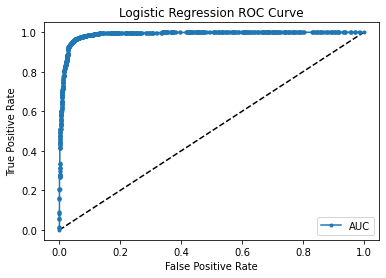

In [98]:
logmodel = LogisticRegression()
logmodel.fit(X_res, y_res)
y_predicted = logmodel.predict(X_res)
y_pred_probs = logmodel.predict_proba(X_res)

# keep probabilities for the positive outcome only
y_pred_probs = y_pred_probs[:, 1]

# Metrics Evaluation
Acc = logmodel.score(X_res, y_res)
Auc = roc_auc_score(y_res, y_pred_probs)
F1_score = metrics.f1_score(y_res, y_predicted)
Recall_score = recall_score(y_res, y_predicted)
Precision_score = precision_score(y_res, y_predicted)

print('*'*50)
print('AUC: %.3f' % Auc)
print('*'*50)
print('Accuracy: %.3f' % Acc)
print('*'*50)
print('F1 Score: %.3f' % F1_score)
print('*'*50)
print('Recall Score: %.3f' % Recall_score)
print('*'*50)
print('Precision Score: %.3f' % Precision_score)

#score['Logistic Regression'] = [test_auc, test_acc]

# Plot the roc curve for the model
fpr, tpr, thresholds = roc_curve(y_res, y_pred_probs)
plt.plot([0, 1], [0, 1], 'k--')
plt.plot(fpr, tpr, marker='.', label = 'AUC')
plt.legend()
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("Logistic Regression ROC Curve")
plt.show()

#### Hyper-parameter Tuning

In [64]:
param_grid = {'tol':[0.1, 0.01, 0.001, 0.0001, 0.0002, 0.0003], 'C':[1, 10], 
              'solver':('sag', 'saga', 'lbfgs', 'liblinear'), 'max_iter':[20, 40, 60, 80, 100], 
              'multi_class':['auto', 'ovr', 'multinomial']} 
model = LogisticRegression()
clf = GridSearchCV(model, param_grid, cv = 10, scoring = 'f1', verbose = 3, return_train_score = True)
clf.fit(X_res, y_res)
print('Best parameters:  {}'.format(clf.best_params_))
print('Best score: {}'.format(clf.best_score_))

Fitting 10 folds for each of 720 candidates, totalling 7200 fits
[CV 1/10] END C=1, max_iter=20, multi_class=auto, solver=sag, tol=0.1; total time=   0.0s
[CV 2/10] END C=1, max_iter=20, multi_class=auto, solver=sag, tol=0.1; total time=   0.0s
[CV 3/10] END C=1, max_iter=20, multi_class=auto, solver=sag, tol=0.1; total time=   0.0s
[CV 4/10] END C=1, max_iter=20, multi_class=auto, solver=sag, tol=0.1; total time=   0.0s
[CV 5/10] END C=1, max_iter=20, multi_class=auto, solver=sag, tol=0.1; total time=   0.0s
[CV 6/10] END C=1, max_iter=20, multi_class=auto, solver=sag, tol=0.1; total time=   0.0s
[CV 7/10] END C=1, max_iter=20, multi_class=auto, solver=sag, tol=0.1; total time=   0.0s
[CV 8/10] END C=1, max_iter=20, multi_class=auto, solver=sag, tol=0.1; total time=   0.0s
[CV 9/10] END C=1, max_iter=20, multi_class=auto, solver=sag, tol=0.1; total time=   0.0s
[CV 10/10] END C=1, max_iter=20, multi_class=auto, solver=sag, tol=0.1; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 1/10] END C=1, max_iter=20, multi_class=auto, solver=sag, tol=0.01; total time=   0.0s
[CV 2/10] END C=1, max_iter=20, multi_class=auto, solver=sag, tol=0.01; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 3/10] END C=1, max_iter=20, multi_class=auto, solver=sag, tol=0.01; total time=   0.0s
[CV 4/10] END C=1, max_iter=20, multi_class=auto, solver=sag, tol=0.01; total time=   0.1s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 5/10] END C=1, max_iter=20, multi_class=auto, solver=sag, tol=0.01; total time=   0.0s
[CV 6/10] END C=1, max_iter=20, multi_class=auto, solver=sag, tol=0.01; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 7/10] END C=1, max_iter=20, multi_class=auto, solver=sag, tol=0.01; total time=   0.0s
[CV 8/10] END C=1, max_iter=20, multi_class=auto, solver=sag, tol=0.01; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 9/10] END C=1, max_iter=20, multi_class=auto, solver=sag, tol=0.01; total time=   0.0s
[CV 10/10] END C=1, max_iter=20, multi_class=auto, solver=sag, tol=0.01; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 1/10] END C=1, max_iter=20, multi_class=auto, solver=sag, tol=0.001; total time=   0.0s
[CV 2/10] END C=1, max_iter=20, multi_class=auto, solver=sag, tol=0.001; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 3/10] END C=1, max_iter=20, multi_class=auto, solver=sag, tol=0.001; total time=   0.0s
[CV 4/10] END C=1, max_iter=20, multi_class=auto, solver=sag, tol=0.001; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 5/10] END C=1, max_iter=20, multi_class=auto, solver=sag, tol=0.001; total time=   0.0s
[CV 6/10] END C=1, max_iter=20, multi_class=auto, solver=sag, tol=0.001; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 7/10] END C=1, max_iter=20, multi_class=auto, solver=sag, tol=0.001; total time=   0.0s
[CV 8/10] END C=1, max_iter=20, multi_class=auto, solver=sag, tol=0.001; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 9/10] END C=1, max_iter=20, multi_class=auto, solver=sag, tol=0.001; total time=   0.0s
[CV 10/10] END C=1, max_iter=20, multi_class=auto, solver=sag, tol=0.001; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 1/10] END C=1, max_iter=20, multi_class=auto, solver=sag, tol=0.0001; total time=   0.0s
[CV 2/10] END C=1, max_iter=20, multi_class=auto, solver=sag, tol=0.0001; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 3/10] END C=1, max_iter=20, multi_class=auto, solver=sag, tol=0.0001; total time=   0.0s
[CV 4/10] END C=1, max_iter=20, multi_class=auto, solver=sag, tol=0.0001; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 5/10] END C=1, max_iter=20, multi_class=auto, solver=sag, tol=0.0001; total time=   0.0s
[CV 6/10] END C=1, max_iter=20, multi_class=auto, solver=sag, tol=0.0001; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 7/10] END C=1, max_iter=20, multi_class=auto, solver=sag, tol=0.0001; total time=   0.0s
[CV 8/10] END C=1, max_iter=20, multi_class=auto, solver=sag, tol=0.0001; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 9/10] END C=1, max_iter=20, multi_class=auto, solver=sag, tol=0.0001; total time=   0.0s
[CV 10/10] END C=1, max_iter=20, multi_class=auto, solver=sag, tol=0.0001; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 1/10] END C=1, max_iter=20, multi_class=auto, solver=sag, tol=0.0002; total time=   0.0s
[CV 2/10] END C=1, max_iter=20, multi_class=auto, solver=sag, tol=0.0002; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 3/10] END C=1, max_iter=20, multi_class=auto, solver=sag, tol=0.0002; total time=   0.0s
[CV 4/10] END C=1, max_iter=20, multi_class=auto, solver=sag, tol=0.0002; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 5/10] END C=1, max_iter=20, multi_class=auto, solver=sag, tol=0.0002; total time=   0.0s
[CV 6/10] END C=1, max_iter=20, multi_class=auto, solver=sag, tol=0.0002; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 7/10] END C=1, max_iter=20, multi_class=auto, solver=sag, tol=0.0002; total time=   0.0s
[CV 8/10] END C=1, max_iter=20, multi_class=auto, solver=sag, tol=0.0002; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 9/10] END C=1, max_iter=20, multi_class=auto, solver=sag, tol=0.0002; total time=   0.0s
[CV 10/10] END C=1, max_iter=20, multi_class=auto, solver=sag, tol=0.0002; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 1/10] END C=1, max_iter=20, multi_class=auto, solver=sag, tol=0.0003; total time=   0.0s
[CV 2/10] END C=1, max_iter=20, multi_class=auto, solver=sag, tol=0.0003; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 3/10] END C=1, max_iter=20, multi_class=auto, solver=sag, tol=0.0003; total time=   0.0s
[CV 4/10] END C=1, max_iter=20, multi_class=auto, solver=sag, tol=0.0003; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 5/10] END C=1, max_iter=20, multi_class=auto, solver=sag, tol=0.0003; total time=   0.0s
[CV 6/10] END C=1, max_iter=20, multi_class=auto, solver=sag, tol=0.0003; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 7/10] END C=1, max_iter=20, multi_class=auto, solver=sag, tol=0.0003; total time=   0.0s
[CV 8/10] END C=1, max_iter=20, multi_class=auto, solver=sag, tol=0.0003; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 9/10] END C=1, max_iter=20, multi_class=auto, solver=sag, tol=0.0003; total time=   0.0s
[CV 10/10] END C=1, max_iter=20, multi_class=auto, solver=sag, tol=0.0003; total time=   0.0s
[CV 1/10] END C=1, max_iter=20, multi_class=auto, solver=saga, tol=0.1; total time=   0.0s
[CV 2/10] END C=1, max_iter=20, multi_class=auto, solver=saga, tol=0.1; total time=   0.0s
[CV 3/10] END C=1, max_iter=20, multi_class=auto, solver=saga, tol=0.1; total time=   0.0s
[CV 4/10] END C=1, max_iter=20, multi_class=auto, solver=saga, tol=0.1; total time=   0.0s
[CV 5/10] END C=1, max_iter=20, multi_class=auto, solver=saga, tol=0.1; total time=   0.0s
[CV 6/10] END C=1, max_iter=20, multi_class=auto, solver=saga, tol=0.1; total time=   0.0s
[CV 7/10] END C=1, max_iter=20, multi_class=auto, solver=saga, tol=0.1; total time=   0.0s
[CV 8/10] END C=1, max_iter=20, multi_class=auto, solver=saga, tol=0.1; total time=   0.0s
[CV 9/10] END C=1, max_iter=20, multi_class=auto, solver=saga, tol=0.1; total time=  

C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 2/10] END C=1, max_iter=20, multi_class=auto, solver=saga, tol=0.01; total time=   0.0s
[CV 3/10] END C=1, max_iter=20, multi_class=auto, solver=saga, tol=0.01; total time=   0.1s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 4/10] END C=1, max_iter=20, multi_class=auto, solver=saga, tol=0.01; total time=   0.1s
[CV 5/10] END C=1, max_iter=20, multi_class=auto, solver=saga, tol=0.01; total time=   0.1s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 6/10] END C=1, max_iter=20, multi_class=auto, solver=saga, tol=0.01; total time=   0.1s
[CV 7/10] END C=1, max_iter=20, multi_class=auto, solver=saga, tol=0.01; total time=   0.1s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 8/10] END C=1, max_iter=20, multi_class=auto, solver=saga, tol=0.01; total time=   0.0s
[CV 9/10] END C=1, max_iter=20, multi_class=auto, solver=saga, tol=0.01; total time=   0.1s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 10/10] END C=1, max_iter=20, multi_class=auto, solver=saga, tol=0.01; total time=   0.1s
[CV 1/10] END C=1, max_iter=20, multi_class=auto, solver=saga, tol=0.001; total time=   0.1s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 2/10] END C=1, max_iter=20, multi_class=auto, solver=saga, tol=0.001; total time=   0.1s
[CV 3/10] END C=1, max_iter=20, multi_class=auto, solver=saga, tol=0.001; total time=   0.1s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 4/10] END C=1, max_iter=20, multi_class=auto, solver=saga, tol=0.001; total time=   0.1s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 5/10] END C=1, max_iter=20, multi_class=auto, solver=saga, tol=0.001; total time=   0.1s
[CV 6/10] END C=1, max_iter=20, multi_class=auto, solver=saga, tol=0.001; total time=   0.1s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 7/10] END C=1, max_iter=20, multi_class=auto, solver=saga, tol=0.001; total time=   0.1s
[CV 8/10] END C=1, max_iter=20, multi_class=auto, solver=saga, tol=0.001; total time=   0.1s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 9/10] END C=1, max_iter=20, multi_class=auto, solver=saga, tol=0.001; total time=   0.1s
[CV 10/10] END C=1, max_iter=20, multi_class=auto, solver=saga, tol=0.001; total time=   0.1s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 1/10] END C=1, max_iter=20, multi_class=auto, solver=saga, tol=0.0001; total time=   0.1s
[CV 2/10] END C=1, max_iter=20, multi_class=auto, solver=saga, tol=0.0001; total time=   0.1s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 3/10] END C=1, max_iter=20, multi_class=auto, solver=saga, tol=0.0001; total time=   0.1s
[CV 4/10] END C=1, max_iter=20, multi_class=auto, solver=saga, tol=0.0001; total time=   0.1s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 5/10] END C=1, max_iter=20, multi_class=auto, solver=saga, tol=0.0001; total time=   0.1s
[CV 6/10] END C=1, max_iter=20, multi_class=auto, solver=saga, tol=0.0001; total time=   0.1s
[CV 7/10] END C=1, max_iter=20, multi_class=auto, solver=saga, tol=0.0001; total time=   0.1s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 8/10] END C=1, max_iter=20, multi_class=auto, solver=saga, tol=0.0001; total time=   0.1s
[CV 9/10] END C=1, max_iter=20, multi_class=auto, solver=saga, tol=0.0001; total time=   0.1s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 10/10] END C=1, max_iter=20, multi_class=auto, solver=saga, tol=0.0001; total time=   0.1s
[CV 1/10] END C=1, max_iter=20, multi_class=auto, solver=saga, tol=0.0002; total time=   0.1s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 2/10] END C=1, max_iter=20, multi_class=auto, solver=saga, tol=0.0002; total time=   0.1s
[CV 3/10] END C=1, max_iter=20, multi_class=auto, solver=saga, tol=0.0002; total time=   0.1s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 4/10] END C=1, max_iter=20, multi_class=auto, solver=saga, tol=0.0002; total time=   0.1s
[CV 5/10] END C=1, max_iter=20, multi_class=auto, solver=saga, tol=0.0002; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 6/10] END C=1, max_iter=20, multi_class=auto, solver=saga, tol=0.0002; total time=   0.1s
[CV 7/10] END C=1, max_iter=20, multi_class=auto, solver=saga, tol=0.0002; total time=   0.1s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 8/10] END C=1, max_iter=20, multi_class=auto, solver=saga, tol=0.0002; total time=   0.0s
[CV 9/10] END C=1, max_iter=20, multi_class=auto, solver=saga, tol=0.0002; total time=   0.1s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 10/10] END C=1, max_iter=20, multi_class=auto, solver=saga, tol=0.0002; total time=   0.1s
[CV 1/10] END C=1, max_iter=20, multi_class=auto, solver=saga, tol=0.0003; total time=   0.1s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 2/10] END C=1, max_iter=20, multi_class=auto, solver=saga, tol=0.0003; total time=   0.1s
[CV 3/10] END C=1, max_iter=20, multi_class=auto, solver=saga, tol=0.0003; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 4/10] END C=1, max_iter=20, multi_class=auto, solver=saga, tol=0.0003; total time=   0.0s
[CV 5/10] END C=1, max_iter=20, multi_class=auto, solver=saga, tol=0.0003; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 6/10] END C=1, max_iter=20, multi_class=auto, solver=saga, tol=0.0003; total time=   0.0s
[CV 7/10] END C=1, max_iter=20, multi_class=auto, solver=saga, tol=0.0003; total time=   0.1s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 8/10] END C=1, max_iter=20, multi_class=auto, solver=saga, tol=0.0003; total time=   0.1s
[CV 9/10] END C=1, max_iter=20, multi_class=auto, solver=saga, tol=0.0003; total time=   0.1s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 10/10] END C=1, max_iter=20, multi_class=auto, solver=saga, tol=0.0003; total time=   0.1s
[CV 1/10] END C=1, max_iter=20, multi_class=auto, solver=lbfgs, tol=0.1; total time=   0.0s
[CV 2/10] END C=1, max_iter=20, multi_class=auto, solver=lbfgs, tol=0.1; total time=   0.0s
[CV 3/10] END C=1, max_iter=20, multi_class=auto, solver=lbfgs, tol=0.1; total time=   0.0s
[CV 4/10] END C=1, max_iter=20, multi_class=auto, solver=lbfgs, tol=0.1; total time=   0.0s
[CV 5/10] END C=1, max_iter=20, multi_class=auto, solver=lbfgs, tol=0.1; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 6/10] END C=1, max_iter=20, multi_class=auto, solver=lbfgs, tol=0.1; total time=   0.0s
[CV 7/10] END C=1, max_iter=20, multi_class=auto, solver=lbfgs, tol=0.1; total time=   0.0s
[CV 8/10] END C=1, max_iter=20, multi_class=auto, solver=lbfgs, tol=0.1; total time=   0.0s
[CV 9/10] END C=1, max_iter=20, multi_class=auto, solver=lbfgs, tol=0.1; total time=   0.0s
[CV 10/10] END C=1, max_iter=20, multi_class=auto, solver=lbfgs, tol=0.1; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 1/10] END C=1, max_iter=20, multi_class=auto, solver=lbfgs, tol=0.01; total time=   0.0s
[CV 2/10] END C=1, max_iter=20, multi_class=auto, solver=lbfgs, tol=0.01; total time=   0.0s
[CV 3/10] END C=1, max_iter=20, multi_class=auto, solver=lbfgs, tol=0.01; total time=   0.0s
[CV 4/10] END C=1, max_iter=20, multi_class=auto, solver=lbfgs, tol=0.01; total time=   0.0s
[CV 5/10] END C=1, max_iter=20, multi_class=auto, solver=lbfgs, tol=0.01; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 6/10] END C=1, max_iter=20, multi_class=auto, solver=lbfgs, tol=0.01; total time=   0.0s
[CV 7/10] END C=1, max_iter=20, multi_class=auto, solver=lbfgs, tol=0.01; total time=   0.0s
[CV 8/10] END C=1, max_iter=20, multi_class=auto, solver=lbfgs, tol=0.01; total time=   0.0s
[CV 9/10] END C=1, max_iter=20, multi_class=auto, solver=lbfgs, tol=0.01; total time=   0.0s
[CV 10/10] END C=1, max_iter=20, multi_class=auto, solver=lbfgs, tol=0.01; total time=   0.0s
[CV 1/10] END C=1, max_iter=20, multi_class=auto, solver=lbfgs, tol=0.001; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 2/10] END C=1, max_iter=20, multi_class=auto, solver=lbfgs, tol=0.001; total time=   0.0s
[CV 3/10] END C=1, max_iter=20, multi_class=auto, solver=lbfgs, tol=0.001; total time=   0.0s
[CV 4/10] END C=1, max_iter=20, multi_class=auto, solver=lbfgs, tol=0.001; total time=   0.0s
[CV 5/10] END C=1, max_iter=20, multi_class=auto, solver=lbfgs, tol=0.001; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 6/10] END C=1, max_iter=20, multi_class=auto, solver=lbfgs, tol=0.001; total time=   0.0s
[CV 7/10] END C=1, max_iter=20, multi_class=auto, solver=lbfgs, tol=0.001; total time=   0.0s
[CV 8/10] END C=1, max_iter=20, multi_class=auto, solver=lbfgs, tol=0.001; total time=   0.0s
[CV 9/10] END C=1, max_iter=20, multi_class=auto, solver=lbfgs, tol=0.001; total time=   0.0s
[CV 10/10] END C=1, max_iter=20, multi_class=auto, solver=lbfgs, tol=0.001; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 1/10] END C=1, max_iter=20, multi_class=auto, solver=lbfgs, tol=0.0001; total time=   0.0s
[CV 2/10] END C=1, max_iter=20, multi_class=auto, solver=lbfgs, tol=0.0001; total time=   0.0s
[CV 3/10] END C=1, max_iter=20, multi_class=auto, solver=lbfgs, tol=0.0001; total time=   0.0s
[CV 4/10] END C=1, max_iter=20, multi_class=auto, solver=lbfgs, tol=0.0001; total time=   0.0s
[CV 5/10] END C=1, max_iter=20, multi_class=auto, solver=lbfgs, tol=0.0001; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 6/10] END C=1, max_iter=20, multi_class=auto, solver=lbfgs, tol=0.0001; total time=   0.0s
[CV 7/10] END C=1, max_iter=20, multi_class=auto, solver=lbfgs, tol=0.0001; total time=   0.0s
[CV 8/10] END C=1, max_iter=20, multi_class=auto, solver=lbfgs, tol=0.0001; total time=   0.0s
[CV 9/10] END C=1, max_iter=20, multi_class=auto, solver=lbfgs, tol=0.0001; total time=   0.0s
[CV 10/10] END C=1, max_iter=20, multi_class=auto, solver=lbfgs, tol=0.0001; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 1/10] END C=1, max_iter=20, multi_class=auto, solver=lbfgs, tol=0.0002; total time=   0.0s
[CV 2/10] END C=1, max_iter=20, multi_class=auto, solver=lbfgs, tol=0.0002; total time=   0.0s
[CV 3/10] END C=1, max_iter=20, multi_class=auto, solver=lbfgs, tol=0.0002; total time=   0.0s
[CV 4/10] END C=1, max_iter=20, multi_class=auto, solver=lbfgs, tol=0.0002; total time=   0.0s
[CV 5/10] END C=1, max_iter=20, multi_class=auto, solver=lbfgs, tol=0.0002; total time=   0.0s
[CV 6/10] END C=1, max_iter=20, multi_class=auto, solver=lbfgs, tol=0.0002; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 7/10] END C=1, max_iter=20, multi_class=auto, solver=lbfgs, tol=0.0002; total time=   0.0s
[CV 8/10] END C=1, max_iter=20, multi_class=auto, solver=lbfgs, tol=0.0002; total time=   0.0s
[CV 9/10] END C=1, max_iter=20, multi_class=auto, solver=lbfgs, tol=0.0002; total time=   0.0s
[CV 10/10] END C=1, max_iter=20, multi_class=auto, solver=lbfgs, tol=0.0002; total time=   0.0s
[CV 1/10] END C=1, max_iter=20, multi_class=auto, solver=lbfgs, tol=0.0003; total time=   0.0s
[CV 2/10] END C=1, max_iter=20, multi_class=auto, solver=lbfgs, tol=0.0003; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 3/10] END C=1, max_iter=20, multi_class=auto, solver=lbfgs, tol=0.0003; total time=   0.0s
[CV 4/10] END C=1, max_iter=20, multi_class=auto, solver=lbfgs, tol=0.0003; total time=   0.0s
[CV 5/10] END C=1, max_iter=20, multi_class=auto, solver=lbfgs, tol=0.0003; total time=   0.0s
[CV 6/10] END C=1, max_iter=20, multi_class=auto, solver=lbfgs, tol=0.0003; total time=   0.0s
[CV 7/10] END C=1, max_iter=20, multi_class=auto, solver=lbfgs, tol=0.0003; total time=   0.0s
[CV 8/10] END C=1, max_iter=20, multi_class=auto, solver=lbfgs, tol=0.0003; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 9/10] END C=1, max_iter=20, multi_class=auto, solver=lbfgs, tol=0.0003; total time=   0.0s
[CV 10/10] END C=1, max_iter=20, multi_class=auto, solver=lbfgs, tol=0.0003; total time=   0.0s
[CV 1/10] END C=1, max_iter=20, multi_class=auto, solver=liblinear, tol=0.1; total time=   0.0s
[CV 2/10] END C=1, max_iter=20, multi_class=auto, solver=liblinear, tol=0.1; total time=   0.0s
[CV 3/10] END C=1, max_iter=20, multi_class=auto, solver=liblinear, tol=0.1; total time=   0.0s
[CV 4/10] END C=1, max_iter=20, multi_class=auto, solver=liblinear, tol=0.1; total time=   0.0s
[CV 5/10] END C=1, max_iter=20, multi_class=auto, solver=liblinear, tol=0.1; total time=   0.0s
[CV 6/10] END C=1, max_iter=20, multi_class=auto, solver=liblinear, tol=0.1; total time=   0.0s
[CV 7/10] END C=1, max_iter=20, multi_class=auto, solver=liblinear, tol=0.1; total time=   0.0s
[CV 8/10] END C=1, max_iter=20, multi_class=auto, solver=liblinear, tol=0.1; total time=   0.0s
[CV 9/10] END C=1, max_iter=20, multi_cla

C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.


[CV 2/10] END C=1, max_iter=20, multi_class=auto, solver=liblinear, tol=0.001; total time=   0.0s
[CV 3/10] END C=1, max_iter=20, multi_class=auto, solver=liblinear, tol=0.001; total time=   0.0s
[CV 4/10] END C=1, max_iter=20, multi_class=auto, solver=liblinear, tol=0.001; total time=   0.0s
[CV 5/10] END C=1, max_iter=20, multi_class=auto, solver=liblinear, tol=0.001; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.


[CV 6/10] END C=1, max_iter=20, multi_class=auto, solver=liblinear, tol=0.001; total time=   0.0s
[CV 7/10] END C=1, max_iter=20, multi_class=auto, solver=liblinear, tol=0.001; total time=   0.0s
[CV 8/10] END C=1, max_iter=20, multi_class=auto, solver=liblinear, tol=0.001; total time=   0.0s
[CV 9/10] END C=1, max_iter=20, multi_class=auto, solver=liblinear, tol=0.001; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.


[CV 10/10] END C=1, max_iter=20, multi_class=auto, solver=liblinear, tol=0.001; total time=   0.0s
[CV 1/10] END C=1, max_iter=20, multi_class=auto, solver=liblinear, tol=0.0001; total time=   0.1s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.


[CV 2/10] END C=1, max_iter=20, multi_class=auto, solver=liblinear, tol=0.0001; total time=   0.0s
[CV 3/10] END C=1, max_iter=20, multi_class=auto, solver=liblinear, tol=0.0001; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.


[CV 4/10] END C=1, max_iter=20, multi_class=auto, solver=liblinear, tol=0.0001; total time=   0.0s
[CV 5/10] END C=1, max_iter=20, multi_class=auto, solver=liblinear, tol=0.0001; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.


[CV 6/10] END C=1, max_iter=20, multi_class=auto, solver=liblinear, tol=0.0001; total time=   0.0s
[CV 7/10] END C=1, max_iter=20, multi_class=auto, solver=liblinear, tol=0.0001; total time=   0.1s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.


[CV 8/10] END C=1, max_iter=20, multi_class=auto, solver=liblinear, tol=0.0001; total time=   0.1s
[CV 9/10] END C=1, max_iter=20, multi_class=auto, solver=liblinear, tol=0.0001; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.


[CV 10/10] END C=1, max_iter=20, multi_class=auto, solver=liblinear, tol=0.0001; total time=   0.1s
[CV 1/10] END C=1, max_iter=20, multi_class=auto, solver=liblinear, tol=0.0002; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.


[CV 2/10] END C=1, max_iter=20, multi_class=auto, solver=liblinear, tol=0.0002; total time=   0.0s
[CV 3/10] END C=1, max_iter=20, multi_class=auto, solver=liblinear, tol=0.0002; total time=   0.0s
[CV 4/10] END C=1, max_iter=20, multi_class=auto, solver=liblinear, tol=0.0002; total time=   0.0s
[CV 5/10] END C=1, max_iter=20, multi_class=auto, solver=liblinear, tol=0.0002; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.


[CV 6/10] END C=1, max_iter=20, multi_class=auto, solver=liblinear, tol=0.0002; total time=   0.0s
[CV 7/10] END C=1, max_iter=20, multi_class=auto, solver=liblinear, tol=0.0002; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.


[CV 8/10] END C=1, max_iter=20, multi_class=auto, solver=liblinear, tol=0.0002; total time=   0.1s
[CV 9/10] END C=1, max_iter=20, multi_class=auto, solver=liblinear, tol=0.0002; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.


[CV 10/10] END C=1, max_iter=20, multi_class=auto, solver=liblinear, tol=0.0002; total time=   0.0s
[CV 1/10] END C=1, max_iter=20, multi_class=auto, solver=liblinear, tol=0.0003; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.


[CV 2/10] END C=1, max_iter=20, multi_class=auto, solver=liblinear, tol=0.0003; total time=   0.0s
[CV 3/10] END C=1, max_iter=20, multi_class=auto, solver=liblinear, tol=0.0003; total time=   0.0s
[CV 4/10] END C=1, max_iter=20, multi_class=auto, solver=liblinear, tol=0.0003; total time=   0.0s
[CV 5/10] END C=1, max_iter=20, multi_class=auto, solver=liblinear, tol=0.0003; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.


[CV 6/10] END C=1, max_iter=20, multi_class=auto, solver=liblinear, tol=0.0003; total time=   0.0s
[CV 7/10] END C=1, max_iter=20, multi_class=auto, solver=liblinear, tol=0.0003; total time=   0.0s
[CV 8/10] END C=1, max_iter=20, multi_class=auto, solver=liblinear, tol=0.0003; total time=   0.0s
[CV 9/10] END C=1, max_iter=20, multi_class=auto, solver=liblinear, tol=0.0003; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.


[CV 10/10] END C=1, max_iter=20, multi_class=auto, solver=liblinear, tol=0.0003; total time=   0.1s
[CV 1/10] END C=1, max_iter=20, multi_class=ovr, solver=sag, tol=0.1; total time=   0.0s
[CV 2/10] END C=1, max_iter=20, multi_class=ovr, solver=sag, tol=0.1; total time=   0.0s
[CV 3/10] END C=1, max_iter=20, multi_class=ovr, solver=sag, tol=0.1; total time=   0.0s
[CV 4/10] END C=1, max_iter=20, multi_class=ovr, solver=sag, tol=0.1; total time=   0.0s
[CV 5/10] END C=1, max_iter=20, multi_class=ovr, solver=sag, tol=0.1; total time=   0.0s
[CV 6/10] END C=1, max_iter=20, multi_class=ovr, solver=sag, tol=0.1; total time=   0.0s
[CV 7/10] END C=1, max_iter=20, multi_class=ovr, solver=sag, tol=0.1; total time=   0.0s
[CV 8/10] END C=1, max_iter=20, multi_class=ovr, solver=sag, tol=0.1; total time=   0.0s
[CV 9/10] END C=1, max_iter=20, multi_class=ovr, solver=sag, tol=0.1; total time=   0.0s
[CV 10/10] END C=1, max_iter=20, multi_class=ovr, solver=sag, tol=0.1; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 1/10] END C=1, max_iter=20, multi_class=ovr, solver=sag, tol=0.01; total time=   0.0s
[CV 2/10] END C=1, max_iter=20, multi_class=ovr, solver=sag, tol=0.01; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 3/10] END C=1, max_iter=20, multi_class=ovr, solver=sag, tol=0.01; total time=   0.0s
[CV 4/10] END C=1, max_iter=20, multi_class=ovr, solver=sag, tol=0.01; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 5/10] END C=1, max_iter=20, multi_class=ovr, solver=sag, tol=0.01; total time=   0.0s
[CV 6/10] END C=1, max_iter=20, multi_class=ovr, solver=sag, tol=0.01; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 7/10] END C=1, max_iter=20, multi_class=ovr, solver=sag, tol=0.01; total time=   0.0s
[CV 8/10] END C=1, max_iter=20, multi_class=ovr, solver=sag, tol=0.01; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 9/10] END C=1, max_iter=20, multi_class=ovr, solver=sag, tol=0.01; total time=   0.0s
[CV 10/10] END C=1, max_iter=20, multi_class=ovr, solver=sag, tol=0.01; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 1/10] END C=1, max_iter=20, multi_class=ovr, solver=sag, tol=0.001; total time=   0.0s
[CV 2/10] END C=1, max_iter=20, multi_class=ovr, solver=sag, tol=0.001; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 3/10] END C=1, max_iter=20, multi_class=ovr, solver=sag, tol=0.001; total time=   0.0s
[CV 4/10] END C=1, max_iter=20, multi_class=ovr, solver=sag, tol=0.001; total time=   0.1s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 5/10] END C=1, max_iter=20, multi_class=ovr, solver=sag, tol=0.001; total time=   0.1s
[CV 6/10] END C=1, max_iter=20, multi_class=ovr, solver=sag, tol=0.001; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 7/10] END C=1, max_iter=20, multi_class=ovr, solver=sag, tol=0.001; total time=   0.1s
[CV 8/10] END C=1, max_iter=20, multi_class=ovr, solver=sag, tol=0.001; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 9/10] END C=1, max_iter=20, multi_class=ovr, solver=sag, tol=0.001; total time=   0.0s
[CV 10/10] END C=1, max_iter=20, multi_class=ovr, solver=sag, tol=0.001; total time=   0.1s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 1/10] END C=1, max_iter=20, multi_class=ovr, solver=sag, tol=0.0001; total time=   0.0s
[CV 2/10] END C=1, max_iter=20, multi_class=ovr, solver=sag, tol=0.0001; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 3/10] END C=1, max_iter=20, multi_class=ovr, solver=sag, tol=0.0001; total time=   0.0s
[CV 4/10] END C=1, max_iter=20, multi_class=ovr, solver=sag, tol=0.0001; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 5/10] END C=1, max_iter=20, multi_class=ovr, solver=sag, tol=0.0001; total time=   0.0s
[CV 6/10] END C=1, max_iter=20, multi_class=ovr, solver=sag, tol=0.0001; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 7/10] END C=1, max_iter=20, multi_class=ovr, solver=sag, tol=0.0001; total time=   0.0s
[CV 8/10] END C=1, max_iter=20, multi_class=ovr, solver=sag, tol=0.0001; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 9/10] END C=1, max_iter=20, multi_class=ovr, solver=sag, tol=0.0001; total time=   0.0s
[CV 10/10] END C=1, max_iter=20, multi_class=ovr, solver=sag, tol=0.0001; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 1/10] END C=1, max_iter=20, multi_class=ovr, solver=sag, tol=0.0002; total time=   0.0s
[CV 2/10] END C=1, max_iter=20, multi_class=ovr, solver=sag, tol=0.0002; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 3/10] END C=1, max_iter=20, multi_class=ovr, solver=sag, tol=0.0002; total time=   0.0s
[CV 4/10] END C=1, max_iter=20, multi_class=ovr, solver=sag, tol=0.0002; total time=   0.1s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 5/10] END C=1, max_iter=20, multi_class=ovr, solver=sag, tol=0.0002; total time=   0.0s
[CV 6/10] END C=1, max_iter=20, multi_class=ovr, solver=sag, tol=0.0002; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 7/10] END C=1, max_iter=20, multi_class=ovr, solver=sag, tol=0.0002; total time=   0.0s
[CV 8/10] END C=1, max_iter=20, multi_class=ovr, solver=sag, tol=0.0002; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 9/10] END C=1, max_iter=20, multi_class=ovr, solver=sag, tol=0.0002; total time=   0.0s
[CV 10/10] END C=1, max_iter=20, multi_class=ovr, solver=sag, tol=0.0002; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 1/10] END C=1, max_iter=20, multi_class=ovr, solver=sag, tol=0.0003; total time=   0.0s
[CV 2/10] END C=1, max_iter=20, multi_class=ovr, solver=sag, tol=0.0003; total time=   0.1s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 3/10] END C=1, max_iter=20, multi_class=ovr, solver=sag, tol=0.0003; total time=   0.0s
[CV 4/10] END C=1, max_iter=20, multi_class=ovr, solver=sag, tol=0.0003; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 5/10] END C=1, max_iter=20, multi_class=ovr, solver=sag, tol=0.0003; total time=   0.0s
[CV 6/10] END C=1, max_iter=20, multi_class=ovr, solver=sag, tol=0.0003; total time=   0.1s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 7/10] END C=1, max_iter=20, multi_class=ovr, solver=sag, tol=0.0003; total time=   0.0s
[CV 8/10] END C=1, max_iter=20, multi_class=ovr, solver=sag, tol=0.0003; total time=   0.1s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 9/10] END C=1, max_iter=20, multi_class=ovr, solver=sag, tol=0.0003; total time=   0.1s
[CV 10/10] END C=1, max_iter=20, multi_class=ovr, solver=sag, tol=0.0003; total time=   0.0s
[CV 1/10] END C=1, max_iter=20, multi_class=ovr, solver=saga, tol=0.1; total time=   0.0s
[CV 2/10] END C=1, max_iter=20, multi_class=ovr, solver=saga, tol=0.1; total time=   0.0s
[CV 3/10] END C=1, max_iter=20, multi_class=ovr, solver=saga, tol=0.1; total time=   0.0s
[CV 4/10] END C=1, max_iter=20, multi_class=ovr, solver=saga, tol=0.1; total time=   0.0s
[CV 5/10] END C=1, max_iter=20, multi_class=ovr, solver=saga, tol=0.1; total time=   0.0s
[CV 6/10] END C=1, max_iter=20, multi_class=ovr, solver=saga, tol=0.1; total time=   0.0s
[CV 7/10] END C=1, max_iter=20, multi_class=ovr, solver=saga, tol=0.1; total time=   0.0s
[CV 8/10] END C=1, max_iter=20, multi_class=ovr, solver=saga, tol=0.1; total time=   0.0s
[CV 9/10] END C=1, max_iter=20, multi_class=ovr, solver=saga, tol=0.1; total time=   0.0s
[CV 1

C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 1/10] END C=1, max_iter=20, multi_class=ovr, solver=saga, tol=0.01; total time=   0.1s
[CV 2/10] END C=1, max_iter=20, multi_class=ovr, solver=saga, tol=0.01; total time=   0.1s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 3/10] END C=1, max_iter=20, multi_class=ovr, solver=saga, tol=0.01; total time=   0.1s
[CV 4/10] END C=1, max_iter=20, multi_class=ovr, solver=saga, tol=0.01; total time=   0.1s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 5/10] END C=1, max_iter=20, multi_class=ovr, solver=saga, tol=0.01; total time=   0.1s
[CV 6/10] END C=1, max_iter=20, multi_class=ovr, solver=saga, tol=0.01; total time=   0.1s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 7/10] END C=1, max_iter=20, multi_class=ovr, solver=saga, tol=0.01; total time=   0.1s
[CV 8/10] END C=1, max_iter=20, multi_class=ovr, solver=saga, tol=0.01; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 9/10] END C=1, max_iter=20, multi_class=ovr, solver=saga, tol=0.01; total time=   0.0s
[CV 10/10] END C=1, max_iter=20, multi_class=ovr, solver=saga, tol=0.01; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 1/10] END C=1, max_iter=20, multi_class=ovr, solver=saga, tol=0.001; total time=   0.1s
[CV 2/10] END C=1, max_iter=20, multi_class=ovr, solver=saga, tol=0.001; total time=   0.1s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 3/10] END C=1, max_iter=20, multi_class=ovr, solver=saga, tol=0.001; total time=   0.1s
[CV 4/10] END C=1, max_iter=20, multi_class=ovr, solver=saga, tol=0.001; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 5/10] END C=1, max_iter=20, multi_class=ovr, solver=saga, tol=0.001; total time=   0.0s
[CV 6/10] END C=1, max_iter=20, multi_class=ovr, solver=saga, tol=0.001; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 7/10] END C=1, max_iter=20, multi_class=ovr, solver=saga, tol=0.001; total time=   0.1s
[CV 8/10] END C=1, max_iter=20, multi_class=ovr, solver=saga, tol=0.001; total time=   0.1s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 9/10] END C=1, max_iter=20, multi_class=ovr, solver=saga, tol=0.001; total time=   0.1s
[CV 10/10] END C=1, max_iter=20, multi_class=ovr, solver=saga, tol=0.001; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 1/10] END C=1, max_iter=20, multi_class=ovr, solver=saga, tol=0.0001; total time=   0.1s
[CV 2/10] END C=1, max_iter=20, multi_class=ovr, solver=saga, tol=0.0001; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 3/10] END C=1, max_iter=20, multi_class=ovr, solver=saga, tol=0.0001; total time=   0.0s
[CV 4/10] END C=1, max_iter=20, multi_class=ovr, solver=saga, tol=0.0001; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 5/10] END C=1, max_iter=20, multi_class=ovr, solver=saga, tol=0.0001; total time=   0.0s
[CV 6/10] END C=1, max_iter=20, multi_class=ovr, solver=saga, tol=0.0001; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 7/10] END C=1, max_iter=20, multi_class=ovr, solver=saga, tol=0.0001; total time=   0.1s
[CV 8/10] END C=1, max_iter=20, multi_class=ovr, solver=saga, tol=0.0001; total time=   0.1s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 9/10] END C=1, max_iter=20, multi_class=ovr, solver=saga, tol=0.0001; total time=   0.1s
[CV 10/10] END C=1, max_iter=20, multi_class=ovr, solver=saga, tol=0.0001; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 1/10] END C=1, max_iter=20, multi_class=ovr, solver=saga, tol=0.0002; total time=   0.1s
[CV 2/10] END C=1, max_iter=20, multi_class=ovr, solver=saga, tol=0.0002; total time=   0.1s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 3/10] END C=1, max_iter=20, multi_class=ovr, solver=saga, tol=0.0002; total time=   0.0s
[CV 4/10] END C=1, max_iter=20, multi_class=ovr, solver=saga, tol=0.0002; total time=   0.1s
[CV 5/10] END C=1, max_iter=20, multi_class=ovr, solver=saga, tol=0.0002; total time=   0.1s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 6/10] END C=1, max_iter=20, multi_class=ovr, solver=saga, tol=0.0002; total time=   0.0s
[CV 7/10] END C=1, max_iter=20, multi_class=ovr, solver=saga, tol=0.0002; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 8/10] END C=1, max_iter=20, multi_class=ovr, solver=saga, tol=0.0002; total time=   0.1s
[CV 9/10] END C=1, max_iter=20, multi_class=ovr, solver=saga, tol=0.0002; total time=   0.1s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 10/10] END C=1, max_iter=20, multi_class=ovr, solver=saga, tol=0.0002; total time=   0.1s
[CV 1/10] END C=1, max_iter=20, multi_class=ovr, solver=saga, tol=0.0003; total time=   0.1s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 2/10] END C=1, max_iter=20, multi_class=ovr, solver=saga, tol=0.0003; total time=   0.1s
[CV 3/10] END C=1, max_iter=20, multi_class=ovr, solver=saga, tol=0.0003; total time=   0.1s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 4/10] END C=1, max_iter=20, multi_class=ovr, solver=saga, tol=0.0003; total time=   0.1s
[CV 5/10] END C=1, max_iter=20, multi_class=ovr, solver=saga, tol=0.0003; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 6/10] END C=1, max_iter=20, multi_class=ovr, solver=saga, tol=0.0003; total time=   0.1s
[CV 7/10] END C=1, max_iter=20, multi_class=ovr, solver=saga, tol=0.0003; total time=   0.1s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 8/10] END C=1, max_iter=20, multi_class=ovr, solver=saga, tol=0.0003; total time=   0.1s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 9/10] END C=1, max_iter=20, multi_class=ovr, solver=saga, tol=0.0003; total time=   0.1s
[CV 10/10] END C=1, max_iter=20, multi_class=ovr, solver=saga, tol=0.0003; total time=   0.1s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 1/10] END C=1, max_iter=20, multi_class=ovr, solver=lbfgs, tol=0.1; total time=   0.0s
[CV 2/10] END C=1, max_iter=20, multi_class=ovr, solver=lbfgs, tol=0.1; total time=   0.0s
[CV 3/10] END C=1, max_iter=20, multi_class=ovr, solver=lbfgs, tol=0.1; total time=   0.0s
[CV 4/10] END C=1, max_iter=20, multi_class=ovr, solver=lbfgs, tol=0.1; total time=   0.0s
[CV 5/10] END C=1, max_iter=20, multi_class=ovr, solver=lbfgs, tol=0.1; total time=   0.0s
[CV 6/10] END C=1, max_iter=20, multi_class=ovr, solver=lbfgs, tol=0.1; total time=   0.0s
[CV 7/10] END C=1, max_iter=20, multi_class=ovr, solver=lbfgs, tol=0.1; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 8/10] END C=1, max_iter=20, multi_class=ovr, solver=lbfgs, tol=0.1; total time=   0.0s
[CV 9/10] END C=1, max_iter=20, multi_class=ovr, solver=lbfgs, tol=0.1; total time=   0.0s
[CV 10/10] END C=1, max_iter=20, multi_class=ovr, solver=lbfgs, tol=0.1; total time=   0.0s
[CV 1/10] END C=1, max_iter=20, multi_class=ovr, solver=lbfgs, tol=0.01; total time=   0.0s
[CV 2/10] END C=1, max_iter=20, multi_class=ovr, solver=lbfgs, tol=0.01; total time=   0.0s
[CV 3/10] END C=1, max_iter=20, multi_class=ovr, solver=lbfgs, tol=0.01; total time=   0.0s
[CV 4/10] END C=1, max_iter=20, multi_class=ovr, solver=lbfgs, tol=0.01; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 5/10] END C=1, max_iter=20, multi_class=ovr, solver=lbfgs, tol=0.01; total time=   0.0s
[CV 6/10] END C=1, max_iter=20, multi_class=ovr, solver=lbfgs, tol=0.01; total time=   0.0s
[CV 7/10] END C=1, max_iter=20, multi_class=ovr, solver=lbfgs, tol=0.01; total time=   0.0s
[CV 8/10] END C=1, max_iter=20, multi_class=ovr, solver=lbfgs, tol=0.01; total time=   0.0s
[CV 9/10] END C=1, max_iter=20, multi_class=ovr, solver=lbfgs, tol=0.01; total time=   0.0s
[CV 10/10] END C=1, max_iter=20, multi_class=ovr, solver=lbfgs, tol=0.01; total time=   0.0s
[CV 1/10] END C=1, max_iter=20, multi_class=ovr, solver=lbfgs, tol=0.001; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 2/10] END C=1, max_iter=20, multi_class=ovr, solver=lbfgs, tol=0.001; total time=   0.0s
[CV 3/10] END C=1, max_iter=20, multi_class=ovr, solver=lbfgs, tol=0.001; total time=   0.0s
[CV 4/10] END C=1, max_iter=20, multi_class=ovr, solver=lbfgs, tol=0.001; total time=   0.0s
[CV 5/10] END C=1, max_iter=20, multi_class=ovr, solver=lbfgs, tol=0.001; total time=   0.0s
[CV 6/10] END C=1, max_iter=20, multi_class=ovr, solver=lbfgs, tol=0.001; total time=   0.0s
[CV 7/10] END C=1, max_iter=20, multi_class=ovr, solver=lbfgs, tol=0.001; total time=   0.0s
[CV 8/10] END C=1, max_iter=20, multi_class=ovr, solver=lbfgs, tol=0.001; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 9/10] END C=1, max_iter=20, multi_class=ovr, solver=lbfgs, tol=0.001; total time=   0.0s
[CV 10/10] END C=1, max_iter=20, multi_class=ovr, solver=lbfgs, tol=0.001; total time=   0.0s
[CV 1/10] END C=1, max_iter=20, multi_class=ovr, solver=lbfgs, tol=0.0001; total time=   0.0s
[CV 2/10] END C=1, max_iter=20, multi_class=ovr, solver=lbfgs, tol=0.0001; total time=   0.0s
[CV 3/10] END C=1, max_iter=20, multi_class=ovr, solver=lbfgs, tol=0.0001; total time=   0.0s
[CV 4/10] END C=1, max_iter=20, multi_class=ovr, solver=lbfgs, tol=0.0001; total time=   0.0s
[CV 5/10] END C=1, max_iter=20, multi_class=ovr, solver=lbfgs, tol=0.0001; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 6/10] END C=1, max_iter=20, multi_class=ovr, solver=lbfgs, tol=0.0001; total time=   0.0s
[CV 7/10] END C=1, max_iter=20, multi_class=ovr, solver=lbfgs, tol=0.0001; total time=   0.0s
[CV 8/10] END C=1, max_iter=20, multi_class=ovr, solver=lbfgs, tol=0.0001; total time=   0.0s
[CV 9/10] END C=1, max_iter=20, multi_class=ovr, solver=lbfgs, tol=0.0001; total time=   0.0s
[CV 10/10] END C=1, max_iter=20, multi_class=ovr, solver=lbfgs, tol=0.0001; total time=   0.0s
[CV 1/10] END C=1, max_iter=20, multi_class=ovr, solver=lbfgs, tol=0.0002; total time=   0.0s
[CV 2/10] END C=1, max_iter=20, multi_class=ovr, solver=lbfgs, tol=0.0002; total time=   0.0s
[CV 3/10] END C=1, max_iter=20, multi_class=ovr, solver=lbfgs, tol=0.0002; total time=   0.0s
[CV 4/10] END C=1, max_iter=20, multi_class=ovr, solver=lbfgs, tol=0.0002; total time=   0.0s
[CV 5/10] END C=1, max_iter=20, multi_class=ovr, solver=lbfgs, tol=0.0002; total time=   0.0s
[CV 6/10] END C=1, max_iter=20, multi_class=ovr, solver=lbf

C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 8/10] END C=1, max_iter=20, multi_class=ovr, solver=lbfgs, tol=0.0002; total time=   0.0s
[CV 9/10] END C=1, max_iter=20, multi_class=ovr, solver=lbfgs, tol=0.0002; total time=   0.0s
[CV 10/10] END C=1, max_iter=20, multi_class=ovr, solver=lbfgs, tol=0.0002; total time=   0.0s
[CV 1/10] END C=1, max_iter=20, multi_class=ovr, solver=lbfgs, tol=0.0003; total time=   0.0s
[CV 2/10] END C=1, max_iter=20, multi_class=ovr, solver=lbfgs, tol=0.0003; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 3/10] END C=1, max_iter=20, multi_class=ovr, solver=lbfgs, tol=0.0003; total time=   0.0s
[CV 4/10] END C=1, max_iter=20, multi_class=ovr, solver=lbfgs, tol=0.0003; total time=   0.0s
[CV 5/10] END C=1, max_iter=20, multi_class=ovr, solver=lbfgs, tol=0.0003; total time=   0.0s
[CV 6/10] END C=1, max_iter=20, multi_class=ovr, solver=lbfgs, tol=0.0003; total time=   0.0s
[CV 7/10] END C=1, max_iter=20, multi_class=ovr, solver=lbfgs, tol=0.0003; total time=   0.0s
[CV 8/10] END C=1, max_iter=20, multi_class=ovr, solver=lbfgs, tol=0.0003; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 9/10] END C=1, max_iter=20, multi_class=ovr, solver=lbfgs, tol=0.0003; total time=   0.0s
[CV 10/10] END C=1, max_iter=20, multi_class=ovr, solver=lbfgs, tol=0.0003; total time=   0.0s
[CV 1/10] END C=1, max_iter=20, multi_class=ovr, solver=liblinear, tol=0.1; total time=   0.0s
[CV 2/10] END C=1, max_iter=20, multi_class=ovr, solver=liblinear, tol=0.1; total time=   0.0s
[CV 3/10] END C=1, max_iter=20, multi_class=ovr, solver=liblinear, tol=0.1; total time=   0.0s
[CV 4/10] END C=1, max_iter=20, multi_class=ovr, solver=liblinear, tol=0.1; total time=   0.0s
[CV 5/10] END C=1, max_iter=20, multi_class=ovr, solver=liblinear, tol=0.1; total time=   0.0s
[CV 6/10] END C=1, max_iter=20, multi_class=ovr, solver=liblinear, tol=0.1; total time=   0.0s
[CV 7/10] END C=1, max_iter=20, multi_class=ovr, solver=liblinear, tol=0.1; total time=   0.0s
[CV 8/10] END C=1, max_iter=20, multi_class=ovr, solver=liblinear, tol=0.1; total time=   0.0s
[CV 9/10] END C=1, max_iter=20, multi_class=ovr, so

C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.


[CV 2/10] END C=1, max_iter=20, multi_class=ovr, solver=liblinear, tol=0.001; total time=   0.0s
[CV 3/10] END C=1, max_iter=20, multi_class=ovr, solver=liblinear, tol=0.001; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.


[CV 4/10] END C=1, max_iter=20, multi_class=ovr, solver=liblinear, tol=0.001; total time=   0.0s
[CV 5/10] END C=1, max_iter=20, multi_class=ovr, solver=liblinear, tol=0.001; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.


[CV 6/10] END C=1, max_iter=20, multi_class=ovr, solver=liblinear, tol=0.001; total time=   0.0s
[CV 7/10] END C=1, max_iter=20, multi_class=ovr, solver=liblinear, tol=0.001; total time=   0.0s
[CV 8/10] END C=1, max_iter=20, multi_class=ovr, solver=liblinear, tol=0.001; total time=   0.1s
[CV 9/10] END C=1, max_iter=20, multi_class=ovr, solver=liblinear, tol=0.001; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.


[CV 10/10] END C=1, max_iter=20, multi_class=ovr, solver=liblinear, tol=0.001; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.


[CV 1/10] END C=1, max_iter=20, multi_class=ovr, solver=liblinear, tol=0.0001; total time=   0.1s
[CV 2/10] END C=1, max_iter=20, multi_class=ovr, solver=liblinear, tol=0.0001; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.


[CV 3/10] END C=1, max_iter=20, multi_class=ovr, solver=liblinear, tol=0.0001; total time=   0.0s
[CV 4/10] END C=1, max_iter=20, multi_class=ovr, solver=liblinear, tol=0.0001; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.


[CV 5/10] END C=1, max_iter=20, multi_class=ovr, solver=liblinear, tol=0.0001; total time=   0.0s
[CV 6/10] END C=1, max_iter=20, multi_class=ovr, solver=liblinear, tol=0.0001; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.


[CV 7/10] END C=1, max_iter=20, multi_class=ovr, solver=liblinear, tol=0.0001; total time=   0.1s
[CV 8/10] END C=1, max_iter=20, multi_class=ovr, solver=liblinear, tol=0.0001; total time=   0.1s
[CV 9/10] END C=1, max_iter=20, multi_class=ovr, solver=liblinear, tol=0.0001; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.


[CV 10/10] END C=1, max_iter=20, multi_class=ovr, solver=liblinear, tol=0.0001; total time=   0.1s
[CV 1/10] END C=1, max_iter=20, multi_class=ovr, solver=liblinear, tol=0.0002; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.


[CV 2/10] END C=1, max_iter=20, multi_class=ovr, solver=liblinear, tol=0.0002; total time=   0.0s
[CV 3/10] END C=1, max_iter=20, multi_class=ovr, solver=liblinear, tol=0.0002; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.


[CV 4/10] END C=1, max_iter=20, multi_class=ovr, solver=liblinear, tol=0.0002; total time=   0.0s
[CV 5/10] END C=1, max_iter=20, multi_class=ovr, solver=liblinear, tol=0.0002; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.


[CV 6/10] END C=1, max_iter=20, multi_class=ovr, solver=liblinear, tol=0.0002; total time=   0.0s
[CV 7/10] END C=1, max_iter=20, multi_class=ovr, solver=liblinear, tol=0.0002; total time=   0.1s
[CV 8/10] END C=1, max_iter=20, multi_class=ovr, solver=liblinear, tol=0.0002; total time=   0.1s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.


[CV 9/10] END C=1, max_iter=20, multi_class=ovr, solver=liblinear, tol=0.0002; total time=   0.0s
[CV 10/10] END C=1, max_iter=20, multi_class=ovr, solver=liblinear, tol=0.0002; total time=   0.1s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.


[CV 1/10] END C=1, max_iter=20, multi_class=ovr, solver=liblinear, tol=0.0003; total time=   0.1s
[CV 2/10] END C=1, max_iter=20, multi_class=ovr, solver=liblinear, tol=0.0003; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.


[CV 3/10] END C=1, max_iter=20, multi_class=ovr, solver=liblinear, tol=0.0003; total time=   0.0s
[CV 4/10] END C=1, max_iter=20, multi_class=ovr, solver=liblinear, tol=0.0003; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.


[CV 5/10] END C=1, max_iter=20, multi_class=ovr, solver=liblinear, tol=0.0003; total time=   0.0s
[CV 6/10] END C=1, max_iter=20, multi_class=ovr, solver=liblinear, tol=0.0003; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.


[CV 7/10] END C=1, max_iter=20, multi_class=ovr, solver=liblinear, tol=0.0003; total time=   0.1s
[CV 8/10] END C=1, max_iter=20, multi_class=ovr, solver=liblinear, tol=0.0003; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.


[CV 9/10] END C=1, max_iter=20, multi_class=ovr, solver=liblinear, tol=0.0003; total time=   0.0s
[CV 10/10] END C=1, max_iter=20, multi_class=ovr, solver=liblinear, tol=0.0003; total time=   0.1s
[CV 1/10] END C=1, max_iter=20, multi_class=multinomial, solver=sag, tol=0.1; total time=   0.0s
[CV 2/10] END C=1, max_iter=20, multi_class=multinomial, solver=sag, tol=0.1; total time=   0.0s
[CV 3/10] END C=1, max_iter=20, multi_class=multinomial, solver=sag, tol=0.1; total time=   0.0s
[CV 4/10] END C=1, max_iter=20, multi_class=multinomial, solver=sag, tol=0.1; total time=   0.0s
[CV 5/10] END C=1, max_iter=20, multi_class=multinomial, solver=sag, tol=0.1; total time=   0.0s
[CV 6/10] END C=1, max_iter=20, multi_class=multinomial, solver=sag, tol=0.1; total time=   0.0s
[CV 7/10] END C=1, max_iter=20, multi_class=multinomial, solver=sag, tol=0.1; total time=   0.0s
[CV 8/10] END C=1, max_iter=20, multi_class=multinomial, solver=sag, tol=0.1; total time=   0.0s
[CV 9/10] END C=1, max_iter

C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 1/10] END C=1, max_iter=20, multi_class=multinomial, solver=sag, tol=0.01; total time=   0.1s
[CV 2/10] END C=1, max_iter=20, multi_class=multinomial, solver=sag, tol=0.01; total time=   0.1s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 3/10] END C=1, max_iter=20, multi_class=multinomial, solver=sag, tol=0.01; total time=   0.1s
[CV 4/10] END C=1, max_iter=20, multi_class=multinomial, solver=sag, tol=0.01; total time=   0.1s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 5/10] END C=1, max_iter=20, multi_class=multinomial, solver=sag, tol=0.01; total time=   0.1s
[CV 6/10] END C=1, max_iter=20, multi_class=multinomial, solver=sag, tol=0.01; total time=   0.1s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 7/10] END C=1, max_iter=20, multi_class=multinomial, solver=sag, tol=0.01; total time=   0.1s
[CV 8/10] END C=1, max_iter=20, multi_class=multinomial, solver=sag, tol=0.01; total time=   0.1s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 9/10] END C=1, max_iter=20, multi_class=multinomial, solver=sag, tol=0.01; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 10/10] END C=1, max_iter=20, multi_class=multinomial, solver=sag, tol=0.01; total time=   0.1s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 1/10] END C=1, max_iter=20, multi_class=multinomial, solver=sag, tol=0.001; total time=   0.1s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 2/10] END C=1, max_iter=20, multi_class=multinomial, solver=sag, tol=0.001; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 3/10] END C=1, max_iter=20, multi_class=multinomial, solver=sag, tol=0.001; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 4/10] END C=1, max_iter=20, multi_class=multinomial, solver=sag, tol=0.001; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 5/10] END C=1, max_iter=20, multi_class=multinomial, solver=sag, tol=0.001; total time=   0.1s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 6/10] END C=1, max_iter=20, multi_class=multinomial, solver=sag, tol=0.001; total time=   0.1s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 7/10] END C=1, max_iter=20, multi_class=multinomial, solver=sag, tol=0.001; total time=   0.1s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 8/10] END C=1, max_iter=20, multi_class=multinomial, solver=sag, tol=0.001; total time=   0.1s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 9/10] END C=1, max_iter=20, multi_class=multinomial, solver=sag, tol=0.001; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 10/10] END C=1, max_iter=20, multi_class=multinomial, solver=sag, tol=0.001; total time=   0.1s
[CV 1/10] END C=1, max_iter=20, multi_class=multinomial, solver=sag, tol=0.0001; total time=   0.1s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 2/10] END C=1, max_iter=20, multi_class=multinomial, solver=sag, tol=0.0001; total time=   0.1s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 3/10] END C=1, max_iter=20, multi_class=multinomial, solver=sag, tol=0.0001; total time=   0.1s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 4/10] END C=1, max_iter=20, multi_class=multinomial, solver=sag, tol=0.0001; total time=   0.1s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 5/10] END C=1, max_iter=20, multi_class=multinomial, solver=sag, tol=0.0001; total time=   0.1s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 6/10] END C=1, max_iter=20, multi_class=multinomial, solver=sag, tol=0.0001; total time=   0.1s
[CV 7/10] END C=1, max_iter=20, multi_class=multinomial, solver=sag, tol=0.0001; total time=   0.1s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 8/10] END C=1, max_iter=20, multi_class=multinomial, solver=sag, tol=0.0001; total time=   0.1s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 9/10] END C=1, max_iter=20, multi_class=multinomial, solver=sag, tol=0.0001; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 10/10] END C=1, max_iter=20, multi_class=multinomial, solver=sag, tol=0.0001; total time=   0.1s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 1/10] END C=1, max_iter=20, multi_class=multinomial, solver=sag, tol=0.0002; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 2/10] END C=1, max_iter=20, multi_class=multinomial, solver=sag, tol=0.0002; total time=   0.3s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 3/10] END C=1, max_iter=20, multi_class=multinomial, solver=sag, tol=0.0002; total time=   0.3s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 4/10] END C=1, max_iter=20, multi_class=multinomial, solver=sag, tol=0.0002; total time=   0.3s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 5/10] END C=1, max_iter=20, multi_class=multinomial, solver=sag, tol=0.0002; total time=   0.3s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 6/10] END C=1, max_iter=20, multi_class=multinomial, solver=sag, tol=0.0002; total time=   0.5s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 7/10] END C=1, max_iter=20, multi_class=multinomial, solver=sag, tol=0.0002; total time=   0.3s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 8/10] END C=1, max_iter=20, multi_class=multinomial, solver=sag, tol=0.0002; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 9/10] END C=1, max_iter=20, multi_class=multinomial, solver=sag, tol=0.0002; total time=   0.3s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 10/10] END C=1, max_iter=20, multi_class=multinomial, solver=sag, tol=0.0002; total time=   0.3s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 1/10] END C=1, max_iter=20, multi_class=multinomial, solver=sag, tol=0.0003; total time=   0.3s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 2/10] END C=1, max_iter=20, multi_class=multinomial, solver=sag, tol=0.0003; total time=   0.3s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 3/10] END C=1, max_iter=20, multi_class=multinomial, solver=sag, tol=0.0003; total time=   0.3s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 4/10] END C=1, max_iter=20, multi_class=multinomial, solver=sag, tol=0.0003; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 5/10] END C=1, max_iter=20, multi_class=multinomial, solver=sag, tol=0.0003; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 6/10] END C=1, max_iter=20, multi_class=multinomial, solver=sag, tol=0.0003; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 7/10] END C=1, max_iter=20, multi_class=multinomial, solver=sag, tol=0.0003; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 8/10] END C=1, max_iter=20, multi_class=multinomial, solver=sag, tol=0.0003; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 9/10] END C=1, max_iter=20, multi_class=multinomial, solver=sag, tol=0.0003; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 10/10] END C=1, max_iter=20, multi_class=multinomial, solver=sag, tol=0.0003; total time=   0.2s
[CV 1/10] END C=1, max_iter=20, multi_class=multinomial, solver=saga, tol=0.1; total time=   0.0s
[CV 2/10] END C=1, max_iter=20, multi_class=multinomial, solver=saga, tol=0.1; total time=   0.1s
[CV 3/10] END C=1, max_iter=20, multi_class=multinomial, solver=saga, tol=0.1; total time=   0.0s
[CV 4/10] END C=1, max_iter=20, multi_class=multinomial, solver=saga, tol=0.1; total time=   0.0s
[CV 5/10] END C=1, max_iter=20, multi_class=multinomial, solver=saga, tol=0.1; total time=   0.1s
[CV 6/10] END C=1, max_iter=20, multi_class=multinomial, solver=saga, tol=0.1; total time=   0.1s
[CV 7/10] END C=1, max_iter=20, multi_class=multinomial, solver=saga, tol=0.1; total time=   0.0s
[CV 8/10] END C=1, max_iter=20, multi_class=multinomial, solver=saga, tol=0.1; total time=   0.0s
[CV 9/10] END C=1, max_iter=20, multi_class=multinomial, solver=saga, tol=0.1; total time=   0.0s
[CV 10/10] END C=

C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 1/10] END C=1, max_iter=20, multi_class=multinomial, solver=saga, tol=0.01; total time=   0.3s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 2/10] END C=1, max_iter=20, multi_class=multinomial, solver=saga, tol=0.01; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 3/10] END C=1, max_iter=20, multi_class=multinomial, solver=saga, tol=0.01; total time=   0.3s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 4/10] END C=1, max_iter=20, multi_class=multinomial, solver=saga, tol=0.01; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 5/10] END C=1, max_iter=20, multi_class=multinomial, solver=saga, tol=0.01; total time=   0.3s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 6/10] END C=1, max_iter=20, multi_class=multinomial, solver=saga, tol=0.01; total time=   0.3s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 7/10] END C=1, max_iter=20, multi_class=multinomial, solver=saga, tol=0.01; total time=   0.3s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 8/10] END C=1, max_iter=20, multi_class=multinomial, solver=saga, tol=0.01; total time=   0.3s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 9/10] END C=1, max_iter=20, multi_class=multinomial, solver=saga, tol=0.01; total time=   0.4s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 10/10] END C=1, max_iter=20, multi_class=multinomial, solver=saga, tol=0.01; total time=   0.3s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 1/10] END C=1, max_iter=20, multi_class=multinomial, solver=saga, tol=0.001; total time=   0.3s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 2/10] END C=1, max_iter=20, multi_class=multinomial, solver=saga, tol=0.001; total time=   0.5s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 3/10] END C=1, max_iter=20, multi_class=multinomial, solver=saga, tol=0.001; total time=   0.5s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 4/10] END C=1, max_iter=20, multi_class=multinomial, solver=saga, tol=0.001; total time=   0.3s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 5/10] END C=1, max_iter=20, multi_class=multinomial, solver=saga, tol=0.001; total time=   0.3s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 6/10] END C=1, max_iter=20, multi_class=multinomial, solver=saga, tol=0.001; total time=   0.5s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 7/10] END C=1, max_iter=20, multi_class=multinomial, solver=saga, tol=0.001; total time=   0.3s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 8/10] END C=1, max_iter=20, multi_class=multinomial, solver=saga, tol=0.001; total time=   0.3s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 9/10] END C=1, max_iter=20, multi_class=multinomial, solver=saga, tol=0.001; total time=   0.4s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 10/10] END C=1, max_iter=20, multi_class=multinomial, solver=saga, tol=0.001; total time=   0.3s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 1/10] END C=1, max_iter=20, multi_class=multinomial, solver=saga, tol=0.0001; total time=   0.4s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 2/10] END C=1, max_iter=20, multi_class=multinomial, solver=saga, tol=0.0001; total time=   0.4s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 3/10] END C=1, max_iter=20, multi_class=multinomial, solver=saga, tol=0.0001; total time=   0.3s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 4/10] END C=1, max_iter=20, multi_class=multinomial, solver=saga, tol=0.0001; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 5/10] END C=1, max_iter=20, multi_class=multinomial, solver=saga, tol=0.0001; total time=   0.3s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 6/10] END C=1, max_iter=20, multi_class=multinomial, solver=saga, tol=0.0001; total time=   0.3s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 7/10] END C=1, max_iter=20, multi_class=multinomial, solver=saga, tol=0.0001; total time=   0.3s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 8/10] END C=1, max_iter=20, multi_class=multinomial, solver=saga, tol=0.0001; total time=   0.3s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 9/10] END C=1, max_iter=20, multi_class=multinomial, solver=saga, tol=0.0001; total time=   0.3s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 10/10] END C=1, max_iter=20, multi_class=multinomial, solver=saga, tol=0.0001; total time=   0.3s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 1/10] END C=1, max_iter=20, multi_class=multinomial, solver=saga, tol=0.0002; total time=   0.3s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 2/10] END C=1, max_iter=20, multi_class=multinomial, solver=saga, tol=0.0002; total time=   0.3s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 3/10] END C=1, max_iter=20, multi_class=multinomial, solver=saga, tol=0.0002; total time=   0.3s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 4/10] END C=1, max_iter=20, multi_class=multinomial, solver=saga, tol=0.0002; total time=   0.3s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 5/10] END C=1, max_iter=20, multi_class=multinomial, solver=saga, tol=0.0002; total time=   0.3s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 6/10] END C=1, max_iter=20, multi_class=multinomial, solver=saga, tol=0.0002; total time=   0.3s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 7/10] END C=1, max_iter=20, multi_class=multinomial, solver=saga, tol=0.0002; total time=   0.3s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 8/10] END C=1, max_iter=20, multi_class=multinomial, solver=saga, tol=0.0002; total time=   0.3s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 9/10] END C=1, max_iter=20, multi_class=multinomial, solver=saga, tol=0.0002; total time=   0.3s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 10/10] END C=1, max_iter=20, multi_class=multinomial, solver=saga, tol=0.0002; total time=   0.3s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 1/10] END C=1, max_iter=20, multi_class=multinomial, solver=saga, tol=0.0003; total time=   0.3s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 2/10] END C=1, max_iter=20, multi_class=multinomial, solver=saga, tol=0.0003; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 3/10] END C=1, max_iter=20, multi_class=multinomial, solver=saga, tol=0.0003; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 4/10] END C=1, max_iter=20, multi_class=multinomial, solver=saga, tol=0.0003; total time=   0.1s
[CV 5/10] END C=1, max_iter=20, multi_class=multinomial, solver=saga, tol=0.0003; total time=   0.1s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 6/10] END C=1, max_iter=20, multi_class=multinomial, solver=saga, tol=0.0003; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 7/10] END C=1, max_iter=20, multi_class=multinomial, solver=saga, tol=0.0003; total time=   0.3s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 8/10] END C=1, max_iter=20, multi_class=multinomial, solver=saga, tol=0.0003; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 9/10] END C=1, max_iter=20, multi_class=multinomial, solver=saga, tol=0.0003; total time=   0.3s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState


[CV 10/10] END C=1, max_iter=20, multi_class=multinomial, solver=saga, tol=0.0003; total time=   0.2s
[CV 1/10] END C=1, max_iter=20, multi_class=multinomial, solver=lbfgs, tol=0.1; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 2/10] END C=1, max_iter=20, multi_class=multinomial, solver=lbfgs, tol=0.1; total time=   0.0s
[CV 3/10] END C=1, max_iter=20, multi_class=multinomial, solver=lbfgs, tol=0.1; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 4/10] END C=1, max_iter=20, multi_class=multinomial, solver=lbfgs, tol=0.1; total time=   0.0s
[CV 5/10] END C=1, max_iter=20, multi_class=multinomial, solver=lbfgs, tol=0.1; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 6/10] END C=1, max_iter=20, multi_class=multinomial, solver=lbfgs, tol=0.1; total time=   0.0s
[CV 7/10] END C=1, max_iter=20, multi_class=multinomial, solver=lbfgs, tol=0.1; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 8/10] END C=1, max_iter=20, multi_class=multinomial, solver=lbfgs, tol=0.1; total time=   0.0s
[CV 9/10] END C=1, max_iter=20, multi_class=multinomial, solver=lbfgs, tol=0.1; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 10/10] END C=1, max_iter=20, multi_class=multinomial, solver=lbfgs, tol=0.1; total time=   0.0s
[CV 1/10] END C=1, max_iter=20, multi_class=multinomial, solver=lbfgs, tol=0.01; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 2/10] END C=1, max_iter=20, multi_class=multinomial, solver=lbfgs, tol=0.01; total time=   0.0s
[CV 3/10] END C=1, max_iter=20, multi_class=multinomial, solver=lbfgs, tol=0.01; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 4/10] END C=1, max_iter=20, multi_class=multinomial, solver=lbfgs, tol=0.01; total time=   0.0s
[CV 5/10] END C=1, max_iter=20, multi_class=multinomial, solver=lbfgs, tol=0.01; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 6/10] END C=1, max_iter=20, multi_class=multinomial, solver=lbfgs, tol=0.01; total time=   0.0s
[CV 7/10] END C=1, max_iter=20, multi_class=multinomial, solver=lbfgs, tol=0.01; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 8/10] END C=1, max_iter=20, multi_class=multinomial, solver=lbfgs, tol=0.01; total time=   0.0s
[CV 9/10] END C=1, max_iter=20, multi_class=multinomial, solver=lbfgs, tol=0.01; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 10/10] END C=1, max_iter=20, multi_class=multinomial, solver=lbfgs, tol=0.01; total time=   0.0s
[CV 1/10] END C=1, max_iter=20, multi_class=multinomial, solver=lbfgs, tol=0.001; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 2/10] END C=1, max_iter=20, multi_class=multinomial, solver=lbfgs, tol=0.001; total time=   0.0s
[CV 3/10] END C=1, max_iter=20, multi_class=multinomial, solver=lbfgs, tol=0.001; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 4/10] END C=1, max_iter=20, multi_class=multinomial, solver=lbfgs, tol=0.001; total time=   0.0s
[CV 5/10] END C=1, max_iter=20, multi_class=multinomial, solver=lbfgs, tol=0.001; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 6/10] END C=1, max_iter=20, multi_class=multinomial, solver=lbfgs, tol=0.001; total time=   0.0s
[CV 7/10] END C=1, max_iter=20, multi_class=multinomial, solver=lbfgs, tol=0.001; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 8/10] END C=1, max_iter=20, multi_class=multinomial, solver=lbfgs, tol=0.001; total time=   0.0s
[CV 9/10] END C=1, max_iter=20, multi_class=multinomial, solver=lbfgs, tol=0.001; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 10/10] END C=1, max_iter=20, multi_class=multinomial, solver=lbfgs, tol=0.001; total time=   0.0s
[CV 1/10] END C=1, max_iter=20, multi_class=multinomial, solver=lbfgs, tol=0.0001; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 2/10] END C=1, max_iter=20, multi_class=multinomial, solver=lbfgs, tol=0.0001; total time=   0.0s
[CV 3/10] END C=1, max_iter=20, multi_class=multinomial, solver=lbfgs, tol=0.0001; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 4/10] END C=1, max_iter=20, multi_class=multinomial, solver=lbfgs, tol=0.0001; total time=   0.0s
[CV 5/10] END C=1, max_iter=20, multi_class=multinomial, solver=lbfgs, tol=0.0001; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 6/10] END C=1, max_iter=20, multi_class=multinomial, solver=lbfgs, tol=0.0001; total time=   0.0s
[CV 7/10] END C=1, max_iter=20, multi_class=multinomial, solver=lbfgs, tol=0.0001; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 8/10] END C=1, max_iter=20, multi_class=multinomial, solver=lbfgs, tol=0.0001; total time=   0.0s
[CV 9/10] END C=1, max_iter=20, multi_class=multinomial, solver=lbfgs, tol=0.0001; total time=   0.1s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 10/10] END C=1, max_iter=20, multi_class=multinomial, solver=lbfgs, tol=0.0001; total time=   0.0s
[CV 1/10] END C=1, max_iter=20, multi_class=multinomial, solver=lbfgs, tol=0.0002; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 2/10] END C=1, max_iter=20, multi_class=multinomial, solver=lbfgs, tol=0.0002; total time=   0.0s
[CV 3/10] END C=1, max_iter=20, multi_class=multinomial, solver=lbfgs, tol=0.0002; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 4/10] END C=1, max_iter=20, multi_class=multinomial, solver=lbfgs, tol=0.0002; total time=   0.0s
[CV 5/10] END C=1, max_iter=20, multi_class=multinomial, solver=lbfgs, tol=0.0002; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 6/10] END C=1, max_iter=20, multi_class=multinomial, solver=lbfgs, tol=0.0002; total time=   0.1s
[CV 7/10] END C=1, max_iter=20, multi_class=multinomial, solver=lbfgs, tol=0.0002; total time=   0.1s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState


[CV 8/10] END C=1, max_iter=20, multi_class=multinomial, solver=lbfgs, tol=0.0002; total time=   0.1s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 9/10] END C=1, max_iter=20, multi_class=multinomial, solver=lbfgs, tol=0.0002; total time=   0.1s
[CV 10/10] END C=1, max_iter=20, multi_class=multinomial, solver=lbfgs, tol=0.0002; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 1/10] END C=1, max_iter=20, multi_class=multinomial, solver=lbfgs, tol=0.0003; total time=   0.1s
[CV 2/10] END C=1, max_iter=20, multi_class=multinomial, solver=lbfgs, tol=0.0003; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 3/10] END C=1, max_iter=20, multi_class=multinomial, solver=lbfgs, tol=0.0003; total time=   0.0s
[CV 4/10] END C=1, max_iter=20, multi_class=multinomial, solver=lbfgs, tol=0.0003; total time=   0.1s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState


[CV 5/10] END C=1, max_iter=20, multi_class=multinomial, solver=lbfgs, tol=0.0003; total time=   0.1s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 6/10] END C=1, max_iter=20, multi_class=multinomial, solver=lbfgs, tol=0.0003; total time=   0.2s
[CV 7/10] END C=1, max_iter=20, multi_class=multinomial, solver=lbfgs, tol=0.0003; total time=   0.1s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState


[CV 8/10] END C=1, max_iter=20, multi_class=multinomial, solver=lbfgs, tol=0.0003; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 9/10] END C=1, max_iter=20, multi_class=multinomial, solver=lbfgs, tol=0.0003; total time=   0.1s
[CV 10/10] END C=1, max_iter=20, multi_class=multinomial, solver=lbfgs, tol=0.0003; total time=   0.1s
[CV 1/10] END C=1, max_iter=20, multi_class=multinomial, solver=liblinear, tol=0.1; total time=   0.0s
[CV 2/10] END C=1, max_iter=20, multi_class=multinomial, solver=liblinear, tol=0.1; total time=   0.0s
[CV 3/10] END C=1, max_iter=20, multi_class=multinomial, solver=liblinear, tol=0.1; total time=   0.0s
[CV 4/10] END C=1, max_iter=20, multi_class=multinomial, solver=liblinear, tol=0.1; total time=   0.0s
[CV 5/10] END C=1, max_iter=20, multi_class=multinomial, solver=liblinear, tol=0.1; total time=   0.0s
[CV 6/10] END C=1, max_iter=20, multi_class=multinomial, solver=liblinear, tol=0.1; total time=   0.0s
[CV 7/10] END C=1, max_iter=20, multi_class=multinomial, solver=liblinear, tol=0.1; total time=   0.0s
[CV 8/10] END C=1, max_iter=20, multi_class=multinomial, solver=liblinear,

C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 593, in _fit_and_score
    error_msg = ("scoring must return a number, got %s (%s) "
  File "C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py", line 1350, in fit
    ----------
  File "C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py", line 473, in _check_multi_class
    if multi_class == 'multinomial' and solver == 'liblinear':
ValueError: Solver liblinear does not support a multinomial backend.

  raise ValueError(error_msg % (scores, type(scores), scorer))
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:610: FitFailedWarning: Estimator fit failed. The 

[CV 4/10] END C=1, max_iter=20, multi_class=multinomial, solver=liblinear, tol=0.001; total time=   0.0s
[CV 5/10] END C=1, max_iter=20, multi_class=multinomial, solver=liblinear, tol=0.001; total time=   0.0s
[CV 6/10] END C=1, max_iter=20, multi_class=multinomial, solver=liblinear, tol=0.001; total time=   0.0s
[CV 7/10] END C=1, max_iter=20, multi_class=multinomial, solver=liblinear, tol=0.001; total time=   0.0s
[CV 8/10] END C=1, max_iter=20, multi_class=multinomial, solver=liblinear, tol=0.001; total time=   0.0s
[CV 9/10] END C=1, max_iter=20, multi_class=multinomial, solver=liblinear, tol=0.001; total time=   0.0s
[CV 10/10] END C=1, max_iter=20, multi_class=multinomial, solver=liblinear, tol=0.001; total time=   0.0s
[CV 1/10] END C=1, max_iter=20, multi_class=multinomial, solver=liblinear, tol=0.0001; total time=   0.0s
[CV 2/10] END C=1, max_iter=20, multi_class=multinomial, solver=liblinear, tol=0.0001; total time=   0.0s
[CV 3/10] END C=1, max_iter=20, multi_class=multinom

C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 593, in _fit_and_score
    error_msg = ("scoring must return a number, got %s (%s) "
  File "C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py", line 1350, in fit
    ----------
  File "C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py", line 473, in _check_multi_class
    if multi_class == 'multinomial' and solver == 'liblinear':
ValueError: Solver liblinear does not support a multinomial backend.

  raise ValueError(error_msg % (scores, type(scores), scorer))
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:610: FitFailedWarning: Estimator fit failed. The 

[CV 6/10] END C=1, max_iter=20, multi_class=multinomial, solver=liblinear, tol=0.0002; total time=   0.0s
[CV 7/10] END C=1, max_iter=20, multi_class=multinomial, solver=liblinear, tol=0.0002; total time=   0.0s
[CV 8/10] END C=1, max_iter=20, multi_class=multinomial, solver=liblinear, tol=0.0002; total time=   0.0s
[CV 9/10] END C=1, max_iter=20, multi_class=multinomial, solver=liblinear, tol=0.0002; total time=   0.0s
[CV 10/10] END C=1, max_iter=20, multi_class=multinomial, solver=liblinear, tol=0.0002; total time=   0.0s
[CV 1/10] END C=1, max_iter=20, multi_class=multinomial, solver=liblinear, tol=0.0003; total time=   0.0s
[CV 2/10] END C=1, max_iter=20, multi_class=multinomial, solver=liblinear, tol=0.0003; total time=   0.0s
[CV 3/10] END C=1, max_iter=20, multi_class=multinomial, solver=liblinear, tol=0.0003; total time=   0.0s
[CV 4/10] END C=1, max_iter=20, multi_class=multinomial, solver=liblinear, tol=0.0003; total time=   0.0s
[CV 5/10] END C=1, max_iter=20, multi_class=m

C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 593, in _fit_and_score
    error_msg = ("scoring must return a number, got %s (%s) "
  File "C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py", line 1350, in fit
    ----------
  File "C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py", line 473, in _check_multi_class
    if multi_class == 'multinomial' and solver == 'liblinear':
ValueError: Solver liblinear does not support a multinomial backend.

  raise ValueError(error_msg % (scores, type(scores), scorer))
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:610: FitFailedWarning: Estimator fit failed. The 

[CV 1/10] END C=1, max_iter=40, multi_class=auto, solver=sag, tol=0.1; total time=   0.0s
[CV 2/10] END C=1, max_iter=40, multi_class=auto, solver=sag, tol=0.1; total time=   0.0s
[CV 3/10] END C=1, max_iter=40, multi_class=auto, solver=sag, tol=0.1; total time=   0.0s
[CV 4/10] END C=1, max_iter=40, multi_class=auto, solver=sag, tol=0.1; total time=   0.0s
[CV 5/10] END C=1, max_iter=40, multi_class=auto, solver=sag, tol=0.1; total time=   0.0s
[CV 6/10] END C=1, max_iter=40, multi_class=auto, solver=sag, tol=0.1; total time=   0.0s
[CV 7/10] END C=1, max_iter=40, multi_class=auto, solver=sag, tol=0.1; total time=   0.0s
[CV 8/10] END C=1, max_iter=40, multi_class=auto, solver=sag, tol=0.1; total time=   0.0s
[CV 9/10] END C=1, max_iter=40, multi_class=auto, solver=sag, tol=0.1; total time=   0.0s
[CV 10/10] END C=1, max_iter=40, multi_class=auto, solver=sag, tol=0.1; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 1/10] END C=1, max_iter=40, multi_class=auto, solver=sag, tol=0.01; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 2/10] END C=1, max_iter=40, multi_class=auto, solver=sag, tol=0.01; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 3/10] END C=1, max_iter=40, multi_class=auto, solver=sag, tol=0.01; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 4/10] END C=1, max_iter=40, multi_class=auto, solver=sag, tol=0.01; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 5/10] END C=1, max_iter=40, multi_class=auto, solver=sag, tol=0.01; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 6/10] END C=1, max_iter=40, multi_class=auto, solver=sag, tol=0.01; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 7/10] END C=1, max_iter=40, multi_class=auto, solver=sag, tol=0.01; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 8/10] END C=1, max_iter=40, multi_class=auto, solver=sag, tol=0.01; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 9/10] END C=1, max_iter=40, multi_class=auto, solver=sag, tol=0.01; total time=   0.1s
[CV 10/10] END C=1, max_iter=40, multi_class=auto, solver=sag, tol=0.01; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 1/10] END C=1, max_iter=40, multi_class=auto, solver=sag, tol=0.001; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 2/10] END C=1, max_iter=40, multi_class=auto, solver=sag, tol=0.001; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 3/10] END C=1, max_iter=40, multi_class=auto, solver=sag, tol=0.001; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 4/10] END C=1, max_iter=40, multi_class=auto, solver=sag, tol=0.001; total time=   0.3s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 5/10] END C=1, max_iter=40, multi_class=auto, solver=sag, tol=0.001; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 6/10] END C=1, max_iter=40, multi_class=auto, solver=sag, tol=0.001; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 7/10] END C=1, max_iter=40, multi_class=auto, solver=sag, tol=0.001; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 8/10] END C=1, max_iter=40, multi_class=auto, solver=sag, tol=0.001; total time=   0.3s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 9/10] END C=1, max_iter=40, multi_class=auto, solver=sag, tol=0.001; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 10/10] END C=1, max_iter=40, multi_class=auto, solver=sag, tol=0.001; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 1/10] END C=1, max_iter=40, multi_class=auto, solver=sag, tol=0.0001; total time=   0.3s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 2/10] END C=1, max_iter=40, multi_class=auto, solver=sag, tol=0.0001; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 3/10] END C=1, max_iter=40, multi_class=auto, solver=sag, tol=0.0001; total time=   0.3s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 4/10] END C=1, max_iter=40, multi_class=auto, solver=sag, tol=0.0001; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 5/10] END C=1, max_iter=40, multi_class=auto, solver=sag, tol=0.0001; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 6/10] END C=1, max_iter=40, multi_class=auto, solver=sag, tol=0.0001; total time=   0.1s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 7/10] END C=1, max_iter=40, multi_class=auto, solver=sag, tol=0.0001; total time=   0.1s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 8/10] END C=1, max_iter=40, multi_class=auto, solver=sag, tol=0.0001; total time=   0.1s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 9/10] END C=1, max_iter=40, multi_class=auto, solver=sag, tol=0.0001; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 10/10] END C=1, max_iter=40, multi_class=auto, solver=sag, tol=0.0001; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 1/10] END C=1, max_iter=40, multi_class=auto, solver=sag, tol=0.0002; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 2/10] END C=1, max_iter=40, multi_class=auto, solver=sag, tol=0.0002; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 3/10] END C=1, max_iter=40, multi_class=auto, solver=sag, tol=0.0002; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 4/10] END C=1, max_iter=40, multi_class=auto, solver=sag, tol=0.0002; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 5/10] END C=1, max_iter=40, multi_class=auto, solver=sag, tol=0.0002; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 6/10] END C=1, max_iter=40, multi_class=auto, solver=sag, tol=0.0002; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 7/10] END C=1, max_iter=40, multi_class=auto, solver=sag, tol=0.0002; total time=   0.1s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 8/10] END C=1, max_iter=40, multi_class=auto, solver=sag, tol=0.0002; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 9/10] END C=1, max_iter=40, multi_class=auto, solver=sag, tol=0.0002; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 10/10] END C=1, max_iter=40, multi_class=auto, solver=sag, tol=0.0002; total time=   0.1s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 1/10] END C=1, max_iter=40, multi_class=auto, solver=sag, tol=0.0003; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 2/10] END C=1, max_iter=40, multi_class=auto, solver=sag, tol=0.0003; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 3/10] END C=1, max_iter=40, multi_class=auto, solver=sag, tol=0.0003; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 4/10] END C=1, max_iter=40, multi_class=auto, solver=sag, tol=0.0003; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 5/10] END C=1, max_iter=40, multi_class=auto, solver=sag, tol=0.0003; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 6/10] END C=1, max_iter=40, multi_class=auto, solver=sag, tol=0.0003; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 7/10] END C=1, max_iter=40, multi_class=auto, solver=sag, tol=0.0003; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 8/10] END C=1, max_iter=40, multi_class=auto, solver=sag, tol=0.0003; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 9/10] END C=1, max_iter=40, multi_class=auto, solver=sag, tol=0.0003; total time=   0.1s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 10/10] END C=1, max_iter=40, multi_class=auto, solver=sag, tol=0.0003; total time=   0.2s
[CV 1/10] END C=1, max_iter=40, multi_class=auto, solver=saga, tol=0.1; total time=   0.0s
[CV 2/10] END C=1, max_iter=40, multi_class=auto, solver=saga, tol=0.1; total time=   0.0s
[CV 3/10] END C=1, max_iter=40, multi_class=auto, solver=saga, tol=0.1; total time=   0.0s
[CV 4/10] END C=1, max_iter=40, multi_class=auto, solver=saga, tol=0.1; total time=   0.0s
[CV 5/10] END C=1, max_iter=40, multi_class=auto, solver=saga, tol=0.1; total time=   0.0s
[CV 6/10] END C=1, max_iter=40, multi_class=auto, solver=saga, tol=0.1; total time=   0.0s
[CV 7/10] END C=1, max_iter=40, multi_class=auto, solver=saga, tol=0.1; total time=   0.0s
[CV 8/10] END C=1, max_iter=40, multi_class=auto, solver=saga, tol=0.1; total time=   0.0s
[CV 9/10] END C=1, max_iter=40, multi_class=auto, solver=saga, tol=0.1; total time=   0.0s
[CV 10/10] END C=1, max_iter=40, multi_class=auto, solver=saga, tol=0.1; total time=   

C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 1/10] END C=1, max_iter=40, multi_class=auto, solver=saga, tol=0.01; total time=   0.3s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 2/10] END C=1, max_iter=40, multi_class=auto, solver=saga, tol=0.01; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 3/10] END C=1, max_iter=40, multi_class=auto, solver=saga, tol=0.01; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 4/10] END C=1, max_iter=40, multi_class=auto, solver=saga, tol=0.01; total time=   0.3s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 5/10] END C=1, max_iter=40, multi_class=auto, solver=saga, tol=0.01; total time=   0.3s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 6/10] END C=1, max_iter=40, multi_class=auto, solver=saga, tol=0.01; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 7/10] END C=1, max_iter=40, multi_class=auto, solver=saga, tol=0.01; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 8/10] END C=1, max_iter=40, multi_class=auto, solver=saga, tol=0.01; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 9/10] END C=1, max_iter=40, multi_class=auto, solver=saga, tol=0.01; total time=   0.4s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 10/10] END C=1, max_iter=40, multi_class=auto, solver=saga, tol=0.01; total time=   0.3s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 1/10] END C=1, max_iter=40, multi_class=auto, solver=saga, tol=0.001; total time=   0.3s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 2/10] END C=1, max_iter=40, multi_class=auto, solver=saga, tol=0.001; total time=   0.3s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 3/10] END C=1, max_iter=40, multi_class=auto, solver=saga, tol=0.001; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 4/10] END C=1, max_iter=40, multi_class=auto, solver=saga, tol=0.001; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 5/10] END C=1, max_iter=40, multi_class=auto, solver=saga, tol=0.001; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 6/10] END C=1, max_iter=40, multi_class=auto, solver=saga, tol=0.001; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 7/10] END C=1, max_iter=40, multi_class=auto, solver=saga, tol=0.001; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 8/10] END C=1, max_iter=40, multi_class=auto, solver=saga, tol=0.001; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 9/10] END C=1, max_iter=40, multi_class=auto, solver=saga, tol=0.001; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 10/10] END C=1, max_iter=40, multi_class=auto, solver=saga, tol=0.001; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 1/10] END C=1, max_iter=40, multi_class=auto, solver=saga, tol=0.0001; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 2/10] END C=1, max_iter=40, multi_class=auto, solver=saga, tol=0.0001; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 3/10] END C=1, max_iter=40, multi_class=auto, solver=saga, tol=0.0001; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 4/10] END C=1, max_iter=40, multi_class=auto, solver=saga, tol=0.0001; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 5/10] END C=1, max_iter=40, multi_class=auto, solver=saga, tol=0.0001; total time=   0.3s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 6/10] END C=1, max_iter=40, multi_class=auto, solver=saga, tol=0.0001; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 7/10] END C=1, max_iter=40, multi_class=auto, solver=saga, tol=0.0001; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 8/10] END C=1, max_iter=40, multi_class=auto, solver=saga, tol=0.0001; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 9/10] END C=1, max_iter=40, multi_class=auto, solver=saga, tol=0.0001; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 10/10] END C=1, max_iter=40, multi_class=auto, solver=saga, tol=0.0001; total time=   0.3s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 1/10] END C=1, max_iter=40, multi_class=auto, solver=saga, tol=0.0002; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 2/10] END C=1, max_iter=40, multi_class=auto, solver=saga, tol=0.0002; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 3/10] END C=1, max_iter=40, multi_class=auto, solver=saga, tol=0.0002; total time=   0.3s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 4/10] END C=1, max_iter=40, multi_class=auto, solver=saga, tol=0.0002; total time=   0.3s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 5/10] END C=1, max_iter=40, multi_class=auto, solver=saga, tol=0.0002; total time=   0.3s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 6/10] END C=1, max_iter=40, multi_class=auto, solver=saga, tol=0.0002; total time=   0.3s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 7/10] END C=1, max_iter=40, multi_class=auto, solver=saga, tol=0.0002; total time=   0.3s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 8/10] END C=1, max_iter=40, multi_class=auto, solver=saga, tol=0.0002; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 9/10] END C=1, max_iter=40, multi_class=auto, solver=saga, tol=0.0002; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 10/10] END C=1, max_iter=40, multi_class=auto, solver=saga, tol=0.0002; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 1/10] END C=1, max_iter=40, multi_class=auto, solver=saga, tol=0.0003; total time=   0.3s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 2/10] END C=1, max_iter=40, multi_class=auto, solver=saga, tol=0.0003; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 3/10] END C=1, max_iter=40, multi_class=auto, solver=saga, tol=0.0003; total time=   0.3s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 4/10] END C=1, max_iter=40, multi_class=auto, solver=saga, tol=0.0003; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 5/10] END C=1, max_iter=40, multi_class=auto, solver=saga, tol=0.0003; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 6/10] END C=1, max_iter=40, multi_class=auto, solver=saga, tol=0.0003; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 7/10] END C=1, max_iter=40, multi_class=auto, solver=saga, tol=0.0003; total time=   0.3s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 8/10] END C=1, max_iter=40, multi_class=auto, solver=saga, tol=0.0003; total time=   0.3s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 9/10] END C=1, max_iter=40, multi_class=auto, solver=saga, tol=0.0003; total time=   0.4s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    ht

[CV 10/10] END C=1, max_iter=40, multi_class=auto, solver=saga, tol=0.0003; total time=   0.3s
[CV 1/10] END C=1, max_iter=40, multi_class=auto, solver=lbfgs, tol=0.1; total time=   0.0s
[CV 2/10] END C=1, max_iter=40, multi_class=auto, solver=lbfgs, tol=0.1; total time=   0.0s
[CV 3/10] END C=1, max_iter=40, multi_class=auto, solver=lbfgs, tol=0.1; total time=   0.0s
[CV 4/10] END C=1, max_iter=40, multi_class=auto, solver=lbfgs, tol=0.1; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 5/10] END C=1, max_iter=40, multi_class=auto, solver=lbfgs, tol=0.1; total time=   0.0s
[CV 6/10] END C=1, max_iter=40, multi_class=auto, solver=lbfgs, tol=0.1; total time=   0.0s
[CV 7/10] END C=1, max_iter=40, multi_class=auto, solver=lbfgs, tol=0.1; total time=   0.0s
[CV 8/10] END C=1, max_iter=40, multi_class=auto, solver=lbfgs, tol=0.1; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 9/10] END C=1, max_iter=40, multi_class=auto, solver=lbfgs, tol=0.1; total time=   0.0s
[CV 10/10] END C=1, max_iter=40, multi_class=auto, solver=lbfgs, tol=0.1; total time=   0.0s
[CV 1/10] END C=1, max_iter=40, multi_class=auto, solver=lbfgs, tol=0.01; total time=   0.0s
[CV 2/10] END C=1, max_iter=40, multi_class=auto, solver=lbfgs, tol=0.01; total time=   0.0s
[CV 3/10] END C=1, max_iter=40, multi_class=auto, solver=lbfgs, tol=0.01; total time=   0.0s
[CV 4/10] END C=1, max_iter=40, multi_class=auto, solver=lbfgs, tol=0.01; total time=   0.0s
[CV 5/10] END C=1, max_iter=40, multi_class=auto, solver=lbfgs, tol=0.01; total time=   0.0s
[CV 6/10] END C=1, max_iter=40, multi_class=auto, solver=lbfgs, tol=0.01; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 7/10] END C=1, max_iter=40, multi_class=auto, solver=lbfgs, tol=0.01; total time=   0.0s
[CV 8/10] END C=1, max_iter=40, multi_class=auto, solver=lbfgs, tol=0.01; total time=   0.0s
[CV 9/10] END C=1, max_iter=40, multi_class=auto, solver=lbfgs, tol=0.01; total time=   0.0s
[CV 10/10] END C=1, max_iter=40, multi_class=auto, solver=lbfgs, tol=0.01; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 1/10] END C=1, max_iter=40, multi_class=auto, solver=lbfgs, tol=0.001; total time=   0.0s
[CV 2/10] END C=1, max_iter=40, multi_class=auto, solver=lbfgs, tol=0.001; total time=   0.0s
[CV 3/10] END C=1, max_iter=40, multi_class=auto, solver=lbfgs, tol=0.001; total time=   0.0s
[CV 4/10] END C=1, max_iter=40, multi_class=auto, solver=lbfgs, tol=0.001; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 5/10] END C=1, max_iter=40, multi_class=auto, solver=lbfgs, tol=0.001; total time=   0.0s
[CV 6/10] END C=1, max_iter=40, multi_class=auto, solver=lbfgs, tol=0.001; total time=   0.0s
[CV 7/10] END C=1, max_iter=40, multi_class=auto, solver=lbfgs, tol=0.001; total time=   0.0s
[CV 8/10] END C=1, max_iter=40, multi_class=auto, solver=lbfgs, tol=0.001; total time=   0.0s
[CV 9/10] END C=1, max_iter=40, multi_class=auto, solver=lbfgs, tol=0.001; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 10/10] END C=1, max_iter=40, multi_class=auto, solver=lbfgs, tol=0.001; total time=   0.0s
[CV 1/10] END C=1, max_iter=40, multi_class=auto, solver=lbfgs, tol=0.0001; total time=   0.0s
[CV 2/10] END C=1, max_iter=40, multi_class=auto, solver=lbfgs, tol=0.0001; total time=   0.0s
[CV 3/10] END C=1, max_iter=40, multi_class=auto, solver=lbfgs, tol=0.0001; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 4/10] END C=1, max_iter=40, multi_class=auto, solver=lbfgs, tol=0.0001; total time=   0.0s
[CV 5/10] END C=1, max_iter=40, multi_class=auto, solver=lbfgs, tol=0.0001; total time=   0.0s
[CV 6/10] END C=1, max_iter=40, multi_class=auto, solver=lbfgs, tol=0.0001; total time=   0.0s
[CV 7/10] END C=1, max_iter=40, multi_class=auto, solver=lbfgs, tol=0.0001; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 8/10] END C=1, max_iter=40, multi_class=auto, solver=lbfgs, tol=0.0001; total time=   0.0s
[CV 9/10] END C=1, max_iter=40, multi_class=auto, solver=lbfgs, tol=0.0001; total time=   0.0s
[CV 10/10] END C=1, max_iter=40, multi_class=auto, solver=lbfgs, tol=0.0001; total time=   0.0s
[CV 1/10] END C=1, max_iter=40, multi_class=auto, solver=lbfgs, tol=0.0002; total time=   0.0s
[CV 2/10] END C=1, max_iter=40, multi_class=auto, solver=lbfgs, tol=0.0002; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 3/10] END C=1, max_iter=40, multi_class=auto, solver=lbfgs, tol=0.0002; total time=   0.0s
[CV 4/10] END C=1, max_iter=40, multi_class=auto, solver=lbfgs, tol=0.0002; total time=   0.0s
[CV 5/10] END C=1, max_iter=40, multi_class=auto, solver=lbfgs, tol=0.0002; total time=   0.0s
[CV 6/10] END C=1, max_iter=40, multi_class=auto, solver=lbfgs, tol=0.0002; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 7/10] END C=1, max_iter=40, multi_class=auto, solver=lbfgs, tol=0.0002; total time=   0.0s
[CV 8/10] END C=1, max_iter=40, multi_class=auto, solver=lbfgs, tol=0.0002; total time=   0.0s
[CV 9/10] END C=1, max_iter=40, multi_class=auto, solver=lbfgs, tol=0.0002; total time=   0.0s
[CV 10/10] END C=1, max_iter=40, multi_class=auto, solver=lbfgs, tol=0.0002; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 1/10] END C=1, max_iter=40, multi_class=auto, solver=lbfgs, tol=0.0003; total time=   0.0s
[CV 2/10] END C=1, max_iter=40, multi_class=auto, solver=lbfgs, tol=0.0003; total time=   0.0s
[CV 3/10] END C=1, max_iter=40, multi_class=auto, solver=lbfgs, tol=0.0003; total time=   0.0s
[CV 4/10] END C=1, max_iter=40, multi_class=auto, solver=lbfgs, tol=0.0003; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 5/10] END C=1, max_iter=40, multi_class=auto, solver=lbfgs, tol=0.0003; total time=   0.0s
[CV 6/10] END C=1, max_iter=40, multi_class=auto, solver=lbfgs, tol=0.0003; total time=   0.0s
[CV 7/10] END C=1, max_iter=40, multi_class=auto, solver=lbfgs, tol=0.0003; total time=   0.0s
[CV 8/10] END C=1, max_iter=40, multi_class=auto, solver=lbfgs, tol=0.0003; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 9/10] END C=1, max_iter=40, multi_class=auto, solver=lbfgs, tol=0.0003; total time=   0.0s
[CV 10/10] END C=1, max_iter=40, multi_class=auto, solver=lbfgs, tol=0.0003; total time=   0.0s
[CV 1/10] END C=1, max_iter=40, multi_class=auto, solver=liblinear, tol=0.1; total time=   0.0s
[CV 2/10] END C=1, max_iter=40, multi_class=auto, solver=liblinear, tol=0.1; total time=   0.0s
[CV 3/10] END C=1, max_iter=40, multi_class=auto, solver=liblinear, tol=0.1; total time=   0.0s
[CV 4/10] END C=1, max_iter=40, multi_class=auto, solver=liblinear, tol=0.1; total time=   0.0s
[CV 5/10] END C=1, max_iter=40, multi_class=auto, solver=liblinear, tol=0.1; total time=   0.0s
[CV 6/10] END C=1, max_iter=40, multi_class=auto, solver=liblinear, tol=0.1; total time=   0.0s
[CV 7/10] END C=1, max_iter=40, multi_class=auto, solver=liblinear, tol=0.1; total time=   0.0s
[CV 8/10] END C=1, max_iter=40, multi_class=auto, solver=liblinear, tol=0.1; total time=   0.0s
[CV 9/10] END C=1, max_iter=40, multi_cla

C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.


[CV 4/10] END C=1, max_iter=40, multi_class=auto, solver=liblinear, tol=0.0001; total time=   0.2s
[CV 5/10] END C=1, max_iter=40, multi_class=auto, solver=liblinear, tol=0.0001; total time=   0.1s
[CV 6/10] END C=1, max_iter=40, multi_class=auto, solver=liblinear, tol=0.0001; total time=   0.1s
[CV 7/10] END C=1, max_iter=40, multi_class=auto, solver=liblinear, tol=0.0001; total time=   0.1s
[CV 8/10] END C=1, max_iter=40, multi_class=auto, solver=liblinear, tol=0.0001; total time=   0.1s
[CV 9/10] END C=1, max_iter=40, multi_class=auto, solver=liblinear, tol=0.0001; total time=   0.1s
[CV 10/10] END C=1, max_iter=40, multi_class=auto, solver=liblinear, tol=0.0001; total time=   0.1s
[CV 1/10] END C=1, max_iter=40, multi_class=auto, solver=liblinear, tol=0.0002; total time=   0.0s
[CV 2/10] END C=1, max_iter=40, multi_class=auto, solver=liblinear, tol=0.0002; total time=   0.1s
[CV 3/10] END C=1, max_iter=40, multi_class=auto, solver=liblinear, tol=0.0002; total time=   0.1s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.


[CV 4/10] END C=1, max_iter=40, multi_class=auto, solver=liblinear, tol=0.0002; total time=   0.2s
[CV 5/10] END C=1, max_iter=40, multi_class=auto, solver=liblinear, tol=0.0002; total time=   0.1s
[CV 6/10] END C=1, max_iter=40, multi_class=auto, solver=liblinear, tol=0.0002; total time=   0.1s
[CV 7/10] END C=1, max_iter=40, multi_class=auto, solver=liblinear, tol=0.0002; total time=   0.4s
[CV 8/10] END C=1, max_iter=40, multi_class=auto, solver=liblinear, tol=0.0002; total time=   0.2s
[CV 9/10] END C=1, max_iter=40, multi_class=auto, solver=liblinear, tol=0.0002; total time=   0.3s
[CV 10/10] END C=1, max_iter=40, multi_class=auto, solver=liblinear, tol=0.0002; total time=   0.1s
[CV 1/10] END C=1, max_iter=40, multi_class=auto, solver=liblinear, tol=0.0003; total time=   0.1s
[CV 2/10] END C=1, max_iter=40, multi_class=auto, solver=liblinear, tol=0.0003; total time=   0.1s
[CV 3/10] END C=1, max_iter=40, multi_class=auto, solver=liblinear, tol=0.0003; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.


[CV 4/10] END C=1, max_iter=40, multi_class=auto, solver=liblinear, tol=0.0003; total time=   0.2s
[CV 5/10] END C=1, max_iter=40, multi_class=auto, solver=liblinear, tol=0.0003; total time=   0.1s
[CV 6/10] END C=1, max_iter=40, multi_class=auto, solver=liblinear, tol=0.0003; total time=   0.1s
[CV 7/10] END C=1, max_iter=40, multi_class=auto, solver=liblinear, tol=0.0003; total time=   0.1s
[CV 8/10] END C=1, max_iter=40, multi_class=auto, solver=liblinear, tol=0.0003; total time=   0.1s
[CV 9/10] END C=1, max_iter=40, multi_class=auto, solver=liblinear, tol=0.0003; total time=   0.1s
[CV 10/10] END C=1, max_iter=40, multi_class=auto, solver=liblinear, tol=0.0003; total time=   0.1s
[CV 1/10] END C=1, max_iter=40, multi_class=ovr, solver=sag, tol=0.1; total time=   0.0s
[CV 2/10] END C=1, max_iter=40, multi_class=ovr, solver=sag, tol=0.1; total time=   0.0s
[CV 3/10] END C=1, max_iter=40, multi_class=ovr, solver=sag, tol=0.1; total time=   0.0s
[CV 4/10] END C=1, max_iter=40, multi_c

C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 1/10] END C=1, max_iter=40, multi_class=ovr, solver=sag, tol=0.01; total time=   0.3s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 2/10] END C=1, max_iter=40, multi_class=ovr, solver=sag, tol=0.01; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 3/10] END C=1, max_iter=40, multi_class=ovr, solver=sag, tol=0.01; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 4/10] END C=1, max_iter=40, multi_class=ovr, solver=sag, tol=0.01; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 5/10] END C=1, max_iter=40, multi_class=ovr, solver=sag, tol=0.01; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 6/10] END C=1, max_iter=40, multi_class=ovr, solver=sag, tol=0.01; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 7/10] END C=1, max_iter=40, multi_class=ovr, solver=sag, tol=0.01; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 8/10] END C=1, max_iter=40, multi_class=ovr, solver=sag, tol=0.01; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 9/10] END C=1, max_iter=40, multi_class=ovr, solver=sag, tol=0.01; total time=   0.3s
[CV 10/10] END C=1, max_iter=40, multi_class=ovr, solver=sag, tol=0.01; total time=   0.3s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 1/10] END C=1, max_iter=40, multi_class=ovr, solver=sag, tol=0.001; total time=   0.3s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 2/10] END C=1, max_iter=40, multi_class=ovr, solver=sag, tol=0.001; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 3/10] END C=1, max_iter=40, multi_class=ovr, solver=sag, tol=0.001; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 4/10] END C=1, max_iter=40, multi_class=ovr, solver=sag, tol=0.001; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 5/10] END C=1, max_iter=40, multi_class=ovr, solver=sag, tol=0.001; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 6/10] END C=1, max_iter=40, multi_class=ovr, solver=sag, tol=0.001; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 7/10] END C=1, max_iter=40, multi_class=ovr, solver=sag, tol=0.001; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 8/10] END C=1, max_iter=40, multi_class=ovr, solver=sag, tol=0.001; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 9/10] END C=1, max_iter=40, multi_class=ovr, solver=sag, tol=0.001; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 10/10] END C=1, max_iter=40, multi_class=ovr, solver=sag, tol=0.001; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 1/10] END C=1, max_iter=40, multi_class=ovr, solver=sag, tol=0.0001; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 2/10] END C=1, max_iter=40, multi_class=ovr, solver=sag, tol=0.0001; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 3/10] END C=1, max_iter=40, multi_class=ovr, solver=sag, tol=0.0001; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 4/10] END C=1, max_iter=40, multi_class=ovr, solver=sag, tol=0.0001; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 5/10] END C=1, max_iter=40, multi_class=ovr, solver=sag, tol=0.0001; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 6/10] END C=1, max_iter=40, multi_class=ovr, solver=sag, tol=0.0001; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 7/10] END C=1, max_iter=40, multi_class=ovr, solver=sag, tol=0.0001; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 8/10] END C=1, max_iter=40, multi_class=ovr, solver=sag, tol=0.0001; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 9/10] END C=1, max_iter=40, multi_class=ovr, solver=sag, tol=0.0001; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 10/10] END C=1, max_iter=40, multi_class=ovr, solver=sag, tol=0.0001; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 1/10] END C=1, max_iter=40, multi_class=ovr, solver=sag, tol=0.0002; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 2/10] END C=1, max_iter=40, multi_class=ovr, solver=sag, tol=0.0002; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 3/10] END C=1, max_iter=40, multi_class=ovr, solver=sag, tol=0.0002; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 4/10] END C=1, max_iter=40, multi_class=ovr, solver=sag, tol=0.0002; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 5/10] END C=1, max_iter=40, multi_class=ovr, solver=sag, tol=0.0002; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 6/10] END C=1, max_iter=40, multi_class=ovr, solver=sag, tol=0.0002; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 7/10] END C=1, max_iter=40, multi_class=ovr, solver=sag, tol=0.0002; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 8/10] END C=1, max_iter=40, multi_class=ovr, solver=sag, tol=0.0002; total time=   0.1s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 9/10] END C=1, max_iter=40, multi_class=ovr, solver=sag, tol=0.0002; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 10/10] END C=1, max_iter=40, multi_class=ovr, solver=sag, tol=0.0002; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 1/10] END C=1, max_iter=40, multi_class=ovr, solver=sag, tol=0.0003; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 2/10] END C=1, max_iter=40, multi_class=ovr, solver=sag, tol=0.0003; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 3/10] END C=1, max_iter=40, multi_class=ovr, solver=sag, tol=0.0003; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 4/10] END C=1, max_iter=40, multi_class=ovr, solver=sag, tol=0.0003; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 5/10] END C=1, max_iter=40, multi_class=ovr, solver=sag, tol=0.0003; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 6/10] END C=1, max_iter=40, multi_class=ovr, solver=sag, tol=0.0003; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 7/10] END C=1, max_iter=40, multi_class=ovr, solver=sag, tol=0.0003; total time=   0.1s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 8/10] END C=1, max_iter=40, multi_class=ovr, solver=sag, tol=0.0003; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 9/10] END C=1, max_iter=40, multi_class=ovr, solver=sag, tol=0.0003; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 10/10] END C=1, max_iter=40, multi_class=ovr, solver=sag, tol=0.0003; total time=   0.2s
[CV 1/10] END C=1, max_iter=40, multi_class=ovr, solver=saga, tol=0.1; total time=   0.0s
[CV 2/10] END C=1, max_iter=40, multi_class=ovr, solver=saga, tol=0.1; total time=   0.0s
[CV 3/10] END C=1, max_iter=40, multi_class=ovr, solver=saga, tol=0.1; total time=   0.0s
[CV 4/10] END C=1, max_iter=40, multi_class=ovr, solver=saga, tol=0.1; total time=   0.0s
[CV 5/10] END C=1, max_iter=40, multi_class=ovr, solver=saga, tol=0.1; total time=   0.0s
[CV 6/10] END C=1, max_iter=40, multi_class=ovr, solver=saga, tol=0.1; total time=   0.0s
[CV 7/10] END C=1, max_iter=40, multi_class=ovr, solver=saga, tol=0.1; total time=   0.0s
[CV 8/10] END C=1, max_iter=40, multi_class=ovr, solver=saga, tol=0.1; total time=   0.0s
[CV 9/10] END C=1, max_iter=40, multi_class=ovr, solver=saga, tol=0.1; total time=   0.0s
[CV 10/10] END C=1, max_iter=40, multi_class=ovr, solver=saga, tol=0.1; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 1/10] END C=1, max_iter=40, multi_class=ovr, solver=saga, tol=0.01; total time=   0.3s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 2/10] END C=1, max_iter=40, multi_class=ovr, solver=saga, tol=0.01; total time=   0.3s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 3/10] END C=1, max_iter=40, multi_class=ovr, solver=saga, tol=0.01; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 4/10] END C=1, max_iter=40, multi_class=ovr, solver=saga, tol=0.01; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 5/10] END C=1, max_iter=40, multi_class=ovr, solver=saga, tol=0.01; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 6/10] END C=1, max_iter=40, multi_class=ovr, solver=saga, tol=0.01; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 7/10] END C=1, max_iter=40, multi_class=ovr, solver=saga, tol=0.01; total time=   0.3s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 8/10] END C=1, max_iter=40, multi_class=ovr, solver=saga, tol=0.01; total time=   0.3s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 9/10] END C=1, max_iter=40, multi_class=ovr, solver=saga, tol=0.01; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 10/10] END C=1, max_iter=40, multi_class=ovr, solver=saga, tol=0.01; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 1/10] END C=1, max_iter=40, multi_class=ovr, solver=saga, tol=0.001; total time=   0.3s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 2/10] END C=1, max_iter=40, multi_class=ovr, solver=saga, tol=0.001; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 3/10] END C=1, max_iter=40, multi_class=ovr, solver=saga, tol=0.001; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 4/10] END C=1, max_iter=40, multi_class=ovr, solver=saga, tol=0.001; total time=   0.3s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 5/10] END C=1, max_iter=40, multi_class=ovr, solver=saga, tol=0.001; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 6/10] END C=1, max_iter=40, multi_class=ovr, solver=saga, tol=0.001; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 7/10] END C=1, max_iter=40, multi_class=ovr, solver=saga, tol=0.001; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 8/10] END C=1, max_iter=40, multi_class=ovr, solver=saga, tol=0.001; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 9/10] END C=1, max_iter=40, multi_class=ovr, solver=saga, tol=0.001; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 10/10] END C=1, max_iter=40, multi_class=ovr, solver=saga, tol=0.001; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 1/10] END C=1, max_iter=40, multi_class=ovr, solver=saga, tol=0.0001; total time=   0.3s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 2/10] END C=1, max_iter=40, multi_class=ovr, solver=saga, tol=0.0001; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 3/10] END C=1, max_iter=40, multi_class=ovr, solver=saga, tol=0.0001; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 4/10] END C=1, max_iter=40, multi_class=ovr, solver=saga, tol=0.0001; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 5/10] END C=1, max_iter=40, multi_class=ovr, solver=saga, tol=0.0001; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 6/10] END C=1, max_iter=40, multi_class=ovr, solver=saga, tol=0.0001; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 7/10] END C=1, max_iter=40, multi_class=ovr, solver=saga, tol=0.0001; total time=   0.3s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 8/10] END C=1, max_iter=40, multi_class=ovr, solver=saga, tol=0.0001; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 9/10] END C=1, max_iter=40, multi_class=ovr, solver=saga, tol=0.0001; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 10/10] END C=1, max_iter=40, multi_class=ovr, solver=saga, tol=0.0001; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 1/10] END C=1, max_iter=40, multi_class=ovr, solver=saga, tol=0.0002; total time=   0.3s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 2/10] END C=1, max_iter=40, multi_class=ovr, solver=saga, tol=0.0002; total time=   0.3s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 3/10] END C=1, max_iter=40, multi_class=ovr, solver=saga, tol=0.0002; total time=   0.3s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 4/10] END C=1, max_iter=40, multi_class=ovr, solver=saga, tol=0.0002; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 5/10] END C=1, max_iter=40, multi_class=ovr, solver=saga, tol=0.0002; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 6/10] END C=1, max_iter=40, multi_class=ovr, solver=saga, tol=0.0002; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 7/10] END C=1, max_iter=40, multi_class=ovr, solver=saga, tol=0.0002; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 8/10] END C=1, max_iter=40, multi_class=ovr, solver=saga, tol=0.0002; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 9/10] END C=1, max_iter=40, multi_class=ovr, solver=saga, tol=0.0002; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 10/10] END C=1, max_iter=40, multi_class=ovr, solver=saga, tol=0.0002; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 1/10] END C=1, max_iter=40, multi_class=ovr, solver=saga, tol=0.0003; total time=   0.3s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 2/10] END C=1, max_iter=40, multi_class=ovr, solver=saga, tol=0.0003; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 3/10] END C=1, max_iter=40, multi_class=ovr, solver=saga, tol=0.0003; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 4/10] END C=1, max_iter=40, multi_class=ovr, solver=saga, tol=0.0003; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 5/10] END C=1, max_iter=40, multi_class=ovr, solver=saga, tol=0.0003; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 6/10] END C=1, max_iter=40, multi_class=ovr, solver=saga, tol=0.0003; total time=   0.3s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 7/10] END C=1, max_iter=40, multi_class=ovr, solver=saga, tol=0.0003; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 8/10] END C=1, max_iter=40, multi_class=ovr, solver=saga, tol=0.0003; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 9/10] END C=1, max_iter=40, multi_class=ovr, solver=saga, tol=0.0003; total time=   0.3s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    ht

[CV 10/10] END C=1, max_iter=40, multi_class=ovr, solver=saga, tol=0.0003; total time=   0.2s
[CV 1/10] END C=1, max_iter=40, multi_class=ovr, solver=lbfgs, tol=0.1; total time=   0.0s
[CV 2/10] END C=1, max_iter=40, multi_class=ovr, solver=lbfgs, tol=0.1; total time=   0.0s
[CV 3/10] END C=1, max_iter=40, multi_class=ovr, solver=lbfgs, tol=0.1; total time=   0.0s
[CV 4/10] END C=1, max_iter=40, multi_class=ovr, solver=lbfgs, tol=0.1; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 5/10] END C=1, max_iter=40, multi_class=ovr, solver=lbfgs, tol=0.1; total time=   0.0s
[CV 6/10] END C=1, max_iter=40, multi_class=ovr, solver=lbfgs, tol=0.1; total time=   0.0s
[CV 7/10] END C=1, max_iter=40, multi_class=ovr, solver=lbfgs, tol=0.1; total time=   0.0s
[CV 8/10] END C=1, max_iter=40, multi_class=ovr, solver=lbfgs, tol=0.1; total time=   0.0s
[CV 9/10] END C=1, max_iter=40, multi_class=ovr, solver=lbfgs, tol=0.1; total time=   0.0s
[CV 10/10] END C=1, max_iter=40, multi_class=ovr, solver=lbfgs, tol=0.1; total time=   0.0s
[CV 1/10] END C=1, max_iter=40, multi_class=ovr, solver=lbfgs, tol=0.01; total time=   0.0s
[CV 2/10] END C=1, max_iter=40, multi_class=ovr, solver=lbfgs, tol=0.01; total time=   0.0s
[CV 3/10] END C=1, max_iter=40, multi_class=ovr, solver=lbfgs, tol=0.01; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 4/10] END C=1, max_iter=40, multi_class=ovr, solver=lbfgs, tol=0.01; total time=   0.0s
[CV 5/10] END C=1, max_iter=40, multi_class=ovr, solver=lbfgs, tol=0.01; total time=   0.0s
[CV 6/10] END C=1, max_iter=40, multi_class=ovr, solver=lbfgs, tol=0.01; total time=   0.0s
[CV 7/10] END C=1, max_iter=40, multi_class=ovr, solver=lbfgs, tol=0.01; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 8/10] END C=1, max_iter=40, multi_class=ovr, solver=lbfgs, tol=0.01; total time=   0.0s
[CV 9/10] END C=1, max_iter=40, multi_class=ovr, solver=lbfgs, tol=0.01; total time=   0.0s
[CV 10/10] END C=1, max_iter=40, multi_class=ovr, solver=lbfgs, tol=0.01; total time=   0.0s
[CV 1/10] END C=1, max_iter=40, multi_class=ovr, solver=lbfgs, tol=0.001; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 2/10] END C=1, max_iter=40, multi_class=ovr, solver=lbfgs, tol=0.001; total time=   0.0s
[CV 3/10] END C=1, max_iter=40, multi_class=ovr, solver=lbfgs, tol=0.001; total time=   0.0s
[CV 4/10] END C=1, max_iter=40, multi_class=ovr, solver=lbfgs, tol=0.001; total time=   0.0s
[CV 5/10] END C=1, max_iter=40, multi_class=ovr, solver=lbfgs, tol=0.001; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 6/10] END C=1, max_iter=40, multi_class=ovr, solver=lbfgs, tol=0.001; total time=   0.0s
[CV 7/10] END C=1, max_iter=40, multi_class=ovr, solver=lbfgs, tol=0.001; total time=   0.0s
[CV 8/10] END C=1, max_iter=40, multi_class=ovr, solver=lbfgs, tol=0.001; total time=   0.0s
[CV 9/10] END C=1, max_iter=40, multi_class=ovr, solver=lbfgs, tol=0.001; total time=   0.0s
[CV 10/10] END C=1, max_iter=40, multi_class=ovr, solver=lbfgs, tol=0.001; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 1/10] END C=1, max_iter=40, multi_class=ovr, solver=lbfgs, tol=0.0001; total time=   0.0s
[CV 2/10] END C=1, max_iter=40, multi_class=ovr, solver=lbfgs, tol=0.0001; total time=   0.0s
[CV 3/10] END C=1, max_iter=40, multi_class=ovr, solver=lbfgs, tol=0.0001; total time=   0.0s
[CV 4/10] END C=1, max_iter=40, multi_class=ovr, solver=lbfgs, tol=0.0001; total time=   0.0s
[CV 5/10] END C=1, max_iter=40, multi_class=ovr, solver=lbfgs, tol=0.0001; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 6/10] END C=1, max_iter=40, multi_class=ovr, solver=lbfgs, tol=0.0001; total time=   0.0s
[CV 7/10] END C=1, max_iter=40, multi_class=ovr, solver=lbfgs, tol=0.0001; total time=   0.0s
[CV 8/10] END C=1, max_iter=40, multi_class=ovr, solver=lbfgs, tol=0.0001; total time=   0.0s
[CV 9/10] END C=1, max_iter=40, multi_class=ovr, solver=lbfgs, tol=0.0001; total time=   0.0s
[CV 10/10] END C=1, max_iter=40, multi_class=ovr, solver=lbfgs, tol=0.0001; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 1/10] END C=1, max_iter=40, multi_class=ovr, solver=lbfgs, tol=0.0002; total time=   0.0s
[CV 2/10] END C=1, max_iter=40, multi_class=ovr, solver=lbfgs, tol=0.0002; total time=   0.0s
[CV 3/10] END C=1, max_iter=40, multi_class=ovr, solver=lbfgs, tol=0.0002; total time=   0.0s
[CV 4/10] END C=1, max_iter=40, multi_class=ovr, solver=lbfgs, tol=0.0002; total time=   0.0s
[CV 5/10] END C=1, max_iter=40, multi_class=ovr, solver=lbfgs, tol=0.0002; total time=   0.0s
[CV 6/10] END C=1, max_iter=40, multi_class=ovr, solver=lbfgs, tol=0.0002; total time=   0.0s
[CV 7/10] END C=1, max_iter=40, multi_class=ovr, solver=lbfgs, tol=0.0002; total time=   0.0s
[CV 8/10] END C=1, max_iter=40, multi_class=ovr, solver=lbfgs, tol=0.0002; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 9/10] END C=1, max_iter=40, multi_class=ovr, solver=lbfgs, tol=0.0002; total time=   0.0s
[CV 10/10] END C=1, max_iter=40, multi_class=ovr, solver=lbfgs, tol=0.0002; total time=   0.0s
[CV 1/10] END C=1, max_iter=40, multi_class=ovr, solver=lbfgs, tol=0.0003; total time=   0.0s
[CV 2/10] END C=1, max_iter=40, multi_class=ovr, solver=lbfgs, tol=0.0003; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 3/10] END C=1, max_iter=40, multi_class=ovr, solver=lbfgs, tol=0.0003; total time=   0.0s
[CV 4/10] END C=1, max_iter=40, multi_class=ovr, solver=lbfgs, tol=0.0003; total time=   0.0s
[CV 5/10] END C=1, max_iter=40, multi_class=ovr, solver=lbfgs, tol=0.0003; total time=   0.0s
[CV 6/10] END C=1, max_iter=40, multi_class=ovr, solver=lbfgs, tol=0.0003; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 7/10] END C=1, max_iter=40, multi_class=ovr, solver=lbfgs, tol=0.0003; total time=   0.0s
[CV 8/10] END C=1, max_iter=40, multi_class=ovr, solver=lbfgs, tol=0.0003; total time=   0.0s
[CV 9/10] END C=1, max_iter=40, multi_class=ovr, solver=lbfgs, tol=0.0003; total time=   0.0s
[CV 10/10] END C=1, max_iter=40, multi_class=ovr, solver=lbfgs, tol=0.0003; total time=   0.0s
[CV 1/10] END C=1, max_iter=40, multi_class=ovr, solver=liblinear, tol=0.1; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 2/10] END C=1, max_iter=40, multi_class=ovr, solver=liblinear, tol=0.1; total time=   0.0s
[CV 3/10] END C=1, max_iter=40, multi_class=ovr, solver=liblinear, tol=0.1; total time=   0.0s
[CV 4/10] END C=1, max_iter=40, multi_class=ovr, solver=liblinear, tol=0.1; total time=   0.0s
[CV 5/10] END C=1, max_iter=40, multi_class=ovr, solver=liblinear, tol=0.1; total time=   0.0s
[CV 6/10] END C=1, max_iter=40, multi_class=ovr, solver=liblinear, tol=0.1; total time=   0.0s
[CV 7/10] END C=1, max_iter=40, multi_class=ovr, solver=liblinear, tol=0.1; total time=   0.0s
[CV 8/10] END C=1, max_iter=40, multi_class=ovr, solver=liblinear, tol=0.1; total time=   0.0s
[CV 9/10] END C=1, max_iter=40, multi_class=ovr, solver=liblinear, tol=0.1; total time=   0.0s
[CV 10/10] END C=1, max_iter=40, multi_class=ovr, solver=liblinear, tol=0.1; total time=   0.0s
[CV 1/10] END C=1, max_iter=40, multi_class=ovr, solver=liblinear, tol=0.01; total time=   0.0s
[CV 2/10] END C=1, max_iter=40, multi_class=ovr,

C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.


[CV 4/10] END C=1, max_iter=40, multi_class=ovr, solver=liblinear, tol=0.0001; total time=   0.2s
[CV 5/10] END C=1, max_iter=40, multi_class=ovr, solver=liblinear, tol=0.0001; total time=   0.1s
[CV 6/10] END C=1, max_iter=40, multi_class=ovr, solver=liblinear, tol=0.0001; total time=   0.1s
[CV 7/10] END C=1, max_iter=40, multi_class=ovr, solver=liblinear, tol=0.0001; total time=   0.1s
[CV 8/10] END C=1, max_iter=40, multi_class=ovr, solver=liblinear, tol=0.0001; total time=   0.1s
[CV 9/10] END C=1, max_iter=40, multi_class=ovr, solver=liblinear, tol=0.0001; total time=   0.1s
[CV 10/10] END C=1, max_iter=40, multi_class=ovr, solver=liblinear, tol=0.0001; total time=   0.1s
[CV 1/10] END C=1, max_iter=40, multi_class=ovr, solver=liblinear, tol=0.0002; total time=   0.0s
[CV 2/10] END C=1, max_iter=40, multi_class=ovr, solver=liblinear, tol=0.0002; total time=   0.1s
[CV 3/10] END C=1, max_iter=40, multi_class=ovr, solver=liblinear, tol=0.0002; total time=   0.1s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.


[CV 4/10] END C=1, max_iter=40, multi_class=ovr, solver=liblinear, tol=0.0002; total time=   0.2s
[CV 5/10] END C=1, max_iter=40, multi_class=ovr, solver=liblinear, tol=0.0002; total time=   0.1s
[CV 6/10] END C=1, max_iter=40, multi_class=ovr, solver=liblinear, tol=0.0002; total time=   0.1s
[CV 7/10] END C=1, max_iter=40, multi_class=ovr, solver=liblinear, tol=0.0002; total time=   0.1s
[CV 8/10] END C=1, max_iter=40, multi_class=ovr, solver=liblinear, tol=0.0002; total time=   0.1s
[CV 9/10] END C=1, max_iter=40, multi_class=ovr, solver=liblinear, tol=0.0002; total time=   0.1s
[CV 10/10] END C=1, max_iter=40, multi_class=ovr, solver=liblinear, tol=0.0002; total time=   0.0s
[CV 1/10] END C=1, max_iter=40, multi_class=ovr, solver=liblinear, tol=0.0003; total time=   0.0s
[CV 2/10] END C=1, max_iter=40, multi_class=ovr, solver=liblinear, tol=0.0003; total time=   0.1s
[CV 3/10] END C=1, max_iter=40, multi_class=ovr, solver=liblinear, tol=0.0003; total time=   0.1s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.


[CV 4/10] END C=1, max_iter=40, multi_class=ovr, solver=liblinear, tol=0.0003; total time=   0.3s
[CV 5/10] END C=1, max_iter=40, multi_class=ovr, solver=liblinear, tol=0.0003; total time=   0.3s
[CV 6/10] END C=1, max_iter=40, multi_class=ovr, solver=liblinear, tol=0.0003; total time=   0.2s
[CV 7/10] END C=1, max_iter=40, multi_class=ovr, solver=liblinear, tol=0.0003; total time=   0.1s
[CV 8/10] END C=1, max_iter=40, multi_class=ovr, solver=liblinear, tol=0.0003; total time=   0.1s
[CV 9/10] END C=1, max_iter=40, multi_class=ovr, solver=liblinear, tol=0.0003; total time=   0.1s
[CV 10/10] END C=1, max_iter=40, multi_class=ovr, solver=liblinear, tol=0.0003; total time=   0.1s
[CV 1/10] END C=1, max_iter=40, multi_class=multinomial, solver=sag, tol=0.1; total time=   0.0s
[CV 2/10] END C=1, max_iter=40, multi_class=multinomial, solver=sag, tol=0.1; total time=   0.0s
[CV 3/10] END C=1, max_iter=40, multi_class=multinomial, solver=sag, tol=0.1; total time=   0.0s
[CV 4/10] END C=1, max

C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 1/10] END C=1, max_iter=40, multi_class=multinomial, solver=sag, tol=0.01; total time=   0.4s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 2/10] END C=1, max_iter=40, multi_class=multinomial, solver=sag, tol=0.01; total time=   0.3s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 3/10] END C=1, max_iter=40, multi_class=multinomial, solver=sag, tol=0.01; total time=   0.4s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 4/10] END C=1, max_iter=40, multi_class=multinomial, solver=sag, tol=0.01; total time=   0.3s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 5/10] END C=1, max_iter=40, multi_class=multinomial, solver=sag, tol=0.01; total time=   0.3s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 6/10] END C=1, max_iter=40, multi_class=multinomial, solver=sag, tol=0.01; total time=   0.3s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 7/10] END C=1, max_iter=40, multi_class=multinomial, solver=sag, tol=0.01; total time=   0.3s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 8/10] END C=1, max_iter=40, multi_class=multinomial, solver=sag, tol=0.01; total time=   0.3s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 9/10] END C=1, max_iter=40, multi_class=multinomial, solver=sag, tol=0.01; total time=   0.3s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 10/10] END C=1, max_iter=40, multi_class=multinomial, solver=sag, tol=0.01; total time=   0.3s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 1/10] END C=1, max_iter=40, multi_class=multinomial, solver=sag, tol=0.001; total time=   0.3s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 2/10] END C=1, max_iter=40, multi_class=multinomial, solver=sag, tol=0.001; total time=   0.3s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 3/10] END C=1, max_iter=40, multi_class=multinomial, solver=sag, tol=0.001; total time=   0.3s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 4/10] END C=1, max_iter=40, multi_class=multinomial, solver=sag, tol=0.001; total time=   0.3s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 5/10] END C=1, max_iter=40, multi_class=multinomial, solver=sag, tol=0.001; total time=   0.3s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 6/10] END C=1, max_iter=40, multi_class=multinomial, solver=sag, tol=0.001; total time=   0.3s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 7/10] END C=1, max_iter=40, multi_class=multinomial, solver=sag, tol=0.001; total time=   0.3s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 8/10] END C=1, max_iter=40, multi_class=multinomial, solver=sag, tol=0.001; total time=   0.3s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 9/10] END C=1, max_iter=40, multi_class=multinomial, solver=sag, tol=0.001; total time=   0.3s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 10/10] END C=1, max_iter=40, multi_class=multinomial, solver=sag, tol=0.001; total time=   0.3s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 1/10] END C=1, max_iter=40, multi_class=multinomial, solver=sag, tol=0.0001; total time=   0.3s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 2/10] END C=1, max_iter=40, multi_class=multinomial, solver=sag, tol=0.0001; total time=   0.3s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 3/10] END C=1, max_iter=40, multi_class=multinomial, solver=sag, tol=0.0001; total time=   0.3s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 4/10] END C=1, max_iter=40, multi_class=multinomial, solver=sag, tol=0.0001; total time=   0.3s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 5/10] END C=1, max_iter=40, multi_class=multinomial, solver=sag, tol=0.0001; total time=   0.3s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 6/10] END C=1, max_iter=40, multi_class=multinomial, solver=sag, tol=0.0001; total time=   0.3s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 7/10] END C=1, max_iter=40, multi_class=multinomial, solver=sag, tol=0.0001; total time=   0.3s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 8/10] END C=1, max_iter=40, multi_class=multinomial, solver=sag, tol=0.0001; total time=   0.3s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 9/10] END C=1, max_iter=40, multi_class=multinomial, solver=sag, tol=0.0001; total time=   0.3s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 10/10] END C=1, max_iter=40, multi_class=multinomial, solver=sag, tol=0.0001; total time=   0.3s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 1/10] END C=1, max_iter=40, multi_class=multinomial, solver=sag, tol=0.0002; total time=   0.3s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 2/10] END C=1, max_iter=40, multi_class=multinomial, solver=sag, tol=0.0002; total time=   0.3s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 3/10] END C=1, max_iter=40, multi_class=multinomial, solver=sag, tol=0.0002; total time=   0.3s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 4/10] END C=1, max_iter=40, multi_class=multinomial, solver=sag, tol=0.0002; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 5/10] END C=1, max_iter=40, multi_class=multinomial, solver=sag, tol=0.0002; total time=   0.3s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 6/10] END C=1, max_iter=40, multi_class=multinomial, solver=sag, tol=0.0002; total time=   0.3s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 7/10] END C=1, max_iter=40, multi_class=multinomial, solver=sag, tol=0.0002; total time=   0.3s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 8/10] END C=1, max_iter=40, multi_class=multinomial, solver=sag, tol=0.0002; total time=   0.3s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 9/10] END C=1, max_iter=40, multi_class=multinomial, solver=sag, tol=0.0002; total time=   0.3s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 10/10] END C=1, max_iter=40, multi_class=multinomial, solver=sag, tol=0.0002; total time=   0.3s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 1/10] END C=1, max_iter=40, multi_class=multinomial, solver=sag, tol=0.0003; total time=   0.3s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 2/10] END C=1, max_iter=40, multi_class=multinomial, solver=sag, tol=0.0003; total time=   0.3s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 3/10] END C=1, max_iter=40, multi_class=multinomial, solver=sag, tol=0.0003; total time=   0.3s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 4/10] END C=1, max_iter=40, multi_class=multinomial, solver=sag, tol=0.0003; total time=   0.3s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 5/10] END C=1, max_iter=40, multi_class=multinomial, solver=sag, tol=0.0003; total time=   0.3s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 6/10] END C=1, max_iter=40, multi_class=multinomial, solver=sag, tol=0.0003; total time=   0.3s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 7/10] END C=1, max_iter=40, multi_class=multinomial, solver=sag, tol=0.0003; total time=   0.3s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 8/10] END C=1, max_iter=40, multi_class=multinomial, solver=sag, tol=0.0003; total time=   0.3s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 9/10] END C=1, max_iter=40, multi_class=multinomial, solver=sag, tol=0.0003; total time=   0.3s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 10/10] END C=1, max_iter=40, multi_class=multinomial, solver=sag, tol=0.0003; total time=   0.2s
[CV 1/10] END C=1, max_iter=40, multi_class=multinomial, solver=saga, tol=0.1; total time=   0.0s
[CV 2/10] END C=1, max_iter=40, multi_class=multinomial, solver=saga, tol=0.1; total time=   0.0s
[CV 3/10] END C=1, max_iter=40, multi_class=multinomial, solver=saga, tol=0.1; total time=   0.0s
[CV 4/10] END C=1, max_iter=40, multi_class=multinomial, solver=saga, tol=0.1; total time=   0.0s
[CV 5/10] END C=1, max_iter=40, multi_class=multinomial, solver=saga, tol=0.1; total time=   0.0s
[CV 6/10] END C=1, max_iter=40, multi_class=multinomial, solver=saga, tol=0.1; total time=   0.0s
[CV 7/10] END C=1, max_iter=40, multi_class=multinomial, solver=saga, tol=0.1; total time=   0.0s
[CV 8/10] END C=1, max_iter=40, multi_class=multinomial, solver=saga, tol=0.1; total time=   0.0s
[CV 9/10] END C=1, max_iter=40, multi_class=multinomial, solver=saga, tol=0.1; total time=   0.0s
[CV 10/10] END C=

C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 1/10] END C=1, max_iter=40, multi_class=multinomial, solver=saga, tol=0.01; total time=   0.4s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 2/10] END C=1, max_iter=40, multi_class=multinomial, solver=saga, tol=0.01; total time=   0.4s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 3/10] END C=1, max_iter=40, multi_class=multinomial, solver=saga, tol=0.01; total time=   0.3s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 4/10] END C=1, max_iter=40, multi_class=multinomial, solver=saga, tol=0.01; total time=   0.3s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 5/10] END C=1, max_iter=40, multi_class=multinomial, solver=saga, tol=0.01; total time=   0.4s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 6/10] END C=1, max_iter=40, multi_class=multinomial, solver=saga, tol=0.01; total time=   0.4s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 7/10] END C=1, max_iter=40, multi_class=multinomial, solver=saga, tol=0.01; total time=   0.4s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 8/10] END C=1, max_iter=40, multi_class=multinomial, solver=saga, tol=0.01; total time=   0.4s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 9/10] END C=1, max_iter=40, multi_class=multinomial, solver=saga, tol=0.01; total time=   0.4s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 10/10] END C=1, max_iter=40, multi_class=multinomial, solver=saga, tol=0.01; total time=   0.4s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 1/10] END C=1, max_iter=40, multi_class=multinomial, solver=saga, tol=0.001; total time=   0.3s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 2/10] END C=1, max_iter=40, multi_class=multinomial, solver=saga, tol=0.001; total time=   0.4s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 3/10] END C=1, max_iter=40, multi_class=multinomial, solver=saga, tol=0.001; total time=   0.3s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 4/10] END C=1, max_iter=40, multi_class=multinomial, solver=saga, tol=0.001; total time=   0.4s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 5/10] END C=1, max_iter=40, multi_class=multinomial, solver=saga, tol=0.001; total time=   0.4s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 6/10] END C=1, max_iter=40, multi_class=multinomial, solver=saga, tol=0.001; total time=   0.3s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 7/10] END C=1, max_iter=40, multi_class=multinomial, solver=saga, tol=0.001; total time=   0.4s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 8/10] END C=1, max_iter=40, multi_class=multinomial, solver=saga, tol=0.001; total time=   0.3s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 9/10] END C=1, max_iter=40, multi_class=multinomial, solver=saga, tol=0.001; total time=   0.4s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 10/10] END C=1, max_iter=40, multi_class=multinomial, solver=saga, tol=0.001; total time=   0.4s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 1/10] END C=1, max_iter=40, multi_class=multinomial, solver=saga, tol=0.0001; total time=   0.4s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 2/10] END C=1, max_iter=40, multi_class=multinomial, solver=saga, tol=0.0001; total time=   0.3s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 3/10] END C=1, max_iter=40, multi_class=multinomial, solver=saga, tol=0.0001; total time=   0.4s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 4/10] END C=1, max_iter=40, multi_class=multinomial, solver=saga, tol=0.0001; total time=   0.4s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 5/10] END C=1, max_iter=40, multi_class=multinomial, solver=saga, tol=0.0001; total time=   0.4s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 6/10] END C=1, max_iter=40, multi_class=multinomial, solver=saga, tol=0.0001; total time=   0.4s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 7/10] END C=1, max_iter=40, multi_class=multinomial, solver=saga, tol=0.0001; total time=   0.4s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 8/10] END C=1, max_iter=40, multi_class=multinomial, solver=saga, tol=0.0001; total time=   0.4s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 9/10] END C=1, max_iter=40, multi_class=multinomial, solver=saga, tol=0.0001; total time=   0.3s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 10/10] END C=1, max_iter=40, multi_class=multinomial, solver=saga, tol=0.0001; total time=   0.4s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 1/10] END C=1, max_iter=40, multi_class=multinomial, solver=saga, tol=0.0002; total time=   0.4s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 2/10] END C=1, max_iter=40, multi_class=multinomial, solver=saga, tol=0.0002; total time=   0.3s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 3/10] END C=1, max_iter=40, multi_class=multinomial, solver=saga, tol=0.0002; total time=   0.4s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 4/10] END C=1, max_iter=40, multi_class=multinomial, solver=saga, tol=0.0002; total time=   0.4s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 5/10] END C=1, max_iter=40, multi_class=multinomial, solver=saga, tol=0.0002; total time=   0.4s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 6/10] END C=1, max_iter=40, multi_class=multinomial, solver=saga, tol=0.0002; total time=   0.3s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 7/10] END C=1, max_iter=40, multi_class=multinomial, solver=saga, tol=0.0002; total time=   0.3s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 8/10] END C=1, max_iter=40, multi_class=multinomial, solver=saga, tol=0.0002; total time=   0.4s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 9/10] END C=1, max_iter=40, multi_class=multinomial, solver=saga, tol=0.0002; total time=   0.3s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 10/10] END C=1, max_iter=40, multi_class=multinomial, solver=saga, tol=0.0002; total time=   0.3s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 1/10] END C=1, max_iter=40, multi_class=multinomial, solver=saga, tol=0.0003; total time=   0.3s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 2/10] END C=1, max_iter=40, multi_class=multinomial, solver=saga, tol=0.0003; total time=   0.3s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 3/10] END C=1, max_iter=40, multi_class=multinomial, solver=saga, tol=0.0003; total time=   0.3s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 4/10] END C=1, max_iter=40, multi_class=multinomial, solver=saga, tol=0.0003; total time=   0.3s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 5/10] END C=1, max_iter=40, multi_class=multinomial, solver=saga, tol=0.0003; total time=   0.3s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 6/10] END C=1, max_iter=40, multi_class=multinomial, solver=saga, tol=0.0003; total time=   0.4s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 7/10] END C=1, max_iter=40, multi_class=multinomial, solver=saga, tol=0.0003; total time=   0.3s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 8/10] END C=1, max_iter=40, multi_class=multinomial, solver=saga, tol=0.0003; total time=   0.4s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 9/10] END C=1, max_iter=40, multi_class=multinomial, solver=saga, tol=0.0003; total time=   0.3s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    ht

[CV 10/10] END C=1, max_iter=40, multi_class=multinomial, solver=saga, tol=0.0003; total time=   0.4s
[CV 1/10] END C=1, max_iter=40, multi_class=multinomial, solver=lbfgs, tol=0.1; total time=   0.0s
[CV 2/10] END C=1, max_iter=40, multi_class=multinomial, solver=lbfgs, tol=0.1; total time=   0.0s
[CV 3/10] END C=1, max_iter=40, multi_class=multinomial, solver=lbfgs, tol=0.1; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 4/10] END C=1, max_iter=40, multi_class=multinomial, solver=lbfgs, tol=0.1; total time=   0.0s
[CV 5/10] END C=1, max_iter=40, multi_class=multinomial, solver=lbfgs, tol=0.1; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 6/10] END C=1, max_iter=40, multi_class=multinomial, solver=lbfgs, tol=0.1; total time=   0.0s
[CV 7/10] END C=1, max_iter=40, multi_class=multinomial, solver=lbfgs, tol=0.1; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 8/10] END C=1, max_iter=40, multi_class=multinomial, solver=lbfgs, tol=0.1; total time=   0.0s
[CV 9/10] END C=1, max_iter=40, multi_class=multinomial, solver=lbfgs, tol=0.1; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 10/10] END C=1, max_iter=40, multi_class=multinomial, solver=lbfgs, tol=0.1; total time=   0.0s
[CV 1/10] END C=1, max_iter=40, multi_class=multinomial, solver=lbfgs, tol=0.01; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 2/10] END C=1, max_iter=40, multi_class=multinomial, solver=lbfgs, tol=0.01; total time=   0.0s
[CV 3/10] END C=1, max_iter=40, multi_class=multinomial, solver=lbfgs, tol=0.01; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 4/10] END C=1, max_iter=40, multi_class=multinomial, solver=lbfgs, tol=0.01; total time=   0.0s
[CV 5/10] END C=1, max_iter=40, multi_class=multinomial, solver=lbfgs, tol=0.01; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 6/10] END C=1, max_iter=40, multi_class=multinomial, solver=lbfgs, tol=0.01; total time=   0.0s
[CV 7/10] END C=1, max_iter=40, multi_class=multinomial, solver=lbfgs, tol=0.01; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 8/10] END C=1, max_iter=40, multi_class=multinomial, solver=lbfgs, tol=0.01; total time=   0.0s
[CV 9/10] END C=1, max_iter=40, multi_class=multinomial, solver=lbfgs, tol=0.01; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 10/10] END C=1, max_iter=40, multi_class=multinomial, solver=lbfgs, tol=0.01; total time=   0.0s
[CV 1/10] END C=1, max_iter=40, multi_class=multinomial, solver=lbfgs, tol=0.001; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 2/10] END C=1, max_iter=40, multi_class=multinomial, solver=lbfgs, tol=0.001; total time=   0.0s
[CV 3/10] END C=1, max_iter=40, multi_class=multinomial, solver=lbfgs, tol=0.001; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 4/10] END C=1, max_iter=40, multi_class=multinomial, solver=lbfgs, tol=0.001; total time=   0.0s
[CV 5/10] END C=1, max_iter=40, multi_class=multinomial, solver=lbfgs, tol=0.001; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 6/10] END C=1, max_iter=40, multi_class=multinomial, solver=lbfgs, tol=0.001; total time=   0.1s
[CV 7/10] END C=1, max_iter=40, multi_class=multinomial, solver=lbfgs, tol=0.001; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 8/10] END C=1, max_iter=40, multi_class=multinomial, solver=lbfgs, tol=0.001; total time=   0.0s
[CV 9/10] END C=1, max_iter=40, multi_class=multinomial, solver=lbfgs, tol=0.001; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 10/10] END C=1, max_iter=40, multi_class=multinomial, solver=lbfgs, tol=0.001; total time=   0.0s
[CV 1/10] END C=1, max_iter=40, multi_class=multinomial, solver=lbfgs, tol=0.0001; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 2/10] END C=1, max_iter=40, multi_class=multinomial, solver=lbfgs, tol=0.0001; total time=   0.0s
[CV 3/10] END C=1, max_iter=40, multi_class=multinomial, solver=lbfgs, tol=0.0001; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 4/10] END C=1, max_iter=40, multi_class=multinomial, solver=lbfgs, tol=0.0001; total time=   0.0s
[CV 5/10] END C=1, max_iter=40, multi_class=multinomial, solver=lbfgs, tol=0.0001; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 6/10] END C=1, max_iter=40, multi_class=multinomial, solver=lbfgs, tol=0.0001; total time=   0.0s
[CV 7/10] END C=1, max_iter=40, multi_class=multinomial, solver=lbfgs, tol=0.0001; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 8/10] END C=1, max_iter=40, multi_class=multinomial, solver=lbfgs, tol=0.0001; total time=   0.0s
[CV 9/10] END C=1, max_iter=40, multi_class=multinomial, solver=lbfgs, tol=0.0001; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 10/10] END C=1, max_iter=40, multi_class=multinomial, solver=lbfgs, tol=0.0001; total time=   0.0s
[CV 1/10] END C=1, max_iter=40, multi_class=multinomial, solver=lbfgs, tol=0.0002; total time=   0.0s
[CV 2/10] END C=1, max_iter=40, multi_class=multinomial, solver=lbfgs, tol=0.0002; total time=   0.0s
[CV 3/10] END C=1, max_iter=40, multi_class=multinomial, solver=lbfgs, tol=0.0002; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 4/10] END C=1, max_iter=40, multi_class=multinomial, solver=lbfgs, tol=0.0002; total time=   0.0s
[CV 5/10] END C=1, max_iter=40, multi_class=multinomial, solver=lbfgs, tol=0.0002; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 6/10] END C=1, max_iter=40, multi_class=multinomial, solver=lbfgs, tol=0.0002; total time=   0.0s
[CV 7/10] END C=1, max_iter=40, multi_class=multinomial, solver=lbfgs, tol=0.0002; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 8/10] END C=1, max_iter=40, multi_class=multinomial, solver=lbfgs, tol=0.0002; total time=   0.0s
[CV 9/10] END C=1, max_iter=40, multi_class=multinomial, solver=lbfgs, tol=0.0002; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 10/10] END C=1, max_iter=40, multi_class=multinomial, solver=lbfgs, tol=0.0002; total time=   0.0s
[CV 1/10] END C=1, max_iter=40, multi_class=multinomial, solver=lbfgs, tol=0.0003; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 2/10] END C=1, max_iter=40, multi_class=multinomial, solver=lbfgs, tol=0.0003; total time=   0.0s
[CV 3/10] END C=1, max_iter=40, multi_class=multinomial, solver=lbfgs, tol=0.0003; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 4/10] END C=1, max_iter=40, multi_class=multinomial, solver=lbfgs, tol=0.0003; total time=   0.0s
[CV 5/10] END C=1, max_iter=40, multi_class=multinomial, solver=lbfgs, tol=0.0003; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 6/10] END C=1, max_iter=40, multi_class=multinomial, solver=lbfgs, tol=0.0003; total time=   0.0s
[CV 7/10] END C=1, max_iter=40, multi_class=multinomial, solver=lbfgs, tol=0.0003; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 8/10] END C=1, max_iter=40, multi_class=multinomial, solver=lbfgs, tol=0.0003; total time=   0.0s
[CV 9/10] END C=1, max_iter=40, multi_class=multinomial, solver=lbfgs, tol=0.0003; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 10/10] END C=1, max_iter=40, multi_class=multinomial, solver=lbfgs, tol=0.0003; total time=   0.0s
[CV 1/10] END C=1, max_iter=40, multi_class=multinomial, solver=liblinear, tol=0.1; total time=   0.0s
[CV 2/10] END C=1, max_iter=40, multi_class=multinomial, solver=liblinear, tol=0.1; total time=   0.0s
[CV 3/10] END C=1, max_iter=40, multi_class=multinomial, solver=liblinear, tol=0.1; total time=   0.0s
[CV 4/10] END C=1, max_iter=40, multi_class=multinomial, solver=liblinear, tol=0.1; total time=   0.0s
[CV 5/10] END C=1, max_iter=40, multi_class=multinomial, solver=liblinear, tol=0.1; total time=   0.0s
[CV 6/10] END C=1, max_iter=40, multi_class=multinomial, solver=liblinear, tol=0.1; total time=   0.0s
[CV 7/10] END C=1, max_iter=40, multi_class=multinomial, solver=liblinear, tol=0.1; total time=   0.0s
[CV 8/10] END C=1, max_iter=40, multi_class=multinomial, solver=liblinear, tol=0.1; total time=   0.0s
[CV 9/10] END C=1, max_iter=40, multi_class=multinomial, solver=liblinear

C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 593, in _fit_and_score
    error_msg = ("scoring must return a number, got %s (%s) "
  File "C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py", line 1350, in fit
    ----------
  File "C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py", line 473, in _check_multi_class
    if multi_class == 'multinomial' and solver == 'liblinear':
ValueError: Solver liblinear does not support a multinomial backend.

  raise ValueError(error_msg % (scores, type(scores), scorer))
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:610: FitFailedWarning: Estimator fit failed. The 

[CV 10/10] END C=1, max_iter=40, multi_class=multinomial, solver=liblinear, tol=0.0001; total time=   0.0s
[CV 1/10] END C=1, max_iter=40, multi_class=multinomial, solver=liblinear, tol=0.0002; total time=   0.0s
[CV 2/10] END C=1, max_iter=40, multi_class=multinomial, solver=liblinear, tol=0.0002; total time=   0.0s
[CV 3/10] END C=1, max_iter=40, multi_class=multinomial, solver=liblinear, tol=0.0002; total time=   0.0s
[CV 4/10] END C=1, max_iter=40, multi_class=multinomial, solver=liblinear, tol=0.0002; total time=   0.0s
[CV 5/10] END C=1, max_iter=40, multi_class=multinomial, solver=liblinear, tol=0.0002; total time=   0.0s
[CV 6/10] END C=1, max_iter=40, multi_class=multinomial, solver=liblinear, tol=0.0002; total time=   0.0s
[CV 7/10] END C=1, max_iter=40, multi_class=multinomial, solver=liblinear, tol=0.0002; total time=   0.0s
[CV 8/10] END C=1, max_iter=40, multi_class=multinomial, solver=liblinear, tol=0.0002; total time=   0.0s
[CV 9/10] END C=1, max_iter=40, multi_class=m

C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 593, in _fit_and_score
    error_msg = ("scoring must return a number, got %s (%s) "
  File "C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py", line 1350, in fit
    ----------
  File "C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py", line 473, in _check_multi_class
    if multi_class == 'multinomial' and solver == 'liblinear':
ValueError: Solver liblinear does not support a multinomial backend.

  raise ValueError(error_msg % (scores, type(scores), scorer))
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:610: FitFailedWarning: Estimator fit failed. The 

[CV 1/10] END C=1, max_iter=60, multi_class=auto, solver=sag, tol=0.1; total time=   0.0s
[CV 2/10] END C=1, max_iter=60, multi_class=auto, solver=sag, tol=0.1; total time=   0.0s
[CV 3/10] END C=1, max_iter=60, multi_class=auto, solver=sag, tol=0.1; total time=   0.0s
[CV 4/10] END C=1, max_iter=60, multi_class=auto, solver=sag, tol=0.1; total time=   0.0s
[CV 5/10] END C=1, max_iter=60, multi_class=auto, solver=sag, tol=0.1; total time=   0.0s
[CV 6/10] END C=1, max_iter=60, multi_class=auto, solver=sag, tol=0.1; total time=   0.0s
[CV 7/10] END C=1, max_iter=60, multi_class=auto, solver=sag, tol=0.1; total time=   0.0s
[CV 8/10] END C=1, max_iter=60, multi_class=auto, solver=sag, tol=0.1; total time=   0.0s
[CV 9/10] END C=1, max_iter=60, multi_class=auto, solver=sag, tol=0.1; total time=   0.0s
[CV 10/10] END C=1, max_iter=60, multi_class=auto, solver=sag, tol=0.1; total time=   0.0s
[CV 1/10] END C=1, max_iter=60, multi_class=auto, solver=sag, tol=0.01; total time=   0.2s
[CV 2/10

C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 1/10] END C=1, max_iter=60, multi_class=auto, solver=sag, tol=0.001; total time=   0.3s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 2/10] END C=1, max_iter=60, multi_class=auto, solver=sag, tol=0.001; total time=   0.3s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 3/10] END C=1, max_iter=60, multi_class=auto, solver=sag, tol=0.001; total time=   0.3s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 4/10] END C=1, max_iter=60, multi_class=auto, solver=sag, tol=0.001; total time=   0.3s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 5/10] END C=1, max_iter=60, multi_class=auto, solver=sag, tol=0.001; total time=   0.3s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 6/10] END C=1, max_iter=60, multi_class=auto, solver=sag, tol=0.001; total time=   0.3s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 7/10] END C=1, max_iter=60, multi_class=auto, solver=sag, tol=0.001; total time=   0.3s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 8/10] END C=1, max_iter=60, multi_class=auto, solver=sag, tol=0.001; total time=   0.3s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 9/10] END C=1, max_iter=60, multi_class=auto, solver=sag, tol=0.001; total time=   0.3s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 10/10] END C=1, max_iter=60, multi_class=auto, solver=sag, tol=0.001; total time=   0.3s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 1/10] END C=1, max_iter=60, multi_class=auto, solver=sag, tol=0.0001; total time=   0.3s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 2/10] END C=1, max_iter=60, multi_class=auto, solver=sag, tol=0.0001; total time=   0.3s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 3/10] END C=1, max_iter=60, multi_class=auto, solver=sag, tol=0.0001; total time=   0.3s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 4/10] END C=1, max_iter=60, multi_class=auto, solver=sag, tol=0.0001; total time=   0.3s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 5/10] END C=1, max_iter=60, multi_class=auto, solver=sag, tol=0.0001; total time=   0.3s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 6/10] END C=1, max_iter=60, multi_class=auto, solver=sag, tol=0.0001; total time=   0.3s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 7/10] END C=1, max_iter=60, multi_class=auto, solver=sag, tol=0.0001; total time=   0.3s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 8/10] END C=1, max_iter=60, multi_class=auto, solver=sag, tol=0.0001; total time=   0.3s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 9/10] END C=1, max_iter=60, multi_class=auto, solver=sag, tol=0.0001; total time=   0.3s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 10/10] END C=1, max_iter=60, multi_class=auto, solver=sag, tol=0.0001; total time=   0.3s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 1/10] END C=1, max_iter=60, multi_class=auto, solver=sag, tol=0.0002; total time=   0.3s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 2/10] END C=1, max_iter=60, multi_class=auto, solver=sag, tol=0.0002; total time=   0.3s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 3/10] END C=1, max_iter=60, multi_class=auto, solver=sag, tol=0.0002; total time=   0.3s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 4/10] END C=1, max_iter=60, multi_class=auto, solver=sag, tol=0.0002; total time=   0.3s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 5/10] END C=1, max_iter=60, multi_class=auto, solver=sag, tol=0.0002; total time=   0.3s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 6/10] END C=1, max_iter=60, multi_class=auto, solver=sag, tol=0.0002; total time=   0.4s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 7/10] END C=1, max_iter=60, multi_class=auto, solver=sag, tol=0.0002; total time=   0.3s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 8/10] END C=1, max_iter=60, multi_class=auto, solver=sag, tol=0.0002; total time=   0.3s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 9/10] END C=1, max_iter=60, multi_class=auto, solver=sag, tol=0.0002; total time=   0.3s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 10/10] END C=1, max_iter=60, multi_class=auto, solver=sag, tol=0.0002; total time=   0.4s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 1/10] END C=1, max_iter=60, multi_class=auto, solver=sag, tol=0.0003; total time=   0.3s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 2/10] END C=1, max_iter=60, multi_class=auto, solver=sag, tol=0.0003; total time=   0.3s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 3/10] END C=1, max_iter=60, multi_class=auto, solver=sag, tol=0.0003; total time=   0.3s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 4/10] END C=1, max_iter=60, multi_class=auto, solver=sag, tol=0.0003; total time=   0.3s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 5/10] END C=1, max_iter=60, multi_class=auto, solver=sag, tol=0.0003; total time=   0.3s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 6/10] END C=1, max_iter=60, multi_class=auto, solver=sag, tol=0.0003; total time=   0.4s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 7/10] END C=1, max_iter=60, multi_class=auto, solver=sag, tol=0.0003; total time=   0.4s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 8/10] END C=1, max_iter=60, multi_class=auto, solver=sag, tol=0.0003; total time=   0.3s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 9/10] END C=1, max_iter=60, multi_class=auto, solver=sag, tol=0.0003; total time=   0.3s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 10/10] END C=1, max_iter=60, multi_class=auto, solver=sag, tol=0.0003; total time=   0.3s
[CV 1/10] END C=1, max_iter=60, multi_class=auto, solver=saga, tol=0.1; total time=   0.0s
[CV 2/10] END C=1, max_iter=60, multi_class=auto, solver=saga, tol=0.1; total time=   0.0s
[CV 3/10] END C=1, max_iter=60, multi_class=auto, solver=saga, tol=0.1; total time=   0.0s
[CV 4/10] END C=1, max_iter=60, multi_class=auto, solver=saga, tol=0.1; total time=   0.0s
[CV 5/10] END C=1, max_iter=60, multi_class=auto, solver=saga, tol=0.1; total time=   0.0s
[CV 6/10] END C=1, max_iter=60, multi_class=auto, solver=saga, tol=0.1; total time=   0.0s
[CV 7/10] END C=1, max_iter=60, multi_class=auto, solver=saga, tol=0.1; total time=   0.0s
[CV 8/10] END C=1, max_iter=60, multi_class=auto, solver=saga, tol=0.1; total time=   0.0s
[CV 9/10] END C=1, max_iter=60, multi_class=auto, solver=saga, tol=0.1; total time=   0.0s
[CV 10/10] END C=1, max_iter=60, multi_class=auto, solver=saga, tol=0.1; total time=   

C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 1/10] END C=1, max_iter=60, multi_class=auto, solver=saga, tol=0.001; total time=   0.3s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 2/10] END C=1, max_iter=60, multi_class=auto, solver=saga, tol=0.001; total time=   0.4s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 3/10] END C=1, max_iter=60, multi_class=auto, solver=saga, tol=0.001; total time=   0.4s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 4/10] END C=1, max_iter=60, multi_class=auto, solver=saga, tol=0.001; total time=   0.4s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 5/10] END C=1, max_iter=60, multi_class=auto, solver=saga, tol=0.001; total time=   0.4s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 6/10] END C=1, max_iter=60, multi_class=auto, solver=saga, tol=0.001; total time=   0.4s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 7/10] END C=1, max_iter=60, multi_class=auto, solver=saga, tol=0.001; total time=   0.5s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 8/10] END C=1, max_iter=60, multi_class=auto, solver=saga, tol=0.001; total time=   0.5s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 9/10] END C=1, max_iter=60, multi_class=auto, solver=saga, tol=0.001; total time=   0.5s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 10/10] END C=1, max_iter=60, multi_class=auto, solver=saga, tol=0.001; total time=   0.4s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 1/10] END C=1, max_iter=60, multi_class=auto, solver=saga, tol=0.0001; total time=   0.4s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 2/10] END C=1, max_iter=60, multi_class=auto, solver=saga, tol=0.0001; total time=   0.4s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 3/10] END C=1, max_iter=60, multi_class=auto, solver=saga, tol=0.0001; total time=   0.5s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 4/10] END C=1, max_iter=60, multi_class=auto, solver=saga, tol=0.0001; total time=   0.5s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 5/10] END C=1, max_iter=60, multi_class=auto, solver=saga, tol=0.0001; total time=   0.5s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 6/10] END C=1, max_iter=60, multi_class=auto, solver=saga, tol=0.0001; total time=   0.5s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 7/10] END C=1, max_iter=60, multi_class=auto, solver=saga, tol=0.0001; total time=   0.4s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 8/10] END C=1, max_iter=60, multi_class=auto, solver=saga, tol=0.0001; total time=   0.6s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 9/10] END C=1, max_iter=60, multi_class=auto, solver=saga, tol=0.0001; total time=   0.6s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 10/10] END C=1, max_iter=60, multi_class=auto, solver=saga, tol=0.0001; total time=   0.5s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 1/10] END C=1, max_iter=60, multi_class=auto, solver=saga, tol=0.0002; total time=   0.5s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 2/10] END C=1, max_iter=60, multi_class=auto, solver=saga, tol=0.0002; total time=   0.4s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 3/10] END C=1, max_iter=60, multi_class=auto, solver=saga, tol=0.0002; total time=   0.5s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 4/10] END C=1, max_iter=60, multi_class=auto, solver=saga, tol=0.0002; total time=   0.5s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 5/10] END C=1, max_iter=60, multi_class=auto, solver=saga, tol=0.0002; total time=   0.5s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 6/10] END C=1, max_iter=60, multi_class=auto, solver=saga, tol=0.0002; total time=   0.5s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 7/10] END C=1, max_iter=60, multi_class=auto, solver=saga, tol=0.0002; total time=   0.5s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 8/10] END C=1, max_iter=60, multi_class=auto, solver=saga, tol=0.0002; total time=   0.4s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 9/10] END C=1, max_iter=60, multi_class=auto, solver=saga, tol=0.0002; total time=   0.4s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 10/10] END C=1, max_iter=60, multi_class=auto, solver=saga, tol=0.0002; total time=   0.5s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 1/10] END C=1, max_iter=60, multi_class=auto, solver=saga, tol=0.0003; total time=   0.4s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 2/10] END C=1, max_iter=60, multi_class=auto, solver=saga, tol=0.0003; total time=   0.5s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 3/10] END C=1, max_iter=60, multi_class=auto, solver=saga, tol=0.0003; total time=   0.4s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 4/10] END C=1, max_iter=60, multi_class=auto, solver=saga, tol=0.0003; total time=   0.4s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 5/10] END C=1, max_iter=60, multi_class=auto, solver=saga, tol=0.0003; total time=   0.4s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 6/10] END C=1, max_iter=60, multi_class=auto, solver=saga, tol=0.0003; total time=   0.5s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 7/10] END C=1, max_iter=60, multi_class=auto, solver=saga, tol=0.0003; total time=   0.4s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 8/10] END C=1, max_iter=60, multi_class=auto, solver=saga, tol=0.0003; total time=   0.4s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 9/10] END C=1, max_iter=60, multi_class=auto, solver=saga, tol=0.0003; total time=   0.5s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState


[CV 10/10] END C=1, max_iter=60, multi_class=auto, solver=saga, tol=0.0003; total time=   0.5s
[CV 1/10] END C=1, max_iter=60, multi_class=auto, solver=lbfgs, tol=0.1; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 2/10] END C=1, max_iter=60, multi_class=auto, solver=lbfgs, tol=0.1; total time=   0.0s
[CV 3/10] END C=1, max_iter=60, multi_class=auto, solver=lbfgs, tol=0.1; total time=   0.0s
[CV 4/10] END C=1, max_iter=60, multi_class=auto, solver=lbfgs, tol=0.1; total time=   0.0s
[CV 5/10] END C=1, max_iter=60, multi_class=auto, solver=lbfgs, tol=0.1; total time=   0.0s
[CV 6/10] END C=1, max_iter=60, multi_class=auto, solver=lbfgs, tol=0.1; total time=   0.0s
[CV 7/10] END C=1, max_iter=60, multi_class=auto, solver=lbfgs, tol=0.1; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 8/10] END C=1, max_iter=60, multi_class=auto, solver=lbfgs, tol=0.1; total time=   0.0s
[CV 9/10] END C=1, max_iter=60, multi_class=auto, solver=lbfgs, tol=0.1; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 10/10] END C=1, max_iter=60, multi_class=auto, solver=lbfgs, tol=0.1; total time=   0.0s
[CV 1/10] END C=1, max_iter=60, multi_class=auto, solver=lbfgs, tol=0.01; total time=   0.0s
[CV 2/10] END C=1, max_iter=60, multi_class=auto, solver=lbfgs, tol=0.01; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 3/10] END C=1, max_iter=60, multi_class=auto, solver=lbfgs, tol=0.01; total time=   0.0s
[CV 4/10] END C=1, max_iter=60, multi_class=auto, solver=lbfgs, tol=0.01; total time=   0.0s
[CV 5/10] END C=1, max_iter=60, multi_class=auto, solver=lbfgs, tol=0.01; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 6/10] END C=1, max_iter=60, multi_class=auto, solver=lbfgs, tol=0.01; total time=   0.0s
[CV 7/10] END C=1, max_iter=60, multi_class=auto, solver=lbfgs, tol=0.01; total time=   0.0s
[CV 8/10] END C=1, max_iter=60, multi_class=auto, solver=lbfgs, tol=0.01; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 9/10] END C=1, max_iter=60, multi_class=auto, solver=lbfgs, tol=0.01; total time=   0.0s
[CV 10/10] END C=1, max_iter=60, multi_class=auto, solver=lbfgs, tol=0.01; total time=   0.0s
[CV 1/10] END C=1, max_iter=60, multi_class=auto, solver=lbfgs, tol=0.001; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 2/10] END C=1, max_iter=60, multi_class=auto, solver=lbfgs, tol=0.001; total time=   0.0s
[CV 3/10] END C=1, max_iter=60, multi_class=auto, solver=lbfgs, tol=0.001; total time=   0.0s
[CV 4/10] END C=1, max_iter=60, multi_class=auto, solver=lbfgs, tol=0.001; total time=   0.0s
[CV 5/10] END C=1, max_iter=60, multi_class=auto, solver=lbfgs, tol=0.001; total time=   0.0s
[CV 6/10] END C=1, max_iter=60, multi_class=auto, solver=lbfgs, tol=0.001; total time=   0.0s
[CV 7/10] END C=1, max_iter=60, multi_class=auto, solver=lbfgs, tol=0.001; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 8/10] END C=1, max_iter=60, multi_class=auto, solver=lbfgs, tol=0.001; total time=   0.0s
[CV 9/10] END C=1, max_iter=60, multi_class=auto, solver=lbfgs, tol=0.001; total time=   0.0s
[CV 10/10] END C=1, max_iter=60, multi_class=auto, solver=lbfgs, tol=0.001; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 1/10] END C=1, max_iter=60, multi_class=auto, solver=lbfgs, tol=0.0001; total time=   0.0s
[CV 2/10] END C=1, max_iter=60, multi_class=auto, solver=lbfgs, tol=0.0001; total time=   0.0s
[CV 3/10] END C=1, max_iter=60, multi_class=auto, solver=lbfgs, tol=0.0001; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 4/10] END C=1, max_iter=60, multi_class=auto, solver=lbfgs, tol=0.0001; total time=   0.0s
[CV 5/10] END C=1, max_iter=60, multi_class=auto, solver=lbfgs, tol=0.0001; total time=   0.0s
[CV 6/10] END C=1, max_iter=60, multi_class=auto, solver=lbfgs, tol=0.0001; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 7/10] END C=1, max_iter=60, multi_class=auto, solver=lbfgs, tol=0.0001; total time=   0.0s
[CV 8/10] END C=1, max_iter=60, multi_class=auto, solver=lbfgs, tol=0.0001; total time=   0.0s
[CV 9/10] END C=1, max_iter=60, multi_class=auto, solver=lbfgs, tol=0.0001; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 10/10] END C=1, max_iter=60, multi_class=auto, solver=lbfgs, tol=0.0001; total time=   0.0s
[CV 1/10] END C=1, max_iter=60, multi_class=auto, solver=lbfgs, tol=0.0002; total time=   0.0s
[CV 2/10] END C=1, max_iter=60, multi_class=auto, solver=lbfgs, tol=0.0002; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 3/10] END C=1, max_iter=60, multi_class=auto, solver=lbfgs, tol=0.0002; total time=   0.0s
[CV 4/10] END C=1, max_iter=60, multi_class=auto, solver=lbfgs, tol=0.0002; total time=   0.0s
[CV 5/10] END C=1, max_iter=60, multi_class=auto, solver=lbfgs, tol=0.0002; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 6/10] END C=1, max_iter=60, multi_class=auto, solver=lbfgs, tol=0.0002; total time=   0.0s
[CV 7/10] END C=1, max_iter=60, multi_class=auto, solver=lbfgs, tol=0.0002; total time=   0.0s
[CV 8/10] END C=1, max_iter=60, multi_class=auto, solver=lbfgs, tol=0.0002; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 9/10] END C=1, max_iter=60, multi_class=auto, solver=lbfgs, tol=0.0002; total time=   0.0s
[CV 10/10] END C=1, max_iter=60, multi_class=auto, solver=lbfgs, tol=0.0002; total time=   0.0s
[CV 1/10] END C=1, max_iter=60, multi_class=auto, solver=lbfgs, tol=0.0003; total time=   0.0s
[CV 2/10] END C=1, max_iter=60, multi_class=auto, solver=lbfgs, tol=0.0003; total time=   0.0s
[CV 3/10] END C=1, max_iter=60, multi_class=auto, solver=lbfgs, tol=0.0003; total time=   0.0s
[CV 4/10] END C=1, max_iter=60, multi_class=auto, solver=lbfgs, tol=0.0003; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 5/10] END C=1, max_iter=60, multi_class=auto, solver=lbfgs, tol=0.0003; total time=   0.0s
[CV 6/10] END C=1, max_iter=60, multi_class=auto, solver=lbfgs, tol=0.0003; total time=   0.0s
[CV 7/10] END C=1, max_iter=60, multi_class=auto, solver=lbfgs, tol=0.0003; total time=   0.0s
[CV 8/10] END C=1, max_iter=60, multi_class=auto, solver=lbfgs, tol=0.0003; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 9/10] END C=1, max_iter=60, multi_class=auto, solver=lbfgs, tol=0.0003; total time=   0.0s
[CV 10/10] END C=1, max_iter=60, multi_class=auto, solver=lbfgs, tol=0.0003; total time=   0.0s
[CV 1/10] END C=1, max_iter=60, multi_class=auto, solver=liblinear, tol=0.1; total time=   0.0s
[CV 2/10] END C=1, max_iter=60, multi_class=auto, solver=liblinear, tol=0.1; total time=   0.0s
[CV 3/10] END C=1, max_iter=60, multi_class=auto, solver=liblinear, tol=0.1; total time=   0.0s
[CV 4/10] END C=1, max_iter=60, multi_class=auto, solver=liblinear, tol=0.1; total time=   0.0s
[CV 5/10] END C=1, max_iter=60, multi_class=auto, solver=liblinear, tol=0.1; total time=   0.0s
[CV 6/10] END C=1, max_iter=60, multi_class=auto, solver=liblinear, tol=0.1; total time=   0.0s
[CV 7/10] END C=1, max_iter=60, multi_class=auto, solver=liblinear, tol=0.1; total time=   0.0s
[CV 8/10] END C=1, max_iter=60, multi_class=auto, solver=liblinear, tol=0.1; total time=   0.0s
[CV 9/10] END C=1, max_iter=60, multi_cla

C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 1/10] END C=1, max_iter=60, multi_class=ovr, solver=sag, tol=0.001; total time=   0.4s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 2/10] END C=1, max_iter=60, multi_class=ovr, solver=sag, tol=0.001; total time=   0.3s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 3/10] END C=1, max_iter=60, multi_class=ovr, solver=sag, tol=0.001; total time=   0.3s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 4/10] END C=1, max_iter=60, multi_class=ovr, solver=sag, tol=0.001; total time=   0.3s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 5/10] END C=1, max_iter=60, multi_class=ovr, solver=sag, tol=0.001; total time=   0.3s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 6/10] END C=1, max_iter=60, multi_class=ovr, solver=sag, tol=0.001; total time=   0.3s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 7/10] END C=1, max_iter=60, multi_class=ovr, solver=sag, tol=0.001; total time=   0.3s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 8/10] END C=1, max_iter=60, multi_class=ovr, solver=sag, tol=0.001; total time=   0.4s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 9/10] END C=1, max_iter=60, multi_class=ovr, solver=sag, tol=0.001; total time=   0.3s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 10/10] END C=1, max_iter=60, multi_class=ovr, solver=sag, tol=0.001; total time=   0.3s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 1/10] END C=1, max_iter=60, multi_class=ovr, solver=sag, tol=0.0001; total time=   0.3s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 2/10] END C=1, max_iter=60, multi_class=ovr, solver=sag, tol=0.0001; total time=   0.3s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 3/10] END C=1, max_iter=60, multi_class=ovr, solver=sag, tol=0.0001; total time=   0.3s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 4/10] END C=1, max_iter=60, multi_class=ovr, solver=sag, tol=0.0001; total time=   0.3s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 5/10] END C=1, max_iter=60, multi_class=ovr, solver=sag, tol=0.0001; total time=   0.3s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 6/10] END C=1, max_iter=60, multi_class=ovr, solver=sag, tol=0.0001; total time=   0.3s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 7/10] END C=1, max_iter=60, multi_class=ovr, solver=sag, tol=0.0001; total time=   0.3s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 8/10] END C=1, max_iter=60, multi_class=ovr, solver=sag, tol=0.0001; total time=   0.4s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 9/10] END C=1, max_iter=60, multi_class=ovr, solver=sag, tol=0.0001; total time=   0.3s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 10/10] END C=1, max_iter=60, multi_class=ovr, solver=sag, tol=0.0001; total time=   0.3s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 1/10] END C=1, max_iter=60, multi_class=ovr, solver=sag, tol=0.0002; total time=   0.4s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 2/10] END C=1, max_iter=60, multi_class=ovr, solver=sag, tol=0.0002; total time=   0.3s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 3/10] END C=1, max_iter=60, multi_class=ovr, solver=sag, tol=0.0002; total time=   0.3s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 4/10] END C=1, max_iter=60, multi_class=ovr, solver=sag, tol=0.0002; total time=   0.4s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 5/10] END C=1, max_iter=60, multi_class=ovr, solver=sag, tol=0.0002; total time=   0.3s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 6/10] END C=1, max_iter=60, multi_class=ovr, solver=sag, tol=0.0002; total time=   0.4s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 7/10] END C=1, max_iter=60, multi_class=ovr, solver=sag, tol=0.0002; total time=   0.4s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 8/10] END C=1, max_iter=60, multi_class=ovr, solver=sag, tol=0.0002; total time=   0.3s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 9/10] END C=1, max_iter=60, multi_class=ovr, solver=sag, tol=0.0002; total time=   0.3s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 10/10] END C=1, max_iter=60, multi_class=ovr, solver=sag, tol=0.0002; total time=   0.3s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 1/10] END C=1, max_iter=60, multi_class=ovr, solver=sag, tol=0.0003; total time=   0.3s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 2/10] END C=1, max_iter=60, multi_class=ovr, solver=sag, tol=0.0003; total time=   0.3s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 3/10] END C=1, max_iter=60, multi_class=ovr, solver=sag, tol=0.0003; total time=   0.3s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 4/10] END C=1, max_iter=60, multi_class=ovr, solver=sag, tol=0.0003; total time=   0.4s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 5/10] END C=1, max_iter=60, multi_class=ovr, solver=sag, tol=0.0003; total time=   0.3s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 6/10] END C=1, max_iter=60, multi_class=ovr, solver=sag, tol=0.0003; total time=   0.3s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 7/10] END C=1, max_iter=60, multi_class=ovr, solver=sag, tol=0.0003; total time=   0.3s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 8/10] END C=1, max_iter=60, multi_class=ovr, solver=sag, tol=0.0003; total time=   0.3s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 9/10] END C=1, max_iter=60, multi_class=ovr, solver=sag, tol=0.0003; total time=   0.3s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 10/10] END C=1, max_iter=60, multi_class=ovr, solver=sag, tol=0.0003; total time=   0.3s
[CV 1/10] END C=1, max_iter=60, multi_class=ovr, solver=saga, tol=0.1; total time=   0.0s
[CV 2/10] END C=1, max_iter=60, multi_class=ovr, solver=saga, tol=0.1; total time=   0.0s
[CV 3/10] END C=1, max_iter=60, multi_class=ovr, solver=saga, tol=0.1; total time=   0.0s
[CV 4/10] END C=1, max_iter=60, multi_class=ovr, solver=saga, tol=0.1; total time=   0.0s
[CV 5/10] END C=1, max_iter=60, multi_class=ovr, solver=saga, tol=0.1; total time=   0.0s
[CV 6/10] END C=1, max_iter=60, multi_class=ovr, solver=saga, tol=0.1; total time=   0.0s
[CV 7/10] END C=1, max_iter=60, multi_class=ovr, solver=saga, tol=0.1; total time=   0.0s
[CV 8/10] END C=1, max_iter=60, multi_class=ovr, solver=saga, tol=0.1; total time=   0.0s
[CV 9/10] END C=1, max_iter=60, multi_class=ovr, solver=saga, tol=0.1; total time=   0.0s
[CV 10/10] END C=1, max_iter=60, multi_class=ovr, solver=saga, tol=0.1; total time=   0.0s
[CV 1/

C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 1/10] END C=1, max_iter=60, multi_class=ovr, solver=saga, tol=0.001; total time=   0.5s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 2/10] END C=1, max_iter=60, multi_class=ovr, solver=saga, tol=0.001; total time=   0.5s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 3/10] END C=1, max_iter=60, multi_class=ovr, solver=saga, tol=0.001; total time=   0.5s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 4/10] END C=1, max_iter=60, multi_class=ovr, solver=saga, tol=0.001; total time=   0.5s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 5/10] END C=1, max_iter=60, multi_class=ovr, solver=saga, tol=0.001; total time=   0.6s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 6/10] END C=1, max_iter=60, multi_class=ovr, solver=saga, tol=0.001; total time=   0.6s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 7/10] END C=1, max_iter=60, multi_class=ovr, solver=saga, tol=0.001; total time=   0.5s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 8/10] END C=1, max_iter=60, multi_class=ovr, solver=saga, tol=0.001; total time=   0.5s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 9/10] END C=1, max_iter=60, multi_class=ovr, solver=saga, tol=0.001; total time=   0.4s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 10/10] END C=1, max_iter=60, multi_class=ovr, solver=saga, tol=0.001; total time=   0.5s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 1/10] END C=1, max_iter=60, multi_class=ovr, solver=saga, tol=0.0001; total time=   0.6s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 2/10] END C=1, max_iter=60, multi_class=ovr, solver=saga, tol=0.0001; total time=   0.5s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 3/10] END C=1, max_iter=60, multi_class=ovr, solver=saga, tol=0.0001; total time=   0.5s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 4/10] END C=1, max_iter=60, multi_class=ovr, solver=saga, tol=0.0001; total time=   0.5s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 5/10] END C=1, max_iter=60, multi_class=ovr, solver=saga, tol=0.0001; total time=   0.4s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 6/10] END C=1, max_iter=60, multi_class=ovr, solver=saga, tol=0.0001; total time=   0.4s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 7/10] END C=1, max_iter=60, multi_class=ovr, solver=saga, tol=0.0001; total time=   0.4s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 8/10] END C=1, max_iter=60, multi_class=ovr, solver=saga, tol=0.0001; total time=   0.4s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 9/10] END C=1, max_iter=60, multi_class=ovr, solver=saga, tol=0.0001; total time=   0.5s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 10/10] END C=1, max_iter=60, multi_class=ovr, solver=saga, tol=0.0001; total time=   0.5s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 1/10] END C=1, max_iter=60, multi_class=ovr, solver=saga, tol=0.0002; total time=   0.5s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 2/10] END C=1, max_iter=60, multi_class=ovr, solver=saga, tol=0.0002; total time=   0.4s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 3/10] END C=1, max_iter=60, multi_class=ovr, solver=saga, tol=0.0002; total time=   0.4s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 4/10] END C=1, max_iter=60, multi_class=ovr, solver=saga, tol=0.0002; total time=   0.4s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 5/10] END C=1, max_iter=60, multi_class=ovr, solver=saga, tol=0.0002; total time=   0.4s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 6/10] END C=1, max_iter=60, multi_class=ovr, solver=saga, tol=0.0002; total time=   0.4s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 7/10] END C=1, max_iter=60, multi_class=ovr, solver=saga, tol=0.0002; total time=   0.4s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 8/10] END C=1, max_iter=60, multi_class=ovr, solver=saga, tol=0.0002; total time=   0.4s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 9/10] END C=1, max_iter=60, multi_class=ovr, solver=saga, tol=0.0002; total time=   0.4s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 10/10] END C=1, max_iter=60, multi_class=ovr, solver=saga, tol=0.0002; total time=   0.5s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 1/10] END C=1, max_iter=60, multi_class=ovr, solver=saga, tol=0.0003; total time=   0.5s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 2/10] END C=1, max_iter=60, multi_class=ovr, solver=saga, tol=0.0003; total time=   0.3s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 3/10] END C=1, max_iter=60, multi_class=ovr, solver=saga, tol=0.0003; total time=   0.4s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 4/10] END C=1, max_iter=60, multi_class=ovr, solver=saga, tol=0.0003; total time=   0.4s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 5/10] END C=1, max_iter=60, multi_class=ovr, solver=saga, tol=0.0003; total time=   0.5s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 6/10] END C=1, max_iter=60, multi_class=ovr, solver=saga, tol=0.0003; total time=   0.4s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 7/10] END C=1, max_iter=60, multi_class=ovr, solver=saga, tol=0.0003; total time=   0.4s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 8/10] END C=1, max_iter=60, multi_class=ovr, solver=saga, tol=0.0003; total time=   0.4s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 9/10] END C=1, max_iter=60, multi_class=ovr, solver=saga, tol=0.0003; total time=   0.4s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    ht

[CV 10/10] END C=1, max_iter=60, multi_class=ovr, solver=saga, tol=0.0003; total time=   0.4s
[CV 1/10] END C=1, max_iter=60, multi_class=ovr, solver=lbfgs, tol=0.1; total time=   0.0s
[CV 2/10] END C=1, max_iter=60, multi_class=ovr, solver=lbfgs, tol=0.1; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 3/10] END C=1, max_iter=60, multi_class=ovr, solver=lbfgs, tol=0.1; total time=   0.0s
[CV 4/10] END C=1, max_iter=60, multi_class=ovr, solver=lbfgs, tol=0.1; total time=   0.0s
[CV 5/10] END C=1, max_iter=60, multi_class=ovr, solver=lbfgs, tol=0.1; total time=   0.0s
[CV 6/10] END C=1, max_iter=60, multi_class=ovr, solver=lbfgs, tol=0.1; total time=   0.0s
[CV 7/10] END C=1, max_iter=60, multi_class=ovr, solver=lbfgs, tol=0.1; total time=   0.0s
[CV 8/10] END C=1, max_iter=60, multi_class=ovr, solver=lbfgs, tol=0.1; total time=   0.0s
[CV 9/10] END C=1, max_iter=60, multi_class=ovr, solver=lbfgs, tol=0.1; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 10/10] END C=1, max_iter=60, multi_class=ovr, solver=lbfgs, tol=0.1; total time=   0.0s
[CV 1/10] END C=1, max_iter=60, multi_class=ovr, solver=lbfgs, tol=0.01; total time=   0.0s
[CV 2/10] END C=1, max_iter=60, multi_class=ovr, solver=lbfgs, tol=0.01; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 3/10] END C=1, max_iter=60, multi_class=ovr, solver=lbfgs, tol=0.01; total time=   0.0s
[CV 4/10] END C=1, max_iter=60, multi_class=ovr, solver=lbfgs, tol=0.01; total time=   0.0s
[CV 5/10] END C=1, max_iter=60, multi_class=ovr, solver=lbfgs, tol=0.01; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 6/10] END C=1, max_iter=60, multi_class=ovr, solver=lbfgs, tol=0.01; total time=   0.0s
[CV 7/10] END C=1, max_iter=60, multi_class=ovr, solver=lbfgs, tol=0.01; total time=   0.0s
[CV 8/10] END C=1, max_iter=60, multi_class=ovr, solver=lbfgs, tol=0.01; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 9/10] END C=1, max_iter=60, multi_class=ovr, solver=lbfgs, tol=0.01; total time=   0.0s
[CV 10/10] END C=1, max_iter=60, multi_class=ovr, solver=lbfgs, tol=0.01; total time=   0.0s
[CV 1/10] END C=1, max_iter=60, multi_class=ovr, solver=lbfgs, tol=0.001; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 2/10] END C=1, max_iter=60, multi_class=ovr, solver=lbfgs, tol=0.001; total time=   0.0s
[CV 3/10] END C=1, max_iter=60, multi_class=ovr, solver=lbfgs, tol=0.001; total time=   0.0s
[CV 4/10] END C=1, max_iter=60, multi_class=ovr, solver=lbfgs, tol=0.001; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 5/10] END C=1, max_iter=60, multi_class=ovr, solver=lbfgs, tol=0.001; total time=   0.0s
[CV 6/10] END C=1, max_iter=60, multi_class=ovr, solver=lbfgs, tol=0.001; total time=   0.0s
[CV 7/10] END C=1, max_iter=60, multi_class=ovr, solver=lbfgs, tol=0.001; total time=   0.0s
[CV 8/10] END C=1, max_iter=60, multi_class=ovr, solver=lbfgs, tol=0.001; total time=   0.0s
[CV 9/10] END C=1, max_iter=60, multi_class=ovr, solver=lbfgs, tol=0.001; total time=   0.0s
[CV 10/10] END C=1, max_iter=60, multi_class=ovr, solver=lbfgs, tol=0.001; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 1/10] END C=1, max_iter=60, multi_class=ovr, solver=lbfgs, tol=0.0001; total time=   0.0s
[CV 2/10] END C=1, max_iter=60, multi_class=ovr, solver=lbfgs, tol=0.0001; total time=   0.0s
[CV 3/10] END C=1, max_iter=60, multi_class=ovr, solver=lbfgs, tol=0.0001; total time=   0.0s
[CV 4/10] END C=1, max_iter=60, multi_class=ovr, solver=lbfgs, tol=0.0001; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 5/10] END C=1, max_iter=60, multi_class=ovr, solver=lbfgs, tol=0.0001; total time=   0.0s
[CV 6/10] END C=1, max_iter=60, multi_class=ovr, solver=lbfgs, tol=0.0001; total time=   0.0s
[CV 7/10] END C=1, max_iter=60, multi_class=ovr, solver=lbfgs, tol=0.0001; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 8/10] END C=1, max_iter=60, multi_class=ovr, solver=lbfgs, tol=0.0001; total time=   0.0s
[CV 9/10] END C=1, max_iter=60, multi_class=ovr, solver=lbfgs, tol=0.0001; total time=   0.0s
[CV 10/10] END C=1, max_iter=60, multi_class=ovr, solver=lbfgs, tol=0.0001; total time=   0.0s
[CV 1/10] END C=1, max_iter=60, multi_class=ovr, solver=lbfgs, tol=0.0002; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 2/10] END C=1, max_iter=60, multi_class=ovr, solver=lbfgs, tol=0.0002; total time=   0.0s
[CV 3/10] END C=1, max_iter=60, multi_class=ovr, solver=lbfgs, tol=0.0002; total time=   0.0s
[CV 4/10] END C=1, max_iter=60, multi_class=ovr, solver=lbfgs, tol=0.0002; total time=   0.0s
[CV 5/10] END C=1, max_iter=60, multi_class=ovr, solver=lbfgs, tol=0.0002; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 6/10] END C=1, max_iter=60, multi_class=ovr, solver=lbfgs, tol=0.0002; total time=   0.0s
[CV 7/10] END C=1, max_iter=60, multi_class=ovr, solver=lbfgs, tol=0.0002; total time=   0.0s
[CV 8/10] END C=1, max_iter=60, multi_class=ovr, solver=lbfgs, tol=0.0002; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 9/10] END C=1, max_iter=60, multi_class=ovr, solver=lbfgs, tol=0.0002; total time=   0.0s
[CV 10/10] END C=1, max_iter=60, multi_class=ovr, solver=lbfgs, tol=0.0002; total time=   0.0s
[CV 1/10] END C=1, max_iter=60, multi_class=ovr, solver=lbfgs, tol=0.0003; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 2/10] END C=1, max_iter=60, multi_class=ovr, solver=lbfgs, tol=0.0003; total time=   0.0s
[CV 3/10] END C=1, max_iter=60, multi_class=ovr, solver=lbfgs, tol=0.0003; total time=   0.0s
[CV 4/10] END C=1, max_iter=60, multi_class=ovr, solver=lbfgs, tol=0.0003; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 5/10] END C=1, max_iter=60, multi_class=ovr, solver=lbfgs, tol=0.0003; total time=   0.0s
[CV 6/10] END C=1, max_iter=60, multi_class=ovr, solver=lbfgs, tol=0.0003; total time=   0.0s
[CV 7/10] END C=1, max_iter=60, multi_class=ovr, solver=lbfgs, tol=0.0003; total time=   0.0s
[CV 8/10] END C=1, max_iter=60, multi_class=ovr, solver=lbfgs, tol=0.0003; total time=   0.0s
[CV 9/10] END C=1, max_iter=60, multi_class=ovr, solver=lbfgs, tol=0.0003; total time=   0.0s
[CV 10/10] END C=1, max_iter=60, multi_class=ovr, solver=lbfgs, tol=0.0003; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 1/10] END C=1, max_iter=60, multi_class=ovr, solver=liblinear, tol=0.1; total time=   0.0s
[CV 2/10] END C=1, max_iter=60, multi_class=ovr, solver=liblinear, tol=0.1; total time=   0.0s
[CV 3/10] END C=1, max_iter=60, multi_class=ovr, solver=liblinear, tol=0.1; total time=   0.0s
[CV 4/10] END C=1, max_iter=60, multi_class=ovr, solver=liblinear, tol=0.1; total time=   0.0s
[CV 5/10] END C=1, max_iter=60, multi_class=ovr, solver=liblinear, tol=0.1; total time=   0.0s
[CV 6/10] END C=1, max_iter=60, multi_class=ovr, solver=liblinear, tol=0.1; total time=   0.0s
[CV 7/10] END C=1, max_iter=60, multi_class=ovr, solver=liblinear, tol=0.1; total time=   0.0s
[CV 8/10] END C=1, max_iter=60, multi_class=ovr, solver=liblinear, tol=0.1; total time=   0.0s
[CV 9/10] END C=1, max_iter=60, multi_class=ovr, solver=liblinear, tol=0.1; total time=   0.0s
[CV 10/10] END C=1, max_iter=60, multi_class=ovr, solver=liblinear, tol=0.1; total time=   0.0s
[CV 1/10] END C=1, max_iter=60, multi_class=ovr, 

C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 1/10] END C=1, max_iter=60, multi_class=multinomial, solver=sag, tol=0.01; total time=   0.6s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 2/10] END C=1, max_iter=60, multi_class=multinomial, solver=sag, tol=0.01; total time=   0.5s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 3/10] END C=1, max_iter=60, multi_class=multinomial, solver=sag, tol=0.01; total time=   0.5s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 4/10] END C=1, max_iter=60, multi_class=multinomial, solver=sag, tol=0.01; total time=   0.5s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 5/10] END C=1, max_iter=60, multi_class=multinomial, solver=sag, tol=0.01; total time=   0.4s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 6/10] END C=1, max_iter=60, multi_class=multinomial, solver=sag, tol=0.01; total time=   0.5s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 7/10] END C=1, max_iter=60, multi_class=multinomial, solver=sag, tol=0.01; total time=   0.5s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 8/10] END C=1, max_iter=60, multi_class=multinomial, solver=sag, tol=0.01; total time=   0.5s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 9/10] END C=1, max_iter=60, multi_class=multinomial, solver=sag, tol=0.01; total time=   0.4s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 10/10] END C=1, max_iter=60, multi_class=multinomial, solver=sag, tol=0.01; total time=   0.4s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 1/10] END C=1, max_iter=60, multi_class=multinomial, solver=sag, tol=0.001; total time=   0.5s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 2/10] END C=1, max_iter=60, multi_class=multinomial, solver=sag, tol=0.001; total time=   0.4s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 3/10] END C=1, max_iter=60, multi_class=multinomial, solver=sag, tol=0.001; total time=   0.5s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 4/10] END C=1, max_iter=60, multi_class=multinomial, solver=sag, tol=0.001; total time=   0.5s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 5/10] END C=1, max_iter=60, multi_class=multinomial, solver=sag, tol=0.001; total time=   0.4s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 6/10] END C=1, max_iter=60, multi_class=multinomial, solver=sag, tol=0.001; total time=   0.5s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 7/10] END C=1, max_iter=60, multi_class=multinomial, solver=sag, tol=0.001; total time=   0.4s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 8/10] END C=1, max_iter=60, multi_class=multinomial, solver=sag, tol=0.001; total time=   0.5s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 9/10] END C=1, max_iter=60, multi_class=multinomial, solver=sag, tol=0.001; total time=   0.5s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 10/10] END C=1, max_iter=60, multi_class=multinomial, solver=sag, tol=0.001; total time=   0.5s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 1/10] END C=1, max_iter=60, multi_class=multinomial, solver=sag, tol=0.0001; total time=   0.5s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 2/10] END C=1, max_iter=60, multi_class=multinomial, solver=sag, tol=0.0001; total time=   0.4s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 3/10] END C=1, max_iter=60, multi_class=multinomial, solver=sag, tol=0.0001; total time=   0.5s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 4/10] END C=1, max_iter=60, multi_class=multinomial, solver=sag, tol=0.0001; total time=   0.6s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 5/10] END C=1, max_iter=60, multi_class=multinomial, solver=sag, tol=0.0001; total time=   0.7s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 6/10] END C=1, max_iter=60, multi_class=multinomial, solver=sag, tol=0.0001; total time=   0.5s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 7/10] END C=1, max_iter=60, multi_class=multinomial, solver=sag, tol=0.0001; total time=   0.7s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 8/10] END C=1, max_iter=60, multi_class=multinomial, solver=sag, tol=0.0001; total time=   0.6s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 9/10] END C=1, max_iter=60, multi_class=multinomial, solver=sag, tol=0.0001; total time=   0.6s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 10/10] END C=1, max_iter=60, multi_class=multinomial, solver=sag, tol=0.0001; total time=   0.6s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 1/10] END C=1, max_iter=60, multi_class=multinomial, solver=sag, tol=0.0002; total time=   0.6s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 2/10] END C=1, max_iter=60, multi_class=multinomial, solver=sag, tol=0.0002; total time=   0.5s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 3/10] END C=1, max_iter=60, multi_class=multinomial, solver=sag, tol=0.0002; total time=   0.5s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 4/10] END C=1, max_iter=60, multi_class=multinomial, solver=sag, tol=0.0002; total time=   0.5s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 5/10] END C=1, max_iter=60, multi_class=multinomial, solver=sag, tol=0.0002; total time=   0.5s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 6/10] END C=1, max_iter=60, multi_class=multinomial, solver=sag, tol=0.0002; total time=   0.6s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 7/10] END C=1, max_iter=60, multi_class=multinomial, solver=sag, tol=0.0002; total time=   0.5s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 8/10] END C=1, max_iter=60, multi_class=multinomial, solver=sag, tol=0.0002; total time=   0.6s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 9/10] END C=1, max_iter=60, multi_class=multinomial, solver=sag, tol=0.0002; total time=   0.6s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 10/10] END C=1, max_iter=60, multi_class=multinomial, solver=sag, tol=0.0002; total time=   0.5s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 1/10] END C=1, max_iter=60, multi_class=multinomial, solver=sag, tol=0.0003; total time=   0.6s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 2/10] END C=1, max_iter=60, multi_class=multinomial, solver=sag, tol=0.0003; total time=   0.7s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 3/10] END C=1, max_iter=60, multi_class=multinomial, solver=sag, tol=0.0003; total time=   0.6s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 4/10] END C=1, max_iter=60, multi_class=multinomial, solver=sag, tol=0.0003; total time=   0.6s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 5/10] END C=1, max_iter=60, multi_class=multinomial, solver=sag, tol=0.0003; total time=   0.5s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 6/10] END C=1, max_iter=60, multi_class=multinomial, solver=sag, tol=0.0003; total time=   0.5s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 7/10] END C=1, max_iter=60, multi_class=multinomial, solver=sag, tol=0.0003; total time=   0.6s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 8/10] END C=1, max_iter=60, multi_class=multinomial, solver=sag, tol=0.0003; total time=   0.6s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 9/10] END C=1, max_iter=60, multi_class=multinomial, solver=sag, tol=0.0003; total time=   0.5s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 10/10] END C=1, max_iter=60, multi_class=multinomial, solver=sag, tol=0.0003; total time=   0.5s
[CV 1/10] END C=1, max_iter=60, multi_class=multinomial, solver=saga, tol=0.1; total time=   0.0s
[CV 2/10] END C=1, max_iter=60, multi_class=multinomial, solver=saga, tol=0.1; total time=   0.0s
[CV 3/10] END C=1, max_iter=60, multi_class=multinomial, solver=saga, tol=0.1; total time=   0.0s
[CV 4/10] END C=1, max_iter=60, multi_class=multinomial, solver=saga, tol=0.1; total time=   0.0s
[CV 5/10] END C=1, max_iter=60, multi_class=multinomial, solver=saga, tol=0.1; total time=   0.0s
[CV 6/10] END C=1, max_iter=60, multi_class=multinomial, solver=saga, tol=0.1; total time=   0.0s
[CV 7/10] END C=1, max_iter=60, multi_class=multinomial, solver=saga, tol=0.1; total time=   0.0s
[CV 8/10] END C=1, max_iter=60, multi_class=multinomial, solver=saga, tol=0.1; total time=   0.0s
[CV 9/10] END C=1, max_iter=60, multi_class=multinomial, solver=saga, tol=0.1; total time=   0.0s
[CV 10/10] END C=

C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 1/10] END C=1, max_iter=60, multi_class=multinomial, solver=saga, tol=0.001; total time=   0.6s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 2/10] END C=1, max_iter=60, multi_class=multinomial, solver=saga, tol=0.001; total time=   0.6s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 3/10] END C=1, max_iter=60, multi_class=multinomial, solver=saga, tol=0.001; total time=   0.6s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 4/10] END C=1, max_iter=60, multi_class=multinomial, solver=saga, tol=0.001; total time=   0.6s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 5/10] END C=1, max_iter=60, multi_class=multinomial, solver=saga, tol=0.001; total time=   0.6s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 6/10] END C=1, max_iter=60, multi_class=multinomial, solver=saga, tol=0.001; total time=   0.6s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 7/10] END C=1, max_iter=60, multi_class=multinomial, solver=saga, tol=0.001; total time=   0.6s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 8/10] END C=1, max_iter=60, multi_class=multinomial, solver=saga, tol=0.001; total time=   0.6s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 9/10] END C=1, max_iter=60, multi_class=multinomial, solver=saga, tol=0.001; total time=   0.6s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 10/10] END C=1, max_iter=60, multi_class=multinomial, solver=saga, tol=0.001; total time=   0.6s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 1/10] END C=1, max_iter=60, multi_class=multinomial, solver=saga, tol=0.0001; total time=   0.7s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 2/10] END C=1, max_iter=60, multi_class=multinomial, solver=saga, tol=0.0001; total time=   0.6s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 3/10] END C=1, max_iter=60, multi_class=multinomial, solver=saga, tol=0.0001; total time=   0.6s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 4/10] END C=1, max_iter=60, multi_class=multinomial, solver=saga, tol=0.0001; total time=   0.7s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 5/10] END C=1, max_iter=60, multi_class=multinomial, solver=saga, tol=0.0001; total time=   0.6s
[CV 6/10] END C=1, max_iter=60, multi_class=multinomial, solver=saga, tol=0.0001; total time=   0.6s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 7/10] END C=1, max_iter=60, multi_class=multinomial, solver=saga, tol=0.0001; total time=   0.6s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 8/10] END C=1, max_iter=60, multi_class=multinomial, solver=saga, tol=0.0001; total time=   0.7s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 9/10] END C=1, max_iter=60, multi_class=multinomial, solver=saga, tol=0.0001; total time=   0.7s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 10/10] END C=1, max_iter=60, multi_class=multinomial, solver=saga, tol=0.0001; total time=   0.7s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 1/10] END C=1, max_iter=60, multi_class=multinomial, solver=saga, tol=0.0002; total time=   0.6s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 2/10] END C=1, max_iter=60, multi_class=multinomial, solver=saga, tol=0.0002; total time=   0.6s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 3/10] END C=1, max_iter=60, multi_class=multinomial, solver=saga, tol=0.0002; total time=   0.6s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 4/10] END C=1, max_iter=60, multi_class=multinomial, solver=saga, tol=0.0002; total time=   0.6s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 5/10] END C=1, max_iter=60, multi_class=multinomial, solver=saga, tol=0.0002; total time=   0.6s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 6/10] END C=1, max_iter=60, multi_class=multinomial, solver=saga, tol=0.0002; total time=   0.6s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 7/10] END C=1, max_iter=60, multi_class=multinomial, solver=saga, tol=0.0002; total time=   0.7s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 8/10] END C=1, max_iter=60, multi_class=multinomial, solver=saga, tol=0.0002; total time=   0.6s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 9/10] END C=1, max_iter=60, multi_class=multinomial, solver=saga, tol=0.0002; total time=   0.6s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 10/10] END C=1, max_iter=60, multi_class=multinomial, solver=saga, tol=0.0002; total time=   0.6s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 1/10] END C=1, max_iter=60, multi_class=multinomial, solver=saga, tol=0.0003; total time=   0.7s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 2/10] END C=1, max_iter=60, multi_class=multinomial, solver=saga, tol=0.0003; total time=   0.6s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 3/10] END C=1, max_iter=60, multi_class=multinomial, solver=saga, tol=0.0003; total time=   0.6s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 4/10] END C=1, max_iter=60, multi_class=multinomial, solver=saga, tol=0.0003; total time=   0.6s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 5/10] END C=1, max_iter=60, multi_class=multinomial, solver=saga, tol=0.0003; total time=   0.6s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 6/10] END C=1, max_iter=60, multi_class=multinomial, solver=saga, tol=0.0003; total time=   0.6s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 7/10] END C=1, max_iter=60, multi_class=multinomial, solver=saga, tol=0.0003; total time=   0.6s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 8/10] END C=1, max_iter=60, multi_class=multinomial, solver=saga, tol=0.0003; total time=   0.6s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 9/10] END C=1, max_iter=60, multi_class=multinomial, solver=saga, tol=0.0003; total time=   0.5s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState


[CV 10/10] END C=1, max_iter=60, multi_class=multinomial, solver=saga, tol=0.0003; total time=   0.6s
[CV 1/10] END C=1, max_iter=60, multi_class=multinomial, solver=lbfgs, tol=0.1; total time=   0.1s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 2/10] END C=1, max_iter=60, multi_class=multinomial, solver=lbfgs, tol=0.1; total time=   0.1s
[CV 3/10] END C=1, max_iter=60, multi_class=multinomial, solver=lbfgs, tol=0.1; total time=   0.1s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 4/10] END C=1, max_iter=60, multi_class=multinomial, solver=lbfgs, tol=0.1; total time=   0.1s
[CV 5/10] END C=1, max_iter=60, multi_class=multinomial, solver=lbfgs, tol=0.1; total time=   0.1s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 6/10] END C=1, max_iter=60, multi_class=multinomial, solver=lbfgs, tol=0.1; total time=   0.1s
[CV 7/10] END C=1, max_iter=60, multi_class=multinomial, solver=lbfgs, tol=0.1; total time=   0.1s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState


[CV 8/10] END C=1, max_iter=60, multi_class=multinomial, solver=lbfgs, tol=0.1; total time=   0.1s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 9/10] END C=1, max_iter=60, multi_class=multinomial, solver=lbfgs, tol=0.1; total time=   0.1s
[CV 10/10] END C=1, max_iter=60, multi_class=multinomial, solver=lbfgs, tol=0.1; total time=   0.1s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 1/10] END C=1, max_iter=60, multi_class=multinomial, solver=lbfgs, tol=0.01; total time=   0.1s
[CV 2/10] END C=1, max_iter=60, multi_class=multinomial, solver=lbfgs, tol=0.01; total time=   0.1s
[CV 3/10] END C=1, max_iter=60, multi_class=multinomial, solver=lbfgs, tol=0.01; total time=   0.1s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 4/10] END C=1, max_iter=60, multi_class=multinomial, solver=lbfgs, tol=0.01; total time=   0.1s
[CV 5/10] END C=1, max_iter=60, multi_class=multinomial, solver=lbfgs, tol=0.01; total time=   0.1s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 6/10] END C=1, max_iter=60, multi_class=multinomial, solver=lbfgs, tol=0.01; total time=   0.1s
[CV 7/10] END C=1, max_iter=60, multi_class=multinomial, solver=lbfgs, tol=0.01; total time=   0.1s
[CV 8/10] END C=1, max_iter=60, multi_class=multinomial, solver=lbfgs, tol=0.01; total time=   0.1s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 9/10] END C=1, max_iter=60, multi_class=multinomial, solver=lbfgs, tol=0.01; total time=   0.1s
[CV 10/10] END C=1, max_iter=60, multi_class=multinomial, solver=lbfgs, tol=0.01; total time=   0.1s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 1/10] END C=1, max_iter=60, multi_class=multinomial, solver=lbfgs, tol=0.001; total time=   0.1s
[CV 2/10] END C=1, max_iter=60, multi_class=multinomial, solver=lbfgs, tol=0.001; total time=   0.1s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 3/10] END C=1, max_iter=60, multi_class=multinomial, solver=lbfgs, tol=0.001; total time=   0.1s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 4/10] END C=1, max_iter=60, multi_class=multinomial, solver=lbfgs, tol=0.001; total time=   0.1s
[CV 5/10] END C=1, max_iter=60, multi_class=multinomial, solver=lbfgs, tol=0.001; total time=   0.1s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 6/10] END C=1, max_iter=60, multi_class=multinomial, solver=lbfgs, tol=0.001; total time=   0.1s
[CV 7/10] END C=1, max_iter=60, multi_class=multinomial, solver=lbfgs, tol=0.001; total time=   0.1s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState


[CV 8/10] END C=1, max_iter=60, multi_class=multinomial, solver=lbfgs, tol=0.001; total time=   0.1s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 9/10] END C=1, max_iter=60, multi_class=multinomial, solver=lbfgs, tol=0.001; total time=   0.1s
[CV 10/10] END C=1, max_iter=60, multi_class=multinomial, solver=lbfgs, tol=0.001; total time=   0.1s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 1/10] END C=1, max_iter=60, multi_class=multinomial, solver=lbfgs, tol=0.0001; total time=   0.1s
[CV 2/10] END C=1, max_iter=60, multi_class=multinomial, solver=lbfgs, tol=0.0001; total time=   0.1s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 3/10] END C=1, max_iter=60, multi_class=multinomial, solver=lbfgs, tol=0.0001; total time=   0.1s
[CV 4/10] END C=1, max_iter=60, multi_class=multinomial, solver=lbfgs, tol=0.0001; total time=   0.1s
[CV 5/10] END C=1, max_iter=60, multi_class=multinomial, solver=lbfgs, tol=0.0001; total time=   0.1s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 6/10] END C=1, max_iter=60, multi_class=multinomial, solver=lbfgs, tol=0.0001; total time=   0.1s
[CV 7/10] END C=1, max_iter=60, multi_class=multinomial, solver=lbfgs, tol=0.0001; total time=   0.1s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 8/10] END C=1, max_iter=60, multi_class=multinomial, solver=lbfgs, tol=0.0001; total time=   0.1s
[CV 9/10] END C=1, max_iter=60, multi_class=multinomial, solver=lbfgs, tol=0.0001; total time=   0.1s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 10/10] END C=1, max_iter=60, multi_class=multinomial, solver=lbfgs, tol=0.0001; total time=   0.1s
[CV 1/10] END C=1, max_iter=60, multi_class=multinomial, solver=lbfgs, tol=0.0002; total time=   0.1s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState


[CV 2/10] END C=1, max_iter=60, multi_class=multinomial, solver=lbfgs, tol=0.0002; total time=   0.1s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState


[CV 3/10] END C=1, max_iter=60, multi_class=multinomial, solver=lbfgs, tol=0.0002; total time=   0.1s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState


[CV 4/10] END C=1, max_iter=60, multi_class=multinomial, solver=lbfgs, tol=0.0002; total time=   0.1s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState


[CV 5/10] END C=1, max_iter=60, multi_class=multinomial, solver=lbfgs, tol=0.0002; total time=   0.1s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState


[CV 6/10] END C=1, max_iter=60, multi_class=multinomial, solver=lbfgs, tol=0.0002; total time=   0.1s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 7/10] END C=1, max_iter=60, multi_class=multinomial, solver=lbfgs, tol=0.0002; total time=   0.1s
[CV 8/10] END C=1, max_iter=60, multi_class=multinomial, solver=lbfgs, tol=0.0002; total time=   0.1s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 9/10] END C=1, max_iter=60, multi_class=multinomial, solver=lbfgs, tol=0.0002; total time=   0.1s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState


[CV 10/10] END C=1, max_iter=60, multi_class=multinomial, solver=lbfgs, tol=0.0002; total time=   0.1s
[CV 1/10] END C=1, max_iter=60, multi_class=multinomial, solver=lbfgs, tol=0.0003; total time=   0.1s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 2/10] END C=1, max_iter=60, multi_class=multinomial, solver=lbfgs, tol=0.0003; total time=   0.1s
[CV 3/10] END C=1, max_iter=60, multi_class=multinomial, solver=lbfgs, tol=0.0003; total time=   0.1s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 4/10] END C=1, max_iter=60, multi_class=multinomial, solver=lbfgs, tol=0.0003; total time=   0.1s
[CV 5/10] END C=1, max_iter=60, multi_class=multinomial, solver=lbfgs, tol=0.0003; total time=   0.1s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 6/10] END C=1, max_iter=60, multi_class=multinomial, solver=lbfgs, tol=0.0003; total time=   0.1s
[CV 7/10] END C=1, max_iter=60, multi_class=multinomial, solver=lbfgs, tol=0.0003; total time=   0.1s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState


[CV 8/10] END C=1, max_iter=60, multi_class=multinomial, solver=lbfgs, tol=0.0003; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState


[CV 9/10] END C=1, max_iter=60, multi_class=multinomial, solver=lbfgs, tol=0.0003; total time=   0.1s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 593, in _fit_and_score
    error_msg = ("scoring must return a number, got %s (%s) "
  File "C:\Users\oye

[CV 10/10] END C=1, max_iter=60, multi_class=multinomial, solver=lbfgs, tol=0.0003; total time=   0.1s
[CV 1/10] END C=1, max_iter=60, multi_class=multinomial, solver=liblinear, tol=0.1; total time=   0.0s
[CV 2/10] END C=1, max_iter=60, multi_class=multinomial, solver=liblinear, tol=0.1; total time=   0.0s
[CV 3/10] END C=1, max_iter=60, multi_class=multinomial, solver=liblinear, tol=0.1; total time=   0.0s
[CV 4/10] END C=1, max_iter=60, multi_class=multinomial, solver=liblinear, tol=0.1; total time=   0.0s
[CV 5/10] END C=1, max_iter=60, multi_class=multinomial, solver=liblinear, tol=0.1; total time=   0.0s
[CV 6/10] END C=1, max_iter=60, multi_class=multinomial, solver=liblinear, tol=0.1; total time=   0.0s
[CV 7/10] END C=1, max_iter=60, multi_class=multinomial, solver=liblinear, tol=0.1; total time=   0.0s
[CV 8/10] END C=1, max_iter=60, multi_class=multinomial, solver=liblinear, tol=0.1; total time=   0.0s
[CV 9/10] END C=1, max_iter=60, multi_class=multinomial, solver=liblinear

C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 593, in _fit_and_score
    error_msg = ("scoring must return a number, got %s (%s) "
  File "C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py", line 1350, in fit
    ----------
  File "C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py", line 473, in _check_multi_class
    if multi_class == 'multinomial' and solver == 'liblinear':
ValueError: Solver liblinear does not support a multinomial backend.

  raise ValueError(error_msg % (scores, type(scores), scorer))
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:610: FitFailedWarning: Estimator fit failed. The 

[CV 5/10] END C=1, max_iter=60, multi_class=multinomial, solver=liblinear, tol=0.001; total time=   0.0s
[CV 6/10] END C=1, max_iter=60, multi_class=multinomial, solver=liblinear, tol=0.001; total time=   0.0s
[CV 7/10] END C=1, max_iter=60, multi_class=multinomial, solver=liblinear, tol=0.001; total time=   0.0s
[CV 8/10] END C=1, max_iter=60, multi_class=multinomial, solver=liblinear, tol=0.001; total time=   0.0s
[CV 9/10] END C=1, max_iter=60, multi_class=multinomial, solver=liblinear, tol=0.001; total time=   0.0s
[CV 10/10] END C=1, max_iter=60, multi_class=multinomial, solver=liblinear, tol=0.001; total time=   0.0s
[CV 1/10] END C=1, max_iter=60, multi_class=multinomial, solver=liblinear, tol=0.0001; total time=   0.0s
[CV 2/10] END C=1, max_iter=60, multi_class=multinomial, solver=liblinear, tol=0.0001; total time=   0.0s
[CV 3/10] END C=1, max_iter=60, multi_class=multinomial, solver=liblinear, tol=0.0001; total time=   0.0s
[CV 4/10] END C=1, max_iter=60, multi_class=multino

C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 593, in _fit_and_score
    error_msg = ("scoring must return a number, got %s (%s) "
  File "C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py", line 1350, in fit
    ----------
  File "C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py", line 473, in _check_multi_class
    if multi_class == 'multinomial' and solver == 'liblinear':
ValueError: Solver liblinear does not support a multinomial backend.

  raise ValueError(error_msg % (scores, type(scores), scorer))
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:610: FitFailedWarning: Estimator fit failed. The 

[CV 10/10] END C=1, max_iter=60, multi_class=multinomial, solver=liblinear, tol=0.0002; total time=   0.0s
[CV 1/10] END C=1, max_iter=60, multi_class=multinomial, solver=liblinear, tol=0.0003; total time=   0.0s
[CV 2/10] END C=1, max_iter=60, multi_class=multinomial, solver=liblinear, tol=0.0003; total time=   0.0s
[CV 3/10] END C=1, max_iter=60, multi_class=multinomial, solver=liblinear, tol=0.0003; total time=   0.0s
[CV 4/10] END C=1, max_iter=60, multi_class=multinomial, solver=liblinear, tol=0.0003; total time=   0.0s
[CV 5/10] END C=1, max_iter=60, multi_class=multinomial, solver=liblinear, tol=0.0003; total time=   0.0s
[CV 6/10] END C=1, max_iter=60, multi_class=multinomial, solver=liblinear, tol=0.0003; total time=   0.0s
[CV 7/10] END C=1, max_iter=60, multi_class=multinomial, solver=liblinear, tol=0.0003; total time=   0.0s
[CV 8/10] END C=1, max_iter=60, multi_class=multinomial, solver=liblinear, tol=0.0003; total time=   0.0s
[CV 9/10] END C=1, max_iter=60, multi_class=m

C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 1/10] END C=1, max_iter=80, multi_class=auto, solver=sag, tol=0.001; total time=   0.6s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 2/10] END C=1, max_iter=80, multi_class=auto, solver=sag, tol=0.001; total time=   0.6s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 3/10] END C=1, max_iter=80, multi_class=auto, solver=sag, tol=0.001; total time=   0.6s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 4/10] END C=1, max_iter=80, multi_class=auto, solver=sag, tol=0.001; total time=   0.5s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 5/10] END C=1, max_iter=80, multi_class=auto, solver=sag, tol=0.001; total time=   0.5s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 6/10] END C=1, max_iter=80, multi_class=auto, solver=sag, tol=0.001; total time=   0.5s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 7/10] END C=1, max_iter=80, multi_class=auto, solver=sag, tol=0.001; total time=   0.6s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 8/10] END C=1, max_iter=80, multi_class=auto, solver=sag, tol=0.001; total time=   0.6s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 9/10] END C=1, max_iter=80, multi_class=auto, solver=sag, tol=0.001; total time=   0.5s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 10/10] END C=1, max_iter=80, multi_class=auto, solver=sag, tol=0.001; total time=   0.5s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 1/10] END C=1, max_iter=80, multi_class=auto, solver=sag, tol=0.0001; total time=   0.6s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 2/10] END C=1, max_iter=80, multi_class=auto, solver=sag, tol=0.0001; total time=   0.6s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 3/10] END C=1, max_iter=80, multi_class=auto, solver=sag, tol=0.0001; total time=   0.5s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 4/10] END C=1, max_iter=80, multi_class=auto, solver=sag, tol=0.0001; total time=   0.6s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 5/10] END C=1, max_iter=80, multi_class=auto, solver=sag, tol=0.0001; total time=   0.6s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 6/10] END C=1, max_iter=80, multi_class=auto, solver=sag, tol=0.0001; total time=   0.5s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 7/10] END C=1, max_iter=80, multi_class=auto, solver=sag, tol=0.0001; total time=   0.6s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 8/10] END C=1, max_iter=80, multi_class=auto, solver=sag, tol=0.0001; total time=   0.6s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 9/10] END C=1, max_iter=80, multi_class=auto, solver=sag, tol=0.0001; total time=   0.5s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 10/10] END C=1, max_iter=80, multi_class=auto, solver=sag, tol=0.0001; total time=   0.6s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 1/10] END C=1, max_iter=80, multi_class=auto, solver=sag, tol=0.0002; total time=   0.5s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 2/10] END C=1, max_iter=80, multi_class=auto, solver=sag, tol=0.0002; total time=   0.5s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 3/10] END C=1, max_iter=80, multi_class=auto, solver=sag, tol=0.0002; total time=   0.6s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 4/10] END C=1, max_iter=80, multi_class=auto, solver=sag, tol=0.0002; total time=   0.5s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 5/10] END C=1, max_iter=80, multi_class=auto, solver=sag, tol=0.0002; total time=   0.5s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 6/10] END C=1, max_iter=80, multi_class=auto, solver=sag, tol=0.0002; total time=   0.5s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 7/10] END C=1, max_iter=80, multi_class=auto, solver=sag, tol=0.0002; total time=   0.6s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 8/10] END C=1, max_iter=80, multi_class=auto, solver=sag, tol=0.0002; total time=   0.5s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 9/10] END C=1, max_iter=80, multi_class=auto, solver=sag, tol=0.0002; total time=   0.5s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 10/10] END C=1, max_iter=80, multi_class=auto, solver=sag, tol=0.0002; total time=   0.5s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 1/10] END C=1, max_iter=80, multi_class=auto, solver=sag, tol=0.0003; total time=   0.5s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 2/10] END C=1, max_iter=80, multi_class=auto, solver=sag, tol=0.0003; total time=   0.5s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 3/10] END C=1, max_iter=80, multi_class=auto, solver=sag, tol=0.0003; total time=   0.5s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 4/10] END C=1, max_iter=80, multi_class=auto, solver=sag, tol=0.0003; total time=   0.5s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 5/10] END C=1, max_iter=80, multi_class=auto, solver=sag, tol=0.0003; total time=   0.4s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 6/10] END C=1, max_iter=80, multi_class=auto, solver=sag, tol=0.0003; total time=   0.5s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 7/10] END C=1, max_iter=80, multi_class=auto, solver=sag, tol=0.0003; total time=   0.5s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 8/10] END C=1, max_iter=80, multi_class=auto, solver=sag, tol=0.0003; total time=   0.5s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 9/10] END C=1, max_iter=80, multi_class=auto, solver=sag, tol=0.0003; total time=   0.5s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 10/10] END C=1, max_iter=80, multi_class=auto, solver=sag, tol=0.0003; total time=   0.6s
[CV 1/10] END C=1, max_iter=80, multi_class=auto, solver=saga, tol=0.1; total time=   0.0s
[CV 2/10] END C=1, max_iter=80, multi_class=auto, solver=saga, tol=0.1; total time=   0.0s
[CV 3/10] END C=1, max_iter=80, multi_class=auto, solver=saga, tol=0.1; total time=   0.0s
[CV 4/10] END C=1, max_iter=80, multi_class=auto, solver=saga, tol=0.1; total time=   0.0s
[CV 5/10] END C=1, max_iter=80, multi_class=auto, solver=saga, tol=0.1; total time=   0.0s
[CV 6/10] END C=1, max_iter=80, multi_class=auto, solver=saga, tol=0.1; total time=   0.0s
[CV 7/10] END C=1, max_iter=80, multi_class=auto, solver=saga, tol=0.1; total time=   0.0s
[CV 8/10] END C=1, max_iter=80, multi_class=auto, solver=saga, tol=0.1; total time=   0.0s
[CV 9/10] END C=1, max_iter=80, multi_class=auto, solver=saga, tol=0.1; total time=   0.0s
[CV 10/10] END C=1, max_iter=80, multi_class=auto, solver=saga, tol=0.1; total time=   

C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 1/10] END C=1, max_iter=80, multi_class=auto, solver=saga, tol=0.001; total time=   0.5s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 2/10] END C=1, max_iter=80, multi_class=auto, solver=saga, tol=0.001; total time=   0.6s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 3/10] END C=1, max_iter=80, multi_class=auto, solver=saga, tol=0.001; total time=   0.6s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 4/10] END C=1, max_iter=80, multi_class=auto, solver=saga, tol=0.001; total time=   0.6s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 5/10] END C=1, max_iter=80, multi_class=auto, solver=saga, tol=0.001; total time=   0.6s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 6/10] END C=1, max_iter=80, multi_class=auto, solver=saga, tol=0.001; total time=   0.6s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 7/10] END C=1, max_iter=80, multi_class=auto, solver=saga, tol=0.001; total time=   0.6s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 8/10] END C=1, max_iter=80, multi_class=auto, solver=saga, tol=0.001; total time=   0.6s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 9/10] END C=1, max_iter=80, multi_class=auto, solver=saga, tol=0.001; total time=   0.6s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 10/10] END C=1, max_iter=80, multi_class=auto, solver=saga, tol=0.001; total time=   0.6s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 1/10] END C=1, max_iter=80, multi_class=auto, solver=saga, tol=0.0001; total time=   0.6s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 2/10] END C=1, max_iter=80, multi_class=auto, solver=saga, tol=0.0001; total time=   0.6s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 3/10] END C=1, max_iter=80, multi_class=auto, solver=saga, tol=0.0001; total time=   0.6s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 4/10] END C=1, max_iter=80, multi_class=auto, solver=saga, tol=0.0001; total time=   0.6s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 5/10] END C=1, max_iter=80, multi_class=auto, solver=saga, tol=0.0001; total time=   0.5s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 6/10] END C=1, max_iter=80, multi_class=auto, solver=saga, tol=0.0001; total time=   0.6s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 7/10] END C=1, max_iter=80, multi_class=auto, solver=saga, tol=0.0001; total time=   0.6s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 8/10] END C=1, max_iter=80, multi_class=auto, solver=saga, tol=0.0001; total time=   0.6s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 9/10] END C=1, max_iter=80, multi_class=auto, solver=saga, tol=0.0001; total time=   0.6s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 10/10] END C=1, max_iter=80, multi_class=auto, solver=saga, tol=0.0001; total time=   0.5s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 1/10] END C=1, max_iter=80, multi_class=auto, solver=saga, tol=0.0002; total time=   0.6s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 2/10] END C=1, max_iter=80, multi_class=auto, solver=saga, tol=0.0002; total time=   0.6s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 3/10] END C=1, max_iter=80, multi_class=auto, solver=saga, tol=0.0002; total time=   0.6s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 4/10] END C=1, max_iter=80, multi_class=auto, solver=saga, tol=0.0002; total time=   0.6s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 5/10] END C=1, max_iter=80, multi_class=auto, solver=saga, tol=0.0002; total time=   0.6s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 6/10] END C=1, max_iter=80, multi_class=auto, solver=saga, tol=0.0002; total time=   0.6s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 7/10] END C=1, max_iter=80, multi_class=auto, solver=saga, tol=0.0002; total time=   0.6s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 8/10] END C=1, max_iter=80, multi_class=auto, solver=saga, tol=0.0002; total time=   0.5s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 9/10] END C=1, max_iter=80, multi_class=auto, solver=saga, tol=0.0002; total time=   0.6s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 10/10] END C=1, max_iter=80, multi_class=auto, solver=saga, tol=0.0002; total time=   0.5s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 1/10] END C=1, max_iter=80, multi_class=auto, solver=saga, tol=0.0003; total time=   0.5s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 2/10] END C=1, max_iter=80, multi_class=auto, solver=saga, tol=0.0003; total time=   0.6s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 3/10] END C=1, max_iter=80, multi_class=auto, solver=saga, tol=0.0003; total time=   0.6s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 4/10] END C=1, max_iter=80, multi_class=auto, solver=saga, tol=0.0003; total time=   0.6s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 5/10] END C=1, max_iter=80, multi_class=auto, solver=saga, tol=0.0003; total time=   0.6s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 6/10] END C=1, max_iter=80, multi_class=auto, solver=saga, tol=0.0003; total time=   0.6s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 7/10] END C=1, max_iter=80, multi_class=auto, solver=saga, tol=0.0003; total time=   0.6s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 8/10] END C=1, max_iter=80, multi_class=auto, solver=saga, tol=0.0003; total time=   0.5s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 9/10] END C=1, max_iter=80, multi_class=auto, solver=saga, tol=0.0003; total time=   0.6s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    ht

[CV 10/10] END C=1, max_iter=80, multi_class=auto, solver=saga, tol=0.0003; total time=   0.6s
[CV 1/10] END C=1, max_iter=80, multi_class=auto, solver=lbfgs, tol=0.1; total time=   0.0s
[CV 2/10] END C=1, max_iter=80, multi_class=auto, solver=lbfgs, tol=0.1; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 3/10] END C=1, max_iter=80, multi_class=auto, solver=lbfgs, tol=0.1; total time=   0.0s
[CV 4/10] END C=1, max_iter=80, multi_class=auto, solver=lbfgs, tol=0.1; total time=   0.0s
[CV 5/10] END C=1, max_iter=80, multi_class=auto, solver=lbfgs, tol=0.1; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 6/10] END C=1, max_iter=80, multi_class=auto, solver=lbfgs, tol=0.1; total time=   0.0s
[CV 7/10] END C=1, max_iter=80, multi_class=auto, solver=lbfgs, tol=0.1; total time=   0.0s
[CV 8/10] END C=1, max_iter=80, multi_class=auto, solver=lbfgs, tol=0.1; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 9/10] END C=1, max_iter=80, multi_class=auto, solver=lbfgs, tol=0.1; total time=   0.0s
[CV 10/10] END C=1, max_iter=80, multi_class=auto, solver=lbfgs, tol=0.1; total time=   0.0s
[CV 1/10] END C=1, max_iter=80, multi_class=auto, solver=lbfgs, tol=0.01; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 2/10] END C=1, max_iter=80, multi_class=auto, solver=lbfgs, tol=0.01; total time=   0.0s
[CV 3/10] END C=1, max_iter=80, multi_class=auto, solver=lbfgs, tol=0.01; total time=   0.0s
[CV 4/10] END C=1, max_iter=80, multi_class=auto, solver=lbfgs, tol=0.01; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 5/10] END C=1, max_iter=80, multi_class=auto, solver=lbfgs, tol=0.01; total time=   0.0s
[CV 6/10] END C=1, max_iter=80, multi_class=auto, solver=lbfgs, tol=0.01; total time=   0.0s
[CV 7/10] END C=1, max_iter=80, multi_class=auto, solver=lbfgs, tol=0.01; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 8/10] END C=1, max_iter=80, multi_class=auto, solver=lbfgs, tol=0.01; total time=   0.0s
[CV 9/10] END C=1, max_iter=80, multi_class=auto, solver=lbfgs, tol=0.01; total time=   0.0s
[CV 10/10] END C=1, max_iter=80, multi_class=auto, solver=lbfgs, tol=0.01; total time=   0.0s
[CV 1/10] END C=1, max_iter=80, multi_class=auto, solver=lbfgs, tol=0.001; total time=   0.0s
[CV 2/10] END C=1, max_iter=80, multi_class=auto, solver=lbfgs, tol=0.001; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 3/10] END C=1, max_iter=80, multi_class=auto, solver=lbfgs, tol=0.001; total time=   0.0s
[CV 4/10] END C=1, max_iter=80, multi_class=auto, solver=lbfgs, tol=0.001; total time=   0.0s
[CV 5/10] END C=1, max_iter=80, multi_class=auto, solver=lbfgs, tol=0.001; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 6/10] END C=1, max_iter=80, multi_class=auto, solver=lbfgs, tol=0.001; total time=   0.0s
[CV 7/10] END C=1, max_iter=80, multi_class=auto, solver=lbfgs, tol=0.001; total time=   0.0s
[CV 8/10] END C=1, max_iter=80, multi_class=auto, solver=lbfgs, tol=0.001; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 9/10] END C=1, max_iter=80, multi_class=auto, solver=lbfgs, tol=0.001; total time=   0.0s
[CV 10/10] END C=1, max_iter=80, multi_class=auto, solver=lbfgs, tol=0.001; total time=   0.0s
[CV 1/10] END C=1, max_iter=80, multi_class=auto, solver=lbfgs, tol=0.0001; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 2/10] END C=1, max_iter=80, multi_class=auto, solver=lbfgs, tol=0.0001; total time=   0.0s
[CV 3/10] END C=1, max_iter=80, multi_class=auto, solver=lbfgs, tol=0.0001; total time=   0.0s
[CV 4/10] END C=1, max_iter=80, multi_class=auto, solver=lbfgs, tol=0.0001; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 5/10] END C=1, max_iter=80, multi_class=auto, solver=lbfgs, tol=0.0001; total time=   0.0s
[CV 6/10] END C=1, max_iter=80, multi_class=auto, solver=lbfgs, tol=0.0001; total time=   0.0s
[CV 7/10] END C=1, max_iter=80, multi_class=auto, solver=lbfgs, tol=0.0001; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 8/10] END C=1, max_iter=80, multi_class=auto, solver=lbfgs, tol=0.0001; total time=   0.0s
[CV 9/10] END C=1, max_iter=80, multi_class=auto, solver=lbfgs, tol=0.0001; total time=   0.0s
[CV 10/10] END C=1, max_iter=80, multi_class=auto, solver=lbfgs, tol=0.0001; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 1/10] END C=1, max_iter=80, multi_class=auto, solver=lbfgs, tol=0.0002; total time=   0.0s
[CV 2/10] END C=1, max_iter=80, multi_class=auto, solver=lbfgs, tol=0.0002; total time=   0.0s
[CV 3/10] END C=1, max_iter=80, multi_class=auto, solver=lbfgs, tol=0.0002; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 4/10] END C=1, max_iter=80, multi_class=auto, solver=lbfgs, tol=0.0002; total time=   0.0s
[CV 5/10] END C=1, max_iter=80, multi_class=auto, solver=lbfgs, tol=0.0002; total time=   0.0s
[CV 6/10] END C=1, max_iter=80, multi_class=auto, solver=lbfgs, tol=0.0002; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 7/10] END C=1, max_iter=80, multi_class=auto, solver=lbfgs, tol=0.0002; total time=   0.0s
[CV 8/10] END C=1, max_iter=80, multi_class=auto, solver=lbfgs, tol=0.0002; total time=   0.0s
[CV 9/10] END C=1, max_iter=80, multi_class=auto, solver=lbfgs, tol=0.0002; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 10/10] END C=1, max_iter=80, multi_class=auto, solver=lbfgs, tol=0.0002; total time=   0.0s
[CV 1/10] END C=1, max_iter=80, multi_class=auto, solver=lbfgs, tol=0.0003; total time=   0.0s
[CV 2/10] END C=1, max_iter=80, multi_class=auto, solver=lbfgs, tol=0.0003; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 3/10] END C=1, max_iter=80, multi_class=auto, solver=lbfgs, tol=0.0003; total time=   0.0s
[CV 4/10] END C=1, max_iter=80, multi_class=auto, solver=lbfgs, tol=0.0003; total time=   0.0s
[CV 5/10] END C=1, max_iter=80, multi_class=auto, solver=lbfgs, tol=0.0003; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 6/10] END C=1, max_iter=80, multi_class=auto, solver=lbfgs, tol=0.0003; total time=   0.0s
[CV 7/10] END C=1, max_iter=80, multi_class=auto, solver=lbfgs, tol=0.0003; total time=   0.0s
[CV 8/10] END C=1, max_iter=80, multi_class=auto, solver=lbfgs, tol=0.0003; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 9/10] END C=1, max_iter=80, multi_class=auto, solver=lbfgs, tol=0.0003; total time=   0.0s
[CV 10/10] END C=1, max_iter=80, multi_class=auto, solver=lbfgs, tol=0.0003; total time=   0.0s
[CV 1/10] END C=1, max_iter=80, multi_class=auto, solver=liblinear, tol=0.1; total time=   0.0s
[CV 2/10] END C=1, max_iter=80, multi_class=auto, solver=liblinear, tol=0.1; total time=   0.0s
[CV 3/10] END C=1, max_iter=80, multi_class=auto, solver=liblinear, tol=0.1; total time=   0.0s
[CV 4/10] END C=1, max_iter=80, multi_class=auto, solver=liblinear, tol=0.1; total time=   0.0s
[CV 5/10] END C=1, max_iter=80, multi_class=auto, solver=liblinear, tol=0.1; total time=   0.0s
[CV 6/10] END C=1, max_iter=80, multi_class=auto, solver=liblinear, tol=0.1; total time=   0.0s
[CV 7/10] END C=1, max_iter=80, multi_class=auto, solver=liblinear, tol=0.1; total time=   0.0s
[CV 8/10] END C=1, max_iter=80, multi_class=auto, solver=liblinear, tol=0.1; total time=   0.0s
[CV 9/10] END C=1, max_iter=80, multi_cla

C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 1/10] END C=1, max_iter=80, multi_class=ovr, solver=sag, tol=0.001; total time=   0.6s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 2/10] END C=1, max_iter=80, multi_class=ovr, solver=sag, tol=0.001; total time=   0.6s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 3/10] END C=1, max_iter=80, multi_class=ovr, solver=sag, tol=0.001; total time=   0.5s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 4/10] END C=1, max_iter=80, multi_class=ovr, solver=sag, tol=0.001; total time=   0.5s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 5/10] END C=1, max_iter=80, multi_class=ovr, solver=sag, tol=0.001; total time=   0.6s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 6/10] END C=1, max_iter=80, multi_class=ovr, solver=sag, tol=0.001; total time=   0.6s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 7/10] END C=1, max_iter=80, multi_class=ovr, solver=sag, tol=0.001; total time=   0.6s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 8/10] END C=1, max_iter=80, multi_class=ovr, solver=sag, tol=0.001; total time=   0.5s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 9/10] END C=1, max_iter=80, multi_class=ovr, solver=sag, tol=0.001; total time=   0.5s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 10/10] END C=1, max_iter=80, multi_class=ovr, solver=sag, tol=0.001; total time=   0.5s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 1/10] END C=1, max_iter=80, multi_class=ovr, solver=sag, tol=0.0001; total time=   0.5s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 2/10] END C=1, max_iter=80, multi_class=ovr, solver=sag, tol=0.0001; total time=   0.5s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 3/10] END C=1, max_iter=80, multi_class=ovr, solver=sag, tol=0.0001; total time=   0.5s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 4/10] END C=1, max_iter=80, multi_class=ovr, solver=sag, tol=0.0001; total time=   0.5s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 5/10] END C=1, max_iter=80, multi_class=ovr, solver=sag, tol=0.0001; total time=   0.5s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 6/10] END C=1, max_iter=80, multi_class=ovr, solver=sag, tol=0.0001; total time=   0.5s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 7/10] END C=1, max_iter=80, multi_class=ovr, solver=sag, tol=0.0001; total time=   0.5s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 8/10] END C=1, max_iter=80, multi_class=ovr, solver=sag, tol=0.0001; total time=   0.4s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 9/10] END C=1, max_iter=80, multi_class=ovr, solver=sag, tol=0.0001; total time=   0.5s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 10/10] END C=1, max_iter=80, multi_class=ovr, solver=sag, tol=0.0001; total time=   0.5s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 1/10] END C=1, max_iter=80, multi_class=ovr, solver=sag, tol=0.0002; total time=   0.5s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 2/10] END C=1, max_iter=80, multi_class=ovr, solver=sag, tol=0.0002; total time=   0.5s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 3/10] END C=1, max_iter=80, multi_class=ovr, solver=sag, tol=0.0002; total time=   0.5s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 4/10] END C=1, max_iter=80, multi_class=ovr, solver=sag, tol=0.0002; total time=   0.6s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 5/10] END C=1, max_iter=80, multi_class=ovr, solver=sag, tol=0.0002; total time=   0.5s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 6/10] END C=1, max_iter=80, multi_class=ovr, solver=sag, tol=0.0002; total time=   0.5s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 7/10] END C=1, max_iter=80, multi_class=ovr, solver=sag, tol=0.0002; total time=   0.6s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 8/10] END C=1, max_iter=80, multi_class=ovr, solver=sag, tol=0.0002; total time=   0.6s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 9/10] END C=1, max_iter=80, multi_class=ovr, solver=sag, tol=0.0002; total time=   0.6s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 10/10] END C=1, max_iter=80, multi_class=ovr, solver=sag, tol=0.0002; total time=   0.5s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 1/10] END C=1, max_iter=80, multi_class=ovr, solver=sag, tol=0.0003; total time=   0.7s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 2/10] END C=1, max_iter=80, multi_class=ovr, solver=sag, tol=0.0003; total time=   0.7s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 3/10] END C=1, max_iter=80, multi_class=ovr, solver=sag, tol=0.0003; total time=   0.5s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 4/10] END C=1, max_iter=80, multi_class=ovr, solver=sag, tol=0.0003; total time=   0.5s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 5/10] END C=1, max_iter=80, multi_class=ovr, solver=sag, tol=0.0003; total time=   0.5s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 6/10] END C=1, max_iter=80, multi_class=ovr, solver=sag, tol=0.0003; total time=   0.6s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 7/10] END C=1, max_iter=80, multi_class=ovr, solver=sag, tol=0.0003; total time=   0.5s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 8/10] END C=1, max_iter=80, multi_class=ovr, solver=sag, tol=0.0003; total time=   0.6s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 9/10] END C=1, max_iter=80, multi_class=ovr, solver=sag, tol=0.0003; total time=   0.6s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 10/10] END C=1, max_iter=80, multi_class=ovr, solver=sag, tol=0.0003; total time=   0.5s
[CV 1/10] END C=1, max_iter=80, multi_class=ovr, solver=saga, tol=0.1; total time=   0.0s
[CV 2/10] END C=1, max_iter=80, multi_class=ovr, solver=saga, tol=0.1; total time=   0.0s
[CV 3/10] END C=1, max_iter=80, multi_class=ovr, solver=saga, tol=0.1; total time=   0.0s
[CV 4/10] END C=1, max_iter=80, multi_class=ovr, solver=saga, tol=0.1; total time=   0.0s
[CV 5/10] END C=1, max_iter=80, multi_class=ovr, solver=saga, tol=0.1; total time=   0.0s
[CV 6/10] END C=1, max_iter=80, multi_class=ovr, solver=saga, tol=0.1; total time=   0.0s
[CV 7/10] END C=1, max_iter=80, multi_class=ovr, solver=saga, tol=0.1; total time=   0.0s
[CV 8/10] END C=1, max_iter=80, multi_class=ovr, solver=saga, tol=0.1; total time=   0.0s
[CV 9/10] END C=1, max_iter=80, multi_class=ovr, solver=saga, tol=0.1; total time=   0.0s
[CV 10/10] END C=1, max_iter=80, multi_class=ovr, solver=saga, tol=0.1; total time=   0.0s
[CV 1/

C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 1/10] END C=1, max_iter=80, multi_class=ovr, solver=saga, tol=0.001; total time=   0.7s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 2/10] END C=1, max_iter=80, multi_class=ovr, solver=saga, tol=0.001; total time=   0.6s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 3/10] END C=1, max_iter=80, multi_class=ovr, solver=saga, tol=0.001; total time=   0.6s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 4/10] END C=1, max_iter=80, multi_class=ovr, solver=saga, tol=0.001; total time=   0.6s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 5/10] END C=1, max_iter=80, multi_class=ovr, solver=saga, tol=0.001; total time=   0.7s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 6/10] END C=1, max_iter=80, multi_class=ovr, solver=saga, tol=0.001; total time=   0.6s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 7/10] END C=1, max_iter=80, multi_class=ovr, solver=saga, tol=0.001; total time=   0.6s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 8/10] END C=1, max_iter=80, multi_class=ovr, solver=saga, tol=0.001; total time=   0.6s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 9/10] END C=1, max_iter=80, multi_class=ovr, solver=saga, tol=0.001; total time=   0.6s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 10/10] END C=1, max_iter=80, multi_class=ovr, solver=saga, tol=0.001; total time=   0.7s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 1/10] END C=1, max_iter=80, multi_class=ovr, solver=saga, tol=0.0001; total time=   0.6s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 2/10] END C=1, max_iter=80, multi_class=ovr, solver=saga, tol=0.0001; total time=   0.6s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 3/10] END C=1, max_iter=80, multi_class=ovr, solver=saga, tol=0.0001; total time=   0.6s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 4/10] END C=1, max_iter=80, multi_class=ovr, solver=saga, tol=0.0001; total time=   0.6s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 5/10] END C=1, max_iter=80, multi_class=ovr, solver=saga, tol=0.0001; total time=   0.6s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 6/10] END C=1, max_iter=80, multi_class=ovr, solver=saga, tol=0.0001; total time=   0.6s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 7/10] END C=1, max_iter=80, multi_class=ovr, solver=saga, tol=0.0001; total time=   0.6s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 8/10] END C=1, max_iter=80, multi_class=ovr, solver=saga, tol=0.0001; total time=   0.6s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 9/10] END C=1, max_iter=80, multi_class=ovr, solver=saga, tol=0.0001; total time=   0.5s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 10/10] END C=1, max_iter=80, multi_class=ovr, solver=saga, tol=0.0001; total time=   0.6s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 1/10] END C=1, max_iter=80, multi_class=ovr, solver=saga, tol=0.0002; total time=   0.5s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 2/10] END C=1, max_iter=80, multi_class=ovr, solver=saga, tol=0.0002; total time=   0.6s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 3/10] END C=1, max_iter=80, multi_class=ovr, solver=saga, tol=0.0002; total time=   0.5s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 4/10] END C=1, max_iter=80, multi_class=ovr, solver=saga, tol=0.0002; total time=   0.5s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 5/10] END C=1, max_iter=80, multi_class=ovr, solver=saga, tol=0.0002; total time=   0.6s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 6/10] END C=1, max_iter=80, multi_class=ovr, solver=saga, tol=0.0002; total time=   0.6s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 7/10] END C=1, max_iter=80, multi_class=ovr, solver=saga, tol=0.0002; total time=   0.6s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 8/10] END C=1, max_iter=80, multi_class=ovr, solver=saga, tol=0.0002; total time=   0.7s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 9/10] END C=1, max_iter=80, multi_class=ovr, solver=saga, tol=0.0002; total time=   0.8s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 10/10] END C=1, max_iter=80, multi_class=ovr, solver=saga, tol=0.0002; total time=   0.6s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 1/10] END C=1, max_iter=80, multi_class=ovr, solver=saga, tol=0.0003; total time=   0.6s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 2/10] END C=1, max_iter=80, multi_class=ovr, solver=saga, tol=0.0003; total time=   0.7s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 3/10] END C=1, max_iter=80, multi_class=ovr, solver=saga, tol=0.0003; total time=   0.6s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 4/10] END C=1, max_iter=80, multi_class=ovr, solver=saga, tol=0.0003; total time=   0.6s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 5/10] END C=1, max_iter=80, multi_class=ovr, solver=saga, tol=0.0003; total time=   0.5s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 6/10] END C=1, max_iter=80, multi_class=ovr, solver=saga, tol=0.0003; total time=   0.6s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 7/10] END C=1, max_iter=80, multi_class=ovr, solver=saga, tol=0.0003; total time=   0.7s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 8/10] END C=1, max_iter=80, multi_class=ovr, solver=saga, tol=0.0003; total time=   0.6s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 9/10] END C=1, max_iter=80, multi_class=ovr, solver=saga, tol=0.0003; total time=   0.6s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState


[CV 10/10] END C=1, max_iter=80, multi_class=ovr, solver=saga, tol=0.0003; total time=   0.6s
[CV 1/10] END C=1, max_iter=80, multi_class=ovr, solver=lbfgs, tol=0.1; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 2/10] END C=1, max_iter=80, multi_class=ovr, solver=lbfgs, tol=0.1; total time=   0.0s
[CV 3/10] END C=1, max_iter=80, multi_class=ovr, solver=lbfgs, tol=0.1; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 4/10] END C=1, max_iter=80, multi_class=ovr, solver=lbfgs, tol=0.1; total time=   0.0s
[CV 5/10] END C=1, max_iter=80, multi_class=ovr, solver=lbfgs, tol=0.1; total time=   0.0s
[CV 6/10] END C=1, max_iter=80, multi_class=ovr, solver=lbfgs, tol=0.1; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 7/10] END C=1, max_iter=80, multi_class=ovr, solver=lbfgs, tol=0.1; total time=   0.0s
[CV 8/10] END C=1, max_iter=80, multi_class=ovr, solver=lbfgs, tol=0.1; total time=   0.0s
[CV 9/10] END C=1, max_iter=80, multi_class=ovr, solver=lbfgs, tol=0.1; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 10/10] END C=1, max_iter=80, multi_class=ovr, solver=lbfgs, tol=0.1; total time=   0.0s
[CV 1/10] END C=1, max_iter=80, multi_class=ovr, solver=lbfgs, tol=0.01; total time=   0.0s
[CV 2/10] END C=1, max_iter=80, multi_class=ovr, solver=lbfgs, tol=0.01; total time=   0.0s
[CV 3/10] END C=1, max_iter=80, multi_class=ovr, solver=lbfgs, tol=0.01; total time=   0.0s
[CV 4/10] END C=1, max_iter=80, multi_class=ovr, solver=lbfgs, tol=0.01; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 5/10] END C=1, max_iter=80, multi_class=ovr, solver=lbfgs, tol=0.01; total time=   0.0s
[CV 6/10] END C=1, max_iter=80, multi_class=ovr, solver=lbfgs, tol=0.01; total time=   0.0s
[CV 7/10] END C=1, max_iter=80, multi_class=ovr, solver=lbfgs, tol=0.01; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 8/10] END C=1, max_iter=80, multi_class=ovr, solver=lbfgs, tol=0.01; total time=   0.0s
[CV 9/10] END C=1, max_iter=80, multi_class=ovr, solver=lbfgs, tol=0.01; total time=   0.0s
[CV 10/10] END C=1, max_iter=80, multi_class=ovr, solver=lbfgs, tol=0.01; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 1/10] END C=1, max_iter=80, multi_class=ovr, solver=lbfgs, tol=0.001; total time=   0.0s
[CV 2/10] END C=1, max_iter=80, multi_class=ovr, solver=lbfgs, tol=0.001; total time=   0.0s
[CV 3/10] END C=1, max_iter=80, multi_class=ovr, solver=lbfgs, tol=0.001; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 4/10] END C=1, max_iter=80, multi_class=ovr, solver=lbfgs, tol=0.001; total time=   0.0s
[CV 5/10] END C=1, max_iter=80, multi_class=ovr, solver=lbfgs, tol=0.001; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 6/10] END C=1, max_iter=80, multi_class=ovr, solver=lbfgs, tol=0.001; total time=   0.0s
[CV 7/10] END C=1, max_iter=80, multi_class=ovr, solver=lbfgs, tol=0.001; total time=   0.0s
[CV 8/10] END C=1, max_iter=80, multi_class=ovr, solver=lbfgs, tol=0.001; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 9/10] END C=1, max_iter=80, multi_class=ovr, solver=lbfgs, tol=0.001; total time=   0.0s
[CV 10/10] END C=1, max_iter=80, multi_class=ovr, solver=lbfgs, tol=0.001; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 1/10] END C=1, max_iter=80, multi_class=ovr, solver=lbfgs, tol=0.0001; total time=   0.0s
[CV 2/10] END C=1, max_iter=80, multi_class=ovr, solver=lbfgs, tol=0.0001; total time=   0.0s
[CV 3/10] END C=1, max_iter=80, multi_class=ovr, solver=lbfgs, tol=0.0001; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 4/10] END C=1, max_iter=80, multi_class=ovr, solver=lbfgs, tol=0.0001; total time=   0.0s
[CV 5/10] END C=1, max_iter=80, multi_class=ovr, solver=lbfgs, tol=0.0001; total time=   0.0s
[CV 6/10] END C=1, max_iter=80, multi_class=ovr, solver=lbfgs, tol=0.0001; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 7/10] END C=1, max_iter=80, multi_class=ovr, solver=lbfgs, tol=0.0001; total time=   0.0s
[CV 8/10] END C=1, max_iter=80, multi_class=ovr, solver=lbfgs, tol=0.0001; total time=   0.0s
[CV 9/10] END C=1, max_iter=80, multi_class=ovr, solver=lbfgs, tol=0.0001; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 10/10] END C=1, max_iter=80, multi_class=ovr, solver=lbfgs, tol=0.0001; total time=   0.0s
[CV 1/10] END C=1, max_iter=80, multi_class=ovr, solver=lbfgs, tol=0.0002; total time=   0.0s
[CV 2/10] END C=1, max_iter=80, multi_class=ovr, solver=lbfgs, tol=0.0002; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 3/10] END C=1, max_iter=80, multi_class=ovr, solver=lbfgs, tol=0.0002; total time=   0.0s
[CV 4/10] END C=1, max_iter=80, multi_class=ovr, solver=lbfgs, tol=0.0002; total time=   0.0s
[CV 5/10] END C=1, max_iter=80, multi_class=ovr, solver=lbfgs, tol=0.0002; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 6/10] END C=1, max_iter=80, multi_class=ovr, solver=lbfgs, tol=0.0002; total time=   0.0s
[CV 7/10] END C=1, max_iter=80, multi_class=ovr, solver=lbfgs, tol=0.0002; total time=   0.0s
[CV 8/10] END C=1, max_iter=80, multi_class=ovr, solver=lbfgs, tol=0.0002; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 9/10] END C=1, max_iter=80, multi_class=ovr, solver=lbfgs, tol=0.0002; total time=   0.0s
[CV 10/10] END C=1, max_iter=80, multi_class=ovr, solver=lbfgs, tol=0.0002; total time=   0.0s
[CV 1/10] END C=1, max_iter=80, multi_class=ovr, solver=lbfgs, tol=0.0003; total time=   0.0s
[CV 2/10] END C=1, max_iter=80, multi_class=ovr, solver=lbfgs, tol=0.0003; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 3/10] END C=1, max_iter=80, multi_class=ovr, solver=lbfgs, tol=0.0003; total time=   0.0s
[CV 4/10] END C=1, max_iter=80, multi_class=ovr, solver=lbfgs, tol=0.0003; total time=   0.0s
[CV 5/10] END C=1, max_iter=80, multi_class=ovr, solver=lbfgs, tol=0.0003; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 6/10] END C=1, max_iter=80, multi_class=ovr, solver=lbfgs, tol=0.0003; total time=   0.0s
[CV 7/10] END C=1, max_iter=80, multi_class=ovr, solver=lbfgs, tol=0.0003; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 8/10] END C=1, max_iter=80, multi_class=ovr, solver=lbfgs, tol=0.0003; total time=   0.0s
[CV 9/10] END C=1, max_iter=80, multi_class=ovr, solver=lbfgs, tol=0.0003; total time=   0.0s
[CV 10/10] END C=1, max_iter=80, multi_class=ovr, solver=lbfgs, tol=0.0003; total time=   0.0s
[CV 1/10] END C=1, max_iter=80, multi_class=ovr, solver=liblinear, tol=0.1; total time=   0.0s
[CV 2/10] END C=1, max_iter=80, multi_class=ovr, solver=liblinear, tol=0.1; total time=   0.0s
[CV 3/10] END C=1, max_iter=80, multi_class=ovr, solver=liblinear, tol=0.1; total time=   0.0s
[CV 4/10] END C=1, max_iter=80, multi_class=ovr, solver=liblinear, tol=0.1; total time=   0.0s
[CV 5/10] END C=1, max_iter=80, multi_class=ovr, solver=liblinear, tol=0.1; total time=   0.0s
[CV 6/10] END C=1, max_iter=80, multi_class=ovr, solver=liblinear, tol=0.1; total time=   0.0s
[CV 7/10] END C=1, max_iter=80, multi_class=ovr, solver=liblinear, tol=0.1; total time=   0.0s
[CV 8/10] END C=1, max_iter=80, multi_class=ovr, sol

C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 1/10] END C=1, max_iter=80, multi_class=multinomial, solver=sag, tol=0.001; total time=   0.7s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 2/10] END C=1, max_iter=80, multi_class=multinomial, solver=sag, tol=0.001; total time=   0.6s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 3/10] END C=1, max_iter=80, multi_class=multinomial, solver=sag, tol=0.001; total time=   0.7s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 4/10] END C=1, max_iter=80, multi_class=multinomial, solver=sag, tol=0.001; total time=   0.7s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 5/10] END C=1, max_iter=80, multi_class=multinomial, solver=sag, tol=0.001; total time=   0.7s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 6/10] END C=1, max_iter=80, multi_class=multinomial, solver=sag, tol=0.001; total time=   0.6s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 7/10] END C=1, max_iter=80, multi_class=multinomial, solver=sag, tol=0.001; total time=   0.7s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 8/10] END C=1, max_iter=80, multi_class=multinomial, solver=sag, tol=0.001; total time=   0.6s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 9/10] END C=1, max_iter=80, multi_class=multinomial, solver=sag, tol=0.001; total time=   0.6s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 10/10] END C=1, max_iter=80, multi_class=multinomial, solver=sag, tol=0.001; total time=   0.6s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 1/10] END C=1, max_iter=80, multi_class=multinomial, solver=sag, tol=0.0001; total time=   0.7s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 2/10] END C=1, max_iter=80, multi_class=multinomial, solver=sag, tol=0.0001; total time=   0.7s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 3/10] END C=1, max_iter=80, multi_class=multinomial, solver=sag, tol=0.0001; total time=   0.7s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 4/10] END C=1, max_iter=80, multi_class=multinomial, solver=sag, tol=0.0001; total time=   0.7s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 5/10] END C=1, max_iter=80, multi_class=multinomial, solver=sag, tol=0.0001; total time=   0.6s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 6/10] END C=1, max_iter=80, multi_class=multinomial, solver=sag, tol=0.0001; total time=   0.6s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 7/10] END C=1, max_iter=80, multi_class=multinomial, solver=sag, tol=0.0001; total time=   0.6s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 8/10] END C=1, max_iter=80, multi_class=multinomial, solver=sag, tol=0.0001; total time=   0.6s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 9/10] END C=1, max_iter=80, multi_class=multinomial, solver=sag, tol=0.0001; total time=   0.7s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 10/10] END C=1, max_iter=80, multi_class=multinomial, solver=sag, tol=0.0001; total time=   0.7s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 1/10] END C=1, max_iter=80, multi_class=multinomial, solver=sag, tol=0.0002; total time=   0.6s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 2/10] END C=1, max_iter=80, multi_class=multinomial, solver=sag, tol=0.0002; total time=   0.6s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 3/10] END C=1, max_iter=80, multi_class=multinomial, solver=sag, tol=0.0002; total time=   0.6s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 4/10] END C=1, max_iter=80, multi_class=multinomial, solver=sag, tol=0.0002; total time=   0.7s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 5/10] END C=1, max_iter=80, multi_class=multinomial, solver=sag, tol=0.0002; total time=   0.6s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 6/10] END C=1, max_iter=80, multi_class=multinomial, solver=sag, tol=0.0002; total time=   0.7s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 7/10] END C=1, max_iter=80, multi_class=multinomial, solver=sag, tol=0.0002; total time=   0.7s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 8/10] END C=1, max_iter=80, multi_class=multinomial, solver=sag, tol=0.0002; total time=   0.7s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 9/10] END C=1, max_iter=80, multi_class=multinomial, solver=sag, tol=0.0002; total time=   0.6s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 10/10] END C=1, max_iter=80, multi_class=multinomial, solver=sag, tol=0.0002; total time=   0.6s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 1/10] END C=1, max_iter=80, multi_class=multinomial, solver=sag, tol=0.0003; total time=   0.7s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 2/10] END C=1, max_iter=80, multi_class=multinomial, solver=sag, tol=0.0003; total time=   0.7s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 3/10] END C=1, max_iter=80, multi_class=multinomial, solver=sag, tol=0.0003; total time=   0.7s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 4/10] END C=1, max_iter=80, multi_class=multinomial, solver=sag, tol=0.0003; total time=   0.7s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 5/10] END C=1, max_iter=80, multi_class=multinomial, solver=sag, tol=0.0003; total time=   0.7s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 6/10] END C=1, max_iter=80, multi_class=multinomial, solver=sag, tol=0.0003; total time=   0.7s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 7/10] END C=1, max_iter=80, multi_class=multinomial, solver=sag, tol=0.0003; total time=   0.6s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 8/10] END C=1, max_iter=80, multi_class=multinomial, solver=sag, tol=0.0003; total time=   0.6s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 9/10] END C=1, max_iter=80, multi_class=multinomial, solver=sag, tol=0.0003; total time=   0.6s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 10/10] END C=1, max_iter=80, multi_class=multinomial, solver=sag, tol=0.0003; total time=   0.7s
[CV 1/10] END C=1, max_iter=80, multi_class=multinomial, solver=saga, tol=0.1; total time=   0.0s
[CV 2/10] END C=1, max_iter=80, multi_class=multinomial, solver=saga, tol=0.1; total time=   0.0s
[CV 3/10] END C=1, max_iter=80, multi_class=multinomial, solver=saga, tol=0.1; total time=   0.0s
[CV 4/10] END C=1, max_iter=80, multi_class=multinomial, solver=saga, tol=0.1; total time=   0.0s
[CV 5/10] END C=1, max_iter=80, multi_class=multinomial, solver=saga, tol=0.1; total time=   0.0s
[CV 6/10] END C=1, max_iter=80, multi_class=multinomial, solver=saga, tol=0.1; total time=   0.0s
[CV 7/10] END C=1, max_iter=80, multi_class=multinomial, solver=saga, tol=0.1; total time=   0.0s
[CV 8/10] END C=1, max_iter=80, multi_class=multinomial, solver=saga, tol=0.1; total time=   0.0s
[CV 9/10] END C=1, max_iter=80, multi_class=multinomial, solver=saga, tol=0.1; total time=   0.0s
[CV 10/10] END C=

C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 1/10] END C=1, max_iter=80, multi_class=multinomial, solver=saga, tol=0.001; total time=   0.9s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 2/10] END C=1, max_iter=80, multi_class=multinomial, solver=saga, tol=0.001; total time=   0.9s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 3/10] END C=1, max_iter=80, multi_class=multinomial, solver=saga, tol=0.001; total time=   0.8s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 4/10] END C=1, max_iter=80, multi_class=multinomial, solver=saga, tol=0.001; total time=   1.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 5/10] END C=1, max_iter=80, multi_class=multinomial, solver=saga, tol=0.001; total time=   0.8s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 6/10] END C=1, max_iter=80, multi_class=multinomial, solver=saga, tol=0.001; total time=   1.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 7/10] END C=1, max_iter=80, multi_class=multinomial, solver=saga, tol=0.001; total time=   0.8s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 8/10] END C=1, max_iter=80, multi_class=multinomial, solver=saga, tol=0.001; total time=   0.9s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 9/10] END C=1, max_iter=80, multi_class=multinomial, solver=saga, tol=0.001; total time=   0.8s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 10/10] END C=1, max_iter=80, multi_class=multinomial, solver=saga, tol=0.001; total time=   0.8s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 1/10] END C=1, max_iter=80, multi_class=multinomial, solver=saga, tol=0.0001; total time=   0.9s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 2/10] END C=1, max_iter=80, multi_class=multinomial, solver=saga, tol=0.0001; total time=   1.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 3/10] END C=1, max_iter=80, multi_class=multinomial, solver=saga, tol=0.0001; total time=   0.9s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 4/10] END C=1, max_iter=80, multi_class=multinomial, solver=saga, tol=0.0001; total time=   0.9s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 5/10] END C=1, max_iter=80, multi_class=multinomial, solver=saga, tol=0.0001; total time=   0.9s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 6/10] END C=1, max_iter=80, multi_class=multinomial, solver=saga, tol=0.0001; total time=   0.8s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 7/10] END C=1, max_iter=80, multi_class=multinomial, solver=saga, tol=0.0001; total time=   0.8s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 8/10] END C=1, max_iter=80, multi_class=multinomial, solver=saga, tol=0.0001; total time=   0.9s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 9/10] END C=1, max_iter=80, multi_class=multinomial, solver=saga, tol=0.0001; total time=   0.9s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 10/10] END C=1, max_iter=80, multi_class=multinomial, solver=saga, tol=0.0001; total time=   0.9s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 1/10] END C=1, max_iter=80, multi_class=multinomial, solver=saga, tol=0.0002; total time=   0.8s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 2/10] END C=1, max_iter=80, multi_class=multinomial, solver=saga, tol=0.0002; total time=   0.8s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 3/10] END C=1, max_iter=80, multi_class=multinomial, solver=saga, tol=0.0002; total time=   0.8s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 4/10] END C=1, max_iter=80, multi_class=multinomial, solver=saga, tol=0.0002; total time=   0.8s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 5/10] END C=1, max_iter=80, multi_class=multinomial, solver=saga, tol=0.0002; total time=   0.8s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 6/10] END C=1, max_iter=80, multi_class=multinomial, solver=saga, tol=0.0002; total time=   0.9s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 7/10] END C=1, max_iter=80, multi_class=multinomial, solver=saga, tol=0.0002; total time=   0.9s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 8/10] END C=1, max_iter=80, multi_class=multinomial, solver=saga, tol=0.0002; total time=   0.9s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 9/10] END C=1, max_iter=80, multi_class=multinomial, solver=saga, tol=0.0002; total time=   1.1s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 10/10] END C=1, max_iter=80, multi_class=multinomial, solver=saga, tol=0.0002; total time=   1.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 1/10] END C=1, max_iter=80, multi_class=multinomial, solver=saga, tol=0.0003; total time=   0.8s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 2/10] END C=1, max_iter=80, multi_class=multinomial, solver=saga, tol=0.0003; total time=   0.9s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 3/10] END C=1, max_iter=80, multi_class=multinomial, solver=saga, tol=0.0003; total time=   0.9s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 4/10] END C=1, max_iter=80, multi_class=multinomial, solver=saga, tol=0.0003; total time=   0.8s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 5/10] END C=1, max_iter=80, multi_class=multinomial, solver=saga, tol=0.0003; total time=   0.8s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 6/10] END C=1, max_iter=80, multi_class=multinomial, solver=saga, tol=0.0003; total time=   0.8s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 7/10] END C=1, max_iter=80, multi_class=multinomial, solver=saga, tol=0.0003; total time=   0.9s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 8/10] END C=1, max_iter=80, multi_class=multinomial, solver=saga, tol=0.0003; total time=   0.8s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 9/10] END C=1, max_iter=80, multi_class=multinomial, solver=saga, tol=0.0003; total time=   0.8s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 10/10] END C=1, max_iter=80, multi_class=multinomial, solver=saga, tol=0.0003; total time=   1.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState


[CV 1/10] END C=1, max_iter=80, multi_class=multinomial, solver=lbfgs, tol=0.1; total time=   0.1s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState


[CV 2/10] END C=1, max_iter=80, multi_class=multinomial, solver=lbfgs, tol=0.1; total time=   0.1s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState


[CV 3/10] END C=1, max_iter=80, multi_class=multinomial, solver=lbfgs, tol=0.1; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState


[CV 4/10] END C=1, max_iter=80, multi_class=multinomial, solver=lbfgs, tol=0.1; total time=   0.1s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState


[CV 5/10] END C=1, max_iter=80, multi_class=multinomial, solver=lbfgs, tol=0.1; total time=   0.1s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState


[CV 6/10] END C=1, max_iter=80, multi_class=multinomial, solver=lbfgs, tol=0.1; total time=   0.1s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState


[CV 7/10] END C=1, max_iter=80, multi_class=multinomial, solver=lbfgs, tol=0.1; total time=   0.1s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState


[CV 8/10] END C=1, max_iter=80, multi_class=multinomial, solver=lbfgs, tol=0.1; total time=   0.1s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState


[CV 9/10] END C=1, max_iter=80, multi_class=multinomial, solver=lbfgs, tol=0.1; total time=   0.1s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState


[CV 10/10] END C=1, max_iter=80, multi_class=multinomial, solver=lbfgs, tol=0.1; total time=   0.1s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState


[CV 1/10] END C=1, max_iter=80, multi_class=multinomial, solver=lbfgs, tol=0.01; total time=   0.1s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState


[CV 2/10] END C=1, max_iter=80, multi_class=multinomial, solver=lbfgs, tol=0.01; total time=   0.1s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState


[CV 3/10] END C=1, max_iter=80, multi_class=multinomial, solver=lbfgs, tol=0.01; total time=   0.1s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState


[CV 4/10] END C=1, max_iter=80, multi_class=multinomial, solver=lbfgs, tol=0.01; total time=   0.1s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState


[CV 5/10] END C=1, max_iter=80, multi_class=multinomial, solver=lbfgs, tol=0.01; total time=   0.1s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState


[CV 6/10] END C=1, max_iter=80, multi_class=multinomial, solver=lbfgs, tol=0.01; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState


[CV 7/10] END C=1, max_iter=80, multi_class=multinomial, solver=lbfgs, tol=0.01; total time=   0.1s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState


[CV 8/10] END C=1, max_iter=80, multi_class=multinomial, solver=lbfgs, tol=0.01; total time=   0.1s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState


[CV 9/10] END C=1, max_iter=80, multi_class=multinomial, solver=lbfgs, tol=0.01; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState


[CV 10/10] END C=1, max_iter=80, multi_class=multinomial, solver=lbfgs, tol=0.01; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState


[CV 1/10] END C=1, max_iter=80, multi_class=multinomial, solver=lbfgs, tol=0.001; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState


[CV 2/10] END C=1, max_iter=80, multi_class=multinomial, solver=lbfgs, tol=0.001; total time=   0.1s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState


[CV 3/10] END C=1, max_iter=80, multi_class=multinomial, solver=lbfgs, tol=0.001; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState


[CV 4/10] END C=1, max_iter=80, multi_class=multinomial, solver=lbfgs, tol=0.001; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState


[CV 5/10] END C=1, max_iter=80, multi_class=multinomial, solver=lbfgs, tol=0.001; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState


[CV 6/10] END C=1, max_iter=80, multi_class=multinomial, solver=lbfgs, tol=0.001; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState


[CV 7/10] END C=1, max_iter=80, multi_class=multinomial, solver=lbfgs, tol=0.001; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState


[CV 8/10] END C=1, max_iter=80, multi_class=multinomial, solver=lbfgs, tol=0.001; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState


[CV 9/10] END C=1, max_iter=80, multi_class=multinomial, solver=lbfgs, tol=0.001; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState


[CV 10/10] END C=1, max_iter=80, multi_class=multinomial, solver=lbfgs, tol=0.001; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState


[CV 1/10] END C=1, max_iter=80, multi_class=multinomial, solver=lbfgs, tol=0.0001; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState


[CV 2/10] END C=1, max_iter=80, multi_class=multinomial, solver=lbfgs, tol=0.0001; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState


[CV 3/10] END C=1, max_iter=80, multi_class=multinomial, solver=lbfgs, tol=0.0001; total time=   0.1s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState


[CV 4/10] END C=1, max_iter=80, multi_class=multinomial, solver=lbfgs, tol=0.0001; total time=   0.1s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState


[CV 5/10] END C=1, max_iter=80, multi_class=multinomial, solver=lbfgs, tol=0.0001; total time=   0.1s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState


[CV 6/10] END C=1, max_iter=80, multi_class=multinomial, solver=lbfgs, tol=0.0001; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState


[CV 7/10] END C=1, max_iter=80, multi_class=multinomial, solver=lbfgs, tol=0.0001; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState


[CV 8/10] END C=1, max_iter=80, multi_class=multinomial, solver=lbfgs, tol=0.0001; total time=   0.1s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState


[CV 9/10] END C=1, max_iter=80, multi_class=multinomial, solver=lbfgs, tol=0.0001; total time=   0.1s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState


[CV 10/10] END C=1, max_iter=80, multi_class=multinomial, solver=lbfgs, tol=0.0001; total time=   0.1s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState


[CV 1/10] END C=1, max_iter=80, multi_class=multinomial, solver=lbfgs, tol=0.0002; total time=   0.1s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState


[CV 2/10] END C=1, max_iter=80, multi_class=multinomial, solver=lbfgs, tol=0.0002; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState


[CV 3/10] END C=1, max_iter=80, multi_class=multinomial, solver=lbfgs, tol=0.0002; total time=   0.1s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState


[CV 4/10] END C=1, max_iter=80, multi_class=multinomial, solver=lbfgs, tol=0.0002; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState


[CV 5/10] END C=1, max_iter=80, multi_class=multinomial, solver=lbfgs, tol=0.0002; total time=   0.1s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState


[CV 6/10] END C=1, max_iter=80, multi_class=multinomial, solver=lbfgs, tol=0.0002; total time=   0.1s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState


[CV 7/10] END C=1, max_iter=80, multi_class=multinomial, solver=lbfgs, tol=0.0002; total time=   0.1s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState


[CV 8/10] END C=1, max_iter=80, multi_class=multinomial, solver=lbfgs, tol=0.0002; total time=   0.1s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState


[CV 9/10] END C=1, max_iter=80, multi_class=multinomial, solver=lbfgs, tol=0.0002; total time=   0.1s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState


[CV 10/10] END C=1, max_iter=80, multi_class=multinomial, solver=lbfgs, tol=0.0002; total time=   0.1s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState


[CV 1/10] END C=1, max_iter=80, multi_class=multinomial, solver=lbfgs, tol=0.0003; total time=   0.1s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState


[CV 2/10] END C=1, max_iter=80, multi_class=multinomial, solver=lbfgs, tol=0.0003; total time=   0.1s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState


[CV 3/10] END C=1, max_iter=80, multi_class=multinomial, solver=lbfgs, tol=0.0003; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState


[CV 4/10] END C=1, max_iter=80, multi_class=multinomial, solver=lbfgs, tol=0.0003; total time=   0.1s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState


[CV 5/10] END C=1, max_iter=80, multi_class=multinomial, solver=lbfgs, tol=0.0003; total time=   0.1s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState


[CV 6/10] END C=1, max_iter=80, multi_class=multinomial, solver=lbfgs, tol=0.0003; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState


[CV 7/10] END C=1, max_iter=80, multi_class=multinomial, solver=lbfgs, tol=0.0003; total time=   0.1s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState


[CV 8/10] END C=1, max_iter=80, multi_class=multinomial, solver=lbfgs, tol=0.0003; total time=   0.1s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState


[CV 9/10] END C=1, max_iter=80, multi_class=multinomial, solver=lbfgs, tol=0.0003; total time=   0.1s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 593, in _fit_and_score
    error_msg = ("scoring must return a number, got %s (%s) "
  File "C:\Users\oye

[CV 10/10] END C=1, max_iter=80, multi_class=multinomial, solver=lbfgs, tol=0.0003; total time=   0.1s
[CV 1/10] END C=1, max_iter=80, multi_class=multinomial, solver=liblinear, tol=0.1; total time=   0.0s
[CV 2/10] END C=1, max_iter=80, multi_class=multinomial, solver=liblinear, tol=0.1; total time=   0.0s
[CV 3/10] END C=1, max_iter=80, multi_class=multinomial, solver=liblinear, tol=0.1; total time=   0.0s
[CV 4/10] END C=1, max_iter=80, multi_class=multinomial, solver=liblinear, tol=0.1; total time=   0.0s
[CV 5/10] END C=1, max_iter=80, multi_class=multinomial, solver=liblinear, tol=0.1; total time=   0.0s
[CV 6/10] END C=1, max_iter=80, multi_class=multinomial, solver=liblinear, tol=0.1; total time=   0.0s
[CV 7/10] END C=1, max_iter=80, multi_class=multinomial, solver=liblinear, tol=0.1; total time=   0.0s
[CV 8/10] END C=1, max_iter=80, multi_class=multinomial, solver=liblinear, tol=0.1; total time=   0.0s
[CV 9/10] END C=1, max_iter=80, multi_class=multinomial, solver=liblinear

C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 593, in _fit_and_score
    error_msg = ("scoring must return a number, got %s (%s) "
  File "C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py", line 1350, in fit
    ----------
  File "C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py", line 473, in _check_multi_class
    if multi_class == 'multinomial' and solver == 'liblinear':
ValueError: Solver liblinear does not support a multinomial backend.

  raise ValueError(error_msg % (scores, type(scores), scorer))
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:610: FitFailedWarning: Estimator fit failed. The 

[CV 10/10] END C=1, max_iter=80, multi_class=multinomial, solver=liblinear, tol=0.001; total time=   0.0s
[CV 1/10] END C=1, max_iter=80, multi_class=multinomial, solver=liblinear, tol=0.0001; total time=   0.0s
[CV 2/10] END C=1, max_iter=80, multi_class=multinomial, solver=liblinear, tol=0.0001; total time=   0.0s
[CV 3/10] END C=1, max_iter=80, multi_class=multinomial, solver=liblinear, tol=0.0001; total time=   0.0s
[CV 4/10] END C=1, max_iter=80, multi_class=multinomial, solver=liblinear, tol=0.0001; total time=   0.0s
[CV 5/10] END C=1, max_iter=80, multi_class=multinomial, solver=liblinear, tol=0.0001; total time=   0.0s
[CV 6/10] END C=1, max_iter=80, multi_class=multinomial, solver=liblinear, tol=0.0001; total time=   0.0s
[CV 7/10] END C=1, max_iter=80, multi_class=multinomial, solver=liblinear, tol=0.0001; total time=   0.0s
[CV 8/10] END C=1, max_iter=80, multi_class=multinomial, solver=liblinear, tol=0.0001; total time=   0.0s
[CV 9/10] END C=1, max_iter=80, multi_class=mu

C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 593, in _fit_and_score
    error_msg = ("scoring must return a number, got %s (%s) "
  File "C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py", line 1350, in fit
    ----------
  File "C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py", line 473, in _check_multi_class
    if multi_class == 'multinomial' and solver == 'liblinear':
ValueError: Solver liblinear does not support a multinomial backend.

  raise ValueError(error_msg % (scores, type(scores), scorer))
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:610: FitFailedWarning: Estimator fit failed. The 

[CV 3/10] END C=1, max_iter=80, multi_class=multinomial, solver=liblinear, tol=0.0003; total time=   0.0s
[CV 4/10] END C=1, max_iter=80, multi_class=multinomial, solver=liblinear, tol=0.0003; total time=   0.0s
[CV 5/10] END C=1, max_iter=80, multi_class=multinomial, solver=liblinear, tol=0.0003; total time=   0.0s
[CV 6/10] END C=1, max_iter=80, multi_class=multinomial, solver=liblinear, tol=0.0003; total time=   0.0s
[CV 7/10] END C=1, max_iter=80, multi_class=multinomial, solver=liblinear, tol=0.0003; total time=   0.0s
[CV 8/10] END C=1, max_iter=80, multi_class=multinomial, solver=liblinear, tol=0.0003; total time=   0.0s
[CV 9/10] END C=1, max_iter=80, multi_class=multinomial, solver=liblinear, tol=0.0003; total time=   0.0s
[CV 10/10] END C=1, max_iter=80, multi_class=multinomial, solver=liblinear, tol=0.0003; total time=   0.0s
[CV 1/10] END C=1, max_iter=100, multi_class=auto, solver=sag, tol=0.1; total time=   0.0s
[CV 2/10] END C=1, max_iter=100, multi_class=auto, solver=sa

C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 1/10] END C=1, max_iter=100, multi_class=auto, solver=sag, tol=0.001; total time=   0.6s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 2/10] END C=1, max_iter=100, multi_class=auto, solver=sag, tol=0.001; total time=   0.7s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 3/10] END C=1, max_iter=100, multi_class=auto, solver=sag, tol=0.001; total time=   0.6s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 4/10] END C=1, max_iter=100, multi_class=auto, solver=sag, tol=0.001; total time=   0.6s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 5/10] END C=1, max_iter=100, multi_class=auto, solver=sag, tol=0.001; total time=   0.7s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 6/10] END C=1, max_iter=100, multi_class=auto, solver=sag, tol=0.001; total time=   0.6s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 7/10] END C=1, max_iter=100, multi_class=auto, solver=sag, tol=0.001; total time=   0.6s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 8/10] END C=1, max_iter=100, multi_class=auto, solver=sag, tol=0.001; total time=   0.6s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 9/10] END C=1, max_iter=100, multi_class=auto, solver=sag, tol=0.001; total time=   0.7s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 10/10] END C=1, max_iter=100, multi_class=auto, solver=sag, tol=0.001; total time=   0.6s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 1/10] END C=1, max_iter=100, multi_class=auto, solver=sag, tol=0.0001; total time=   0.7s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 2/10] END C=1, max_iter=100, multi_class=auto, solver=sag, tol=0.0001; total time=   0.6s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 3/10] END C=1, max_iter=100, multi_class=auto, solver=sag, tol=0.0001; total time=   0.7s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 4/10] END C=1, max_iter=100, multi_class=auto, solver=sag, tol=0.0001; total time=   0.6s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 5/10] END C=1, max_iter=100, multi_class=auto, solver=sag, tol=0.0001; total time=   0.6s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 6/10] END C=1, max_iter=100, multi_class=auto, solver=sag, tol=0.0001; total time=   0.6s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 7/10] END C=1, max_iter=100, multi_class=auto, solver=sag, tol=0.0001; total time=   0.8s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 8/10] END C=1, max_iter=100, multi_class=auto, solver=sag, tol=0.0001; total time=   0.6s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 9/10] END C=1, max_iter=100, multi_class=auto, solver=sag, tol=0.0001; total time=   0.7s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 10/10] END C=1, max_iter=100, multi_class=auto, solver=sag, tol=0.0001; total time=   0.6s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 1/10] END C=1, max_iter=100, multi_class=auto, solver=sag, tol=0.0002; total time=   0.6s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 2/10] END C=1, max_iter=100, multi_class=auto, solver=sag, tol=0.0002; total time=   0.6s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 3/10] END C=1, max_iter=100, multi_class=auto, solver=sag, tol=0.0002; total time=   0.8s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 4/10] END C=1, max_iter=100, multi_class=auto, solver=sag, tol=0.0002; total time=   0.7s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 5/10] END C=1, max_iter=100, multi_class=auto, solver=sag, tol=0.0002; total time=   0.7s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 6/10] END C=1, max_iter=100, multi_class=auto, solver=sag, tol=0.0002; total time=   0.7s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 7/10] END C=1, max_iter=100, multi_class=auto, solver=sag, tol=0.0002; total time=   0.7s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 8/10] END C=1, max_iter=100, multi_class=auto, solver=sag, tol=0.0002; total time=   0.7s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 9/10] END C=1, max_iter=100, multi_class=auto, solver=sag, tol=0.0002; total time=   0.7s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 10/10] END C=1, max_iter=100, multi_class=auto, solver=sag, tol=0.0002; total time=   0.6s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 1/10] END C=1, max_iter=100, multi_class=auto, solver=sag, tol=0.0003; total time=   0.6s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 2/10] END C=1, max_iter=100, multi_class=auto, solver=sag, tol=0.0003; total time=   0.6s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 3/10] END C=1, max_iter=100, multi_class=auto, solver=sag, tol=0.0003; total time=   0.6s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 4/10] END C=1, max_iter=100, multi_class=auto, solver=sag, tol=0.0003; total time=   0.6s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 5/10] END C=1, max_iter=100, multi_class=auto, solver=sag, tol=0.0003; total time=   0.6s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 6/10] END C=1, max_iter=100, multi_class=auto, solver=sag, tol=0.0003; total time=   0.7s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 7/10] END C=1, max_iter=100, multi_class=auto, solver=sag, tol=0.0003; total time=   0.7s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 8/10] END C=1, max_iter=100, multi_class=auto, solver=sag, tol=0.0003; total time=   0.6s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 9/10] END C=1, max_iter=100, multi_class=auto, solver=sag, tol=0.0003; total time=   0.7s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 10/10] END C=1, max_iter=100, multi_class=auto, solver=sag, tol=0.0003; total time=   0.7s
[CV 1/10] END C=1, max_iter=100, multi_class=auto, solver=saga, tol=0.1; total time=   0.0s
[CV 2/10] END C=1, max_iter=100, multi_class=auto, solver=saga, tol=0.1; total time=   0.0s
[CV 3/10] END C=1, max_iter=100, multi_class=auto, solver=saga, tol=0.1; total time=   0.0s
[CV 4/10] END C=1, max_iter=100, multi_class=auto, solver=saga, tol=0.1; total time=   0.0s
[CV 5/10] END C=1, max_iter=100, multi_class=auto, solver=saga, tol=0.1; total time=   0.0s
[CV 6/10] END C=1, max_iter=100, multi_class=auto, solver=saga, tol=0.1; total time=   0.0s
[CV 7/10] END C=1, max_iter=100, multi_class=auto, solver=saga, tol=0.1; total time=   0.0s
[CV 8/10] END C=1, max_iter=100, multi_class=auto, solver=saga, tol=0.1; total time=   0.0s
[CV 9/10] END C=1, max_iter=100, multi_class=auto, solver=saga, tol=0.1; total time=   0.0s
[CV 10/10] END C=1, max_iter=100, multi_class=auto, solver=saga, tol=0.1; tot

C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 1/10] END C=1, max_iter=100, multi_class=auto, solver=saga, tol=0.001; total time=   0.8s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 2/10] END C=1, max_iter=100, multi_class=auto, solver=saga, tol=0.001; total time=   0.7s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 3/10] END C=1, max_iter=100, multi_class=auto, solver=saga, tol=0.001; total time=   0.7s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 4/10] END C=1, max_iter=100, multi_class=auto, solver=saga, tol=0.001; total time=   0.7s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 5/10] END C=1, max_iter=100, multi_class=auto, solver=saga, tol=0.001; total time=   0.7s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 6/10] END C=1, max_iter=100, multi_class=auto, solver=saga, tol=0.001; total time=   0.8s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 7/10] END C=1, max_iter=100, multi_class=auto, solver=saga, tol=0.001; total time=   0.7s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 8/10] END C=1, max_iter=100, multi_class=auto, solver=saga, tol=0.001; total time=   0.7s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 9/10] END C=1, max_iter=100, multi_class=auto, solver=saga, tol=0.001; total time=   0.7s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 10/10] END C=1, max_iter=100, multi_class=auto, solver=saga, tol=0.001; total time=   0.8s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 1/10] END C=1, max_iter=100, multi_class=auto, solver=saga, tol=0.0001; total time=   0.8s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 2/10] END C=1, max_iter=100, multi_class=auto, solver=saga, tol=0.0001; total time=   0.7s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 3/10] END C=1, max_iter=100, multi_class=auto, solver=saga, tol=0.0001; total time=   0.8s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 4/10] END C=1, max_iter=100, multi_class=auto, solver=saga, tol=0.0001; total time=   0.8s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 5/10] END C=1, max_iter=100, multi_class=auto, solver=saga, tol=0.0001; total time=   0.8s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 6/10] END C=1, max_iter=100, multi_class=auto, solver=saga, tol=0.0001; total time=   0.7s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 7/10] END C=1, max_iter=100, multi_class=auto, solver=saga, tol=0.0001; total time=   0.7s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 8/10] END C=1, max_iter=100, multi_class=auto, solver=saga, tol=0.0001; total time=   0.7s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 9/10] END C=1, max_iter=100, multi_class=auto, solver=saga, tol=0.0001; total time=   0.6s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 10/10] END C=1, max_iter=100, multi_class=auto, solver=saga, tol=0.0001; total time=   0.7s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 1/10] END C=1, max_iter=100, multi_class=auto, solver=saga, tol=0.0002; total time=   0.8s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 2/10] END C=1, max_iter=100, multi_class=auto, solver=saga, tol=0.0002; total time=   0.7s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 3/10] END C=1, max_iter=100, multi_class=auto, solver=saga, tol=0.0002; total time=   0.8s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 4/10] END C=1, max_iter=100, multi_class=auto, solver=saga, tol=0.0002; total time=   0.8s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 5/10] END C=1, max_iter=100, multi_class=auto, solver=saga, tol=0.0002; total time=   0.9s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 6/10] END C=1, max_iter=100, multi_class=auto, solver=saga, tol=0.0002; total time=   0.7s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 7/10] END C=1, max_iter=100, multi_class=auto, solver=saga, tol=0.0002; total time=   0.7s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 8/10] END C=1, max_iter=100, multi_class=auto, solver=saga, tol=0.0002; total time=   0.8s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 9/10] END C=1, max_iter=100, multi_class=auto, solver=saga, tol=0.0002; total time=   0.7s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 10/10] END C=1, max_iter=100, multi_class=auto, solver=saga, tol=0.0002; total time=   0.7s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 1/10] END C=1, max_iter=100, multi_class=auto, solver=saga, tol=0.0003; total time=   0.7s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 2/10] END C=1, max_iter=100, multi_class=auto, solver=saga, tol=0.0003; total time=   0.7s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 3/10] END C=1, max_iter=100, multi_class=auto, solver=saga, tol=0.0003; total time=   0.7s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 4/10] END C=1, max_iter=100, multi_class=auto, solver=saga, tol=0.0003; total time=   0.7s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 5/10] END C=1, max_iter=100, multi_class=auto, solver=saga, tol=0.0003; total time=   0.7s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 6/10] END C=1, max_iter=100, multi_class=auto, solver=saga, tol=0.0003; total time=   0.7s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 7/10] END C=1, max_iter=100, multi_class=auto, solver=saga, tol=0.0003; total time=   0.7s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 8/10] END C=1, max_iter=100, multi_class=auto, solver=saga, tol=0.0003; total time=   0.7s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 9/10] END C=1, max_iter=100, multi_class=auto, solver=saga, tol=0.0003; total time=   0.7s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    ht

[CV 10/10] END C=1, max_iter=100, multi_class=auto, solver=saga, tol=0.0003; total time=   0.8s
[CV 1/10] END C=1, max_iter=100, multi_class=auto, solver=lbfgs, tol=0.1; total time=   0.0s
[CV 2/10] END C=1, max_iter=100, multi_class=auto, solver=lbfgs, tol=0.1; total time=   0.0s
[CV 3/10] END C=1, max_iter=100, multi_class=auto, solver=lbfgs, tol=0.1; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 4/10] END C=1, max_iter=100, multi_class=auto, solver=lbfgs, tol=0.1; total time=   0.0s
[CV 5/10] END C=1, max_iter=100, multi_class=auto, solver=lbfgs, tol=0.1; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 6/10] END C=1, max_iter=100, multi_class=auto, solver=lbfgs, tol=0.1; total time=   0.0s
[CV 7/10] END C=1, max_iter=100, multi_class=auto, solver=lbfgs, tol=0.1; total time=   0.0s
[CV 8/10] END C=1, max_iter=100, multi_class=auto, solver=lbfgs, tol=0.1; total time=   0.0s
[CV 9/10] END C=1, max_iter=100, multi_class=auto, solver=lbfgs, tol=0.1; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 10/10] END C=1, max_iter=100, multi_class=auto, solver=lbfgs, tol=0.1; total time=   0.0s
[CV 1/10] END C=1, max_iter=100, multi_class=auto, solver=lbfgs, tol=0.01; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 2/10] END C=1, max_iter=100, multi_class=auto, solver=lbfgs, tol=0.01; total time=   0.0s
[CV 3/10] END C=1, max_iter=100, multi_class=auto, solver=lbfgs, tol=0.01; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 4/10] END C=1, max_iter=100, multi_class=auto, solver=lbfgs, tol=0.01; total time=   0.0s
[CV 5/10] END C=1, max_iter=100, multi_class=auto, solver=lbfgs, tol=0.01; total time=   0.0s
[CV 6/10] END C=1, max_iter=100, multi_class=auto, solver=lbfgs, tol=0.01; total time=   0.0s
[CV 7/10] END C=1, max_iter=100, multi_class=auto, solver=lbfgs, tol=0.01; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 8/10] END C=1, max_iter=100, multi_class=auto, solver=lbfgs, tol=0.01; total time=   0.0s
[CV 9/10] END C=1, max_iter=100, multi_class=auto, solver=lbfgs, tol=0.01; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 10/10] END C=1, max_iter=100, multi_class=auto, solver=lbfgs, tol=0.01; total time=   0.0s
[CV 1/10] END C=1, max_iter=100, multi_class=auto, solver=lbfgs, tol=0.001; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 2/10] END C=1, max_iter=100, multi_class=auto, solver=lbfgs, tol=0.001; total time=   0.0s
[CV 3/10] END C=1, max_iter=100, multi_class=auto, solver=lbfgs, tol=0.001; total time=   0.0s
[CV 4/10] END C=1, max_iter=100, multi_class=auto, solver=lbfgs, tol=0.001; total time=   0.0s
[CV 5/10] END C=1, max_iter=100, multi_class=auto, solver=lbfgs, tol=0.001; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 6/10] END C=1, max_iter=100, multi_class=auto, solver=lbfgs, tol=0.001; total time=   0.0s
[CV 7/10] END C=1, max_iter=100, multi_class=auto, solver=lbfgs, tol=0.001; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 8/10] END C=1, max_iter=100, multi_class=auto, solver=lbfgs, tol=0.001; total time=   0.0s
[CV 9/10] END C=1, max_iter=100, multi_class=auto, solver=lbfgs, tol=0.001; total time=   0.0s
[CV 10/10] END C=1, max_iter=100, multi_class=auto, solver=lbfgs, tol=0.001; total time=   0.0s
[CV 1/10] END C=1, max_iter=100, multi_class=auto, solver=lbfgs, tol=0.0001; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 2/10] END C=1, max_iter=100, multi_class=auto, solver=lbfgs, tol=0.0001; total time=   0.0s
[CV 3/10] END C=1, max_iter=100, multi_class=auto, solver=lbfgs, tol=0.0001; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 4/10] END C=1, max_iter=100, multi_class=auto, solver=lbfgs, tol=0.0001; total time=   0.0s
[CV 5/10] END C=1, max_iter=100, multi_class=auto, solver=lbfgs, tol=0.0001; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 6/10] END C=1, max_iter=100, multi_class=auto, solver=lbfgs, tol=0.0001; total time=   0.0s
[CV 7/10] END C=1, max_iter=100, multi_class=auto, solver=lbfgs, tol=0.0001; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 8/10] END C=1, max_iter=100, multi_class=auto, solver=lbfgs, tol=0.0001; total time=   0.1s
[CV 9/10] END C=1, max_iter=100, multi_class=auto, solver=lbfgs, tol=0.0001; total time=   0.1s
[CV 10/10] END C=1, max_iter=100, multi_class=auto, solver=lbfgs, tol=0.0001; total time=   0.1s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 1/10] END C=1, max_iter=100, multi_class=auto, solver=lbfgs, tol=0.0002; total time=   0.1s
[CV 2/10] END C=1, max_iter=100, multi_class=auto, solver=lbfgs, tol=0.0002; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 3/10] END C=1, max_iter=100, multi_class=auto, solver=lbfgs, tol=0.0002; total time=   0.1s
[CV 4/10] END C=1, max_iter=100, multi_class=auto, solver=lbfgs, tol=0.0002; total time=   0.1s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 5/10] END C=1, max_iter=100, multi_class=auto, solver=lbfgs, tol=0.0002; total time=   0.0s
[CV 6/10] END C=1, max_iter=100, multi_class=auto, solver=lbfgs, tol=0.0002; total time=   0.0s
[CV 7/10] END C=1, max_iter=100, multi_class=auto, solver=lbfgs, tol=0.0002; total time=   0.0s
[CV 8/10] END C=1, max_iter=100, multi_class=auto, solver=lbfgs, tol=0.0002; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 9/10] END C=1, max_iter=100, multi_class=auto, solver=lbfgs, tol=0.0002; total time=   0.0s
[CV 10/10] END C=1, max_iter=100, multi_class=auto, solver=lbfgs, tol=0.0002; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 1/10] END C=1, max_iter=100, multi_class=auto, solver=lbfgs, tol=0.0003; total time=   0.0s
[CV 2/10] END C=1, max_iter=100, multi_class=auto, solver=lbfgs, tol=0.0003; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 3/10] END C=1, max_iter=100, multi_class=auto, solver=lbfgs, tol=0.0003; total time=   0.0s
[CV 4/10] END C=1, max_iter=100, multi_class=auto, solver=lbfgs, tol=0.0003; total time=   0.1s
[CV 5/10] END C=1, max_iter=100, multi_class=auto, solver=lbfgs, tol=0.0003; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 6/10] END C=1, max_iter=100, multi_class=auto, solver=lbfgs, tol=0.0003; total time=   0.0s
[CV 7/10] END C=1, max_iter=100, multi_class=auto, solver=lbfgs, tol=0.0003; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 8/10] END C=1, max_iter=100, multi_class=auto, solver=lbfgs, tol=0.0003; total time=   0.0s
[CV 9/10] END C=1, max_iter=100, multi_class=auto, solver=lbfgs, tol=0.0003; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 10/10] END C=1, max_iter=100, multi_class=auto, solver=lbfgs, tol=0.0003; total time=   0.0s
[CV 1/10] END C=1, max_iter=100, multi_class=auto, solver=liblinear, tol=0.1; total time=   0.0s
[CV 2/10] END C=1, max_iter=100, multi_class=auto, solver=liblinear, tol=0.1; total time=   0.0s
[CV 3/10] END C=1, max_iter=100, multi_class=auto, solver=liblinear, tol=0.1; total time=   0.0s
[CV 4/10] END C=1, max_iter=100, multi_class=auto, solver=liblinear, tol=0.1; total time=   0.0s
[CV 5/10] END C=1, max_iter=100, multi_class=auto, solver=liblinear, tol=0.1; total time=   0.0s
[CV 6/10] END C=1, max_iter=100, multi_class=auto, solver=liblinear, tol=0.1; total time=   0.0s
[CV 7/10] END C=1, max_iter=100, multi_class=auto, solver=liblinear, tol=0.1; total time=   0.0s
[CV 8/10] END C=1, max_iter=100, multi_class=auto, solver=liblinear, tol=0.1; total time=   0.0s
[CV 9/10] END C=1, max_iter=100, multi_class=auto, solver=liblinear, tol=0.1; total time=   0.0s
[CV 10/10] END C=1, max_iter=1

C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 1/10] END C=1, max_iter=100, multi_class=ovr, solver=sag, tol=0.001; total time=   0.6s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 2/10] END C=1, max_iter=100, multi_class=ovr, solver=sag, tol=0.001; total time=   0.6s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 3/10] END C=1, max_iter=100, multi_class=ovr, solver=sag, tol=0.001; total time=   0.7s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 4/10] END C=1, max_iter=100, multi_class=ovr, solver=sag, tol=0.001; total time=   0.6s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 5/10] END C=1, max_iter=100, multi_class=ovr, solver=sag, tol=0.001; total time=   0.6s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 6/10] END C=1, max_iter=100, multi_class=ovr, solver=sag, tol=0.001; total time=   0.6s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 7/10] END C=1, max_iter=100, multi_class=ovr, solver=sag, tol=0.001; total time=   0.6s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 8/10] END C=1, max_iter=100, multi_class=ovr, solver=sag, tol=0.001; total time=   0.6s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 9/10] END C=1, max_iter=100, multi_class=ovr, solver=sag, tol=0.001; total time=   0.7s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 10/10] END C=1, max_iter=100, multi_class=ovr, solver=sag, tol=0.001; total time=   0.7s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 1/10] END C=1, max_iter=100, multi_class=ovr, solver=sag, tol=0.0001; total time=   0.7s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 2/10] END C=1, max_iter=100, multi_class=ovr, solver=sag, tol=0.0001; total time=   0.7s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 3/10] END C=1, max_iter=100, multi_class=ovr, solver=sag, tol=0.0001; total time=   0.7s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 4/10] END C=1, max_iter=100, multi_class=ovr, solver=sag, tol=0.0001; total time=   0.7s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 5/10] END C=1, max_iter=100, multi_class=ovr, solver=sag, tol=0.0001; total time=   0.7s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 6/10] END C=1, max_iter=100, multi_class=ovr, solver=sag, tol=0.0001; total time=   0.6s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 7/10] END C=1, max_iter=100, multi_class=ovr, solver=sag, tol=0.0001; total time=   0.6s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 8/10] END C=1, max_iter=100, multi_class=ovr, solver=sag, tol=0.0001; total time=   0.7s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 9/10] END C=1, max_iter=100, multi_class=ovr, solver=sag, tol=0.0001; total time=   0.7s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 10/10] END C=1, max_iter=100, multi_class=ovr, solver=sag, tol=0.0001; total time=   0.6s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 1/10] END C=1, max_iter=100, multi_class=ovr, solver=sag, tol=0.0002; total time=   0.6s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 2/10] END C=1, max_iter=100, multi_class=ovr, solver=sag, tol=0.0002; total time=   0.6s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 3/10] END C=1, max_iter=100, multi_class=ovr, solver=sag, tol=0.0002; total time=   0.7s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 4/10] END C=1, max_iter=100, multi_class=ovr, solver=sag, tol=0.0002; total time=   0.6s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 5/10] END C=1, max_iter=100, multi_class=ovr, solver=sag, tol=0.0002; total time=   0.6s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 6/10] END C=1, max_iter=100, multi_class=ovr, solver=sag, tol=0.0002; total time=   0.7s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 7/10] END C=1, max_iter=100, multi_class=ovr, solver=sag, tol=0.0002; total time=   0.7s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 8/10] END C=1, max_iter=100, multi_class=ovr, solver=sag, tol=0.0002; total time=   0.7s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 9/10] END C=1, max_iter=100, multi_class=ovr, solver=sag, tol=0.0002; total time=   0.8s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 10/10] END C=1, max_iter=100, multi_class=ovr, solver=sag, tol=0.0002; total time=   0.7s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 1/10] END C=1, max_iter=100, multi_class=ovr, solver=sag, tol=0.0003; total time=   0.7s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 2/10] END C=1, max_iter=100, multi_class=ovr, solver=sag, tol=0.0003; total time=   0.7s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 3/10] END C=1, max_iter=100, multi_class=ovr, solver=sag, tol=0.0003; total time=   0.6s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 4/10] END C=1, max_iter=100, multi_class=ovr, solver=sag, tol=0.0003; total time=   0.7s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 5/10] END C=1, max_iter=100, multi_class=ovr, solver=sag, tol=0.0003; total time=   0.7s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 6/10] END C=1, max_iter=100, multi_class=ovr, solver=sag, tol=0.0003; total time=   0.6s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 7/10] END C=1, max_iter=100, multi_class=ovr, solver=sag, tol=0.0003; total time=   0.6s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 8/10] END C=1, max_iter=100, multi_class=ovr, solver=sag, tol=0.0003; total time=   0.7s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 9/10] END C=1, max_iter=100, multi_class=ovr, solver=sag, tol=0.0003; total time=   0.6s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 10/10] END C=1, max_iter=100, multi_class=ovr, solver=sag, tol=0.0003; total time=   0.7s
[CV 1/10] END C=1, max_iter=100, multi_class=ovr, solver=saga, tol=0.1; total time=   0.0s
[CV 2/10] END C=1, max_iter=100, multi_class=ovr, solver=saga, tol=0.1; total time=   0.0s
[CV 3/10] END C=1, max_iter=100, multi_class=ovr, solver=saga, tol=0.1; total time=   0.0s
[CV 4/10] END C=1, max_iter=100, multi_class=ovr, solver=saga, tol=0.1; total time=   0.0s
[CV 5/10] END C=1, max_iter=100, multi_class=ovr, solver=saga, tol=0.1; total time=   0.0s
[CV 6/10] END C=1, max_iter=100, multi_class=ovr, solver=saga, tol=0.1; total time=   0.0s
[CV 7/10] END C=1, max_iter=100, multi_class=ovr, solver=saga, tol=0.1; total time=   0.0s
[CV 8/10] END C=1, max_iter=100, multi_class=ovr, solver=saga, tol=0.1; total time=   0.0s
[CV 9/10] END C=1, max_iter=100, multi_class=ovr, solver=saga, tol=0.1; total time=   0.0s
[CV 10/10] END C=1, max_iter=100, multi_class=ovr, solver=saga, tol=0.1; total time=   

C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 1/10] END C=1, max_iter=100, multi_class=ovr, solver=saga, tol=0.001; total time=   0.7s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 2/10] END C=1, max_iter=100, multi_class=ovr, solver=saga, tol=0.001; total time=   0.8s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 3/10] END C=1, max_iter=100, multi_class=ovr, solver=saga, tol=0.001; total time=   0.8s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 4/10] END C=1, max_iter=100, multi_class=ovr, solver=saga, tol=0.001; total time=   0.7s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 5/10] END C=1, max_iter=100, multi_class=ovr, solver=saga, tol=0.001; total time=   0.8s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 6/10] END C=1, max_iter=100, multi_class=ovr, solver=saga, tol=0.001; total time=   0.7s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 7/10] END C=1, max_iter=100, multi_class=ovr, solver=saga, tol=0.001; total time=   0.6s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 8/10] END C=1, max_iter=100, multi_class=ovr, solver=saga, tol=0.001; total time=   0.7s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 9/10] END C=1, max_iter=100, multi_class=ovr, solver=saga, tol=0.001; total time=   0.7s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 10/10] END C=1, max_iter=100, multi_class=ovr, solver=saga, tol=0.001; total time=   0.8s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 1/10] END C=1, max_iter=100, multi_class=ovr, solver=saga, tol=0.0001; total time=   0.8s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 2/10] END C=1, max_iter=100, multi_class=ovr, solver=saga, tol=0.0001; total time=   0.7s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 3/10] END C=1, max_iter=100, multi_class=ovr, solver=saga, tol=0.0001; total time=   0.8s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 4/10] END C=1, max_iter=100, multi_class=ovr, solver=saga, tol=0.0001; total time=   0.8s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 5/10] END C=1, max_iter=100, multi_class=ovr, solver=saga, tol=0.0001; total time=   0.7s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 6/10] END C=1, max_iter=100, multi_class=ovr, solver=saga, tol=0.0001; total time=   0.7s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 7/10] END C=1, max_iter=100, multi_class=ovr, solver=saga, tol=0.0001; total time=   0.7s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 8/10] END C=1, max_iter=100, multi_class=ovr, solver=saga, tol=0.0001; total time=   0.7s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 9/10] END C=1, max_iter=100, multi_class=ovr, solver=saga, tol=0.0001; total time=   0.7s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 10/10] END C=1, max_iter=100, multi_class=ovr, solver=saga, tol=0.0001; total time=   0.7s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 1/10] END C=1, max_iter=100, multi_class=ovr, solver=saga, tol=0.0002; total time=   0.7s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 2/10] END C=1, max_iter=100, multi_class=ovr, solver=saga, tol=0.0002; total time=   0.7s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 3/10] END C=1, max_iter=100, multi_class=ovr, solver=saga, tol=0.0002; total time=   0.7s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 4/10] END C=1, max_iter=100, multi_class=ovr, solver=saga, tol=0.0002; total time=   0.8s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 5/10] END C=1, max_iter=100, multi_class=ovr, solver=saga, tol=0.0002; total time=   0.8s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 6/10] END C=1, max_iter=100, multi_class=ovr, solver=saga, tol=0.0002; total time=   0.8s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 7/10] END C=1, max_iter=100, multi_class=ovr, solver=saga, tol=0.0002; total time=   0.9s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 8/10] END C=1, max_iter=100, multi_class=ovr, solver=saga, tol=0.0002; total time=   0.9s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 9/10] END C=1, max_iter=100, multi_class=ovr, solver=saga, tol=0.0002; total time=   0.8s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 10/10] END C=1, max_iter=100, multi_class=ovr, solver=saga, tol=0.0002; total time=   0.7s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 1/10] END C=1, max_iter=100, multi_class=ovr, solver=saga, tol=0.0003; total time=   0.8s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 2/10] END C=1, max_iter=100, multi_class=ovr, solver=saga, tol=0.0003; total time=   0.7s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 3/10] END C=1, max_iter=100, multi_class=ovr, solver=saga, tol=0.0003; total time=   0.7s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 4/10] END C=1, max_iter=100, multi_class=ovr, solver=saga, tol=0.0003; total time=   0.7s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 5/10] END C=1, max_iter=100, multi_class=ovr, solver=saga, tol=0.0003; total time=   0.7s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 6/10] END C=1, max_iter=100, multi_class=ovr, solver=saga, tol=0.0003; total time=   0.7s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 7/10] END C=1, max_iter=100, multi_class=ovr, solver=saga, tol=0.0003; total time=   0.7s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 8/10] END C=1, max_iter=100, multi_class=ovr, solver=saga, tol=0.0003; total time=   0.7s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 9/10] END C=1, max_iter=100, multi_class=ovr, solver=saga, tol=0.0003; total time=   0.7s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState


[CV 10/10] END C=1, max_iter=100, multi_class=ovr, solver=saga, tol=0.0003; total time=   0.7s
[CV 1/10] END C=1, max_iter=100, multi_class=ovr, solver=lbfgs, tol=0.1; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 2/10] END C=1, max_iter=100, multi_class=ovr, solver=lbfgs, tol=0.1; total time=   0.0s
[CV 3/10] END C=1, max_iter=100, multi_class=ovr, solver=lbfgs, tol=0.1; total time=   0.0s
[CV 4/10] END C=1, max_iter=100, multi_class=ovr, solver=lbfgs, tol=0.1; total time=   0.0s
[CV 5/10] END C=1, max_iter=100, multi_class=ovr, solver=lbfgs, tol=0.1; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 6/10] END C=1, max_iter=100, multi_class=ovr, solver=lbfgs, tol=0.1; total time=   0.0s
[CV 7/10] END C=1, max_iter=100, multi_class=ovr, solver=lbfgs, tol=0.1; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 8/10] END C=1, max_iter=100, multi_class=ovr, solver=lbfgs, tol=0.1; total time=   0.0s
[CV 9/10] END C=1, max_iter=100, multi_class=ovr, solver=lbfgs, tol=0.1; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 10/10] END C=1, max_iter=100, multi_class=ovr, solver=lbfgs, tol=0.1; total time=   0.0s
[CV 1/10] END C=1, max_iter=100, multi_class=ovr, solver=lbfgs, tol=0.01; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 2/10] END C=1, max_iter=100, multi_class=ovr, solver=lbfgs, tol=0.01; total time=   0.0s
[CV 3/10] END C=1, max_iter=100, multi_class=ovr, solver=lbfgs, tol=0.01; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 4/10] END C=1, max_iter=100, multi_class=ovr, solver=lbfgs, tol=0.01; total time=   0.0s
[CV 5/10] END C=1, max_iter=100, multi_class=ovr, solver=lbfgs, tol=0.01; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 6/10] END C=1, max_iter=100, multi_class=ovr, solver=lbfgs, tol=0.01; total time=   0.0s
[CV 7/10] END C=1, max_iter=100, multi_class=ovr, solver=lbfgs, tol=0.01; total time=   0.0s
[CV 8/10] END C=1, max_iter=100, multi_class=ovr, solver=lbfgs, tol=0.01; total time=   0.0s
[CV 9/10] END C=1, max_iter=100, multi_class=ovr, solver=lbfgs, tol=0.01; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 10/10] END C=1, max_iter=100, multi_class=ovr, solver=lbfgs, tol=0.01; total time=   0.0s
[CV 1/10] END C=1, max_iter=100, multi_class=ovr, solver=lbfgs, tol=0.001; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 2/10] END C=1, max_iter=100, multi_class=ovr, solver=lbfgs, tol=0.001; total time=   0.0s
[CV 3/10] END C=1, max_iter=100, multi_class=ovr, solver=lbfgs, tol=0.001; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 4/10] END C=1, max_iter=100, multi_class=ovr, solver=lbfgs, tol=0.001; total time=   0.0s
[CV 5/10] END C=1, max_iter=100, multi_class=ovr, solver=lbfgs, tol=0.001; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 6/10] END C=1, max_iter=100, multi_class=ovr, solver=lbfgs, tol=0.001; total time=   0.0s
[CV 7/10] END C=1, max_iter=100, multi_class=ovr, solver=lbfgs, tol=0.001; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 8/10] END C=1, max_iter=100, multi_class=ovr, solver=lbfgs, tol=0.001; total time=   0.0s
[CV 9/10] END C=1, max_iter=100, multi_class=ovr, solver=lbfgs, tol=0.001; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 10/10] END C=1, max_iter=100, multi_class=ovr, solver=lbfgs, tol=0.001; total time=   0.1s
[CV 1/10] END C=1, max_iter=100, multi_class=ovr, solver=lbfgs, tol=0.0001; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 2/10] END C=1, max_iter=100, multi_class=ovr, solver=lbfgs, tol=0.0001; total time=   0.0s
[CV 3/10] END C=1, max_iter=100, multi_class=ovr, solver=lbfgs, tol=0.0001; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 4/10] END C=1, max_iter=100, multi_class=ovr, solver=lbfgs, tol=0.0001; total time=   0.0s
[CV 5/10] END C=1, max_iter=100, multi_class=ovr, solver=lbfgs, tol=0.0001; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 6/10] END C=1, max_iter=100, multi_class=ovr, solver=lbfgs, tol=0.0001; total time=   0.0s
[CV 7/10] END C=1, max_iter=100, multi_class=ovr, solver=lbfgs, tol=0.0001; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 8/10] END C=1, max_iter=100, multi_class=ovr, solver=lbfgs, tol=0.0001; total time=   0.0s
[CV 9/10] END C=1, max_iter=100, multi_class=ovr, solver=lbfgs, tol=0.0001; total time=   0.0s
[CV 10/10] END C=1, max_iter=100, multi_class=ovr, solver=lbfgs, tol=0.0001; total time=   0.0s
[CV 1/10] END C=1, max_iter=100, multi_class=ovr, solver=lbfgs, tol=0.0002; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 2/10] END C=1, max_iter=100, multi_class=ovr, solver=lbfgs, tol=0.0002; total time=   0.0s
[CV 3/10] END C=1, max_iter=100, multi_class=ovr, solver=lbfgs, tol=0.0002; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 4/10] END C=1, max_iter=100, multi_class=ovr, solver=lbfgs, tol=0.0002; total time=   0.0s
[CV 5/10] END C=1, max_iter=100, multi_class=ovr, solver=lbfgs, tol=0.0002; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 6/10] END C=1, max_iter=100, multi_class=ovr, solver=lbfgs, tol=0.0002; total time=   0.1s
[CV 7/10] END C=1, max_iter=100, multi_class=ovr, solver=lbfgs, tol=0.0002; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState


[CV 8/10] END C=1, max_iter=100, multi_class=ovr, solver=lbfgs, tol=0.0002; total time=   0.1s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState


[CV 9/10] END C=1, max_iter=100, multi_class=ovr, solver=lbfgs, tol=0.0002; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 10/10] END C=1, max_iter=100, multi_class=ovr, solver=lbfgs, tol=0.0002; total time=   0.1s
[CV 1/10] END C=1, max_iter=100, multi_class=ovr, solver=lbfgs, tol=0.0003; total time=   0.1s
[CV 2/10] END C=1, max_iter=100, multi_class=ovr, solver=lbfgs, tol=0.0003; total time=   0.1s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 3/10] END C=1, max_iter=100, multi_class=ovr, solver=lbfgs, tol=0.0003; total time=   0.1s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 4/10] END C=1, max_iter=100, multi_class=ovr, solver=lbfgs, tol=0.0003; total time=   0.1s
[CV 5/10] END C=1, max_iter=100, multi_class=ovr, solver=lbfgs, tol=0.0003; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 6/10] END C=1, max_iter=100, multi_class=ovr, solver=lbfgs, tol=0.0003; total time=   0.0s
[CV 7/10] END C=1, max_iter=100, multi_class=ovr, solver=lbfgs, tol=0.0003; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 8/10] END C=1, max_iter=100, multi_class=ovr, solver=lbfgs, tol=0.0003; total time=   0.0s
[CV 9/10] END C=1, max_iter=100, multi_class=ovr, solver=lbfgs, tol=0.0003; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState


[CV 10/10] END C=1, max_iter=100, multi_class=ovr, solver=lbfgs, tol=0.0003; total time=   0.1s
[CV 1/10] END C=1, max_iter=100, multi_class=ovr, solver=liblinear, tol=0.1; total time=   0.0s
[CV 2/10] END C=1, max_iter=100, multi_class=ovr, solver=liblinear, tol=0.1; total time=   0.0s
[CV 3/10] END C=1, max_iter=100, multi_class=ovr, solver=liblinear, tol=0.1; total time=   0.0s
[CV 4/10] END C=1, max_iter=100, multi_class=ovr, solver=liblinear, tol=0.1; total time=   0.0s
[CV 5/10] END C=1, max_iter=100, multi_class=ovr, solver=liblinear, tol=0.1; total time=   0.0s
[CV 6/10] END C=1, max_iter=100, multi_class=ovr, solver=liblinear, tol=0.1; total time=   0.0s
[CV 7/10] END C=1, max_iter=100, multi_class=ovr, solver=liblinear, tol=0.1; total time=   0.0s
[CV 8/10] END C=1, max_iter=100, multi_class=ovr, solver=liblinear, tol=0.1; total time=   0.0s
[CV 9/10] END C=1, max_iter=100, multi_class=ovr, solver=liblinear, tol=0.1; total time=   0.0s
[CV 10/10] END C=1, max_iter=100, multi_

C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 1/10] END C=1, max_iter=100, multi_class=multinomial, solver=sag, tol=0.001; total time=   0.8s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 2/10] END C=1, max_iter=100, multi_class=multinomial, solver=sag, tol=0.001; total time=   0.9s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 3/10] END C=1, max_iter=100, multi_class=multinomial, solver=sag, tol=0.001; total time=   0.8s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 4/10] END C=1, max_iter=100, multi_class=multinomial, solver=sag, tol=0.001; total time=   0.9s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 5/10] END C=1, max_iter=100, multi_class=multinomial, solver=sag, tol=0.001; total time=   0.8s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 6/10] END C=1, max_iter=100, multi_class=multinomial, solver=sag, tol=0.001; total time=   0.8s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 7/10] END C=1, max_iter=100, multi_class=multinomial, solver=sag, tol=0.001; total time=   0.8s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 8/10] END C=1, max_iter=100, multi_class=multinomial, solver=sag, tol=0.001; total time=   0.9s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 9/10] END C=1, max_iter=100, multi_class=multinomial, solver=sag, tol=0.001; total time=   0.8s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 10/10] END C=1, max_iter=100, multi_class=multinomial, solver=sag, tol=0.001; total time=   0.8s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 1/10] END C=1, max_iter=100, multi_class=multinomial, solver=sag, tol=0.0001; total time=   0.8s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 2/10] END C=1, max_iter=100, multi_class=multinomial, solver=sag, tol=0.0001; total time=   0.9s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 3/10] END C=1, max_iter=100, multi_class=multinomial, solver=sag, tol=0.0001; total time=   1.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 4/10] END C=1, max_iter=100, multi_class=multinomial, solver=sag, tol=0.0001; total time=   1.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 5/10] END C=1, max_iter=100, multi_class=multinomial, solver=sag, tol=0.0001; total time=   0.9s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 6/10] END C=1, max_iter=100, multi_class=multinomial, solver=sag, tol=0.0001; total time=   0.8s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 7/10] END C=1, max_iter=100, multi_class=multinomial, solver=sag, tol=0.0001; total time=   0.8s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 8/10] END C=1, max_iter=100, multi_class=multinomial, solver=sag, tol=0.0001; total time=   0.9s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 9/10] END C=1, max_iter=100, multi_class=multinomial, solver=sag, tol=0.0001; total time=   0.9s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 10/10] END C=1, max_iter=100, multi_class=multinomial, solver=sag, tol=0.0001; total time=   0.9s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 1/10] END C=1, max_iter=100, multi_class=multinomial, solver=sag, tol=0.0002; total time=   0.9s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 2/10] END C=1, max_iter=100, multi_class=multinomial, solver=sag, tol=0.0002; total time=   0.8s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 3/10] END C=1, max_iter=100, multi_class=multinomial, solver=sag, tol=0.0002; total time=   0.8s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 4/10] END C=1, max_iter=100, multi_class=multinomial, solver=sag, tol=0.0002; total time=   0.8s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 5/10] END C=1, max_iter=100, multi_class=multinomial, solver=sag, tol=0.0002; total time=   0.9s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 6/10] END C=1, max_iter=100, multi_class=multinomial, solver=sag, tol=0.0002; total time=   0.8s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 7/10] END C=1, max_iter=100, multi_class=multinomial, solver=sag, tol=0.0002; total time=   0.8s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 8/10] END C=1, max_iter=100, multi_class=multinomial, solver=sag, tol=0.0002; total time=   0.9s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 9/10] END C=1, max_iter=100, multi_class=multinomial, solver=sag, tol=0.0002; total time=   0.9s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 10/10] END C=1, max_iter=100, multi_class=multinomial, solver=sag, tol=0.0002; total time=   0.9s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 1/10] END C=1, max_iter=100, multi_class=multinomial, solver=sag, tol=0.0003; total time=   0.9s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 2/10] END C=1, max_iter=100, multi_class=multinomial, solver=sag, tol=0.0003; total time=   0.9s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 3/10] END C=1, max_iter=100, multi_class=multinomial, solver=sag, tol=0.0003; total time=   0.8s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 4/10] END C=1, max_iter=100, multi_class=multinomial, solver=sag, tol=0.0003; total time=   0.8s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 5/10] END C=1, max_iter=100, multi_class=multinomial, solver=sag, tol=0.0003; total time=   0.9s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 6/10] END C=1, max_iter=100, multi_class=multinomial, solver=sag, tol=0.0003; total time=   0.9s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 7/10] END C=1, max_iter=100, multi_class=multinomial, solver=sag, tol=0.0003; total time=   0.8s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 8/10] END C=1, max_iter=100, multi_class=multinomial, solver=sag, tol=0.0003; total time=   0.8s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 9/10] END C=1, max_iter=100, multi_class=multinomial, solver=sag, tol=0.0003; total time=   0.9s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 10/10] END C=1, max_iter=100, multi_class=multinomial, solver=sag, tol=0.0003; total time=   0.9s
[CV 1/10] END C=1, max_iter=100, multi_class=multinomial, solver=saga, tol=0.1; total time=   0.0s
[CV 2/10] END C=1, max_iter=100, multi_class=multinomial, solver=saga, tol=0.1; total time=   0.0s
[CV 3/10] END C=1, max_iter=100, multi_class=multinomial, solver=saga, tol=0.1; total time=   0.0s
[CV 4/10] END C=1, max_iter=100, multi_class=multinomial, solver=saga, tol=0.1; total time=   0.0s
[CV 5/10] END C=1, max_iter=100, multi_class=multinomial, solver=saga, tol=0.1; total time=   0.0s
[CV 6/10] END C=1, max_iter=100, multi_class=multinomial, solver=saga, tol=0.1; total time=   0.0s
[CV 7/10] END C=1, max_iter=100, multi_class=multinomial, solver=saga, tol=0.1; total time=   0.0s
[CV 8/10] END C=1, max_iter=100, multi_class=multinomial, solver=saga, tol=0.1; total time=   0.0s
[CV 9/10] END C=1, max_iter=100, multi_class=multinomial, solver=saga, tol=0.1; total time=   0.0s
[CV 10/

C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 1/10] END C=1, max_iter=100, multi_class=multinomial, solver=saga, tol=0.001; total time=   1.1s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 2/10] END C=1, max_iter=100, multi_class=multinomial, solver=saga, tol=0.001; total time=   1.1s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 3/10] END C=1, max_iter=100, multi_class=multinomial, solver=saga, tol=0.001; total time=   1.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 4/10] END C=1, max_iter=100, multi_class=multinomial, solver=saga, tol=0.001; total time=   1.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 5/10] END C=1, max_iter=100, multi_class=multinomial, solver=saga, tol=0.001; total time=   1.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 6/10] END C=1, max_iter=100, multi_class=multinomial, solver=saga, tol=0.001; total time=   1.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 7/10] END C=1, max_iter=100, multi_class=multinomial, solver=saga, tol=0.001; total time=   1.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 8/10] END C=1, max_iter=100, multi_class=multinomial, solver=saga, tol=0.001; total time=   1.1s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 9/10] END C=1, max_iter=100, multi_class=multinomial, solver=saga, tol=0.001; total time=   1.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 10/10] END C=1, max_iter=100, multi_class=multinomial, solver=saga, tol=0.001; total time=   1.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 1/10] END C=1, max_iter=100, multi_class=multinomial, solver=saga, tol=0.0001; total time=   1.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 2/10] END C=1, max_iter=100, multi_class=multinomial, solver=saga, tol=0.0001; total time=   0.9s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 3/10] END C=1, max_iter=100, multi_class=multinomial, solver=saga, tol=0.0001; total time=   1.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 4/10] END C=1, max_iter=100, multi_class=multinomial, solver=saga, tol=0.0001; total time=   1.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 5/10] END C=1, max_iter=100, multi_class=multinomial, solver=saga, tol=0.0001; total time=   1.1s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 6/10] END C=1, max_iter=100, multi_class=multinomial, solver=saga, tol=0.0001; total time=   1.1s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 7/10] END C=1, max_iter=100, multi_class=multinomial, solver=saga, tol=0.0001; total time=   1.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 8/10] END C=1, max_iter=100, multi_class=multinomial, solver=saga, tol=0.0001; total time=   1.1s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 9/10] END C=1, max_iter=100, multi_class=multinomial, solver=saga, tol=0.0001; total time=   1.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 10/10] END C=1, max_iter=100, multi_class=multinomial, solver=saga, tol=0.0001; total time=   1.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 1/10] END C=1, max_iter=100, multi_class=multinomial, solver=saga, tol=0.0002; total time=   1.1s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 2/10] END C=1, max_iter=100, multi_class=multinomial, solver=saga, tol=0.0002; total time=   1.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 3/10] END C=1, max_iter=100, multi_class=multinomial, solver=saga, tol=0.0002; total time=   1.1s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 4/10] END C=1, max_iter=100, multi_class=multinomial, solver=saga, tol=0.0002; total time=   1.1s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 5/10] END C=1, max_iter=100, multi_class=multinomial, solver=saga, tol=0.0002; total time=   1.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 6/10] END C=1, max_iter=100, multi_class=multinomial, solver=saga, tol=0.0002; total time=   1.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 7/10] END C=1, max_iter=100, multi_class=multinomial, solver=saga, tol=0.0002; total time=   1.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 8/10] END C=1, max_iter=100, multi_class=multinomial, solver=saga, tol=0.0002; total time=   1.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 9/10] END C=1, max_iter=100, multi_class=multinomial, solver=saga, tol=0.0002; total time=   1.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 10/10] END C=1, max_iter=100, multi_class=multinomial, solver=saga, tol=0.0002; total time=   1.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 1/10] END C=1, max_iter=100, multi_class=multinomial, solver=saga, tol=0.0003; total time=   1.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 2/10] END C=1, max_iter=100, multi_class=multinomial, solver=saga, tol=0.0003; total time=   1.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 3/10] END C=1, max_iter=100, multi_class=multinomial, solver=saga, tol=0.0003; total time=   1.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 4/10] END C=1, max_iter=100, multi_class=multinomial, solver=saga, tol=0.0003; total time=   1.1s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 5/10] END C=1, max_iter=100, multi_class=multinomial, solver=saga, tol=0.0003; total time=   1.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 6/10] END C=1, max_iter=100, multi_class=multinomial, solver=saga, tol=0.0003; total time=   1.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 7/10] END C=1, max_iter=100, multi_class=multinomial, solver=saga, tol=0.0003; total time=   1.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 8/10] END C=1, max_iter=100, multi_class=multinomial, solver=saga, tol=0.0003; total time=   1.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 9/10] END C=1, max_iter=100, multi_class=multinomial, solver=saga, tol=0.0003; total time=   1.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 10/10] END C=1, max_iter=100, multi_class=multinomial, solver=saga, tol=0.0003; total time=   1.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState


[CV 1/10] END C=1, max_iter=100, multi_class=multinomial, solver=lbfgs, tol=0.1; total time=   0.3s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState


[CV 2/10] END C=1, max_iter=100, multi_class=multinomial, solver=lbfgs, tol=0.1; total time=   0.3s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState


[CV 3/10] END C=1, max_iter=100, multi_class=multinomial, solver=lbfgs, tol=0.1; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState


[CV 4/10] END C=1, max_iter=100, multi_class=multinomial, solver=lbfgs, tol=0.1; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState


[CV 5/10] END C=1, max_iter=100, multi_class=multinomial, solver=lbfgs, tol=0.1; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState


[CV 6/10] END C=1, max_iter=100, multi_class=multinomial, solver=lbfgs, tol=0.1; total time=   0.3s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState


[CV 7/10] END C=1, max_iter=100, multi_class=multinomial, solver=lbfgs, tol=0.1; total time=   0.4s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState


[CV 8/10] END C=1, max_iter=100, multi_class=multinomial, solver=lbfgs, tol=0.1; total time=   0.3s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState


[CV 9/10] END C=1, max_iter=100, multi_class=multinomial, solver=lbfgs, tol=0.1; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState


[CV 10/10] END C=1, max_iter=100, multi_class=multinomial, solver=lbfgs, tol=0.1; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState


[CV 1/10] END C=1, max_iter=100, multi_class=multinomial, solver=lbfgs, tol=0.01; total time=   0.3s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState


[CV 2/10] END C=1, max_iter=100, multi_class=multinomial, solver=lbfgs, tol=0.01; total time=   0.4s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState


[CV 3/10] END C=1, max_iter=100, multi_class=multinomial, solver=lbfgs, tol=0.01; total time=   0.3s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState


[CV 4/10] END C=1, max_iter=100, multi_class=multinomial, solver=lbfgs, tol=0.01; total time=   0.4s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState


[CV 5/10] END C=1, max_iter=100, multi_class=multinomial, solver=lbfgs, tol=0.01; total time=   0.3s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState


[CV 6/10] END C=1, max_iter=100, multi_class=multinomial, solver=lbfgs, tol=0.01; total time=   0.4s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState


[CV 7/10] END C=1, max_iter=100, multi_class=multinomial, solver=lbfgs, tol=0.01; total time=   0.3s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState


[CV 8/10] END C=1, max_iter=100, multi_class=multinomial, solver=lbfgs, tol=0.01; total time=   0.3s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState


[CV 9/10] END C=1, max_iter=100, multi_class=multinomial, solver=lbfgs, tol=0.01; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState


[CV 10/10] END C=1, max_iter=100, multi_class=multinomial, solver=lbfgs, tol=0.01; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState


[CV 1/10] END C=1, max_iter=100, multi_class=multinomial, solver=lbfgs, tol=0.001; total time=   0.3s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState


[CV 2/10] END C=1, max_iter=100, multi_class=multinomial, solver=lbfgs, tol=0.001; total time=   0.3s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState


[CV 3/10] END C=1, max_iter=100, multi_class=multinomial, solver=lbfgs, tol=0.001; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState


[CV 4/10] END C=1, max_iter=100, multi_class=multinomial, solver=lbfgs, tol=0.001; total time=   0.3s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState


[CV 5/10] END C=1, max_iter=100, multi_class=multinomial, solver=lbfgs, tol=0.001; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState


[CV 6/10] END C=1, max_iter=100, multi_class=multinomial, solver=lbfgs, tol=0.001; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState


[CV 7/10] END C=1, max_iter=100, multi_class=multinomial, solver=lbfgs, tol=0.001; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState


[CV 8/10] END C=1, max_iter=100, multi_class=multinomial, solver=lbfgs, tol=0.001; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState


[CV 9/10] END C=1, max_iter=100, multi_class=multinomial, solver=lbfgs, tol=0.001; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState


[CV 10/10] END C=1, max_iter=100, multi_class=multinomial, solver=lbfgs, tol=0.001; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState


[CV 1/10] END C=1, max_iter=100, multi_class=multinomial, solver=lbfgs, tol=0.0001; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState


[CV 2/10] END C=1, max_iter=100, multi_class=multinomial, solver=lbfgs, tol=0.0001; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState


[CV 3/10] END C=1, max_iter=100, multi_class=multinomial, solver=lbfgs, tol=0.0001; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState


[CV 4/10] END C=1, max_iter=100, multi_class=multinomial, solver=lbfgs, tol=0.0001; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState


[CV 5/10] END C=1, max_iter=100, multi_class=multinomial, solver=lbfgs, tol=0.0001; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState


[CV 6/10] END C=1, max_iter=100, multi_class=multinomial, solver=lbfgs, tol=0.0001; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState


[CV 7/10] END C=1, max_iter=100, multi_class=multinomial, solver=lbfgs, tol=0.0001; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState


[CV 8/10] END C=1, max_iter=100, multi_class=multinomial, solver=lbfgs, tol=0.0001; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState


[CV 9/10] END C=1, max_iter=100, multi_class=multinomial, solver=lbfgs, tol=0.0001; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState


[CV 10/10] END C=1, max_iter=100, multi_class=multinomial, solver=lbfgs, tol=0.0001; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState


[CV 1/10] END C=1, max_iter=100, multi_class=multinomial, solver=lbfgs, tol=0.0002; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState


[CV 2/10] END C=1, max_iter=100, multi_class=multinomial, solver=lbfgs, tol=0.0002; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState


[CV 3/10] END C=1, max_iter=100, multi_class=multinomial, solver=lbfgs, tol=0.0002; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState


[CV 4/10] END C=1, max_iter=100, multi_class=multinomial, solver=lbfgs, tol=0.0002; total time=   0.2s
[CV 5/10] END C=1, max_iter=100, multi_class=multinomial, solver=lbfgs, tol=0.0002; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 6/10] END C=1, max_iter=100, multi_class=multinomial, solver=lbfgs, tol=0.0002; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState


[CV 7/10] END C=1, max_iter=100, multi_class=multinomial, solver=lbfgs, tol=0.0002; total time=   0.3s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState


[CV 8/10] END C=1, max_iter=100, multi_class=multinomial, solver=lbfgs, tol=0.0002; total time=   0.3s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState


[CV 9/10] END C=1, max_iter=100, multi_class=multinomial, solver=lbfgs, tol=0.0002; total time=   0.3s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState


[CV 10/10] END C=1, max_iter=100, multi_class=multinomial, solver=lbfgs, tol=0.0002; total time=   0.4s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState


[CV 1/10] END C=1, max_iter=100, multi_class=multinomial, solver=lbfgs, tol=0.0003; total time=   0.4s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState


[CV 2/10] END C=1, max_iter=100, multi_class=multinomial, solver=lbfgs, tol=0.0003; total time=   0.5s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState


[CV 3/10] END C=1, max_iter=100, multi_class=multinomial, solver=lbfgs, tol=0.0003; total time=   0.5s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState


[CV 4/10] END C=1, max_iter=100, multi_class=multinomial, solver=lbfgs, tol=0.0003; total time=   0.5s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState


[CV 5/10] END C=1, max_iter=100, multi_class=multinomial, solver=lbfgs, tol=0.0003; total time=   0.4s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState


[CV 6/10] END C=1, max_iter=100, multi_class=multinomial, solver=lbfgs, tol=0.0003; total time=   0.4s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState


[CV 7/10] END C=1, max_iter=100, multi_class=multinomial, solver=lbfgs, tol=0.0003; total time=   0.4s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState


[CV 8/10] END C=1, max_iter=100, multi_class=multinomial, solver=lbfgs, tol=0.0003; total time=   0.4s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState


[CV 9/10] END C=1, max_iter=100, multi_class=multinomial, solver=lbfgs, tol=0.0003; total time=   0.4s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 593, in _fit_and_score
    error_msg = ("scoring must return a number, got %s (%s) "
  File "C:\Users\oye

[CV 10/10] END C=1, max_iter=100, multi_class=multinomial, solver=lbfgs, tol=0.0003; total time=   0.4s
[CV 1/10] END C=1, max_iter=100, multi_class=multinomial, solver=liblinear, tol=0.1; total time=   0.0s
[CV 2/10] END C=1, max_iter=100, multi_class=multinomial, solver=liblinear, tol=0.1; total time=   0.0s
[CV 3/10] END C=1, max_iter=100, multi_class=multinomial, solver=liblinear, tol=0.1; total time=   0.0s
[CV 4/10] END C=1, max_iter=100, multi_class=multinomial, solver=liblinear, tol=0.1; total time=   0.0s
[CV 5/10] END C=1, max_iter=100, multi_class=multinomial, solver=liblinear, tol=0.1; total time=   0.0s
[CV 6/10] END C=1, max_iter=100, multi_class=multinomial, solver=liblinear, tol=0.1; total time=   0.0s
[CV 7/10] END C=1, max_iter=100, multi_class=multinomial, solver=liblinear, tol=0.1; total time=   0.0s
[CV 8/10] END C=1, max_iter=100, multi_class=multinomial, solver=liblinear, tol=0.1; total time=   0.0s
[CV 9/10] END C=1, max_iter=100, multi_class=multinomial, solver

C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 593, in _fit_and_score
    error_msg = ("scoring must return a number, got %s (%s) "
  File "C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py", line 1350, in fit
    ----------
  File "C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py", line 473, in _check_multi_class
    if multi_class == 'multinomial' and solver == 'liblinear':
ValueError: Solver liblinear does not support a multinomial backend.

  raise ValueError(error_msg % (scores, type(scores), scorer))
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:610: FitFailedWarning: Estimator fit failed. The 

[CV 5/10] END C=1, max_iter=100, multi_class=multinomial, solver=liblinear, tol=0.001; total time=   0.0s
[CV 6/10] END C=1, max_iter=100, multi_class=multinomial, solver=liblinear, tol=0.001; total time=   0.0s
[CV 7/10] END C=1, max_iter=100, multi_class=multinomial, solver=liblinear, tol=0.001; total time=   0.0s
[CV 8/10] END C=1, max_iter=100, multi_class=multinomial, solver=liblinear, tol=0.001; total time=   0.0s
[CV 9/10] END C=1, max_iter=100, multi_class=multinomial, solver=liblinear, tol=0.001; total time=   0.0s
[CV 10/10] END C=1, max_iter=100, multi_class=multinomial, solver=liblinear, tol=0.001; total time=   0.0s
[CV 1/10] END C=1, max_iter=100, multi_class=multinomial, solver=liblinear, tol=0.0001; total time=   0.0s
[CV 2/10] END C=1, max_iter=100, multi_class=multinomial, solver=liblinear, tol=0.0001; total time=   0.0s
[CV 3/10] END C=1, max_iter=100, multi_class=multinomial, solver=liblinear, tol=0.0001; total time=   0.0s
[CV 4/10] END C=1, max_iter=100, multi_cla

C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 593, in _fit_and_score
    error_msg = ("scoring must return a number, got %s (%s) "
  File "C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py", line 1350, in fit
    ----------
  File "C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py", line 473, in _check_multi_class
    if multi_class == 'multinomial' and solver == 'liblinear':
ValueError: Solver liblinear does not support a multinomial backend.

  raise ValueError(error_msg % (scores, type(scores), scorer))
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:610: FitFailedWarning: Estimator fit failed. The 

[CV 9/10] END C=1, max_iter=100, multi_class=multinomial, solver=liblinear, tol=0.0002; total time=   0.0s
[CV 10/10] END C=1, max_iter=100, multi_class=multinomial, solver=liblinear, tol=0.0002; total time=   0.0s
[CV 1/10] END C=1, max_iter=100, multi_class=multinomial, solver=liblinear, tol=0.0003; total time=   0.0s
[CV 2/10] END C=1, max_iter=100, multi_class=multinomial, solver=liblinear, tol=0.0003; total time=   0.0s
[CV 3/10] END C=1, max_iter=100, multi_class=multinomial, solver=liblinear, tol=0.0003; total time=   0.0s
[CV 4/10] END C=1, max_iter=100, multi_class=multinomial, solver=liblinear, tol=0.0003; total time=   0.0s
[CV 5/10] END C=1, max_iter=100, multi_class=multinomial, solver=liblinear, tol=0.0003; total time=   0.0s
[CV 6/10] END C=1, max_iter=100, multi_class=multinomial, solver=liblinear, tol=0.0003; total time=   0.0s
[CV 7/10] END C=1, max_iter=100, multi_class=multinomial, solver=liblinear, tol=0.0003; total time=   0.0s
[CV 8/10] END C=1, max_iter=100, mul

C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 2/10] END C=10, max_iter=20, multi_class=auto, solver=sag, tol=0.01; total time=   0.1s
[CV 3/10] END C=10, max_iter=20, multi_class=auto, solver=sag, tol=0.01; total time=   0.1s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 4/10] END C=10, max_iter=20, multi_class=auto, solver=sag, tol=0.01; total time=   0.1s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 5/10] END C=10, max_iter=20, multi_class=auto, solver=sag, tol=0.01; total time=   0.1s
[CV 6/10] END C=10, max_iter=20, multi_class=auto, solver=sag, tol=0.01; total time=   0.1s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 7/10] END C=10, max_iter=20, multi_class=auto, solver=sag, tol=0.01; total time=   0.1s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 8/10] END C=10, max_iter=20, multi_class=auto, solver=sag, tol=0.01; total time=   0.1s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 9/10] END C=10, max_iter=20, multi_class=auto, solver=sag, tol=0.01; total time=   0.1s
[CV 10/10] END C=10, max_iter=20, multi_class=auto, solver=sag, tol=0.01; total time=   0.1s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 1/10] END C=10, max_iter=20, multi_class=auto, solver=sag, tol=0.001; total time=   0.1s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 2/10] END C=10, max_iter=20, multi_class=auto, solver=sag, tol=0.001; total time=   0.1s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 3/10] END C=10, max_iter=20, multi_class=auto, solver=sag, tol=0.001; total time=   0.1s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 4/10] END C=10, max_iter=20, multi_class=auto, solver=sag, tol=0.001; total time=   0.1s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 5/10] END C=10, max_iter=20, multi_class=auto, solver=sag, tol=0.001; total time=   0.1s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 6/10] END C=10, max_iter=20, multi_class=auto, solver=sag, tol=0.001; total time=   0.1s
[CV 7/10] END C=10, max_iter=20, multi_class=auto, solver=sag, tol=0.001; total time=   0.1s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 8/10] END C=10, max_iter=20, multi_class=auto, solver=sag, tol=0.001; total time=   0.1s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 9/10] END C=10, max_iter=20, multi_class=auto, solver=sag, tol=0.001; total time=   0.1s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 10/10] END C=10, max_iter=20, multi_class=auto, solver=sag, tol=0.001; total time=   0.1s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 1/10] END C=10, max_iter=20, multi_class=auto, solver=sag, tol=0.0001; total time=   0.1s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 2/10] END C=10, max_iter=20, multi_class=auto, solver=sag, tol=0.0001; total time=   0.1s
[CV 3/10] END C=10, max_iter=20, multi_class=auto, solver=sag, tol=0.0001; total time=   0.1s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 4/10] END C=10, max_iter=20, multi_class=auto, solver=sag, tol=0.0001; total time=   0.1s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 5/10] END C=10, max_iter=20, multi_class=auto, solver=sag, tol=0.0001; total time=   0.1s
[CV 6/10] END C=10, max_iter=20, multi_class=auto, solver=sag, tol=0.0001; total time=   0.1s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 7/10] END C=10, max_iter=20, multi_class=auto, solver=sag, tol=0.0001; total time=   0.1s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 8/10] END C=10, max_iter=20, multi_class=auto, solver=sag, tol=0.0001; total time=   0.1s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 9/10] END C=10, max_iter=20, multi_class=auto, solver=sag, tol=0.0001; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 10/10] END C=10, max_iter=20, multi_class=auto, solver=sag, tol=0.0001; total time=   0.1s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 1/10] END C=10, max_iter=20, multi_class=auto, solver=sag, tol=0.0002; total time=   0.1s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 2/10] END C=10, max_iter=20, multi_class=auto, solver=sag, tol=0.0002; total time=   0.1s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 3/10] END C=10, max_iter=20, multi_class=auto, solver=sag, tol=0.0002; total time=   0.1s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 4/10] END C=10, max_iter=20, multi_class=auto, solver=sag, tol=0.0002; total time=   0.1s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 5/10] END C=10, max_iter=20, multi_class=auto, solver=sag, tol=0.0002; total time=   0.1s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 6/10] END C=10, max_iter=20, multi_class=auto, solver=sag, tol=0.0002; total time=   0.1s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 7/10] END C=10, max_iter=20, multi_class=auto, solver=sag, tol=0.0002; total time=   0.1s
[CV 8/10] END C=10, max_iter=20, multi_class=auto, solver=sag, tol=0.0002; total time=   0.1s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 9/10] END C=10, max_iter=20, multi_class=auto, solver=sag, tol=0.0002; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 10/10] END C=10, max_iter=20, multi_class=auto, solver=sag, tol=0.0002; total time=   0.1s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 1/10] END C=10, max_iter=20, multi_class=auto, solver=sag, tol=0.0003; total time=   0.1s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 2/10] END C=10, max_iter=20, multi_class=auto, solver=sag, tol=0.0003; total time=   0.1s
[CV 3/10] END C=10, max_iter=20, multi_class=auto, solver=sag, tol=0.0003; total time=   0.1s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 4/10] END C=10, max_iter=20, multi_class=auto, solver=sag, tol=0.0003; total time=   0.1s
[CV 5/10] END C=10, max_iter=20, multi_class=auto, solver=sag, tol=0.0003; total time=   0.1s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 6/10] END C=10, max_iter=20, multi_class=auto, solver=sag, tol=0.0003; total time=   0.1s
[CV 7/10] END C=10, max_iter=20, multi_class=auto, solver=sag, tol=0.0003; total time=   0.1s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 8/10] END C=10, max_iter=20, multi_class=auto, solver=sag, tol=0.0003; total time=   0.1s
[CV 9/10] END C=10, max_iter=20, multi_class=auto, solver=sag, tol=0.0003; total time=   0.1s
[CV 10/10] END C=10, max_iter=20, multi_class=auto, solver=sag, tol=0.0003; total time=   0.1s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 1/10] END C=10, max_iter=20, multi_class=auto, solver=saga, tol=0.1; total time=   0.0s
[CV 2/10] END C=10, max_iter=20, multi_class=auto, solver=saga, tol=0.1; total time=   0.0s
[CV 3/10] END C=10, max_iter=20, multi_class=auto, solver=saga, tol=0.1; total time=   0.0s
[CV 4/10] END C=10, max_iter=20, multi_class=auto, solver=saga, tol=0.1; total time=   0.0s
[CV 5/10] END C=10, max_iter=20, multi_class=auto, solver=saga, tol=0.1; total time=   0.0s
[CV 6/10] END C=10, max_iter=20, multi_class=auto, solver=saga, tol=0.1; total time=   0.0s
[CV 7/10] END C=10, max_iter=20, multi_class=auto, solver=saga, tol=0.1; total time=   0.0s
[CV 8/10] END C=10, max_iter=20, multi_class=auto, solver=saga, tol=0.1; total time=   0.0s
[CV 9/10] END C=10, max_iter=20, multi_class=auto, solver=saga, tol=0.1; total time=   0.0s
[CV 10/10] END C=10, max_iter=20, multi_class=auto, solver=saga, tol=0.1; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 1/10] END C=10, max_iter=20, multi_class=auto, solver=saga, tol=0.01; total time=   0.1s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 2/10] END C=10, max_iter=20, multi_class=auto, solver=saga, tol=0.01; total time=   0.1s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 3/10] END C=10, max_iter=20, multi_class=auto, solver=saga, tol=0.01; total time=   0.1s
[CV 4/10] END C=10, max_iter=20, multi_class=auto, solver=saga, tol=0.01; total time=   0.1s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 5/10] END C=10, max_iter=20, multi_class=auto, solver=saga, tol=0.01; total time=   0.1s
[CV 6/10] END C=10, max_iter=20, multi_class=auto, solver=saga, tol=0.01; total time=   0.1s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 7/10] END C=10, max_iter=20, multi_class=auto, solver=saga, tol=0.01; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 8/10] END C=10, max_iter=20, multi_class=auto, solver=saga, tol=0.01; total time=   0.1s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 9/10] END C=10, max_iter=20, multi_class=auto, solver=saga, tol=0.01; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 10/10] END C=10, max_iter=20, multi_class=auto, solver=saga, tol=0.01; total time=   0.1s
[CV 1/10] END C=10, max_iter=20, multi_class=auto, solver=saga, tol=0.001; total time=   0.1s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 2/10] END C=10, max_iter=20, multi_class=auto, solver=saga, tol=0.001; total time=   0.1s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 3/10] END C=10, max_iter=20, multi_class=auto, solver=saga, tol=0.001; total time=   0.1s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 4/10] END C=10, max_iter=20, multi_class=auto, solver=saga, tol=0.001; total time=   0.1s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 5/10] END C=10, max_iter=20, multi_class=auto, solver=saga, tol=0.001; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 6/10] END C=10, max_iter=20, multi_class=auto, solver=saga, tol=0.001; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 7/10] END C=10, max_iter=20, multi_class=auto, solver=saga, tol=0.001; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 8/10] END C=10, max_iter=20, multi_class=auto, solver=saga, tol=0.001; total time=   0.1s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 9/10] END C=10, max_iter=20, multi_class=auto, solver=saga, tol=0.001; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 10/10] END C=10, max_iter=20, multi_class=auto, solver=saga, tol=0.001; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 1/10] END C=10, max_iter=20, multi_class=auto, solver=saga, tol=0.0001; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 2/10] END C=10, max_iter=20, multi_class=auto, solver=saga, tol=0.0001; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 3/10] END C=10, max_iter=20, multi_class=auto, solver=saga, tol=0.0001; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 4/10] END C=10, max_iter=20, multi_class=auto, solver=saga, tol=0.0001; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 5/10] END C=10, max_iter=20, multi_class=auto, solver=saga, tol=0.0001; total time=   0.1s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 6/10] END C=10, max_iter=20, multi_class=auto, solver=saga, tol=0.0001; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 7/10] END C=10, max_iter=20, multi_class=auto, solver=saga, tol=0.0001; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 8/10] END C=10, max_iter=20, multi_class=auto, solver=saga, tol=0.0001; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 9/10] END C=10, max_iter=20, multi_class=auto, solver=saga, tol=0.0001; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 10/10] END C=10, max_iter=20, multi_class=auto, solver=saga, tol=0.0001; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 1/10] END C=10, max_iter=20, multi_class=auto, solver=saga, tol=0.0002; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 2/10] END C=10, max_iter=20, multi_class=auto, solver=saga, tol=0.0002; total time=   0.1s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 3/10] END C=10, max_iter=20, multi_class=auto, solver=saga, tol=0.0002; total time=   0.1s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 4/10] END C=10, max_iter=20, multi_class=auto, solver=saga, tol=0.0002; total time=   0.1s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 5/10] END C=10, max_iter=20, multi_class=auto, solver=saga, tol=0.0002; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 6/10] END C=10, max_iter=20, multi_class=auto, solver=saga, tol=0.0002; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 7/10] END C=10, max_iter=20, multi_class=auto, solver=saga, tol=0.0002; total time=   0.1s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 8/10] END C=10, max_iter=20, multi_class=auto, solver=saga, tol=0.0002; total time=   0.1s
[CV 9/10] END C=10, max_iter=20, multi_class=auto, solver=saga, tol=0.0002; total time=   0.1s
[CV 10/10] END C=10, max_iter=20, multi_class=auto, solver=saga, tol=0.0002; total time=   0.1s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 1/10] END C=10, max_iter=20, multi_class=auto, solver=saga, tol=0.0003; total time=   0.1s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 2/10] END C=10, max_iter=20, multi_class=auto, solver=saga, tol=0.0003; total time=   0.1s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 3/10] END C=10, max_iter=20, multi_class=auto, solver=saga, tol=0.0003; total time=   0.1s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 4/10] END C=10, max_iter=20, multi_class=auto, solver=saga, tol=0.0003; total time=   0.1s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 5/10] END C=10, max_iter=20, multi_class=auto, solver=saga, tol=0.0003; total time=   0.1s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 6/10] END C=10, max_iter=20, multi_class=auto, solver=saga, tol=0.0003; total time=   0.1s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 7/10] END C=10, max_iter=20, multi_class=auto, solver=saga, tol=0.0003; total time=   0.1s
[CV 8/10] END C=10, max_iter=20, multi_class=auto, solver=saga, tol=0.0003; total time=   0.1s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 9/10] END C=10, max_iter=20, multi_class=auto, solver=saga, tol=0.0003; total time=   0.1s
[CV 10/10] END C=10, max_iter=20, multi_class=auto, solver=saga, tol=0.0003; total time=   0.1s
[CV 1/10] END C=10, max_iter=20, multi_class=auto, solver=lbfgs, tol=0.1; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 2/10] END C=10, max_iter=20, multi_class=auto, solver=lbfgs, tol=0.1; total time=   0.0s
[CV 3/10] END C=10, max_iter=20, multi_class=auto, solver=lbfgs, tol=0.1; total time=   0.0s
[CV 4/10] END C=10, max_iter=20, multi_class=auto, solver=lbfgs, tol=0.1; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 5/10] END C=10, max_iter=20, multi_class=auto, solver=lbfgs, tol=0.1; total time=   0.0s
[CV 6/10] END C=10, max_iter=20, multi_class=auto, solver=lbfgs, tol=0.1; total time=   0.0s
[CV 7/10] END C=10, max_iter=20, multi_class=auto, solver=lbfgs, tol=0.1; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 8/10] END C=10, max_iter=20, multi_class=auto, solver=lbfgs, tol=0.1; total time=   0.0s
[CV 9/10] END C=10, max_iter=20, multi_class=auto, solver=lbfgs, tol=0.1; total time=   0.0s
[CV 10/10] END C=10, max_iter=20, multi_class=auto, solver=lbfgs, tol=0.1; total time=   0.0s
[CV 1/10] END C=10, max_iter=20, multi_class=auto, solver=lbfgs, tol=0.01; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 2/10] END C=10, max_iter=20, multi_class=auto, solver=lbfgs, tol=0.01; total time=   0.0s
[CV 3/10] END C=10, max_iter=20, multi_class=auto, solver=lbfgs, tol=0.01; total time=   0.0s
[CV 4/10] END C=10, max_iter=20, multi_class=auto, solver=lbfgs, tol=0.01; total time=   0.0s
[CV 5/10] END C=10, max_iter=20, multi_class=auto, solver=lbfgs, tol=0.01; total time=   0.0s
[CV 6/10] END C=10, max_iter=20, multi_class=auto, solver=lbfgs, tol=0.01; total time=   0.0s
[CV 7/10] END C=10, max_iter=20, multi_class=auto, solver=lbfgs, tol=0.01; total time=   0.0s
[CV 8/10] END C=10, max_iter=20, multi_class=auto, solver=lbfgs, tol=0.01; total time=   0.0s
[CV 9/10] END C=10, max_iter=20, multi_class=auto, solver=lbfgs, tol=0.01; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 10/10] END C=10, max_iter=20, multi_class=auto, solver=lbfgs, tol=0.01; total time=   0.0s
[CV 1/10] END C=10, max_iter=20, multi_class=auto, solver=lbfgs, tol=0.001; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 2/10] END C=10, max_iter=20, multi_class=auto, solver=lbfgs, tol=0.001; total time=   0.0s
[CV 3/10] END C=10, max_iter=20, multi_class=auto, solver=lbfgs, tol=0.001; total time=   0.0s
[CV 4/10] END C=10, max_iter=20, multi_class=auto, solver=lbfgs, tol=0.001; total time=   0.0s
[CV 5/10] END C=10, max_iter=20, multi_class=auto, solver=lbfgs, tol=0.001; total time=   0.0s
[CV 6/10] END C=10, max_iter=20, multi_class=auto, solver=lbfgs, tol=0.001; total time=   0.0s
[CV 7/10] END C=10, max_iter=20, multi_class=auto, solver=lbfgs, tol=0.001; total time=   0.0s
[CV 8/10] END C=10, max_iter=20, multi_class=auto, solver=lbfgs, tol=0.001; total time=   0.0s
[CV 9/10] END C=10, max_iter=20, multi_class=auto, solver=lbfgs, tol=0.001; total time=   0.0s
[CV 10/10] END C=10, max_iter=20, multi_class=auto, solver=lbfgs, tol=0.001; total time=   0.0s

C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht


[CV 1/10] END C=10, max_iter=20, multi_class=auto, solver=lbfgs, tol=0.0001; total time=   0.0s
[CV 2/10] END C=10, max_iter=20, multi_class=auto, solver=lbfgs, tol=0.0001; total time=   0.0s
[CV 3/10] END C=10, max_iter=20, multi_class=auto, solver=lbfgs, tol=0.0001; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 4/10] END C=10, max_iter=20, multi_class=auto, solver=lbfgs, tol=0.0001; total time=   0.0s
[CV 5/10] END C=10, max_iter=20, multi_class=auto, solver=lbfgs, tol=0.0001; total time=   0.0s
[CV 6/10] END C=10, max_iter=20, multi_class=auto, solver=lbfgs, tol=0.0001; total time=   0.0s
[CV 7/10] END C=10, max_iter=20, multi_class=auto, solver=lbfgs, tol=0.0001; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 8/10] END C=10, max_iter=20, multi_class=auto, solver=lbfgs, tol=0.0001; total time=   0.0s
[CV 9/10] END C=10, max_iter=20, multi_class=auto, solver=lbfgs, tol=0.0001; total time=   0.0s
[CV 10/10] END C=10, max_iter=20, multi_class=auto, solver=lbfgs, tol=0.0001; total time=   0.0s
[CV 1/10] END C=10, max_iter=20, multi_class=auto, solver=lbfgs, tol=0.0002; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 2/10] END C=10, max_iter=20, multi_class=auto, solver=lbfgs, tol=0.0002; total time=   0.0s
[CV 3/10] END C=10, max_iter=20, multi_class=auto, solver=lbfgs, tol=0.0002; total time=   0.0s
[CV 4/10] END C=10, max_iter=20, multi_class=auto, solver=lbfgs, tol=0.0002; total time=   0.0s
[CV 5/10] END C=10, max_iter=20, multi_class=auto, solver=lbfgs, tol=0.0002; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 6/10] END C=10, max_iter=20, multi_class=auto, solver=lbfgs, tol=0.0002; total time=   0.0s
[CV 7/10] END C=10, max_iter=20, multi_class=auto, solver=lbfgs, tol=0.0002; total time=   0.0s
[CV 8/10] END C=10, max_iter=20, multi_class=auto, solver=lbfgs, tol=0.0002; total time=   0.0s
[CV 9/10] END C=10, max_iter=20, multi_class=auto, solver=lbfgs, tol=0.0002; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 10/10] END C=10, max_iter=20, multi_class=auto, solver=lbfgs, tol=0.0002; total time=   0.0s
[CV 1/10] END C=10, max_iter=20, multi_class=auto, solver=lbfgs, tol=0.0003; total time=   0.0s
[CV 2/10] END C=10, max_iter=20, multi_class=auto, solver=lbfgs, tol=0.0003; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 3/10] END C=10, max_iter=20, multi_class=auto, solver=lbfgs, tol=0.0003; total time=   0.0s
[CV 4/10] END C=10, max_iter=20, multi_class=auto, solver=lbfgs, tol=0.0003; total time=   0.0s
[CV 5/10] END C=10, max_iter=20, multi_class=auto, solver=lbfgs, tol=0.0003; total time=   0.0s
[CV 6/10] END C=10, max_iter=20, multi_class=auto, solver=lbfgs, tol=0.0003; total time=   0.0s
[CV 7/10] END C=10, max_iter=20, multi_class=auto, solver=lbfgs, tol=0.0003; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 8/10] END C=10, max_iter=20, multi_class=auto, solver=lbfgs, tol=0.0003; total time=   0.0s
[CV 9/10] END C=10, max_iter=20, multi_class=auto, solver=lbfgs, tol=0.0003; total time=   0.0s
[CV 10/10] END C=10, max_iter=20, multi_class=auto, solver=lbfgs, tol=0.0003; total time=   0.0s
[CV 1/10] END C=10, max_iter=20, multi_class=auto, solver=liblinear, tol=0.1; total time=   0.0s
[CV 2/10] END C=10, max_iter=20, multi_class=auto, solver=liblinear, tol=0.1; total time=   0.0s
[CV 3/10] END C=10, max_iter=20, multi_class=auto, solver=liblinear, tol=0.1; total time=   0.0s
[CV 4/10] END C=10, max_iter=20, multi_class=auto, solver=liblinear, tol=0.1; total time=   0.0s
[CV 5/10] END C=10, max_iter=20, multi_class=auto, solver=liblinear, tol=0.1; total time=   0.0s
[CV 6/10] END C=10, max_iter=20, multi_class=auto, solver=liblinear, tol=0.1; total time=   0.0s
[CV 7/10] END C=10, max_iter=20, multi_class=auto, solver=liblinear, tol=0.1; total time=   0.0s
[CV 8/10] END C=10, max_iter=20,

C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.


[CV 1/10] END C=10, max_iter=20, multi_class=auto, solver=liblinear, tol=0.001; total time=   0.1s
[CV 2/10] END C=10, max_iter=20, multi_class=auto, solver=liblinear, tol=0.001; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.


[CV 3/10] END C=10, max_iter=20, multi_class=auto, solver=liblinear, tol=0.001; total time=   0.0s
[CV 4/10] END C=10, max_iter=20, multi_class=auto, solver=liblinear, tol=0.001; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.


[CV 5/10] END C=10, max_iter=20, multi_class=auto, solver=liblinear, tol=0.001; total time=   0.0s
[CV 6/10] END C=10, max_iter=20, multi_class=auto, solver=liblinear, tol=0.001; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.


[CV 7/10] END C=10, max_iter=20, multi_class=auto, solver=liblinear, tol=0.001; total time=   0.0s
[CV 8/10] END C=10, max_iter=20, multi_class=auto, solver=liblinear, tol=0.001; total time=   0.1s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.


[CV 9/10] END C=10, max_iter=20, multi_class=auto, solver=liblinear, tol=0.001; total time=   0.0s
[CV 10/10] END C=10, max_iter=20, multi_class=auto, solver=liblinear, tol=0.001; total time=   0.1s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.


[CV 1/10] END C=10, max_iter=20, multi_class=auto, solver=liblinear, tol=0.0001; total time=   0.1s
[CV 2/10] END C=10, max_iter=20, multi_class=auto, solver=liblinear, tol=0.0001; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.


[CV 3/10] END C=10, max_iter=20, multi_class=auto, solver=liblinear, tol=0.0001; total time=   0.0s
[CV 4/10] END C=10, max_iter=20, multi_class=auto, solver=liblinear, tol=0.0001; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.


[CV 5/10] END C=10, max_iter=20, multi_class=auto, solver=liblinear, tol=0.0001; total time=   0.0s
[CV 6/10] END C=10, max_iter=20, multi_class=auto, solver=liblinear, tol=0.0001; total time=   0.1s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.


[CV 7/10] END C=10, max_iter=20, multi_class=auto, solver=liblinear, tol=0.0001; total time=   0.0s
[CV 8/10] END C=10, max_iter=20, multi_class=auto, solver=liblinear, tol=0.0001; total time=   0.1s
[CV 9/10] END C=10, max_iter=20, multi_class=auto, solver=liblinear, tol=0.0001; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.


[CV 10/10] END C=10, max_iter=20, multi_class=auto, solver=liblinear, tol=0.0001; total time=   0.1s
[CV 1/10] END C=10, max_iter=20, multi_class=auto, solver=liblinear, tol=0.0002; total time=   0.1s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.


[CV 2/10] END C=10, max_iter=20, multi_class=auto, solver=liblinear, tol=0.0002; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.


[CV 3/10] END C=10, max_iter=20, multi_class=auto, solver=liblinear, tol=0.0002; total time=   0.0s
[CV 4/10] END C=10, max_iter=20, multi_class=auto, solver=liblinear, tol=0.0002; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.


[CV 5/10] END C=10, max_iter=20, multi_class=auto, solver=liblinear, tol=0.0002; total time=   0.0s
[CV 6/10] END C=10, max_iter=20, multi_class=auto, solver=liblinear, tol=0.0002; total time=   0.1s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.


[CV 7/10] END C=10, max_iter=20, multi_class=auto, solver=liblinear, tol=0.0002; total time=   0.0s
[CV 8/10] END C=10, max_iter=20, multi_class=auto, solver=liblinear, tol=0.0002; total time=   0.1s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.


[CV 9/10] END C=10, max_iter=20, multi_class=auto, solver=liblinear, tol=0.0002; total time=   0.0s
[CV 10/10] END C=10, max_iter=20, multi_class=auto, solver=liblinear, tol=0.0002; total time=   0.1s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.


[CV 1/10] END C=10, max_iter=20, multi_class=auto, solver=liblinear, tol=0.0003; total time=   0.1s
[CV 2/10] END C=10, max_iter=20, multi_class=auto, solver=liblinear, tol=0.0003; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.


[CV 3/10] END C=10, max_iter=20, multi_class=auto, solver=liblinear, tol=0.0003; total time=   0.0s
[CV 4/10] END C=10, max_iter=20, multi_class=auto, solver=liblinear, tol=0.0003; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.


[CV 5/10] END C=10, max_iter=20, multi_class=auto, solver=liblinear, tol=0.0003; total time=   0.0s
[CV 6/10] END C=10, max_iter=20, multi_class=auto, solver=liblinear, tol=0.0003; total time=   0.1s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.


[CV 7/10] END C=10, max_iter=20, multi_class=auto, solver=liblinear, tol=0.0003; total time=   0.0s
[CV 8/10] END C=10, max_iter=20, multi_class=auto, solver=liblinear, tol=0.0003; total time=   0.1s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.


[CV 9/10] END C=10, max_iter=20, multi_class=auto, solver=liblinear, tol=0.0003; total time=   0.0s
[CV 10/10] END C=10, max_iter=20, multi_class=auto, solver=liblinear, tol=0.0003; total time=   0.1s
[CV 1/10] END C=10, max_iter=20, multi_class=ovr, solver=sag, tol=0.1; total time=   0.0s
[CV 2/10] END C=10, max_iter=20, multi_class=ovr, solver=sag, tol=0.1; total time=   0.0s
[CV 3/10] END C=10, max_iter=20, multi_class=ovr, solver=sag, tol=0.1; total time=   0.0s
[CV 4/10] END C=10, max_iter=20, multi_class=ovr, solver=sag, tol=0.1; total time=   0.0s
[CV 5/10] END C=10, max_iter=20, multi_class=ovr, solver=sag, tol=0.1; total time=   0.0s
[CV 6/10] END C=10, max_iter=20, multi_class=ovr, solver=sag, tol=0.1; total time=   0.0s
[CV 7/10] END C=10, max_iter=20, multi_class=ovr, solver=sag, tol=0.1; total time=   0.0s
[CV 8/10] END C=10, max_iter=20, multi_class=ovr, solver=sag, tol=0.1; total time=   0.0s
[CV 9/10] END C=10, max_iter=20, multi_class=ovr, solver=sag, tol=0.1; total ti

C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 1/10] END C=10, max_iter=20, multi_class=ovr, solver=sag, tol=0.01; total time=   0.0s
[CV 2/10] END C=10, max_iter=20, multi_class=ovr, solver=sag, tol=0.01; total time=   0.1s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 3/10] END C=10, max_iter=20, multi_class=ovr, solver=sag, tol=0.01; total time=   0.0s
[CV 4/10] END C=10, max_iter=20, multi_class=ovr, solver=sag, tol=0.01; total time=   0.1s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 5/10] END C=10, max_iter=20, multi_class=ovr, solver=sag, tol=0.01; total time=   0.0s
[CV 6/10] END C=10, max_iter=20, multi_class=ovr, solver=sag, tol=0.01; total time=   0.1s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 7/10] END C=10, max_iter=20, multi_class=ovr, solver=sag, tol=0.01; total time=   0.1s
[CV 8/10] END C=10, max_iter=20, multi_class=ovr, solver=sag, tol=0.01; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 9/10] END C=10, max_iter=20, multi_class=ovr, solver=sag, tol=0.01; total time=   0.0s
[CV 10/10] END C=10, max_iter=20, multi_class=ovr, solver=sag, tol=0.01; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 1/10] END C=10, max_iter=20, multi_class=ovr, solver=sag, tol=0.001; total time=   0.1s
[CV 2/10] END C=10, max_iter=20, multi_class=ovr, solver=sag, tol=0.001; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 3/10] END C=10, max_iter=20, multi_class=ovr, solver=sag, tol=0.001; total time=   0.1s
[CV 4/10] END C=10, max_iter=20, multi_class=ovr, solver=sag, tol=0.001; total time=   0.1s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 5/10] END C=10, max_iter=20, multi_class=ovr, solver=sag, tol=0.001; total time=   0.1s
[CV 6/10] END C=10, max_iter=20, multi_class=ovr, solver=sag, tol=0.001; total time=   0.1s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 7/10] END C=10, max_iter=20, multi_class=ovr, solver=sag, tol=0.001; total time=   0.0s
[CV 8/10] END C=10, max_iter=20, multi_class=ovr, solver=sag, tol=0.001; total time=   0.1s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 9/10] END C=10, max_iter=20, multi_class=ovr, solver=sag, tol=0.001; total time=   0.1s
[CV 10/10] END C=10, max_iter=20, multi_class=ovr, solver=sag, tol=0.001; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 1/10] END C=10, max_iter=20, multi_class=ovr, solver=sag, tol=0.0001; total time=   0.1s
[CV 2/10] END C=10, max_iter=20, multi_class=ovr, solver=sag, tol=0.0001; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 3/10] END C=10, max_iter=20, multi_class=ovr, solver=sag, tol=0.0001; total time=   0.1s
[CV 4/10] END C=10, max_iter=20, multi_class=ovr, solver=sag, tol=0.0001; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 5/10] END C=10, max_iter=20, multi_class=ovr, solver=sag, tol=0.0001; total time=   0.1s
[CV 6/10] END C=10, max_iter=20, multi_class=ovr, solver=sag, tol=0.0001; total time=   0.1s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 7/10] END C=10, max_iter=20, multi_class=ovr, solver=sag, tol=0.0001; total time=   0.0s
[CV 8/10] END C=10, max_iter=20, multi_class=ovr, solver=sag, tol=0.0001; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 9/10] END C=10, max_iter=20, multi_class=ovr, solver=sag, tol=0.0001; total time=   0.1s
[CV 10/10] END C=10, max_iter=20, multi_class=ovr, solver=sag, tol=0.0001; total time=   0.1s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 1/10] END C=10, max_iter=20, multi_class=ovr, solver=sag, tol=0.0002; total time=   0.1s
[CV 2/10] END C=10, max_iter=20, multi_class=ovr, solver=sag, tol=0.0002; total time=   0.1s
[CV 3/10] END C=10, max_iter=20, multi_class=ovr, solver=sag, tol=0.0002; total time=   0.1s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 4/10] END C=10, max_iter=20, multi_class=ovr, solver=sag, tol=0.0002; total time=   0.0s
[CV 5/10] END C=10, max_iter=20, multi_class=ovr, solver=sag, tol=0.0002; total time=   0.1s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 6/10] END C=10, max_iter=20, multi_class=ovr, solver=sag, tol=0.0002; total time=   0.0s
[CV 7/10] END C=10, max_iter=20, multi_class=ovr, solver=sag, tol=0.0002; total time=   0.1s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 8/10] END C=10, max_iter=20, multi_class=ovr, solver=sag, tol=0.0002; total time=   0.1s
[CV 9/10] END C=10, max_iter=20, multi_class=ovr, solver=sag, tol=0.0002; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 10/10] END C=10, max_iter=20, multi_class=ovr, solver=sag, tol=0.0002; total time=   0.0s
[CV 1/10] END C=10, max_iter=20, multi_class=ovr, solver=sag, tol=0.0003; total time=   0.1s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 2/10] END C=10, max_iter=20, multi_class=ovr, solver=sag, tol=0.0003; total time=   0.0s
[CV 3/10] END C=10, max_iter=20, multi_class=ovr, solver=sag, tol=0.0003; total time=   0.1s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 4/10] END C=10, max_iter=20, multi_class=ovr, solver=sag, tol=0.0003; total time=   0.1s
[CV 5/10] END C=10, max_iter=20, multi_class=ovr, solver=sag, tol=0.0003; total time=   0.1s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 6/10] END C=10, max_iter=20, multi_class=ovr, solver=sag, tol=0.0003; total time=   0.1s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 7/10] END C=10, max_iter=20, multi_class=ovr, solver=sag, tol=0.0003; total time=   0.1s
[CV 8/10] END C=10, max_iter=20, multi_class=ovr, solver=sag, tol=0.0003; total time=   0.1s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 9/10] END C=10, max_iter=20, multi_class=ovr, solver=sag, tol=0.0003; total time=   0.1s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 10/10] END C=10, max_iter=20, multi_class=ovr, solver=sag, tol=0.0003; total time=   0.1s
[CV 1/10] END C=10, max_iter=20, multi_class=ovr, solver=saga, tol=0.1; total time=   0.0s
[CV 2/10] END C=10, max_iter=20, multi_class=ovr, solver=saga, tol=0.1; total time=   0.0s
[CV 3/10] END C=10, max_iter=20, multi_class=ovr, solver=saga, tol=0.1; total time=   0.0s
[CV 4/10] END C=10, max_iter=20, multi_class=ovr, solver=saga, tol=0.1; total time=   0.0s
[CV 5/10] END C=10, max_iter=20, multi_class=ovr, solver=saga, tol=0.1; total time=   0.0s
[CV 6/10] END C=10, max_iter=20, multi_class=ovr, solver=saga, tol=0.1; total time=   0.0s
[CV 7/10] END C=10, max_iter=20, multi_class=ovr, solver=saga, tol=0.1; total time=   0.0s
[CV 8/10] END C=10, max_iter=20, multi_class=ovr, solver=saga, tol=0.1; total time=   0.0s
[CV 9/10] END C=10, max_iter=20, multi_class=ovr, solver=saga, tol=0.1; total time=   0.0s
[CV 10/10] END C=10, max_iter=20, multi_class=ovr, solver=saga, tol=0.1; total time=   

C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 1/10] END C=10, max_iter=20, multi_class=ovr, solver=saga, tol=0.01; total time=   0.1s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 2/10] END C=10, max_iter=20, multi_class=ovr, solver=saga, tol=0.01; total time=   0.1s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 3/10] END C=10, max_iter=20, multi_class=ovr, solver=saga, tol=0.01; total time=   0.1s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 4/10] END C=10, max_iter=20, multi_class=ovr, solver=saga, tol=0.01; total time=   0.1s
[CV 5/10] END C=10, max_iter=20, multi_class=ovr, solver=saga, tol=0.01; total time=   0.1s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 6/10] END C=10, max_iter=20, multi_class=ovr, solver=saga, tol=0.01; total time=   0.1s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 7/10] END C=10, max_iter=20, multi_class=ovr, solver=saga, tol=0.01; total time=   0.1s
[CV 8/10] END C=10, max_iter=20, multi_class=ovr, solver=saga, tol=0.01; total time=   0.1s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 9/10] END C=10, max_iter=20, multi_class=ovr, solver=saga, tol=0.01; total time=   0.1s
[CV 10/10] END C=10, max_iter=20, multi_class=ovr, solver=saga, tol=0.01; total time=   0.1s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 1/10] END C=10, max_iter=20, multi_class=ovr, solver=saga, tol=0.001; total time=   0.1s
[CV 2/10] END C=10, max_iter=20, multi_class=ovr, solver=saga, tol=0.001; total time=   0.1s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 3/10] END C=10, max_iter=20, multi_class=ovr, solver=saga, tol=0.001; total time=   0.1s
[CV 4/10] END C=10, max_iter=20, multi_class=ovr, solver=saga, tol=0.001; total time=   0.1s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 5/10] END C=10, max_iter=20, multi_class=ovr, solver=saga, tol=0.001; total time=   0.1s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 6/10] END C=10, max_iter=20, multi_class=ovr, solver=saga, tol=0.001; total time=   0.1s
[CV 7/10] END C=10, max_iter=20, multi_class=ovr, solver=saga, tol=0.001; total time=   0.1s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 8/10] END C=10, max_iter=20, multi_class=ovr, solver=saga, tol=0.001; total time=   0.1s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 9/10] END C=10, max_iter=20, multi_class=ovr, solver=saga, tol=0.001; total time=   0.1s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 10/10] END C=10, max_iter=20, multi_class=ovr, solver=saga, tol=0.001; total time=   0.1s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 1/10] END C=10, max_iter=20, multi_class=ovr, solver=saga, tol=0.0001; total time=   0.1s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 2/10] END C=10, max_iter=20, multi_class=ovr, solver=saga, tol=0.0001; total time=   0.1s
[CV 3/10] END C=10, max_iter=20, multi_class=ovr, solver=saga, tol=0.0001; total time=   0.1s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 4/10] END C=10, max_iter=20, multi_class=ovr, solver=saga, tol=0.0001; total time=   0.1s
[CV 5/10] END C=10, max_iter=20, multi_class=ovr, solver=saga, tol=0.0001; total time=   0.1s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 6/10] END C=10, max_iter=20, multi_class=ovr, solver=saga, tol=0.0001; total time=   0.1s
[CV 7/10] END C=10, max_iter=20, multi_class=ovr, solver=saga, tol=0.0001; total time=   0.1s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 8/10] END C=10, max_iter=20, multi_class=ovr, solver=saga, tol=0.0001; total time=   0.1s
[CV 9/10] END C=10, max_iter=20, multi_class=ovr, solver=saga, tol=0.0001; total time=   0.1s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 10/10] END C=10, max_iter=20, multi_class=ovr, solver=saga, tol=0.0001; total time=   0.1s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 1/10] END C=10, max_iter=20, multi_class=ovr, solver=saga, tol=0.0002; total time=   0.1s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 2/10] END C=10, max_iter=20, multi_class=ovr, solver=saga, tol=0.0002; total time=   0.1s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 3/10] END C=10, max_iter=20, multi_class=ovr, solver=saga, tol=0.0002; total time=   0.1s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 4/10] END C=10, max_iter=20, multi_class=ovr, solver=saga, tol=0.0002; total time=   0.1s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 5/10] END C=10, max_iter=20, multi_class=ovr, solver=saga, tol=0.0002; total time=   0.1s
[CV 6/10] END C=10, max_iter=20, multi_class=ovr, solver=saga, tol=0.0002; total time=   0.1s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 7/10] END C=10, max_iter=20, multi_class=ovr, solver=saga, tol=0.0002; total time=   0.1s
[CV 8/10] END C=10, max_iter=20, multi_class=ovr, solver=saga, tol=0.0002; total time=   0.1s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 9/10] END C=10, max_iter=20, multi_class=ovr, solver=saga, tol=0.0002; total time=   0.1s
[CV 10/10] END C=10, max_iter=20, multi_class=ovr, solver=saga, tol=0.0002; total time=   0.1s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 1/10] END C=10, max_iter=20, multi_class=ovr, solver=saga, tol=0.0003; total time=   0.1s
[CV 2/10] END C=10, max_iter=20, multi_class=ovr, solver=saga, tol=0.0003; total time=   0.1s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 3/10] END C=10, max_iter=20, multi_class=ovr, solver=saga, tol=0.0003; total time=   0.1s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 4/10] END C=10, max_iter=20, multi_class=ovr, solver=saga, tol=0.0003; total time=   0.1s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 5/10] END C=10, max_iter=20, multi_class=ovr, solver=saga, tol=0.0003; total time=   0.1s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 6/10] END C=10, max_iter=20, multi_class=ovr, solver=saga, tol=0.0003; total time=   0.1s
[CV 7/10] END C=10, max_iter=20, multi_class=ovr, solver=saga, tol=0.0003; total time=   0.1s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 8/10] END C=10, max_iter=20, multi_class=ovr, solver=saga, tol=0.0003; total time=   0.1s
[CV 9/10] END C=10, max_iter=20, multi_class=ovr, solver=saga, tol=0.0003; total time=   0.1s
[CV 10/10] END C=10, max_iter=20, multi_class=ovr, solver=saga, tol=0.0003; total time=   0.1s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    ht

[CV 1/10] END C=10, max_iter=20, multi_class=ovr, solver=lbfgs, tol=0.1; total time=   0.0s
[CV 2/10] END C=10, max_iter=20, multi_class=ovr, solver=lbfgs, tol=0.1; total time=   0.0s
[CV 3/10] END C=10, max_iter=20, multi_class=ovr, solver=lbfgs, tol=0.1; total time=   0.0s
[CV 4/10] END C=10, max_iter=20, multi_class=ovr, solver=lbfgs, tol=0.1; total time=   0.0s
[CV 5/10] END C=10, max_iter=20, multi_class=ovr, solver=lbfgs, tol=0.1; total time=   0.0s
[CV 6/10] END C=10, max_iter=20, multi_class=ovr, solver=lbfgs, tol=0.1; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 7/10] END C=10, max_iter=20, multi_class=ovr, solver=lbfgs, tol=0.1; total time=   0.0s
[CV 8/10] END C=10, max_iter=20, multi_class=ovr, solver=lbfgs, tol=0.1; total time=   0.0s
[CV 9/10] END C=10, max_iter=20, multi_class=ovr, solver=lbfgs, tol=0.1; total time=   0.0s
[CV 10/10] END C=10, max_iter=20, multi_class=ovr, solver=lbfgs, tol=0.1; total time=   0.0s
[CV 1/10] END C=10, max_iter=20, multi_class=ovr, solver=lbfgs, tol=0.01; total time=   0.0s
[CV 2/10] END C=10, max_iter=20, multi_class=ovr, solver=lbfgs, tol=0.01; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 3/10] END C=10, max_iter=20, multi_class=ovr, solver=lbfgs, tol=0.01; total time=   0.0s
[CV 4/10] END C=10, max_iter=20, multi_class=ovr, solver=lbfgs, tol=0.01; total time=   0.0s
[CV 5/10] END C=10, max_iter=20, multi_class=ovr, solver=lbfgs, tol=0.01; total time=   0.0s
[CV 6/10] END C=10, max_iter=20, multi_class=ovr, solver=lbfgs, tol=0.01; total time=   0.0s
[CV 7/10] END C=10, max_iter=20, multi_class=ovr, solver=lbfgs, tol=0.01; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 8/10] END C=10, max_iter=20, multi_class=ovr, solver=lbfgs, tol=0.01; total time=   0.0s
[CV 9/10] END C=10, max_iter=20, multi_class=ovr, solver=lbfgs, tol=0.01; total time=   0.0s
[CV 10/10] END C=10, max_iter=20, multi_class=ovr, solver=lbfgs, tol=0.01; total time=   0.0s
[CV 1/10] END C=10, max_iter=20, multi_class=ovr, solver=lbfgs, tol=0.001; total time=   0.0s
[CV 2/10] END C=10, max_iter=20, multi_class=ovr, solver=lbfgs, tol=0.001; total time=   0.0s
[CV 3/10] END C=10, max_iter=20, multi_class=ovr, solver=lbfgs, tol=0.001; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 4/10] END C=10, max_iter=20, multi_class=ovr, solver=lbfgs, tol=0.001; total time=   0.0s
[CV 5/10] END C=10, max_iter=20, multi_class=ovr, solver=lbfgs, tol=0.001; total time=   0.0s
[CV 6/10] END C=10, max_iter=20, multi_class=ovr, solver=lbfgs, tol=0.001; total time=   0.0s
[CV 7/10] END C=10, max_iter=20, multi_class=ovr, solver=lbfgs, tol=0.001; total time=   0.0s
[CV 8/10] END C=10, max_iter=20, multi_class=ovr, solver=lbfgs, tol=0.001; total time=   0.0s
[CV 9/10] END C=10, max_iter=20, multi_class=ovr, solver=lbfgs, tol=0.001; total time=   0.0s
[CV 10/10] END C=10, max_iter=20, multi_class=ovr, solver=lbfgs, tol=0.001; total time=   0.0s
[CV 1/10] END C=10, max_iter=20, multi_class=ovr, solver=lbfgs, tol=0.0001; total time=   0.0s
[CV 2/10] END C=10, max_iter=20, multi_class=ovr, solver=lbfgs, tol=0.0001; total time=   0.0s
[CV 3/10] END C=10, max_iter=20, multi_class=ovr, solver=lbfgs, tol=0.0001; total time=   0.0s
[CV 4/10] END C=10, max_iter=20, multi_class=ovr, solver

C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 6/10] END C=10, max_iter=20, multi_class=ovr, solver=lbfgs, tol=0.0001; total time=   0.0s
[CV 7/10] END C=10, max_iter=20, multi_class=ovr, solver=lbfgs, tol=0.0001; total time=   0.0s
[CV 8/10] END C=10, max_iter=20, multi_class=ovr, solver=lbfgs, tol=0.0001; total time=   0.0s
[CV 9/10] END C=10, max_iter=20, multi_class=ovr, solver=lbfgs, tol=0.0001; total time=   0.0s
[CV 10/10] END C=10, max_iter=20, multi_class=ovr, solver=lbfgs, tol=0.0001; total time=   0.0s
[CV 1/10] END C=10, max_iter=20, multi_class=ovr, solver=lbfgs, tol=0.0002; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 2/10] END C=10, max_iter=20, multi_class=ovr, solver=lbfgs, tol=0.0002; total time=   0.0s
[CV 3/10] END C=10, max_iter=20, multi_class=ovr, solver=lbfgs, tol=0.0002; total time=   0.0s
[CV 4/10] END C=10, max_iter=20, multi_class=ovr, solver=lbfgs, tol=0.0002; total time=   0.0s
[CV 5/10] END C=10, max_iter=20, multi_class=ovr, solver=lbfgs, tol=0.0002; total time=   0.0s
[CV 6/10] END C=10, max_iter=20, multi_class=ovr, solver=lbfgs, tol=0.0002; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 7/10] END C=10, max_iter=20, multi_class=ovr, solver=lbfgs, tol=0.0002; total time=   0.0s
[CV 8/10] END C=10, max_iter=20, multi_class=ovr, solver=lbfgs, tol=0.0002; total time=   0.0s
[CV 9/10] END C=10, max_iter=20, multi_class=ovr, solver=lbfgs, tol=0.0002; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 10/10] END C=10, max_iter=20, multi_class=ovr, solver=lbfgs, tol=0.0002; total time=   0.0s
[CV 1/10] END C=10, max_iter=20, multi_class=ovr, solver=lbfgs, tol=0.0003; total time=   0.0s
[CV 2/10] END C=10, max_iter=20, multi_class=ovr, solver=lbfgs, tol=0.0003; total time=   0.0s
[CV 3/10] END C=10, max_iter=20, multi_class=ovr, solver=lbfgs, tol=0.0003; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 4/10] END C=10, max_iter=20, multi_class=ovr, solver=lbfgs, tol=0.0003; total time=   0.0s
[CV 5/10] END C=10, max_iter=20, multi_class=ovr, solver=lbfgs, tol=0.0003; total time=   0.0s
[CV 6/10] END C=10, max_iter=20, multi_class=ovr, solver=lbfgs, tol=0.0003; total time=   0.0s
[CV 7/10] END C=10, max_iter=20, multi_class=ovr, solver=lbfgs, tol=0.0003; total time=   0.0s
[CV 8/10] END C=10, max_iter=20, multi_class=ovr, solver=lbfgs, tol=0.0003; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 9/10] END C=10, max_iter=20, multi_class=ovr, solver=lbfgs, tol=0.0003; total time=   0.0s
[CV 10/10] END C=10, max_iter=20, multi_class=ovr, solver=lbfgs, tol=0.0003; total time=   0.0s
[CV 1/10] END C=10, max_iter=20, multi_class=ovr, solver=liblinear, tol=0.1; total time=   0.0s
[CV 2/10] END C=10, max_iter=20, multi_class=ovr, solver=liblinear, tol=0.1; total time=   0.0s
[CV 3/10] END C=10, max_iter=20, multi_class=ovr, solver=liblinear, tol=0.1; total time=   0.0s
[CV 4/10] END C=10, max_iter=20, multi_class=ovr, solver=liblinear, tol=0.1; total time=   0.0s
[CV 5/10] END C=10, max_iter=20, multi_class=ovr, solver=liblinear, tol=0.1; total time=   0.0s
[CV 6/10] END C=10, max_iter=20, multi_class=ovr, solver=liblinear, tol=0.1; total time=   0.0s
[CV 7/10] END C=10, max_iter=20, multi_class=ovr, solver=liblinear, tol=0.1; total time=   0.0s
[CV 8/10] END C=10, max_iter=20, multi_class=ovr, solver=liblinear, tol=0.1; total time=   0.0s
[CV 9/10] END C=10, max_iter=20, multi_cl

C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.


[CV 1/10] END C=10, max_iter=20, multi_class=ovr, solver=liblinear, tol=0.001; total time=   0.1s
[CV 2/10] END C=10, max_iter=20, multi_class=ovr, solver=liblinear, tol=0.001; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.


[CV 3/10] END C=10, max_iter=20, multi_class=ovr, solver=liblinear, tol=0.001; total time=   0.0s
[CV 4/10] END C=10, max_iter=20, multi_class=ovr, solver=liblinear, tol=0.001; total time=   0.1s
[CV 5/10] END C=10, max_iter=20, multi_class=ovr, solver=liblinear, tol=0.001; total time=   0.1s

C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.


[CV 6/10] END C=10, max_iter=20, multi_class=ovr, solver=liblinear, tol=0.001; total time=   0.1s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.


[CV 7/10] END C=10, max_iter=20, multi_class=ovr, solver=liblinear, tol=0.001; total time=   0.1s
[CV 8/10] END C=10, max_iter=20, multi_class=ovr, solver=liblinear, tol=0.001; total time=   0.1s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.


[CV 9/10] END C=10, max_iter=20, multi_class=ovr, solver=liblinear, tol=0.001; total time=   0.1s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.


[CV 10/10] END C=10, max_iter=20, multi_class=ovr, solver=liblinear, tol=0.001; total time=   0.1s
[CV 1/10] END C=10, max_iter=20, multi_class=ovr, solver=liblinear, tol=0.0001; total time=   0.1s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.


[CV 2/10] END C=10, max_iter=20, multi_class=ovr, solver=liblinear, tol=0.0001; total time=   0.0s
[CV 3/10] END C=10, max_iter=20, multi_class=ovr, solver=liblinear, tol=0.0001; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.


[CV 4/10] END C=10, max_iter=20, multi_class=ovr, solver=liblinear, tol=0.0001; total time=   0.1s
[CV 5/10] END C=10, max_iter=20, multi_class=ovr, solver=liblinear, tol=0.0001; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.


[CV 6/10] END C=10, max_iter=20, multi_class=ovr, solver=liblinear, tol=0.0001; total time=   0.1s
[CV 7/10] END C=10, max_iter=20, multi_class=ovr, solver=liblinear, tol=0.0001; total time=   0.1s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.


[CV 8/10] END C=10, max_iter=20, multi_class=ovr, solver=liblinear, tol=0.0001; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.


[CV 9/10] END C=10, max_iter=20, multi_class=ovr, solver=liblinear, tol=0.0001; total time=   0.1s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.


[CV 10/10] END C=10, max_iter=20, multi_class=ovr, solver=liblinear, tol=0.0001; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.


[CV 1/10] END C=10, max_iter=20, multi_class=ovr, solver=liblinear, tol=0.0002; total time=   0.1s
[CV 2/10] END C=10, max_iter=20, multi_class=ovr, solver=liblinear, tol=0.0002; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.


[CV 3/10] END C=10, max_iter=20, multi_class=ovr, solver=liblinear, tol=0.0002; total time=   0.1s
[CV 4/10] END C=10, max_iter=20, multi_class=ovr, solver=liblinear, tol=0.0002; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.


[CV 5/10] END C=10, max_iter=20, multi_class=ovr, solver=liblinear, tol=0.0002; total time=   0.0s
[CV 6/10] END C=10, max_iter=20, multi_class=ovr, solver=liblinear, tol=0.0002; total time=   0.1s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.


[CV 7/10] END C=10, max_iter=20, multi_class=ovr, solver=liblinear, tol=0.0002; total time=   0.1s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.


[CV 8/10] END C=10, max_iter=20, multi_class=ovr, solver=liblinear, tol=0.0002; total time=   0.1s
[CV 9/10] END C=10, max_iter=20, multi_class=ovr, solver=liblinear, tol=0.0002; total time=   0.1s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.


[CV 10/10] END C=10, max_iter=20, multi_class=ovr, solver=liblinear, tol=0.0002; total time=   0.1s
[CV 1/10] END C=10, max_iter=20, multi_class=ovr, solver=liblinear, tol=0.0003; total time=   0.1s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.


[CV 2/10] END C=10, max_iter=20, multi_class=ovr, solver=liblinear, tol=0.0003; total time=   0.0s
[CV 3/10] END C=10, max_iter=20, multi_class=ovr, solver=liblinear, tol=0.0003; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.


[CV 4/10] END C=10, max_iter=20, multi_class=ovr, solver=liblinear, tol=0.0003; total time=   0.0s
[CV 5/10] END C=10, max_iter=20, multi_class=ovr, solver=liblinear, tol=0.0003; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.


[CV 6/10] END C=10, max_iter=20, multi_class=ovr, solver=liblinear, tol=0.0003; total time=   0.1s
[CV 7/10] END C=10, max_iter=20, multi_class=ovr, solver=liblinear, tol=0.0003; total time=   0.1s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.


[CV 8/10] END C=10, max_iter=20, multi_class=ovr, solver=liblinear, tol=0.0003; total time=   0.1s
[CV 9/10] END C=10, max_iter=20, multi_class=ovr, solver=liblinear, tol=0.0003; total time=   0.1s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.


[CV 10/10] END C=10, max_iter=20, multi_class=ovr, solver=liblinear, tol=0.0003; total time=   0.1s
[CV 1/10] END C=10, max_iter=20, multi_class=multinomial, solver=sag, tol=0.1; total time=   0.0s
[CV 2/10] END C=10, max_iter=20, multi_class=multinomial, solver=sag, tol=0.1; total time=   0.0s
[CV 3/10] END C=10, max_iter=20, multi_class=multinomial, solver=sag, tol=0.1; total time=   0.0s
[CV 4/10] END C=10, max_iter=20, multi_class=multinomial, solver=sag, tol=0.1; total time=   0.0s
[CV 5/10] END C=10, max_iter=20, multi_class=multinomial, solver=sag, tol=0.1; total time=   0.0s
[CV 6/10] END C=10, max_iter=20, multi_class=multinomial, solver=sag, tol=0.1; total time=   0.0s
[CV 7/10] END C=10, max_iter=20, multi_class=multinomial, solver=sag, tol=0.1; total time=   0.0s
[CV 8/10] END C=10, max_iter=20, multi_class=multinomial, solver=sag, tol=0.1; total time=   0.0s
[CV 9/10] END C=10, max_iter=20, multi_class=multinomial, solver=sag, tol=0.1; total time=   0.0s
[CV 10/10] END C=1

C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 1/10] END C=10, max_iter=20, multi_class=multinomial, solver=sag, tol=0.01; total time=   0.1s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 2/10] END C=10, max_iter=20, multi_class=multinomial, solver=sag, tol=0.01; total time=   0.1s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 3/10] END C=10, max_iter=20, multi_class=multinomial, solver=sag, tol=0.01; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 4/10] END C=10, max_iter=20, multi_class=multinomial, solver=sag, tol=0.01; total time=   0.1s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 5/10] END C=10, max_iter=20, multi_class=multinomial, solver=sag, tol=0.01; total time=   0.1s
[CV 6/10] END C=10, max_iter=20, multi_class=multinomial, solver=sag, tol=0.01; total time=   0.1s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 7/10] END C=10, max_iter=20, multi_class=multinomial, solver=sag, tol=0.01; total time=   0.1s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 8/10] END C=10, max_iter=20, multi_class=multinomial, solver=sag, tol=0.01; total time=   0.1s
[CV 9/10] END C=10, max_iter=20, multi_class=multinomial, solver=sag, tol=0.01; total time=   0.1s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 10/10] END C=10, max_iter=20, multi_class=multinomial, solver=sag, tol=0.01; total time=   0.1s
[CV 1/10] END C=10, max_iter=20, multi_class=multinomial, solver=sag, tol=0.001; total time=   0.1s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 2/10] END C=10, max_iter=20, multi_class=multinomial, solver=sag, tol=0.001; total time=   0.1s
[CV 3/10] END C=10, max_iter=20, multi_class=multinomial, solver=sag, tol=0.001; total time=   0.1s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 4/10] END C=10, max_iter=20, multi_class=multinomial, solver=sag, tol=0.001; total time=   0.1s
[CV 5/10] END C=10, max_iter=20, multi_class=multinomial, solver=sag, tol=0.001; total time=   0.1s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 6/10] END C=10, max_iter=20, multi_class=multinomial, solver=sag, tol=0.001; total time=   0.1s
[CV 7/10] END C=10, max_iter=20, multi_class=multinomial, solver=sag, tol=0.001; total time=   0.1s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 8/10] END C=10, max_iter=20, multi_class=multinomial, solver=sag, tol=0.001; total time=   0.1s
[CV 9/10] END C=10, max_iter=20, multi_class=multinomial, solver=sag, tol=0.001; total time=   0.1s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 10/10] END C=10, max_iter=20, multi_class=multinomial, solver=sag, tol=0.001; total time=   0.1s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 1/10] END C=10, max_iter=20, multi_class=multinomial, solver=sag, tol=0.0001; total time=   0.1s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 2/10] END C=10, max_iter=20, multi_class=multinomial, solver=sag, tol=0.0001; total time=   0.1s
[CV 3/10] END C=10, max_iter=20, multi_class=multinomial, solver=sag, tol=0.0001; total time=   0.1s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 4/10] END C=10, max_iter=20, multi_class=multinomial, solver=sag, tol=0.0001; total time=   0.1s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 5/10] END C=10, max_iter=20, multi_class=multinomial, solver=sag, tol=0.0001; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 6/10] END C=10, max_iter=20, multi_class=multinomial, solver=sag, tol=0.0001; total time=   0.1s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 7/10] END C=10, max_iter=20, multi_class=multinomial, solver=sag, tol=0.0001; total time=   0.1s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 8/10] END C=10, max_iter=20, multi_class=multinomial, solver=sag, tol=0.0001; total time=   0.2s
[CV 9/10] END C=10, max_iter=20, multi_class=multinomial, solver=sag, tol=0.0001; total time=   0.1s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 10/10] END C=10, max_iter=20, multi_class=multinomial, solver=sag, tol=0.0001; total time=   0.2s
[CV 1/10] END C=10, max_iter=20, multi_class=multinomial, solver=sag, tol=0.0002; total time=   0.1s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 2/10] END C=10, max_iter=20, multi_class=multinomial, solver=sag, tol=0.0002; total time=   0.1s
[CV 3/10] END C=10, max_iter=20, multi_class=multinomial, solver=sag, tol=0.0002; total time=   0.1s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 4/10] END C=10, max_iter=20, multi_class=multinomial, solver=sag, tol=0.0002; total time=   0.1s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 5/10] END C=10, max_iter=20, multi_class=multinomial, solver=sag, tol=0.0002; total time=   0.1s
[CV 6/10] END C=10, max_iter=20, multi_class=multinomial, solver=sag, tol=0.0002; total time=   0.1s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 7/10] END C=10, max_iter=20, multi_class=multinomial, solver=sag, tol=0.0002; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 8/10] END C=10, max_iter=20, multi_class=multinomial, solver=sag, tol=0.0002; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 9/10] END C=10, max_iter=20, multi_class=multinomial, solver=sag, tol=0.0002; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 10/10] END C=10, max_iter=20, multi_class=multinomial, solver=sag, tol=0.0002; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 1/10] END C=10, max_iter=20, multi_class=multinomial, solver=sag, tol=0.0003; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 2/10] END C=10, max_iter=20, multi_class=multinomial, solver=sag, tol=0.0003; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 3/10] END C=10, max_iter=20, multi_class=multinomial, solver=sag, tol=0.0003; total time=   0.1s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 4/10] END C=10, max_iter=20, multi_class=multinomial, solver=sag, tol=0.0003; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 5/10] END C=10, max_iter=20, multi_class=multinomial, solver=sag, tol=0.0003; total time=   0.1s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 6/10] END C=10, max_iter=20, multi_class=multinomial, solver=sag, tol=0.0003; total time=   0.1s
[CV 7/10] END C=10, max_iter=20, multi_class=multinomial, solver=sag, tol=0.0003; total time=   0.1s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 8/10] END C=10, max_iter=20, multi_class=multinomial, solver=sag, tol=0.0003; total time=   0.1s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 9/10] END C=10, max_iter=20, multi_class=multinomial, solver=sag, tol=0.0003; total time=   0.1s
[CV 10/10] END C=10, max_iter=20, multi_class=multinomial, solver=sag, tol=0.0003; total time=   0.1s
[CV 1/10] END C=10, max_iter=20, multi_class=multinomial, solver=saga, tol=0.1; total time=   0.0s
[CV 2/10] END C=10, max_iter=20, multi_class=multinomial, solver=saga, tol=0.1; total time=   0.0s
[CV 3/10] END C=10, max_iter=20, multi_class=multinomial, solver=saga, tol=0.1; total time=   0.0s
[CV 4/10] END C=10, max_iter=20, multi_class=multinomial, solver=saga, tol=0.1; total time=   0.0s
[CV 5/10] END C=10, max_iter=20, multi_class=multinomial, solver=saga, tol=0.1; total time=   0.0s
[CV 6/10] END C=10, max_iter=20, multi_class=multinomial, solver=saga, tol=0.1; total time=   0.0s
[CV 7/10] END C=10, max_iter=20, multi_class=multinomial, solver=saga, tol=0.1; total time=   0.0s
[CV 8/10] END C=10, max_iter=20, multi_class=multinomial, solver=saga, tol=0.1; total time=   0.0s
[CV 9

C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 1/10] END C=10, max_iter=20, multi_class=multinomial, solver=saga, tol=0.01; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 2/10] END C=10, max_iter=20, multi_class=multinomial, solver=saga, tol=0.01; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 3/10] END C=10, max_iter=20, multi_class=multinomial, solver=saga, tol=0.01; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 4/10] END C=10, max_iter=20, multi_class=multinomial, solver=saga, tol=0.01; total time=   0.1s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 5/10] END C=10, max_iter=20, multi_class=multinomial, solver=saga, tol=0.01; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 6/10] END C=10, max_iter=20, multi_class=multinomial, solver=saga, tol=0.01; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 7/10] END C=10, max_iter=20, multi_class=multinomial, solver=saga, tol=0.01; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 8/10] END C=10, max_iter=20, multi_class=multinomial, solver=saga, tol=0.01; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 9/10] END C=10, max_iter=20, multi_class=multinomial, solver=saga, tol=0.01; total time=   0.2s
[CV 10/10] END C=10, max_iter=20, multi_class=multinomial, solver=saga, tol=0.01; total time=   0.1s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 1/10] END C=10, max_iter=20, multi_class=multinomial, solver=saga, tol=0.001; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 2/10] END C=10, max_iter=20, multi_class=multinomial, solver=saga, tol=0.001; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 3/10] END C=10, max_iter=20, multi_class=multinomial, solver=saga, tol=0.001; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 4/10] END C=10, max_iter=20, multi_class=multinomial, solver=saga, tol=0.001; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 5/10] END C=10, max_iter=20, multi_class=multinomial, solver=saga, tol=0.001; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 6/10] END C=10, max_iter=20, multi_class=multinomial, solver=saga, tol=0.001; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 7/10] END C=10, max_iter=20, multi_class=multinomial, solver=saga, tol=0.001; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 8/10] END C=10, max_iter=20, multi_class=multinomial, solver=saga, tol=0.001; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 9/10] END C=10, max_iter=20, multi_class=multinomial, solver=saga, tol=0.001; total time=   0.1s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 10/10] END C=10, max_iter=20, multi_class=multinomial, solver=saga, tol=0.001; total time=   0.1s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 1/10] END C=10, max_iter=20, multi_class=multinomial, solver=saga, tol=0.0001; total time=   0.1s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 2/10] END C=10, max_iter=20, multi_class=multinomial, solver=saga, tol=0.0001; total time=   0.1s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 3/10] END C=10, max_iter=20, multi_class=multinomial, solver=saga, tol=0.0001; total time=   0.1s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 4/10] END C=10, max_iter=20, multi_class=multinomial, solver=saga, tol=0.0001; total time=   0.1s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 5/10] END C=10, max_iter=20, multi_class=multinomial, solver=saga, tol=0.0001; total time=   0.1s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 6/10] END C=10, max_iter=20, multi_class=multinomial, solver=saga, tol=0.0001; total time=   0.1s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 7/10] END C=10, max_iter=20, multi_class=multinomial, solver=saga, tol=0.0001; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 8/10] END C=10, max_iter=20, multi_class=multinomial, solver=saga, tol=0.0001; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 9/10] END C=10, max_iter=20, multi_class=multinomial, solver=saga, tol=0.0001; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 10/10] END C=10, max_iter=20, multi_class=multinomial, solver=saga, tol=0.0001; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 1/10] END C=10, max_iter=20, multi_class=multinomial, solver=saga, tol=0.0002; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 2/10] END C=10, max_iter=20, multi_class=multinomial, solver=saga, tol=0.0002; total time=   0.1s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 3/10] END C=10, max_iter=20, multi_class=multinomial, solver=saga, tol=0.0002; total time=   0.1s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 4/10] END C=10, max_iter=20, multi_class=multinomial, solver=saga, tol=0.0002; total time=   0.1s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 5/10] END C=10, max_iter=20, multi_class=multinomial, solver=saga, tol=0.0002; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 6/10] END C=10, max_iter=20, multi_class=multinomial, solver=saga, tol=0.0002; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 7/10] END C=10, max_iter=20, multi_class=multinomial, solver=saga, tol=0.0002; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 8/10] END C=10, max_iter=20, multi_class=multinomial, solver=saga, tol=0.0002; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 9/10] END C=10, max_iter=20, multi_class=multinomial, solver=saga, tol=0.0002; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 10/10] END C=10, max_iter=20, multi_class=multinomial, solver=saga, tol=0.0002; total time=   0.1s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 1/10] END C=10, max_iter=20, multi_class=multinomial, solver=saga, tol=0.0003; total time=   0.1s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 2/10] END C=10, max_iter=20, multi_class=multinomial, solver=saga, tol=0.0003; total time=   0.1s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 3/10] END C=10, max_iter=20, multi_class=multinomial, solver=saga, tol=0.0003; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 4/10] END C=10, max_iter=20, multi_class=multinomial, solver=saga, tol=0.0003; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 5/10] END C=10, max_iter=20, multi_class=multinomial, solver=saga, tol=0.0003; total time=   0.1s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 6/10] END C=10, max_iter=20, multi_class=multinomial, solver=saga, tol=0.0003; total time=   0.1s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 7/10] END C=10, max_iter=20, multi_class=multinomial, solver=saga, tol=0.0003; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 8/10] END C=10, max_iter=20, multi_class=multinomial, solver=saga, tol=0.0003; total time=   0.1s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 9/10] END C=10, max_iter=20, multi_class=multinomial, solver=saga, tol=0.0003; total time=   0.1s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    ht

[CV 10/10] END C=10, max_iter=20, multi_class=multinomial, solver=saga, tol=0.0003; total time=   0.2s
[CV 1/10] END C=10, max_iter=20, multi_class=multinomial, solver=lbfgs, tol=0.1; total time=   0.0s
[CV 2/10] END C=10, max_iter=20, multi_class=multinomial, solver=lbfgs, tol=0.1; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 3/10] END C=10, max_iter=20, multi_class=multinomial, solver=lbfgs, tol=0.1; total time=   0.0s
[CV 4/10] END C=10, max_iter=20, multi_class=multinomial, solver=lbfgs, tol=0.1; total time=   0.0s
[CV 5/10] END C=10, max_iter=20, multi_class=multinomial, solver=lbfgs, tol=0.1; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 6/10] END C=10, max_iter=20, multi_class=multinomial, solver=lbfgs, tol=0.1; total time=   0.0s
[CV 7/10] END C=10, max_iter=20, multi_class=multinomial, solver=lbfgs, tol=0.1; total time=   0.0s
[CV 8/10] END C=10, max_iter=20, multi_class=multinomial, solver=lbfgs, tol=0.1; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 9/10] END C=10, max_iter=20, multi_class=multinomial, solver=lbfgs, tol=0.1; total time=   0.0s
[CV 10/10] END C=10, max_iter=20, multi_class=multinomial, solver=lbfgs, tol=0.1; total time=   0.0s
[CV 1/10] END C=10, max_iter=20, multi_class=multinomial, solver=lbfgs, tol=0.01; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 2/10] END C=10, max_iter=20, multi_class=multinomial, solver=lbfgs, tol=0.01; total time=   0.0s
[CV 3/10] END C=10, max_iter=20, multi_class=multinomial, solver=lbfgs, tol=0.01; total time=   0.0s
[CV 4/10] END C=10, max_iter=20, multi_class=multinomial, solver=lbfgs, tol=0.01; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 5/10] END C=10, max_iter=20, multi_class=multinomial, solver=lbfgs, tol=0.01; total time=   0.0s
[CV 6/10] END C=10, max_iter=20, multi_class=multinomial, solver=lbfgs, tol=0.01; total time=   0.0s
[CV 7/10] END C=10, max_iter=20, multi_class=multinomial, solver=lbfgs, tol=0.01; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 8/10] END C=10, max_iter=20, multi_class=multinomial, solver=lbfgs, tol=0.01; total time=   0.0s
[CV 9/10] END C=10, max_iter=20, multi_class=multinomial, solver=lbfgs, tol=0.01; total time=   0.0s
[CV 10/10] END C=10, max_iter=20, multi_class=multinomial, solver=lbfgs, tol=0.01; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 1/10] END C=10, max_iter=20, multi_class=multinomial, solver=lbfgs, tol=0.001; total time=   0.0s
[CV 2/10] END C=10, max_iter=20, multi_class=multinomial, solver=lbfgs, tol=0.001; total time=   0.0s
[CV 3/10] END C=10, max_iter=20, multi_class=multinomial, solver=lbfgs, tol=0.001; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 4/10] END C=10, max_iter=20, multi_class=multinomial, solver=lbfgs, tol=0.001; total time=   0.0s
[CV 5/10] END C=10, max_iter=20, multi_class=multinomial, solver=lbfgs, tol=0.001; total time=   0.0s
[CV 6/10] END C=10, max_iter=20, multi_class=multinomial, solver=lbfgs, tol=0.001; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 7/10] END C=10, max_iter=20, multi_class=multinomial, solver=lbfgs, tol=0.001; total time=   0.0s
[CV 8/10] END C=10, max_iter=20, multi_class=multinomial, solver=lbfgs, tol=0.001; total time=   0.0s
[CV 9/10] END C=10, max_iter=20, multi_class=multinomial, solver=lbfgs, tol=0.001; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 10/10] END C=10, max_iter=20, multi_class=multinomial, solver=lbfgs, tol=0.001; total time=   0.0s
[CV 1/10] END C=10, max_iter=20, multi_class=multinomial, solver=lbfgs, tol=0.0001; total time=   0.0s
[CV 2/10] END C=10, max_iter=20, multi_class=multinomial, solver=lbfgs, tol=0.0001; total time=   0.0s
[CV 3/10] END C=10, max_iter=20, multi_class=multinomial, solver=lbfgs, tol=0.0001; total time=   0.0s
[CV 4/10] END C=10, max_iter=20, multi_class=multinomial, solver=lbfgs, tol=0.0001; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 5/10] END C=10, max_iter=20, multi_class=multinomial, solver=lbfgs, tol=0.0001; total time=   0.0s
[CV 6/10] END C=10, max_iter=20, multi_class=multinomial, solver=lbfgs, tol=0.0001; total time=   0.0s
[CV 7/10] END C=10, max_iter=20, multi_class=multinomial, solver=lbfgs, tol=0.0001; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 8/10] END C=10, max_iter=20, multi_class=multinomial, solver=lbfgs, tol=0.0001; total time=   0.0s
[CV 9/10] END C=10, max_iter=20, multi_class=multinomial, solver=lbfgs, tol=0.0001; total time=   0.0s
[CV 10/10] END C=10, max_iter=20, multi_class=multinomial, solver=lbfgs, tol=0.0001; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 1/10] END C=10, max_iter=20, multi_class=multinomial, solver=lbfgs, tol=0.0002; total time=   0.0s
[CV 2/10] END C=10, max_iter=20, multi_class=multinomial, solver=lbfgs, tol=0.0002; total time=   0.0s
[CV 3/10] END C=10, max_iter=20, multi_class=multinomial, solver=lbfgs, tol=0.0002; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 4/10] END C=10, max_iter=20, multi_class=multinomial, solver=lbfgs, tol=0.0002; total time=   0.0s
[CV 5/10] END C=10, max_iter=20, multi_class=multinomial, solver=lbfgs, tol=0.0002; total time=   0.0s
[CV 6/10] END C=10, max_iter=20, multi_class=multinomial, solver=lbfgs, tol=0.0002; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 7/10] END C=10, max_iter=20, multi_class=multinomial, solver=lbfgs, tol=0.0002; total time=   0.0s
[CV 8/10] END C=10, max_iter=20, multi_class=multinomial, solver=lbfgs, tol=0.0002; total time=   0.0s
[CV 9/10] END C=10, max_iter=20, multi_class=multinomial, solver=lbfgs, tol=0.0002; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 10/10] END C=10, max_iter=20, multi_class=multinomial, solver=lbfgs, tol=0.0002; total time=   0.0s
[CV 1/10] END C=10, max_iter=20, multi_class=multinomial, solver=lbfgs, tol=0.0003; total time=   0.0s
[CV 2/10] END C=10, max_iter=20, multi_class=multinomial, solver=lbfgs, tol=0.0003; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 3/10] END C=10, max_iter=20, multi_class=multinomial, solver=lbfgs, tol=0.0003; total time=   0.0s
[CV 4/10] END C=10, max_iter=20, multi_class=multinomial, solver=lbfgs, tol=0.0003; total time=   0.0s
[CV 5/10] END C=10, max_iter=20, multi_class=multinomial, solver=lbfgs, tol=0.0003; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 6/10] END C=10, max_iter=20, multi_class=multinomial, solver=lbfgs, tol=0.0003; total time=   0.0s
[CV 7/10] END C=10, max_iter=20, multi_class=multinomial, solver=lbfgs, tol=0.0003; total time=   0.0s
[CV 8/10] END C=10, max_iter=20, multi_class=multinomial, solver=lbfgs, tol=0.0003; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 9/10] END C=10, max_iter=20, multi_class=multinomial, solver=lbfgs, tol=0.0003; total time=   0.0s
[CV 10/10] END C=10, max_iter=20, multi_class=multinomial, solver=lbfgs, tol=0.0003; total time=   0.0s
[CV 1/10] END C=10, max_iter=20, multi_class=multinomial, solver=liblinear, tol=0.1; total time=   0.0s
[CV 2/10] END C=10, max_iter=20, multi_class=multinomial, solver=liblinear, tol=0.1; total time=   0.0s
[CV 3/10] END C=10, max_iter=20, multi_class=multinomial, solver=liblinear, tol=0.1; total time=   0.0s
[CV 4/10] END C=10, max_iter=20, multi_class=multinomial, solver=liblinear, tol=0.1; total time=   0.0s
[CV 5/10] END C=10, max_iter=20, multi_class=multinomial, solver=liblinear, tol=0.1; total time=   0.0s
[CV 6/10] END C=10, max_iter=20, multi_class=multinomial, solver=liblinear, tol=0.1; total time=   0.0s
[CV 7/10] END C=10, max_iter=20, multi_class=multinomial, solver=liblinear, tol=0.1; total time=   0.0s
[CV 8/10] END C=10, max_iter=20, multi_class=multinomial, solver=

C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 593, in _fit_and_score
    error_msg = ("scoring must return a number, got %s (%s) "
  File "C:\Users\oye

[CV 10/10] END C=10, max_iter=20, multi_class=multinomial, solver=liblinear, tol=0.01; total time=   0.0s
[CV 1/10] END C=10, max_iter=20, multi_class=multinomial, solver=liblinear, tol=0.001; total time=   0.0s
[CV 2/10] END C=10, max_iter=20, multi_class=multinomial, solver=liblinear, tol=0.001; total time=   0.0s
[CV 3/10] END C=10, max_iter=20, multi_class=multinomial, solver=liblinear, tol=0.001; total time=   0.0s
[CV 4/10] END C=10, max_iter=20, multi_class=multinomial, solver=liblinear, tol=0.001; total time=   0.0s
[CV 5/10] END C=10, max_iter=20, multi_class=multinomial, solver=liblinear, tol=0.001; total time=   0.0s
[CV 6/10] END C=10, max_iter=20, multi_class=multinomial, solver=liblinear, tol=0.001; total time=   0.0s
[CV 7/10] END C=10, max_iter=20, multi_class=multinomial, solver=liblinear, tol=0.001; total time=   0.0s
[CV 8/10] END C=10, max_iter=20, multi_class=multinomial, solver=liblinear, tol=0.001; total time=   0.0s
[CV 9/10] END C=10, max_iter=20, multi_class=m

C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 593, in _fit_and_score
    error_msg = ("scoring must return a number, got %s (%s) "
  File "C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py", line 1350, in fit
    ----------
  File "C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py", line 473, in _check_multi_class
    if multi_class == 'multinomial' and solver == 'liblinear':
ValueError: Solver liblinear does not support a multinomial backend.

  raise ValueError(error_msg % (scores, type(scores), scorer))
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:610: FitFailedWarning: Estimator fit failed. The 

[CV 8/10] END C=10, max_iter=20, multi_class=multinomial, solver=liblinear, tol=0.0002; total time=   0.0s
[CV 9/10] END C=10, max_iter=20, multi_class=multinomial, solver=liblinear, tol=0.0002; total time=   0.0s
[CV 10/10] END C=10, max_iter=20, multi_class=multinomial, solver=liblinear, tol=0.0002; total time=   0.0s
[CV 1/10] END C=10, max_iter=20, multi_class=multinomial, solver=liblinear, tol=0.0003; total time=   0.0s
[CV 2/10] END C=10, max_iter=20, multi_class=multinomial, solver=liblinear, tol=0.0003; total time=   0.0s
[CV 3/10] END C=10, max_iter=20, multi_class=multinomial, solver=liblinear, tol=0.0003; total time=   0.0s
[CV 4/10] END C=10, max_iter=20, multi_class=multinomial, solver=liblinear, tol=0.0003; total time=   0.0s
[CV 5/10] END C=10, max_iter=20, multi_class=multinomial, solver=liblinear, tol=0.0003; total time=   0.0s
[CV 6/10] END C=10, max_iter=20, multi_class=multinomial, solver=liblinear, tol=0.0003; total time=   0.0s
[CV 7/10] END C=10, max_iter=20, mul

C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 593, in _fit_and_score
    error_msg = ("scoring must return a number, got %s (%s) "
  File "C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py", line 1350, in fit
    ----------
  File "C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py", line 473, in _check_multi_class
    if multi_class == 'multinomial' and solver == 'liblinear':
ValueError: Solver liblinear does not support a multinomial backend.

  raise ValueError(error_msg % (scores, type(scores), scorer))
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:610: FitFailedWarning: Estimator fit failed. The 

[CV 2/10] END C=10, max_iter=40, multi_class=auto, solver=sag, tol=0.1; total time=   0.0s
[CV 3/10] END C=10, max_iter=40, multi_class=auto, solver=sag, tol=0.1; total time=   0.0s
[CV 4/10] END C=10, max_iter=40, multi_class=auto, solver=sag, tol=0.1; total time=   0.0s
[CV 5/10] END C=10, max_iter=40, multi_class=auto, solver=sag, tol=0.1; total time=   0.0s
[CV 6/10] END C=10, max_iter=40, multi_class=auto, solver=sag, tol=0.1; total time=   0.0s
[CV 7/10] END C=10, max_iter=40, multi_class=auto, solver=sag, tol=0.1; total time=   0.0s
[CV 8/10] END C=10, max_iter=40, multi_class=auto, solver=sag, tol=0.1; total time=   0.0s
[CV 9/10] END C=10, max_iter=40, multi_class=auto, solver=sag, tol=0.1; total time=   0.0s
[CV 10/10] END C=10, max_iter=40, multi_class=auto, solver=sag, tol=0.1; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 1/10] END C=10, max_iter=40, multi_class=auto, solver=sag, tol=0.01; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 2/10] END C=10, max_iter=40, multi_class=auto, solver=sag, tol=0.01; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 3/10] END C=10, max_iter=40, multi_class=auto, solver=sag, tol=0.01; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 4/10] END C=10, max_iter=40, multi_class=auto, solver=sag, tol=0.01; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 5/10] END C=10, max_iter=40, multi_class=auto, solver=sag, tol=0.01; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 6/10] END C=10, max_iter=40, multi_class=auto, solver=sag, tol=0.01; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 7/10] END C=10, max_iter=40, multi_class=auto, solver=sag, tol=0.01; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 8/10] END C=10, max_iter=40, multi_class=auto, solver=sag, tol=0.01; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 9/10] END C=10, max_iter=40, multi_class=auto, solver=sag, tol=0.01; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 10/10] END C=10, max_iter=40, multi_class=auto, solver=sag, tol=0.01; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 1/10] END C=10, max_iter=40, multi_class=auto, solver=sag, tol=0.001; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 2/10] END C=10, max_iter=40, multi_class=auto, solver=sag, tol=0.001; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 3/10] END C=10, max_iter=40, multi_class=auto, solver=sag, tol=0.001; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 4/10] END C=10, max_iter=40, multi_class=auto, solver=sag, tol=0.001; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 5/10] END C=10, max_iter=40, multi_class=auto, solver=sag, tol=0.001; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 6/10] END C=10, max_iter=40, multi_class=auto, solver=sag, tol=0.001; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 7/10] END C=10, max_iter=40, multi_class=auto, solver=sag, tol=0.001; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 8/10] END C=10, max_iter=40, multi_class=auto, solver=sag, tol=0.001; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 9/10] END C=10, max_iter=40, multi_class=auto, solver=sag, tol=0.001; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 10/10] END C=10, max_iter=40, multi_class=auto, solver=sag, tol=0.001; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 1/10] END C=10, max_iter=40, multi_class=auto, solver=sag, tol=0.0001; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 2/10] END C=10, max_iter=40, multi_class=auto, solver=sag, tol=0.0001; total time=   0.3s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 3/10] END C=10, max_iter=40, multi_class=auto, solver=sag, tol=0.0001; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 4/10] END C=10, max_iter=40, multi_class=auto, solver=sag, tol=0.0001; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 5/10] END C=10, max_iter=40, multi_class=auto, solver=sag, tol=0.0001; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 6/10] END C=10, max_iter=40, multi_class=auto, solver=sag, tol=0.0001; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 7/10] END C=10, max_iter=40, multi_class=auto, solver=sag, tol=0.0001; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 8/10] END C=10, max_iter=40, multi_class=auto, solver=sag, tol=0.0001; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 9/10] END C=10, max_iter=40, multi_class=auto, solver=sag, tol=0.0001; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 10/10] END C=10, max_iter=40, multi_class=auto, solver=sag, tol=0.0001; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 1/10] END C=10, max_iter=40, multi_class=auto, solver=sag, tol=0.0002; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 2/10] END C=10, max_iter=40, multi_class=auto, solver=sag, tol=0.0002; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 3/10] END C=10, max_iter=40, multi_class=auto, solver=sag, tol=0.0002; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 4/10] END C=10, max_iter=40, multi_class=auto, solver=sag, tol=0.0002; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 5/10] END C=10, max_iter=40, multi_class=auto, solver=sag, tol=0.0002; total time=   0.3s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 6/10] END C=10, max_iter=40, multi_class=auto, solver=sag, tol=0.0002; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 7/10] END C=10, max_iter=40, multi_class=auto, solver=sag, tol=0.0002; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 8/10] END C=10, max_iter=40, multi_class=auto, solver=sag, tol=0.0002; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 9/10] END C=10, max_iter=40, multi_class=auto, solver=sag, tol=0.0002; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 10/10] END C=10, max_iter=40, multi_class=auto, solver=sag, tol=0.0002; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 1/10] END C=10, max_iter=40, multi_class=auto, solver=sag, tol=0.0003; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 2/10] END C=10, max_iter=40, multi_class=auto, solver=sag, tol=0.0003; total time=   0.3s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 3/10] END C=10, max_iter=40, multi_class=auto, solver=sag, tol=0.0003; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 4/10] END C=10, max_iter=40, multi_class=auto, solver=sag, tol=0.0003; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 5/10] END C=10, max_iter=40, multi_class=auto, solver=sag, tol=0.0003; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 6/10] END C=10, max_iter=40, multi_class=auto, solver=sag, tol=0.0003; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 7/10] END C=10, max_iter=40, multi_class=auto, solver=sag, tol=0.0003; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 8/10] END C=10, max_iter=40, multi_class=auto, solver=sag, tol=0.0003; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 9/10] END C=10, max_iter=40, multi_class=auto, solver=sag, tol=0.0003; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 10/10] END C=10, max_iter=40, multi_class=auto, solver=sag, tol=0.0003; total time=   0.3s
[CV 1/10] END C=10, max_iter=40, multi_class=auto, solver=saga, tol=0.1; total time=   0.0s
[CV 2/10] END C=10, max_iter=40, multi_class=auto, solver=saga, tol=0.1; total time=   0.0s
[CV 3/10] END C=10, max_iter=40, multi_class=auto, solver=saga, tol=0.1; total time=   0.0s
[CV 4/10] END C=10, max_iter=40, multi_class=auto, solver=saga, tol=0.1; total time=   0.0s
[CV 5/10] END C=10, max_iter=40, multi_class=auto, solver=saga, tol=0.1; total time=   0.0s
[CV 6/10] END C=10, max_iter=40, multi_class=auto, solver=saga, tol=0.1; total time=   0.0s
[CV 7/10] END C=10, max_iter=40, multi_class=auto, solver=saga, tol=0.1; total time=   0.0s
[CV 8/10] END C=10, max_iter=40, multi_class=auto, solver=saga, tol=0.1; total time=   0.0s
[CV 9/10] END C=10, max_iter=40, multi_class=auto, solver=saga, tol=0.1; total time=   0.0s
[CV 10/10] END C=10, max_iter=40, multi_class=auto, solver=saga, tol=0.1; tot

C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 1/10] END C=10, max_iter=40, multi_class=auto, solver=saga, tol=0.01; total time=   0.3s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 2/10] END C=10, max_iter=40, multi_class=auto, solver=saga, tol=0.01; total time=   0.3s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 3/10] END C=10, max_iter=40, multi_class=auto, solver=saga, tol=0.01; total time=   0.3s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 4/10] END C=10, max_iter=40, multi_class=auto, solver=saga, tol=0.01; total time=   0.3s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 5/10] END C=10, max_iter=40, multi_class=auto, solver=saga, tol=0.01; total time=   0.3s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 6/10] END C=10, max_iter=40, multi_class=auto, solver=saga, tol=0.01; total time=   0.3s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 7/10] END C=10, max_iter=40, multi_class=auto, solver=saga, tol=0.01; total time=   0.3s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 8/10] END C=10, max_iter=40, multi_class=auto, solver=saga, tol=0.01; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 9/10] END C=10, max_iter=40, multi_class=auto, solver=saga, tol=0.01; total time=   0.3s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 10/10] END C=10, max_iter=40, multi_class=auto, solver=saga, tol=0.01; total time=   0.3s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 1/10] END C=10, max_iter=40, multi_class=auto, solver=saga, tol=0.001; total time=   0.4s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 2/10] END C=10, max_iter=40, multi_class=auto, solver=saga, tol=0.001; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 3/10] END C=10, max_iter=40, multi_class=auto, solver=saga, tol=0.001; total time=   0.3s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 4/10] END C=10, max_iter=40, multi_class=auto, solver=saga, tol=0.001; total time=   0.3s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 5/10] END C=10, max_iter=40, multi_class=auto, solver=saga, tol=0.001; total time=   0.3s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 6/10] END C=10, max_iter=40, multi_class=auto, solver=saga, tol=0.001; total time=   0.3s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 7/10] END C=10, max_iter=40, multi_class=auto, solver=saga, tol=0.001; total time=   0.3s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 8/10] END C=10, max_iter=40, multi_class=auto, solver=saga, tol=0.001; total time=   0.3s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 9/10] END C=10, max_iter=40, multi_class=auto, solver=saga, tol=0.001; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 10/10] END C=10, max_iter=40, multi_class=auto, solver=saga, tol=0.001; total time=   0.3s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 1/10] END C=10, max_iter=40, multi_class=auto, solver=saga, tol=0.0001; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 2/10] END C=10, max_iter=40, multi_class=auto, solver=saga, tol=0.0001; total time=   0.3s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 3/10] END C=10, max_iter=40, multi_class=auto, solver=saga, tol=0.0001; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 4/10] END C=10, max_iter=40, multi_class=auto, solver=saga, tol=0.0001; total time=   0.3s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 5/10] END C=10, max_iter=40, multi_class=auto, solver=saga, tol=0.0001; total time=   0.3s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 6/10] END C=10, max_iter=40, multi_class=auto, solver=saga, tol=0.0001; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 7/10] END C=10, max_iter=40, multi_class=auto, solver=saga, tol=0.0001; total time=   0.3s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 8/10] END C=10, max_iter=40, multi_class=auto, solver=saga, tol=0.0001; total time=   0.3s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 9/10] END C=10, max_iter=40, multi_class=auto, solver=saga, tol=0.0001; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 10/10] END C=10, max_iter=40, multi_class=auto, solver=saga, tol=0.0001; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 1/10] END C=10, max_iter=40, multi_class=auto, solver=saga, tol=0.0002; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 2/10] END C=10, max_iter=40, multi_class=auto, solver=saga, tol=0.0002; total time=   0.3s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 3/10] END C=10, max_iter=40, multi_class=auto, solver=saga, tol=0.0002; total time=   0.3s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 4/10] END C=10, max_iter=40, multi_class=auto, solver=saga, tol=0.0002; total time=   0.3s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 5/10] END C=10, max_iter=40, multi_class=auto, solver=saga, tol=0.0002; total time=   0.3s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 6/10] END C=10, max_iter=40, multi_class=auto, solver=saga, tol=0.0002; total time=   0.3s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 7/10] END C=10, max_iter=40, multi_class=auto, solver=saga, tol=0.0002; total time=   0.3s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 8/10] END C=10, max_iter=40, multi_class=auto, solver=saga, tol=0.0002; total time=   0.3s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 9/10] END C=10, max_iter=40, multi_class=auto, solver=saga, tol=0.0002; total time=   0.3s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 10/10] END C=10, max_iter=40, multi_class=auto, solver=saga, tol=0.0002; total time=   0.3s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 1/10] END C=10, max_iter=40, multi_class=auto, solver=saga, tol=0.0003; total time=   0.3s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 2/10] END C=10, max_iter=40, multi_class=auto, solver=saga, tol=0.0003; total time=   0.3s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 3/10] END C=10, max_iter=40, multi_class=auto, solver=saga, tol=0.0003; total time=   0.3s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 4/10] END C=10, max_iter=40, multi_class=auto, solver=saga, tol=0.0003; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 5/10] END C=10, max_iter=40, multi_class=auto, solver=saga, tol=0.0003; total time=   0.3s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 6/10] END C=10, max_iter=40, multi_class=auto, solver=saga, tol=0.0003; total time=   0.3s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 7/10] END C=10, max_iter=40, multi_class=auto, solver=saga, tol=0.0003; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 8/10] END C=10, max_iter=40, multi_class=auto, solver=saga, tol=0.0003; total time=   0.3s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 9/10] END C=10, max_iter=40, multi_class=auto, solver=saga, tol=0.0003; total time=   0.3s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    ht

[CV 10/10] END C=10, max_iter=40, multi_class=auto, solver=saga, tol=0.0003; total time=   0.3s
[CV 1/10] END C=10, max_iter=40, multi_class=auto, solver=lbfgs, tol=0.1; total time=   0.0s
[CV 2/10] END C=10, max_iter=40, multi_class=auto, solver=lbfgs, tol=0.1; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 3/10] END C=10, max_iter=40, multi_class=auto, solver=lbfgs, tol=0.1; total time=   0.0s
[CV 4/10] END C=10, max_iter=40, multi_class=auto, solver=lbfgs, tol=0.1; total time=   0.0s
[CV 5/10] END C=10, max_iter=40, multi_class=auto, solver=lbfgs, tol=0.1; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 6/10] END C=10, max_iter=40, multi_class=auto, solver=lbfgs, tol=0.1; total time=   0.0s
[CV 7/10] END C=10, max_iter=40, multi_class=auto, solver=lbfgs, tol=0.1; total time=   0.0s
[CV 8/10] END C=10, max_iter=40, multi_class=auto, solver=lbfgs, tol=0.1; total time=   0.0s
[CV 9/10] END C=10, max_iter=40, multi_class=auto, solver=lbfgs, tol=0.1; total time=   0.0s
[CV 10/10] END C=10, max_iter=40, multi_class=auto, solver=lbfgs, tol=0.1; total time=   0.0s
[CV 1/10] END C=10, max_iter=40, multi_class=auto, solver=lbfgs, tol=0.01; total time=   0.0s
[CV 2/10] END C=10, max_iter=40, multi_class=auto, solver=lbfgs, tol=0.01; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 3/10] END C=10, max_iter=40, multi_class=auto, solver=lbfgs, tol=0.01; total time=   0.0s
[CV 4/10] END C=10, max_iter=40, multi_class=auto, solver=lbfgs, tol=0.01; total time=   0.0s
[CV 5/10] END C=10, max_iter=40, multi_class=auto, solver=lbfgs, tol=0.01; total time=   0.0s
[CV 6/10] END C=10, max_iter=40, multi_class=auto, solver=lbfgs, tol=0.01; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 7/10] END C=10, max_iter=40, multi_class=auto, solver=lbfgs, tol=0.01; total time=   0.0s
[CV 8/10] END C=10, max_iter=40, multi_class=auto, solver=lbfgs, tol=0.01; total time=   0.0s
[CV 9/10] END C=10, max_iter=40, multi_class=auto, solver=lbfgs, tol=0.01; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 10/10] END C=10, max_iter=40, multi_class=auto, solver=lbfgs, tol=0.01; total time=   0.0s
[CV 1/10] END C=10, max_iter=40, multi_class=auto, solver=lbfgs, tol=0.001; total time=   0.0s
[CV 2/10] END C=10, max_iter=40, multi_class=auto, solver=lbfgs, tol=0.001; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 3/10] END C=10, max_iter=40, multi_class=auto, solver=lbfgs, tol=0.001; total time=   0.0s
[CV 4/10] END C=10, max_iter=40, multi_class=auto, solver=lbfgs, tol=0.001; total time=   0.0s
[CV 5/10] END C=10, max_iter=40, multi_class=auto, solver=lbfgs, tol=0.001; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 6/10] END C=10, max_iter=40, multi_class=auto, solver=lbfgs, tol=0.001; total time=   0.0s
[CV 7/10] END C=10, max_iter=40, multi_class=auto, solver=lbfgs, tol=0.001; total time=   0.0s
[CV 8/10] END C=10, max_iter=40, multi_class=auto, solver=lbfgs, tol=0.001; total time=   0.0s
[CV 9/10] END C=10, max_iter=40, multi_class=auto, solver=lbfgs, tol=0.001; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 10/10] END C=10, max_iter=40, multi_class=auto, solver=lbfgs, tol=0.001; total time=   0.0s
[CV 1/10] END C=10, max_iter=40, multi_class=auto, solver=lbfgs, tol=0.0001; total time=   0.0s
[CV 2/10] END C=10, max_iter=40, multi_class=auto, solver=lbfgs, tol=0.0001; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 3/10] END C=10, max_iter=40, multi_class=auto, solver=lbfgs, tol=0.0001; total time=   0.0s
[CV 4/10] END C=10, max_iter=40, multi_class=auto, solver=lbfgs, tol=0.0001; total time=   0.0s
[CV 5/10] END C=10, max_iter=40, multi_class=auto, solver=lbfgs, tol=0.0001; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 6/10] END C=10, max_iter=40, multi_class=auto, solver=lbfgs, tol=0.0001; total time=   0.0s
[CV 7/10] END C=10, max_iter=40, multi_class=auto, solver=lbfgs, tol=0.0001; total time=   0.0s
[CV 8/10] END C=10, max_iter=40, multi_class=auto, solver=lbfgs, tol=0.0001; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 9/10] END C=10, max_iter=40, multi_class=auto, solver=lbfgs, tol=0.0001; total time=   0.0s
[CV 10/10] END C=10, max_iter=40, multi_class=auto, solver=lbfgs, tol=0.0001; total time=   0.1s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 1/10] END C=10, max_iter=40, multi_class=auto, solver=lbfgs, tol=0.0002; total time=   0.0s
[CV 2/10] END C=10, max_iter=40, multi_class=auto, solver=lbfgs, tol=0.0002; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 3/10] END C=10, max_iter=40, multi_class=auto, solver=lbfgs, tol=0.0002; total time=   0.0s
[CV 4/10] END C=10, max_iter=40, multi_class=auto, solver=lbfgs, tol=0.0002; total time=   0.0s
[CV 5/10] END C=10, max_iter=40, multi_class=auto, solver=lbfgs, tol=0.0002; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 6/10] END C=10, max_iter=40, multi_class=auto, solver=lbfgs, tol=0.0002; total time=   0.0s
[CV 7/10] END C=10, max_iter=40, multi_class=auto, solver=lbfgs, tol=0.0002; total time=   0.0s
[CV 8/10] END C=10, max_iter=40, multi_class=auto, solver=lbfgs, tol=0.0002; total time=   0.0s
[CV 9/10] END C=10, max_iter=40, multi_class=auto, solver=lbfgs, tol=0.0002; total time=   0.0s
[CV 10/10] END C=10, max_iter=40, multi_class=auto, solver=lbfgs, tol=0.0002; total time=   0.0s
[CV 1/10] END C=10, max_iter=40, multi_class=auto, solver=lbfgs, tol=0.0003; total time=   0.0s
[CV 2/10] END C=10, max_iter=40, multi_class=auto, solver=lbfgs, tol=0.0003; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 3/10] END C=10, max_iter=40, multi_class=auto, solver=lbfgs, tol=0.0003; total time=   0.0s
[CV 4/10] END C=10, max_iter=40, multi_class=auto, solver=lbfgs, tol=0.0003; total time=   0.0s
[CV 5/10] END C=10, max_iter=40, multi_class=auto, solver=lbfgs, tol=0.0003; total time=   0.0s
[CV 6/10] END C=10, max_iter=40, multi_class=auto, solver=lbfgs, tol=0.0003; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 7/10] END C=10, max_iter=40, multi_class=auto, solver=lbfgs, tol=0.0003; total time=   0.0s
[CV 8/10] END C=10, max_iter=40, multi_class=auto, solver=lbfgs, tol=0.0003; total time=   0.0s
[CV 9/10] END C=10, max_iter=40, multi_class=auto, solver=lbfgs, tol=0.0003; total time=   0.0s
[CV 10/10] END C=10, max_iter=40, multi_class=auto, solver=lbfgs, tol=0.0003; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 1/10] END C=10, max_iter=40, multi_class=auto, solver=liblinear, tol=0.1; total time=   0.0s
[CV 2/10] END C=10, max_iter=40, multi_class=auto, solver=liblinear, tol=0.1; total time=   0.0s
[CV 3/10] END C=10, max_iter=40, multi_class=auto, solver=liblinear, tol=0.1; total time=   0.0s
[CV 4/10] END C=10, max_iter=40, multi_class=auto, solver=liblinear, tol=0.1; total time=   0.0s
[CV 5/10] END C=10, max_iter=40, multi_class=auto, solver=liblinear, tol=0.1; total time=   0.0s
[CV 6/10] END C=10, max_iter=40, multi_class=auto, solver=liblinear, tol=0.1; total time=   0.0s
[CV 7/10] END C=10, max_iter=40, multi_class=auto, solver=liblinear, tol=0.1; total time=   0.0s
[CV 8/10] END C=10, max_iter=40, multi_class=auto, solver=liblinear, tol=0.1; total time=   0.0s
[CV 9/10] END C=10, max_iter=40, multi_class=auto, solver=liblinear, tol=0.1; total time=   0.0s
[CV 10/10] END C=10, max_iter=40, multi_class=auto, solver=liblinear, tol=0.1; total time=   0.0s
[CV 1/10] END C=10, max_iter=

C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.


[CV 5/10] END C=10, max_iter=40, multi_class=auto, solver=liblinear, tol=0.001; total time=   0.2s
[CV 6/10] END C=10, max_iter=40, multi_class=auto, solver=liblinear, tol=0.001; total time=   0.2s
[CV 7/10] END C=10, max_iter=40, multi_class=auto, solver=liblinear, tol=0.001; total time=   0.1s
[CV 8/10] END C=10, max_iter=40, multi_class=auto, solver=liblinear, tol=0.001; total time=   0.1s
[CV 9/10] END C=10, max_iter=40, multi_class=auto, solver=liblinear, tol=0.001; total time=   0.1s
[CV 10/10] END C=10, max_iter=40, multi_class=auto, solver=liblinear, tol=0.001; total time=   0.1s
[CV 1/10] END C=10, max_iter=40, multi_class=auto, solver=liblinear, tol=0.0001; total time=   0.2s
[CV 2/10] END C=10, max_iter=40, multi_class=auto, solver=liblinear, tol=0.0001; total time=   0.2s
[CV 3/10] END C=10, max_iter=40, multi_class=auto, solver=liblinear, tol=0.0001; total time=   0.3s
[CV 4/10] END C=10, max_iter=40, multi_class=auto, solver=liblinear, tol=0.0001; total time=   0.3s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.


[CV 5/10] END C=10, max_iter=40, multi_class=auto, solver=liblinear, tol=0.0001; total time=   0.2s
[CV 6/10] END C=10, max_iter=40, multi_class=auto, solver=liblinear, tol=0.0001; total time=   0.3s
[CV 7/10] END C=10, max_iter=40, multi_class=auto, solver=liblinear, tol=0.0001; total time=   0.2s
[CV 8/10] END C=10, max_iter=40, multi_class=auto, solver=liblinear, tol=0.0001; total time=   0.1s
[CV 9/10] END C=10, max_iter=40, multi_class=auto, solver=liblinear, tol=0.0001; total time=   0.2s
[CV 10/10] END C=10, max_iter=40, multi_class=auto, solver=liblinear, tol=0.0001; total time=   0.1s
[CV 1/10] END C=10, max_iter=40, multi_class=auto, solver=liblinear, tol=0.0002; total time=   0.1s
[CV 2/10] END C=10, max_iter=40, multi_class=auto, solver=liblinear, tol=0.0002; total time=   0.2s
[CV 3/10] END C=10, max_iter=40, multi_class=auto, solver=liblinear, tol=0.0002; total time=   0.3s
[CV 4/10] END C=10, max_iter=40, multi_class=auto, solver=liblinear, tol=0.0002; total time=   0.3s

C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.


[CV 5/10] END C=10, max_iter=40, multi_class=auto, solver=liblinear, tol=0.0002; total time=   0.2s
[CV 6/10] END C=10, max_iter=40, multi_class=auto, solver=liblinear, tol=0.0002; total time=   0.2s
[CV 7/10] END C=10, max_iter=40, multi_class=auto, solver=liblinear, tol=0.0002; total time=   0.1s
[CV 8/10] END C=10, max_iter=40, multi_class=auto, solver=liblinear, tol=0.0002; total time=   0.2s
[CV 9/10] END C=10, max_iter=40, multi_class=auto, solver=liblinear, tol=0.0002; total time=   0.1s
[CV 10/10] END C=10, max_iter=40, multi_class=auto, solver=liblinear, tol=0.0002; total time=   0.2s
[CV 1/10] END C=10, max_iter=40, multi_class=auto, solver=liblinear, tol=0.0003; total time=   0.1s
[CV 2/10] END C=10, max_iter=40, multi_class=auto, solver=liblinear, tol=0.0003; total time=   0.1s
[CV 3/10] END C=10, max_iter=40, multi_class=auto, solver=liblinear, tol=0.0003; total time=   0.2s
[CV 4/10] END C=10, max_iter=40, multi_class=auto, solver=liblinear, tol=0.0003; total time=   0.2s

C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.


[CV 5/10] END C=10, max_iter=40, multi_class=auto, solver=liblinear, tol=0.0003; total time=   0.2s
[CV 6/10] END C=10, max_iter=40, multi_class=auto, solver=liblinear, tol=0.0003; total time=   0.2s
[CV 7/10] END C=10, max_iter=40, multi_class=auto, solver=liblinear, tol=0.0003; total time=   0.1s
[CV 8/10] END C=10, max_iter=40, multi_class=auto, solver=liblinear, tol=0.0003; total time=   0.1s
[CV 9/10] END C=10, max_iter=40, multi_class=auto, solver=liblinear, tol=0.0003; total time=   0.2s
[CV 10/10] END C=10, max_iter=40, multi_class=auto, solver=liblinear, tol=0.0003; total time=   0.1s
[CV 1/10] END C=10, max_iter=40, multi_class=ovr, solver=sag, tol=0.1; total time=   0.0s
[CV 2/10] END C=10, max_iter=40, multi_class=ovr, solver=sag, tol=0.1; total time=   0.0s
[CV 3/10] END C=10, max_iter=40, multi_class=ovr, solver=sag, tol=0.1; total time=   0.0s
[CV 4/10] END C=10, max_iter=40, multi_class=ovr, solver=sag, tol=0.1; total time=   0.0s
[CV 5/10] END C=10, max_iter=40, multi_

C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 1/10] END C=10, max_iter=40, multi_class=ovr, solver=sag, tol=0.01; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 2/10] END C=10, max_iter=40, multi_class=ovr, solver=sag, tol=0.01; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 3/10] END C=10, max_iter=40, multi_class=ovr, solver=sag, tol=0.01; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 4/10] END C=10, max_iter=40, multi_class=ovr, solver=sag, tol=0.01; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 5/10] END C=10, max_iter=40, multi_class=ovr, solver=sag, tol=0.01; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 6/10] END C=10, max_iter=40, multi_class=ovr, solver=sag, tol=0.01; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 7/10] END C=10, max_iter=40, multi_class=ovr, solver=sag, tol=0.01; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 8/10] END C=10, max_iter=40, multi_class=ovr, solver=sag, tol=0.01; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 9/10] END C=10, max_iter=40, multi_class=ovr, solver=sag, tol=0.01; total time=   0.2s
[CV 10/10] END C=10, max_iter=40, multi_class=ovr, solver=sag, tol=0.01; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 1/10] END C=10, max_iter=40, multi_class=ovr, solver=sag, tol=0.001; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 2/10] END C=10, max_iter=40, multi_class=ovr, solver=sag, tol=0.001; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 3/10] END C=10, max_iter=40, multi_class=ovr, solver=sag, tol=0.001; total time=   0.3s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 4/10] END C=10, max_iter=40, multi_class=ovr, solver=sag, tol=0.001; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 5/10] END C=10, max_iter=40, multi_class=ovr, solver=sag, tol=0.001; total time=   0.3s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 6/10] END C=10, max_iter=40, multi_class=ovr, solver=sag, tol=0.001; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 7/10] END C=10, max_iter=40, multi_class=ovr, solver=sag, tol=0.001; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 8/10] END C=10, max_iter=40, multi_class=ovr, solver=sag, tol=0.001; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 9/10] END C=10, max_iter=40, multi_class=ovr, solver=sag, tol=0.001; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 10/10] END C=10, max_iter=40, multi_class=ovr, solver=sag, tol=0.001; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 1/10] END C=10, max_iter=40, multi_class=ovr, solver=sag, tol=0.0001; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 2/10] END C=10, max_iter=40, multi_class=ovr, solver=sag, tol=0.0001; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 3/10] END C=10, max_iter=40, multi_class=ovr, solver=sag, tol=0.0001; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 4/10] END C=10, max_iter=40, multi_class=ovr, solver=sag, tol=0.0001; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 5/10] END C=10, max_iter=40, multi_class=ovr, solver=sag, tol=0.0001; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 6/10] END C=10, max_iter=40, multi_class=ovr, solver=sag, tol=0.0001; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 7/10] END C=10, max_iter=40, multi_class=ovr, solver=sag, tol=0.0001; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 8/10] END C=10, max_iter=40, multi_class=ovr, solver=sag, tol=0.0001; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 9/10] END C=10, max_iter=40, multi_class=ovr, solver=sag, tol=0.0001; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 10/10] END C=10, max_iter=40, multi_class=ovr, solver=sag, tol=0.0001; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 1/10] END C=10, max_iter=40, multi_class=ovr, solver=sag, tol=0.0002; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 2/10] END C=10, max_iter=40, multi_class=ovr, solver=sag, tol=0.0002; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 3/10] END C=10, max_iter=40, multi_class=ovr, solver=sag, tol=0.0002; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 4/10] END C=10, max_iter=40, multi_class=ovr, solver=sag, tol=0.0002; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 5/10] END C=10, max_iter=40, multi_class=ovr, solver=sag, tol=0.0002; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 6/10] END C=10, max_iter=40, multi_class=ovr, solver=sag, tol=0.0002; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 7/10] END C=10, max_iter=40, multi_class=ovr, solver=sag, tol=0.0002; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 8/10] END C=10, max_iter=40, multi_class=ovr, solver=sag, tol=0.0002; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 9/10] END C=10, max_iter=40, multi_class=ovr, solver=sag, tol=0.0002; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 10/10] END C=10, max_iter=40, multi_class=ovr, solver=sag, tol=0.0002; total time=   0.3s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 1/10] END C=10, max_iter=40, multi_class=ovr, solver=sag, tol=0.0003; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 2/10] END C=10, max_iter=40, multi_class=ovr, solver=sag, tol=0.0003; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 3/10] END C=10, max_iter=40, multi_class=ovr, solver=sag, tol=0.0003; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 4/10] END C=10, max_iter=40, multi_class=ovr, solver=sag, tol=0.0003; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 5/10] END C=10, max_iter=40, multi_class=ovr, solver=sag, tol=0.0003; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 6/10] END C=10, max_iter=40, multi_class=ovr, solver=sag, tol=0.0003; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 7/10] END C=10, max_iter=40, multi_class=ovr, solver=sag, tol=0.0003; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 8/10] END C=10, max_iter=40, multi_class=ovr, solver=sag, tol=0.0003; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 9/10] END C=10, max_iter=40, multi_class=ovr, solver=sag, tol=0.0003; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 10/10] END C=10, max_iter=40, multi_class=ovr, solver=sag, tol=0.0003; total time=   0.3s
[CV 1/10] END C=10, max_iter=40, multi_class=ovr, solver=saga, tol=0.1; total time=   0.0s
[CV 2/10] END C=10, max_iter=40, multi_class=ovr, solver=saga, tol=0.1; total time=   0.0s
[CV 3/10] END C=10, max_iter=40, multi_class=ovr, solver=saga, tol=0.1; total time=   0.0s
[CV 4/10] END C=10, max_iter=40, multi_class=ovr, solver=saga, tol=0.1; total time=   0.0s
[CV 5/10] END C=10, max_iter=40, multi_class=ovr, solver=saga, tol=0.1; total time=   0.0s
[CV 6/10] END C=10, max_iter=40, multi_class=ovr, solver=saga, tol=0.1; total time=   0.0s
[CV 7/10] END C=10, max_iter=40, multi_class=ovr, solver=saga, tol=0.1; total time=   0.0s
[CV 8/10] END C=10, max_iter=40, multi_class=ovr, solver=saga, tol=0.1; total time=   0.0s
[CV 9/10] END C=10, max_iter=40, multi_class=ovr, solver=saga, tol=0.1; total time=   0.0s
[CV 10/10] END C=10, max_iter=40, multi_class=ovr, solver=saga, tol=0.1; total time=   

C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 1/10] END C=10, max_iter=40, multi_class=ovr, solver=saga, tol=0.01; total time=   0.3s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 2/10] END C=10, max_iter=40, multi_class=ovr, solver=saga, tol=0.01; total time=   0.3s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 3/10] END C=10, max_iter=40, multi_class=ovr, solver=saga, tol=0.01; total time=   0.3s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 4/10] END C=10, max_iter=40, multi_class=ovr, solver=saga, tol=0.01; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 5/10] END C=10, max_iter=40, multi_class=ovr, solver=saga, tol=0.01; total time=   0.3s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 6/10] END C=10, max_iter=40, multi_class=ovr, solver=saga, tol=0.01; total time=   0.3s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 7/10] END C=10, max_iter=40, multi_class=ovr, solver=saga, tol=0.01; total time=   0.3s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 8/10] END C=10, max_iter=40, multi_class=ovr, solver=saga, tol=0.01; total time=   0.3s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 9/10] END C=10, max_iter=40, multi_class=ovr, solver=saga, tol=0.01; total time=   0.3s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 10/10] END C=10, max_iter=40, multi_class=ovr, solver=saga, tol=0.01; total time=   0.3s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 1/10] END C=10, max_iter=40, multi_class=ovr, solver=saga, tol=0.001; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 2/10] END C=10, max_iter=40, multi_class=ovr, solver=saga, tol=0.001; total time=   0.3s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 3/10] END C=10, max_iter=40, multi_class=ovr, solver=saga, tol=0.001; total time=   0.3s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 4/10] END C=10, max_iter=40, multi_class=ovr, solver=saga, tol=0.001; total time=   0.3s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 5/10] END C=10, max_iter=40, multi_class=ovr, solver=saga, tol=0.001; total time=   0.3s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 6/10] END C=10, max_iter=40, multi_class=ovr, solver=saga, tol=0.001; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 7/10] END C=10, max_iter=40, multi_class=ovr, solver=saga, tol=0.001; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 8/10] END C=10, max_iter=40, multi_class=ovr, solver=saga, tol=0.001; total time=   0.3s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 9/10] END C=10, max_iter=40, multi_class=ovr, solver=saga, tol=0.001; total time=   0.3s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 10/10] END C=10, max_iter=40, multi_class=ovr, solver=saga, tol=0.001; total time=   0.3s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 1/10] END C=10, max_iter=40, multi_class=ovr, solver=saga, tol=0.0001; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 2/10] END C=10, max_iter=40, multi_class=ovr, solver=saga, tol=0.0001; total time=   0.3s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 3/10] END C=10, max_iter=40, multi_class=ovr, solver=saga, tol=0.0001; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 4/10] END C=10, max_iter=40, multi_class=ovr, solver=saga, tol=0.0001; total time=   0.3s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 5/10] END C=10, max_iter=40, multi_class=ovr, solver=saga, tol=0.0001; total time=   0.3s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 6/10] END C=10, max_iter=40, multi_class=ovr, solver=saga, tol=0.0001; total time=   0.3s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 7/10] END C=10, max_iter=40, multi_class=ovr, solver=saga, tol=0.0001; total time=   0.3s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 8/10] END C=10, max_iter=40, multi_class=ovr, solver=saga, tol=0.0001; total time=   0.3s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 9/10] END C=10, max_iter=40, multi_class=ovr, solver=saga, tol=0.0001; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 10/10] END C=10, max_iter=40, multi_class=ovr, solver=saga, tol=0.0001; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 1/10] END C=10, max_iter=40, multi_class=ovr, solver=saga, tol=0.0002; total time=   0.3s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 2/10] END C=10, max_iter=40, multi_class=ovr, solver=saga, tol=0.0002; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 3/10] END C=10, max_iter=40, multi_class=ovr, solver=saga, tol=0.0002; total time=   0.3s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 4/10] END C=10, max_iter=40, multi_class=ovr, solver=saga, tol=0.0002; total time=   0.3s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 5/10] END C=10, max_iter=40, multi_class=ovr, solver=saga, tol=0.0002; total time=   0.3s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 6/10] END C=10, max_iter=40, multi_class=ovr, solver=saga, tol=0.0002; total time=   0.3s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 7/10] END C=10, max_iter=40, multi_class=ovr, solver=saga, tol=0.0002; total time=   0.3s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 8/10] END C=10, max_iter=40, multi_class=ovr, solver=saga, tol=0.0002; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 9/10] END C=10, max_iter=40, multi_class=ovr, solver=saga, tol=0.0002; total time=   0.3s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 10/10] END C=10, max_iter=40, multi_class=ovr, solver=saga, tol=0.0002; total time=   0.3s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 1/10] END C=10, max_iter=40, multi_class=ovr, solver=saga, tol=0.0003; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 2/10] END C=10, max_iter=40, multi_class=ovr, solver=saga, tol=0.0003; total time=   0.3s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 3/10] END C=10, max_iter=40, multi_class=ovr, solver=saga, tol=0.0003; total time=   0.3s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 4/10] END C=10, max_iter=40, multi_class=ovr, solver=saga, tol=0.0003; total time=   0.3s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 5/10] END C=10, max_iter=40, multi_class=ovr, solver=saga, tol=0.0003; total time=   0.3s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 6/10] END C=10, max_iter=40, multi_class=ovr, solver=saga, tol=0.0003; total time=   0.3s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 7/10] END C=10, max_iter=40, multi_class=ovr, solver=saga, tol=0.0003; total time=   0.3s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 8/10] END C=10, max_iter=40, multi_class=ovr, solver=saga, tol=0.0003; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 9/10] END C=10, max_iter=40, multi_class=ovr, solver=saga, tol=0.0003; total time=   0.3s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    ht

[CV 10/10] END C=10, max_iter=40, multi_class=ovr, solver=saga, tol=0.0003; total time=   0.3s
[CV 1/10] END C=10, max_iter=40, multi_class=ovr, solver=lbfgs, tol=0.1; total time=   0.0s
[CV 2/10] END C=10, max_iter=40, multi_class=ovr, solver=lbfgs, tol=0.1; total time=   0.0s
[CV 3/10] END C=10, max_iter=40, multi_class=ovr, solver=lbfgs, tol=0.1; total time=   0.0s
[CV 4/10] END C=10, max_iter=40, multi_class=ovr, solver=lbfgs, tol=0.1; total time=   0.0s
[CV 5/10] END C=10, max_iter=40, multi_class=ovr, solver=lbfgs, tol=0.1; total time=   0.0s
[CV 6/10] END C=10, max_iter=40, multi_class=ovr, solver=lbfgs, tol=0.1; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 7/10] END C=10, max_iter=40, multi_class=ovr, solver=lbfgs, tol=0.1; total time=   0.0s
[CV 8/10] END C=10, max_iter=40, multi_class=ovr, solver=lbfgs, tol=0.1; total time=   0.0s
[CV 9/10] END C=10, max_iter=40, multi_class=ovr, solver=lbfgs, tol=0.1; total time=   0.0s
[CV 10/10] END C=10, max_iter=40, multi_class=ovr, solver=lbfgs, tol=0.1; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 1/10] END C=10, max_iter=40, multi_class=ovr, solver=lbfgs, tol=0.01; total time=   0.0s
[CV 2/10] END C=10, max_iter=40, multi_class=ovr, solver=lbfgs, tol=0.01; total time=   0.0s
[CV 3/10] END C=10, max_iter=40, multi_class=ovr, solver=lbfgs, tol=0.01; total time=   0.0s
[CV 4/10] END C=10, max_iter=40, multi_class=ovr, solver=lbfgs, tol=0.01; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 5/10] END C=10, max_iter=40, multi_class=ovr, solver=lbfgs, tol=0.01; total time=   0.0s
[CV 6/10] END C=10, max_iter=40, multi_class=ovr, solver=lbfgs, tol=0.01; total time=   0.0s
[CV 7/10] END C=10, max_iter=40, multi_class=ovr, solver=lbfgs, tol=0.01; total time=   0.0s
[CV 8/10] END C=10, max_iter=40, multi_class=ovr, solver=lbfgs, tol=0.01; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 9/10] END C=10, max_iter=40, multi_class=ovr, solver=lbfgs, tol=0.01; total time=   0.0s
[CV 10/10] END C=10, max_iter=40, multi_class=ovr, solver=lbfgs, tol=0.01; total time=   0.0s
[CV 1/10] END C=10, max_iter=40, multi_class=ovr, solver=lbfgs, tol=0.001; total time=   0.0s
[CV 2/10] END C=10, max_iter=40, multi_class=ovr, solver=lbfgs, tol=0.001; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 3/10] END C=10, max_iter=40, multi_class=ovr, solver=lbfgs, tol=0.001; total time=   0.0s
[CV 4/10] END C=10, max_iter=40, multi_class=ovr, solver=lbfgs, tol=0.001; total time=   0.0s
[CV 5/10] END C=10, max_iter=40, multi_class=ovr, solver=lbfgs, tol=0.001; total time=   0.0s
[CV 6/10] END C=10, max_iter=40, multi_class=ovr, solver=lbfgs, tol=0.001; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 7/10] END C=10, max_iter=40, multi_class=ovr, solver=lbfgs, tol=0.001; total time=   0.0s
[CV 8/10] END C=10, max_iter=40, multi_class=ovr, solver=lbfgs, tol=0.001; total time=   0.0s
[CV 9/10] END C=10, max_iter=40, multi_class=ovr, solver=lbfgs, tol=0.001; total time=   0.0s
[CV 10/10] END C=10, max_iter=40, multi_class=ovr, solver=lbfgs, tol=0.001; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 1/10] END C=10, max_iter=40, multi_class=ovr, solver=lbfgs, tol=0.0001; total time=   0.0s
[CV 2/10] END C=10, max_iter=40, multi_class=ovr, solver=lbfgs, tol=0.0001; total time=   0.0s
[CV 3/10] END C=10, max_iter=40, multi_class=ovr, solver=lbfgs, tol=0.0001; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 4/10] END C=10, max_iter=40, multi_class=ovr, solver=lbfgs, tol=0.0001; total time=   0.0s
[CV 5/10] END C=10, max_iter=40, multi_class=ovr, solver=lbfgs, tol=0.0001; total time=   0.0s
[CV 6/10] END C=10, max_iter=40, multi_class=ovr, solver=lbfgs, tol=0.0001; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 7/10] END C=10, max_iter=40, multi_class=ovr, solver=lbfgs, tol=0.0001; total time=   0.0s
[CV 8/10] END C=10, max_iter=40, multi_class=ovr, solver=lbfgs, tol=0.0001; total time=   0.0s
[CV 9/10] END C=10, max_iter=40, multi_class=ovr, solver=lbfgs, tol=0.0001; total time=   0.0s
[CV 10/10] END C=10, max_iter=40, multi_class=ovr, solver=lbfgs, tol=0.0001; total time=   0.0s
[CV 1/10] END C=10, max_iter=40, multi_class=ovr, solver=lbfgs, tol=0.0002; total time=   0.0s
[CV 2/10] END C=10, max_iter=40, multi_class=ovr, solver=lbfgs, tol=0.0002; total time=   0.0s
[CV 3/10] END C=10, max_iter=40, multi_class=ovr, solver=lbfgs, tol=0.0002; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 4/10] END C=10, max_iter=40, multi_class=ovr, solver=lbfgs, tol=0.0002; total time=   0.0s
[CV 5/10] END C=10, max_iter=40, multi_class=ovr, solver=lbfgs, tol=0.0002; total time=   0.0s
[CV 6/10] END C=10, max_iter=40, multi_class=ovr, solver=lbfgs, tol=0.0002; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 7/10] END C=10, max_iter=40, multi_class=ovr, solver=lbfgs, tol=0.0002; total time=   0.0s
[CV 8/10] END C=10, max_iter=40, multi_class=ovr, solver=lbfgs, tol=0.0002; total time=   0.0s
[CV 9/10] END C=10, max_iter=40, multi_class=ovr, solver=lbfgs, tol=0.0002; total time=   0.0s
[CV 10/10] END C=10, max_iter=40, multi_class=ovr, solver=lbfgs, tol=0.0002; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 1/10] END C=10, max_iter=40, multi_class=ovr, solver=lbfgs, tol=0.0003; total time=   0.0s
[CV 2/10] END C=10, max_iter=40, multi_class=ovr, solver=lbfgs, tol=0.0003; total time=   0.0s
[CV 3/10] END C=10, max_iter=40, multi_class=ovr, solver=lbfgs, tol=0.0003; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 4/10] END C=10, max_iter=40, multi_class=ovr, solver=lbfgs, tol=0.0003; total time=   0.0s
[CV 5/10] END C=10, max_iter=40, multi_class=ovr, solver=lbfgs, tol=0.0003; total time=   0.0s
[CV 6/10] END C=10, max_iter=40, multi_class=ovr, solver=lbfgs, tol=0.0003; total time=   0.0s
[CV 7/10] END C=10, max_iter=40, multi_class=ovr, solver=lbfgs, tol=0.0003; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 8/10] END C=10, max_iter=40, multi_class=ovr, solver=lbfgs, tol=0.0003; total time=   0.0s
[CV 9/10] END C=10, max_iter=40, multi_class=ovr, solver=lbfgs, tol=0.0003; total time=   0.0s
[CV 10/10] END C=10, max_iter=40, multi_class=ovr, solver=lbfgs, tol=0.0003; total time=   0.0s
[CV 1/10] END C=10, max_iter=40, multi_class=ovr, solver=liblinear, tol=0.1; total time=   0.0s
[CV 2/10] END C=10, max_iter=40, multi_class=ovr, solver=liblinear, tol=0.1; total time=   0.0s
[CV 3/10] END C=10, max_iter=40, multi_class=ovr, solver=liblinear, tol=0.1; total time=   0.0s
[CV 4/10] END C=10, max_iter=40, multi_class=ovr, solver=liblinear, tol=0.1; total time=   0.0s
[CV 5/10] END C=10, max_iter=40, multi_class=ovr, solver=liblinear, tol=0.1; total time=   0.0s
[CV 6/10] END C=10, max_iter=40, multi_class=ovr, solver=liblinear, tol=0.1; total time=   0.0s
[CV 7/10] END C=10, max_iter=40, multi_class=ovr, solver=liblinear, tol=0.1; total time=   0.0s
[CV 8/10] END C=10, max_iter=40, multi_cla

C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.


[CV 5/10] END C=10, max_iter=40, multi_class=ovr, solver=liblinear, tol=0.001; total time=   0.2s
[CV 6/10] END C=10, max_iter=40, multi_class=ovr, solver=liblinear, tol=0.001; total time=   0.1s
[CV 7/10] END C=10, max_iter=40, multi_class=ovr, solver=liblinear, tol=0.001; total time=   0.1s
[CV 8/10] END C=10, max_iter=40, multi_class=ovr, solver=liblinear, tol=0.001; total time=   0.1s
[CV 9/10] END C=10, max_iter=40, multi_class=ovr, solver=liblinear, tol=0.001; total time=   0.1s
[CV 10/10] END C=10, max_iter=40, multi_class=ovr, solver=liblinear, tol=0.001; total time=   0.1s
[CV 1/10] END C=10, max_iter=40, multi_class=ovr, solver=liblinear, tol=0.0001; total time=   0.2s
[CV 2/10] END C=10, max_iter=40, multi_class=ovr, solver=liblinear, tol=0.0001; total time=   0.2s
[CV 3/10] END C=10, max_iter=40, multi_class=ovr, solver=liblinear, tol=0.0001; total time=   0.3s
[CV 4/10] END C=10, max_iter=40, multi_class=ovr, solver=liblinear, tol=0.0001; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.


[CV 5/10] END C=10, max_iter=40, multi_class=ovr, solver=liblinear, tol=0.0001; total time=   0.1s
[CV 6/10] END C=10, max_iter=40, multi_class=ovr, solver=liblinear, tol=0.0001; total time=   0.2s
[CV 7/10] END C=10, max_iter=40, multi_class=ovr, solver=liblinear, tol=0.0001; total time=   0.2s
[CV 8/10] END C=10, max_iter=40, multi_class=ovr, solver=liblinear, tol=0.0001; total time=   0.1s
[CV 9/10] END C=10, max_iter=40, multi_class=ovr, solver=liblinear, tol=0.0001; total time=   0.1s
[CV 10/10] END C=10, max_iter=40, multi_class=ovr, solver=liblinear, tol=0.0001; total time=   0.1s
[CV 1/10] END C=10, max_iter=40, multi_class=ovr, solver=liblinear, tol=0.0002; total time=   0.1s
[CV 2/10] END C=10, max_iter=40, multi_class=ovr, solver=liblinear, tol=0.0002; total time=   0.2s
[CV 3/10] END C=10, max_iter=40, multi_class=ovr, solver=liblinear, tol=0.0002; total time=   0.3s
[CV 4/10] END C=10, max_iter=40, multi_class=ovr, solver=liblinear, tol=0.0002; total time=   0.3s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.


[CV 5/10] END C=10, max_iter=40, multi_class=ovr, solver=liblinear, tol=0.0002; total time=   0.2s
[CV 6/10] END C=10, max_iter=40, multi_class=ovr, solver=liblinear, tol=0.0002; total time=   0.2s
[CV 7/10] END C=10, max_iter=40, multi_class=ovr, solver=liblinear, tol=0.0002; total time=   0.1s
[CV 8/10] END C=10, max_iter=40, multi_class=ovr, solver=liblinear, tol=0.0002; total time=   0.1s
[CV 9/10] END C=10, max_iter=40, multi_class=ovr, solver=liblinear, tol=0.0002; total time=   0.1s
[CV 10/10] END C=10, max_iter=40, multi_class=ovr, solver=liblinear, tol=0.0002; total time=   0.1s
[CV 1/10] END C=10, max_iter=40, multi_class=ovr, solver=liblinear, tol=0.0003; total time=   0.1s
[CV 2/10] END C=10, max_iter=40, multi_class=ovr, solver=liblinear, tol=0.0003; total time=   0.1s
[CV 3/10] END C=10, max_iter=40, multi_class=ovr, solver=liblinear, tol=0.0003; total time=   0.2s
[CV 4/10] END C=10, max_iter=40, multi_class=ovr, solver=liblinear, tol=0.0003; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.


[CV 5/10] END C=10, max_iter=40, multi_class=ovr, solver=liblinear, tol=0.0003; total time=   0.2s
[CV 6/10] END C=10, max_iter=40, multi_class=ovr, solver=liblinear, tol=0.0003; total time=   0.2s
[CV 7/10] END C=10, max_iter=40, multi_class=ovr, solver=liblinear, tol=0.0003; total time=   0.1s
[CV 8/10] END C=10, max_iter=40, multi_class=ovr, solver=liblinear, tol=0.0003; total time=   0.2s
[CV 9/10] END C=10, max_iter=40, multi_class=ovr, solver=liblinear, tol=0.0003; total time=   0.2s
[CV 10/10] END C=10, max_iter=40, multi_class=ovr, solver=liblinear, tol=0.0003; total time=   0.1s
[CV 1/10] END C=10, max_iter=40, multi_class=multinomial, solver=sag, tol=0.1; total time=   0.0s
[CV 2/10] END C=10, max_iter=40, multi_class=multinomial, solver=sag, tol=0.1; total time=   0.0s
[CV 3/10] END C=10, max_iter=40, multi_class=multinomial, solver=sag, tol=0.1; total time=   0.0s
[CV 4/10] END C=10, max_iter=40, multi_class=multinomial, solver=sag, tol=0.1; total time=   0.0s
[CV 5/10] END

C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 1/10] END C=10, max_iter=40, multi_class=multinomial, solver=sag, tol=0.01; total time=   0.3s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 2/10] END C=10, max_iter=40, multi_class=multinomial, solver=sag, tol=0.01; total time=   0.3s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 3/10] END C=10, max_iter=40, multi_class=multinomial, solver=sag, tol=0.01; total time=   0.3s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 4/10] END C=10, max_iter=40, multi_class=multinomial, solver=sag, tol=0.01; total time=   0.3s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 5/10] END C=10, max_iter=40, multi_class=multinomial, solver=sag, tol=0.01; total time=   0.3s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 6/10] END C=10, max_iter=40, multi_class=multinomial, solver=sag, tol=0.01; total time=   0.3s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 7/10] END C=10, max_iter=40, multi_class=multinomial, solver=sag, tol=0.01; total time=   0.3s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 8/10] END C=10, max_iter=40, multi_class=multinomial, solver=sag, tol=0.01; total time=   0.3s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 9/10] END C=10, max_iter=40, multi_class=multinomial, solver=sag, tol=0.01; total time=   0.3s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 10/10] END C=10, max_iter=40, multi_class=multinomial, solver=sag, tol=0.01; total time=   0.3s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 1/10] END C=10, max_iter=40, multi_class=multinomial, solver=sag, tol=0.001; total time=   0.3s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 2/10] END C=10, max_iter=40, multi_class=multinomial, solver=sag, tol=0.001; total time=   0.3s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 3/10] END C=10, max_iter=40, multi_class=multinomial, solver=sag, tol=0.001; total time=   0.3s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 4/10] END C=10, max_iter=40, multi_class=multinomial, solver=sag, tol=0.001; total time=   0.4s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 5/10] END C=10, max_iter=40, multi_class=multinomial, solver=sag, tol=0.001; total time=   0.4s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 6/10] END C=10, max_iter=40, multi_class=multinomial, solver=sag, tol=0.001; total time=   0.3s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 7/10] END C=10, max_iter=40, multi_class=multinomial, solver=sag, tol=0.001; total time=   0.3s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 8/10] END C=10, max_iter=40, multi_class=multinomial, solver=sag, tol=0.001; total time=   0.3s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 9/10] END C=10, max_iter=40, multi_class=multinomial, solver=sag, tol=0.001; total time=   0.3s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 10/10] END C=10, max_iter=40, multi_class=multinomial, solver=sag, tol=0.001; total time=   0.3s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 1/10] END C=10, max_iter=40, multi_class=multinomial, solver=sag, tol=0.0001; total time=   0.4s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 2/10] END C=10, max_iter=40, multi_class=multinomial, solver=sag, tol=0.0001; total time=   0.3s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 3/10] END C=10, max_iter=40, multi_class=multinomial, solver=sag, tol=0.0001; total time=   0.3s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 4/10] END C=10, max_iter=40, multi_class=multinomial, solver=sag, tol=0.0001; total time=   0.3s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 5/10] END C=10, max_iter=40, multi_class=multinomial, solver=sag, tol=0.0001; total time=   0.3s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 6/10] END C=10, max_iter=40, multi_class=multinomial, solver=sag, tol=0.0001; total time=   0.3s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 7/10] END C=10, max_iter=40, multi_class=multinomial, solver=sag, tol=0.0001; total time=   0.3s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 8/10] END C=10, max_iter=40, multi_class=multinomial, solver=sag, tol=0.0001; total time=   0.3s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 9/10] END C=10, max_iter=40, multi_class=multinomial, solver=sag, tol=0.0001; total time=   0.3s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 10/10] END C=10, max_iter=40, multi_class=multinomial, solver=sag, tol=0.0001; total time=   0.3s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 1/10] END C=10, max_iter=40, multi_class=multinomial, solver=sag, tol=0.0002; total time=   0.3s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 2/10] END C=10, max_iter=40, multi_class=multinomial, solver=sag, tol=0.0002; total time=   0.3s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 3/10] END C=10, max_iter=40, multi_class=multinomial, solver=sag, tol=0.0002; total time=   0.3s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 4/10] END C=10, max_iter=40, multi_class=multinomial, solver=sag, tol=0.0002; total time=   0.3s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 5/10] END C=10, max_iter=40, multi_class=multinomial, solver=sag, tol=0.0002; total time=   0.3s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 6/10] END C=10, max_iter=40, multi_class=multinomial, solver=sag, tol=0.0002; total time=   0.3s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 7/10] END C=10, max_iter=40, multi_class=multinomial, solver=sag, tol=0.0002; total time=   0.3s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 8/10] END C=10, max_iter=40, multi_class=multinomial, solver=sag, tol=0.0002; total time=   0.3s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 9/10] END C=10, max_iter=40, multi_class=multinomial, solver=sag, tol=0.0002; total time=   0.3s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 10/10] END C=10, max_iter=40, multi_class=multinomial, solver=sag, tol=0.0002; total time=   0.3s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 1/10] END C=10, max_iter=40, multi_class=multinomial, solver=sag, tol=0.0003; total time=   0.3s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 2/10] END C=10, max_iter=40, multi_class=multinomial, solver=sag, tol=0.0003; total time=   0.3s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 3/10] END C=10, max_iter=40, multi_class=multinomial, solver=sag, tol=0.0003; total time=   0.3s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 4/10] END C=10, max_iter=40, multi_class=multinomial, solver=sag, tol=0.0003; total time=   0.3s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 5/10] END C=10, max_iter=40, multi_class=multinomial, solver=sag, tol=0.0003; total time=   0.3s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 6/10] END C=10, max_iter=40, multi_class=multinomial, solver=sag, tol=0.0003; total time=   0.3s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 7/10] END C=10, max_iter=40, multi_class=multinomial, solver=sag, tol=0.0003; total time=   0.3s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 8/10] END C=10, max_iter=40, multi_class=multinomial, solver=sag, tol=0.0003; total time=   0.3s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 9/10] END C=10, max_iter=40, multi_class=multinomial, solver=sag, tol=0.0003; total time=   0.3s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 10/10] END C=10, max_iter=40, multi_class=multinomial, solver=sag, tol=0.0003; total time=   0.3s
[CV 1/10] END C=10, max_iter=40, multi_class=multinomial, solver=saga, tol=0.1; total time=   0.0s
[CV 2/10] END C=10, max_iter=40, multi_class=multinomial, solver=saga, tol=0.1; total time=   0.0s
[CV 3/10] END C=10, max_iter=40, multi_class=multinomial, solver=saga, tol=0.1; total time=   0.0s
[CV 4/10] END C=10, max_iter=40, multi_class=multinomial, solver=saga, tol=0.1; total time=   0.0s
[CV 5/10] END C=10, max_iter=40, multi_class=multinomial, solver=saga, tol=0.1; total time=   0.0s
[CV 6/10] END C=10, max_iter=40, multi_class=multinomial, solver=saga, tol=0.1; total time=   0.0s
[CV 7/10] END C=10, max_iter=40, multi_class=multinomial, solver=saga, tol=0.1; total time=   0.0s
[CV 8/10] END C=10, max_iter=40, multi_class=multinomial, solver=saga, tol=0.1; total time=   0.0s
[CV 9/10] END C=10, max_iter=40, multi_class=multinomial, solver=saga, tol=0.1; total time=   0.0s
[CV 10/

C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 1/10] END C=10, max_iter=40, multi_class=multinomial, solver=saga, tol=0.01; total time=   0.4s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 2/10] END C=10, max_iter=40, multi_class=multinomial, solver=saga, tol=0.01; total time=   0.4s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 3/10] END C=10, max_iter=40, multi_class=multinomial, solver=saga, tol=0.01; total time=   0.4s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 4/10] END C=10, max_iter=40, multi_class=multinomial, solver=saga, tol=0.01; total time=   0.4s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 5/10] END C=10, max_iter=40, multi_class=multinomial, solver=saga, tol=0.01; total time=   0.4s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 6/10] END C=10, max_iter=40, multi_class=multinomial, solver=saga, tol=0.01; total time=   0.4s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 7/10] END C=10, max_iter=40, multi_class=multinomial, solver=saga, tol=0.01; total time=   0.4s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 8/10] END C=10, max_iter=40, multi_class=multinomial, solver=saga, tol=0.01; total time=   0.4s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 9/10] END C=10, max_iter=40, multi_class=multinomial, solver=saga, tol=0.01; total time=   0.4s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 10/10] END C=10, max_iter=40, multi_class=multinomial, solver=saga, tol=0.01; total time=   0.4s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 1/10] END C=10, max_iter=40, multi_class=multinomial, solver=saga, tol=0.001; total time=   0.4s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 2/10] END C=10, max_iter=40, multi_class=multinomial, solver=saga, tol=0.001; total time=   0.4s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 3/10] END C=10, max_iter=40, multi_class=multinomial, solver=saga, tol=0.001; total time=   0.4s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 4/10] END C=10, max_iter=40, multi_class=multinomial, solver=saga, tol=0.001; total time=   0.4s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 5/10] END C=10, max_iter=40, multi_class=multinomial, solver=saga, tol=0.001; total time=   0.4s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 6/10] END C=10, max_iter=40, multi_class=multinomial, solver=saga, tol=0.001; total time=   0.4s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 7/10] END C=10, max_iter=40, multi_class=multinomial, solver=saga, tol=0.001; total time=   0.4s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 8/10] END C=10, max_iter=40, multi_class=multinomial, solver=saga, tol=0.001; total time=   0.4s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 9/10] END C=10, max_iter=40, multi_class=multinomial, solver=saga, tol=0.001; total time=   0.4s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 10/10] END C=10, max_iter=40, multi_class=multinomial, solver=saga, tol=0.001; total time=   0.4s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 1/10] END C=10, max_iter=40, multi_class=multinomial, solver=saga, tol=0.0001; total time=   0.4s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 2/10] END C=10, max_iter=40, multi_class=multinomial, solver=saga, tol=0.0001; total time=   0.4s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 3/10] END C=10, max_iter=40, multi_class=multinomial, solver=saga, tol=0.0001; total time=   0.4s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 4/10] END C=10, max_iter=40, multi_class=multinomial, solver=saga, tol=0.0001; total time=   0.4s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 5/10] END C=10, max_iter=40, multi_class=multinomial, solver=saga, tol=0.0001; total time=   0.4s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 6/10] END C=10, max_iter=40, multi_class=multinomial, solver=saga, tol=0.0001; total time=   0.4s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 7/10] END C=10, max_iter=40, multi_class=multinomial, solver=saga, tol=0.0001; total time=   0.4s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 8/10] END C=10, max_iter=40, multi_class=multinomial, solver=saga, tol=0.0001; total time=   0.4s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 9/10] END C=10, max_iter=40, multi_class=multinomial, solver=saga, tol=0.0001; total time=   0.4s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 10/10] END C=10, max_iter=40, multi_class=multinomial, solver=saga, tol=0.0001; total time=   0.4s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 1/10] END C=10, max_iter=40, multi_class=multinomial, solver=saga, tol=0.0002; total time=   0.4s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 2/10] END C=10, max_iter=40, multi_class=multinomial, solver=saga, tol=0.0002; total time=   0.4s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 3/10] END C=10, max_iter=40, multi_class=multinomial, solver=saga, tol=0.0002; total time=   0.4s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 4/10] END C=10, max_iter=40, multi_class=multinomial, solver=saga, tol=0.0002; total time=   0.4s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 5/10] END C=10, max_iter=40, multi_class=multinomial, solver=saga, tol=0.0002; total time=   0.4s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 6/10] END C=10, max_iter=40, multi_class=multinomial, solver=saga, tol=0.0002; total time=   0.4s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 7/10] END C=10, max_iter=40, multi_class=multinomial, solver=saga, tol=0.0002; total time=   0.4s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 8/10] END C=10, max_iter=40, multi_class=multinomial, solver=saga, tol=0.0002; total time=   0.5s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 9/10] END C=10, max_iter=40, multi_class=multinomial, solver=saga, tol=0.0002; total time=   0.4s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 10/10] END C=10, max_iter=40, multi_class=multinomial, solver=saga, tol=0.0002; total time=   0.4s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 1/10] END C=10, max_iter=40, multi_class=multinomial, solver=saga, tol=0.0003; total time=   0.3s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 2/10] END C=10, max_iter=40, multi_class=multinomial, solver=saga, tol=0.0003; total time=   0.4s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 3/10] END C=10, max_iter=40, multi_class=multinomial, solver=saga, tol=0.0003; total time=   0.4s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 4/10] END C=10, max_iter=40, multi_class=multinomial, solver=saga, tol=0.0003; total time=   0.4s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 5/10] END C=10, max_iter=40, multi_class=multinomial, solver=saga, tol=0.0003; total time=   0.4s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 6/10] END C=10, max_iter=40, multi_class=multinomial, solver=saga, tol=0.0003; total time=   0.4s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 7/10] END C=10, max_iter=40, multi_class=multinomial, solver=saga, tol=0.0003; total time=   0.4s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 8/10] END C=10, max_iter=40, multi_class=multinomial, solver=saga, tol=0.0003; total time=   0.4s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 9/10] END C=10, max_iter=40, multi_class=multinomial, solver=saga, tol=0.0003; total time=   0.4s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState


[CV 10/10] END C=10, max_iter=40, multi_class=multinomial, solver=saga, tol=0.0003; total time=   0.4s
[CV 1/10] END C=10, max_iter=40, multi_class=multinomial, solver=lbfgs, tol=0.1; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 2/10] END C=10, max_iter=40, multi_class=multinomial, solver=lbfgs, tol=0.1; total time=   0.0s
[CV 3/10] END C=10, max_iter=40, multi_class=multinomial, solver=lbfgs, tol=0.1; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 4/10] END C=10, max_iter=40, multi_class=multinomial, solver=lbfgs, tol=0.1; total time=   0.0s
[CV 5/10] END C=10, max_iter=40, multi_class=multinomial, solver=lbfgs, tol=0.1; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 6/10] END C=10, max_iter=40, multi_class=multinomial, solver=lbfgs, tol=0.1; total time=   0.0s
[CV 7/10] END C=10, max_iter=40, multi_class=multinomial, solver=lbfgs, tol=0.1; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 8/10] END C=10, max_iter=40, multi_class=multinomial, solver=lbfgs, tol=0.1; total time=   0.0s
[CV 9/10] END C=10, max_iter=40, multi_class=multinomial, solver=lbfgs, tol=0.1; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 10/10] END C=10, max_iter=40, multi_class=multinomial, solver=lbfgs, tol=0.1; total time=   0.1s
[CV 1/10] END C=10, max_iter=40, multi_class=multinomial, solver=lbfgs, tol=0.01; total time=   0.1s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 2/10] END C=10, max_iter=40, multi_class=multinomial, solver=lbfgs, tol=0.01; total time=   0.1s
[CV 3/10] END C=10, max_iter=40, multi_class=multinomial, solver=lbfgs, tol=0.01; total time=   0.1s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 4/10] END C=10, max_iter=40, multi_class=multinomial, solver=lbfgs, tol=0.01; total time=   0.1s
[CV 5/10] END C=10, max_iter=40, multi_class=multinomial, solver=lbfgs, tol=0.01; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 6/10] END C=10, max_iter=40, multi_class=multinomial, solver=lbfgs, tol=0.01; total time=   0.0s
[CV 7/10] END C=10, max_iter=40, multi_class=multinomial, solver=lbfgs, tol=0.01; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 8/10] END C=10, max_iter=40, multi_class=multinomial, solver=lbfgs, tol=0.01; total time=   0.0s
[CV 9/10] END C=10, max_iter=40, multi_class=multinomial, solver=lbfgs, tol=0.01; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 10/10] END C=10, max_iter=40, multi_class=multinomial, solver=lbfgs, tol=0.01; total time=   0.0s
[CV 1/10] END C=10, max_iter=40, multi_class=multinomial, solver=lbfgs, tol=0.001; total time=   0.0s
[CV 2/10] END C=10, max_iter=40, multi_class=multinomial, solver=lbfgs, tol=0.001; total time=   0.0s
[CV 3/10] END C=10, max_iter=40, multi_class=multinomial, solver=lbfgs, tol=0.001; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 4/10] END C=10, max_iter=40, multi_class=multinomial, solver=lbfgs, tol=0.001; total time=   0.0s
[CV 5/10] END C=10, max_iter=40, multi_class=multinomial, solver=lbfgs, tol=0.001; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 6/10] END C=10, max_iter=40, multi_class=multinomial, solver=lbfgs, tol=0.001; total time=   0.0s
[CV 7/10] END C=10, max_iter=40, multi_class=multinomial, solver=lbfgs, tol=0.001; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 8/10] END C=10, max_iter=40, multi_class=multinomial, solver=lbfgs, tol=0.001; total time=   0.0s
[CV 9/10] END C=10, max_iter=40, multi_class=multinomial, solver=lbfgs, tol=0.001; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState


[CV 10/10] END C=10, max_iter=40, multi_class=multinomial, solver=lbfgs, tol=0.001; total time=   0.1s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 1/10] END C=10, max_iter=40, multi_class=multinomial, solver=lbfgs, tol=0.0001; total time=   0.1s
[CV 2/10] END C=10, max_iter=40, multi_class=multinomial, solver=lbfgs, tol=0.0001; total time=   0.1s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 3/10] END C=10, max_iter=40, multi_class=multinomial, solver=lbfgs, tol=0.0001; total time=   0.1s
[CV 4/10] END C=10, max_iter=40, multi_class=multinomial, solver=lbfgs, tol=0.0001; total time=   0.1s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 5/10] END C=10, max_iter=40, multi_class=multinomial, solver=lbfgs, tol=0.0001; total time=   0.1s
[CV 6/10] END C=10, max_iter=40, multi_class=multinomial, solver=lbfgs, tol=0.0001; total time=   0.1s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 7/10] END C=10, max_iter=40, multi_class=multinomial, solver=lbfgs, tol=0.0001; total time=   0.1s
[CV 8/10] END C=10, max_iter=40, multi_class=multinomial, solver=lbfgs, tol=0.0001; total time=   0.1s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 9/10] END C=10, max_iter=40, multi_class=multinomial, solver=lbfgs, tol=0.0001; total time=   0.1s
[CV 10/10] END C=10, max_iter=40, multi_class=multinomial, solver=lbfgs, tol=0.0001; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 1/10] END C=10, max_iter=40, multi_class=multinomial, solver=lbfgs, tol=0.0002; total time=   0.1s
[CV 2/10] END C=10, max_iter=40, multi_class=multinomial, solver=lbfgs, tol=0.0002; total time=   0.1s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 3/10] END C=10, max_iter=40, multi_class=multinomial, solver=lbfgs, tol=0.0002; total time=   0.1s
[CV 4/10] END C=10, max_iter=40, multi_class=multinomial, solver=lbfgs, tol=0.0002; total time=   0.1s
[CV 5/10] END C=10, max_iter=40, multi_class=multinomial, solver=lbfgs, tol=0.0002; total time=   0.1s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 6/10] END C=10, max_iter=40, multi_class=multinomial, solver=lbfgs, tol=0.0002; total time=   0.1s
[CV 7/10] END C=10, max_iter=40, multi_class=multinomial, solver=lbfgs, tol=0.0002; total time=   0.1s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 8/10] END C=10, max_iter=40, multi_class=multinomial, solver=lbfgs, tol=0.0002; total time=   0.0s
[CV 9/10] END C=10, max_iter=40, multi_class=multinomial, solver=lbfgs, tol=0.0002; total time=   0.1s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 10/10] END C=10, max_iter=40, multi_class=multinomial, solver=lbfgs, tol=0.0002; total time=   0.1s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 1/10] END C=10, max_iter=40, multi_class=multinomial, solver=lbfgs, tol=0.0003; total time=   0.1s
[CV 2/10] END C=10, max_iter=40, multi_class=multinomial, solver=lbfgs, tol=0.0003; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 3/10] END C=10, max_iter=40, multi_class=multinomial, solver=lbfgs, tol=0.0003; total time=   0.1s
[CV 4/10] END C=10, max_iter=40, multi_class=multinomial, solver=lbfgs, tol=0.0003; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 5/10] END C=10, max_iter=40, multi_class=multinomial, solver=lbfgs, tol=0.0003; total time=   0.1s
[CV 6/10] END C=10, max_iter=40, multi_class=multinomial, solver=lbfgs, tol=0.0003; total time=   0.1s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 7/10] END C=10, max_iter=40, multi_class=multinomial, solver=lbfgs, tol=0.0003; total time=   0.1s
[CV 8/10] END C=10, max_iter=40, multi_class=multinomial, solver=lbfgs, tol=0.0003; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 9/10] END C=10, max_iter=40, multi_class=multinomial, solver=lbfgs, tol=0.0003; total time=   0.0s
[CV 10/10] END C=10, max_iter=40, multi_class=multinomial, solver=lbfgs, tol=0.0003; total time=   0.0s
[CV 1/10] END C=10, max_iter=40, multi_class=multinomial, solver=liblinear, tol=0.1; total time=   0.0s
[CV 2/10] END C=10, max_iter=40, multi_class=multinomial, solver=liblinear, tol=0.1; total time=   0.0s
[CV 3/10] END C=10, max_iter=40, multi_class=multinomial, solver=liblinear, tol=0.1; total time=   0.0s
[CV 4/10] END C=10, max_iter=40, multi_class=multinomial, solver=liblinear, tol=0.1; total time=   0.0s
[CV 5/10] END C=10, max_iter=40, multi_class=multinomial, solver=liblinear, tol=0.1; total time=   0.0s
[CV 6/10] END C=10, max_iter=40, multi_class=multinomial, solver=liblinear, tol=0.1; total time=   0.0s
[CV 7/10] END C=10, max_iter=40, multi_class=multinomial, solver=liblinear, tol=0.1; total time=   0.0s
[CV 8/10] END C=10, max_iter=40, multi_class=multinomial, solver=

C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 593, in _fit_and_score
    error_msg = ("scoring must return a number, got %s (%s) "
  File "C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py", line 1350, in fit
    ----------
  File "C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py", line 473, in _check_multi_class
    if multi_class == 'multinomial' and solver == 'liblinear':
ValueError: Solver liblinear does not support a multinomial backend.

  raise ValueError(error_msg % (scores, type(scores), scorer))
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:610: FitFailedWarning: Estimator fit failed. The 

[CV 2/10] END C=10, max_iter=40, multi_class=multinomial, solver=liblinear, tol=0.01; total time=   0.0s
[CV 3/10] END C=10, max_iter=40, multi_class=multinomial, solver=liblinear, tol=0.01; total time=   0.0s
[CV 4/10] END C=10, max_iter=40, multi_class=multinomial, solver=liblinear, tol=0.01; total time=   0.0s
[CV 5/10] END C=10, max_iter=40, multi_class=multinomial, solver=liblinear, tol=0.01; total time=   0.0s
[CV 6/10] END C=10, max_iter=40, multi_class=multinomial, solver=liblinear, tol=0.01; total time=   0.0s
[CV 7/10] END C=10, max_iter=40, multi_class=multinomial, solver=liblinear, tol=0.01; total time=   0.0s
[CV 8/10] END C=10, max_iter=40, multi_class=multinomial, solver=liblinear, tol=0.01; total time=   0.0s
[CV 9/10] END C=10, max_iter=40, multi_class=multinomial, solver=liblinear, tol=0.01; total time=   0.0s
[CV 10/10] END C=10, max_iter=40, multi_class=multinomial, solver=liblinear, tol=0.01; total time=   0.0s
[CV 1/10] END C=10, max_iter=40, multi_class=multinomi

C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 593, in _fit_and_score
    error_msg = ("scoring must return a number, got %s (%s) "
  File "C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py", line 1350, in fit
    ----------
  File "C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py", line 473, in _check_multi_class
    if multi_class == 'multinomial' and solver == 'liblinear':
ValueError: Solver liblinear does not support a multinomial backend.

  raise ValueError(error_msg % (scores, type(scores), scorer))
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:610: FitFailedWarning: Estimator fit failed. The 

[CV 8/10] END C=10, max_iter=40, multi_class=multinomial, solver=liblinear, tol=0.0001; total time=   0.0s
[CV 9/10] END C=10, max_iter=40, multi_class=multinomial, solver=liblinear, tol=0.0001; total time=   0.0s
[CV 10/10] END C=10, max_iter=40, multi_class=multinomial, solver=liblinear, tol=0.0001; total time=   0.0s
[CV 1/10] END C=10, max_iter=40, multi_class=multinomial, solver=liblinear, tol=0.0002; total time=   0.0s
[CV 2/10] END C=10, max_iter=40, multi_class=multinomial, solver=liblinear, tol=0.0002; total time=   0.0s
[CV 3/10] END C=10, max_iter=40, multi_class=multinomial, solver=liblinear, tol=0.0002; total time=   0.0s
[CV 4/10] END C=10, max_iter=40, multi_class=multinomial, solver=liblinear, tol=0.0002; total time=   0.0s
[CV 5/10] END C=10, max_iter=40, multi_class=multinomial, solver=liblinear, tol=0.0002; total time=   0.0s
[CV 6/10] END C=10, max_iter=40, multi_class=multinomial, solver=liblinear, tol=0.0002; total time=   0.0s
[CV 7/10] END C=10, max_iter=40, mul

C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 593, in _fit_and_score
    error_msg = ("scoring must return a number, got %s (%s) "
  File "C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py", line 1350, in fit
    ----------
  File "C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py", line 473, in _check_multi_class
    if multi_class == 'multinomial' and solver == 'liblinear':
ValueError: Solver liblinear does not support a multinomial backend.

  raise ValueError(error_msg % (scores, type(scores), scorer))
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:610: FitFailedWarning: Estimator fit failed. The 

[CV 10/10] END C=10, max_iter=40, multi_class=multinomial, solver=liblinear, tol=0.0003; total time=   0.0s
[CV 1/10] END C=10, max_iter=60, multi_class=auto, solver=sag, tol=0.1; total time=   0.0s
[CV 2/10] END C=10, max_iter=60, multi_class=auto, solver=sag, tol=0.1; total time=   0.0s
[CV 3/10] END C=10, max_iter=60, multi_class=auto, solver=sag, tol=0.1; total time=   0.0s
[CV 4/10] END C=10, max_iter=60, multi_class=auto, solver=sag, tol=0.1; total time=   0.0s
[CV 5/10] END C=10, max_iter=60, multi_class=auto, solver=sag, tol=0.1; total time=   0.0s
[CV 6/10] END C=10, max_iter=60, multi_class=auto, solver=sag, tol=0.1; total time=   0.0s
[CV 7/10] END C=10, max_iter=60, multi_class=auto, solver=sag, tol=0.1; total time=   0.0s
[CV 8/10] END C=10, max_iter=60, multi_class=auto, solver=sag, tol=0.1; total time=   0.0s
[CV 9/10] END C=10, max_iter=60, multi_class=auto, solver=sag, tol=0.1; total time=   0.0s
[CV 10/10] END C=10, max_iter=60, multi_class=auto, solver=sag, tol=0.1; 

C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 1/10] END C=10, max_iter=60, multi_class=auto, solver=sag, tol=0.001; total time=   0.3s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 2/10] END C=10, max_iter=60, multi_class=auto, solver=sag, tol=0.001; total time=   0.4s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 3/10] END C=10, max_iter=60, multi_class=auto, solver=sag, tol=0.001; total time=   0.3s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 4/10] END C=10, max_iter=60, multi_class=auto, solver=sag, tol=0.001; total time=   0.3s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 5/10] END C=10, max_iter=60, multi_class=auto, solver=sag, tol=0.001; total time=   0.4s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 6/10] END C=10, max_iter=60, multi_class=auto, solver=sag, tol=0.001; total time=   0.4s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 7/10] END C=10, max_iter=60, multi_class=auto, solver=sag, tol=0.001; total time=   0.3s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 8/10] END C=10, max_iter=60, multi_class=auto, solver=sag, tol=0.001; total time=   0.4s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 9/10] END C=10, max_iter=60, multi_class=auto, solver=sag, tol=0.001; total time=   0.3s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 10/10] END C=10, max_iter=60, multi_class=auto, solver=sag, tol=0.001; total time=   0.4s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 1/10] END C=10, max_iter=60, multi_class=auto, solver=sag, tol=0.0001; total time=   0.4s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 2/10] END C=10, max_iter=60, multi_class=auto, solver=sag, tol=0.0001; total time=   0.3s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 3/10] END C=10, max_iter=60, multi_class=auto, solver=sag, tol=0.0001; total time=   0.4s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 4/10] END C=10, max_iter=60, multi_class=auto, solver=sag, tol=0.0001; total time=   0.4s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 5/10] END C=10, max_iter=60, multi_class=auto, solver=sag, tol=0.0001; total time=   0.3s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 6/10] END C=10, max_iter=60, multi_class=auto, solver=sag, tol=0.0001; total time=   0.4s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 7/10] END C=10, max_iter=60, multi_class=auto, solver=sag, tol=0.0001; total time=   0.4s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 8/10] END C=10, max_iter=60, multi_class=auto, solver=sag, tol=0.0001; total time=   0.4s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 9/10] END C=10, max_iter=60, multi_class=auto, solver=sag, tol=0.0001; total time=   0.4s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 10/10] END C=10, max_iter=60, multi_class=auto, solver=sag, tol=0.0001; total time=   0.4s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 1/10] END C=10, max_iter=60, multi_class=auto, solver=sag, tol=0.0002; total time=   0.4s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 2/10] END C=10, max_iter=60, multi_class=auto, solver=sag, tol=0.0002; total time=   0.4s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 3/10] END C=10, max_iter=60, multi_class=auto, solver=sag, tol=0.0002; total time=   0.4s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 4/10] END C=10, max_iter=60, multi_class=auto, solver=sag, tol=0.0002; total time=   0.4s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 5/10] END C=10, max_iter=60, multi_class=auto, solver=sag, tol=0.0002; total time=   0.3s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 6/10] END C=10, max_iter=60, multi_class=auto, solver=sag, tol=0.0002; total time=   0.4s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 7/10] END C=10, max_iter=60, multi_class=auto, solver=sag, tol=0.0002; total time=   0.3s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 8/10] END C=10, max_iter=60, multi_class=auto, solver=sag, tol=0.0002; total time=   0.5s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 9/10] END C=10, max_iter=60, multi_class=auto, solver=sag, tol=0.0002; total time=   0.4s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 10/10] END C=10, max_iter=60, multi_class=auto, solver=sag, tol=0.0002; total time=   0.3s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 1/10] END C=10, max_iter=60, multi_class=auto, solver=sag, tol=0.0003; total time=   0.4s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 2/10] END C=10, max_iter=60, multi_class=auto, solver=sag, tol=0.0003; total time=   0.3s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 3/10] END C=10, max_iter=60, multi_class=auto, solver=sag, tol=0.0003; total time=   0.4s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 4/10] END C=10, max_iter=60, multi_class=auto, solver=sag, tol=0.0003; total time=   0.3s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 5/10] END C=10, max_iter=60, multi_class=auto, solver=sag, tol=0.0003; total time=   0.3s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 6/10] END C=10, max_iter=60, multi_class=auto, solver=sag, tol=0.0003; total time=   0.4s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 7/10] END C=10, max_iter=60, multi_class=auto, solver=sag, tol=0.0003; total time=   0.4s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 8/10] END C=10, max_iter=60, multi_class=auto, solver=sag, tol=0.0003; total time=   0.3s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 9/10] END C=10, max_iter=60, multi_class=auto, solver=sag, tol=0.0003; total time=   0.4s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 10/10] END C=10, max_iter=60, multi_class=auto, solver=sag, tol=0.0003; total time=   0.4s
[CV 1/10] END C=10, max_iter=60, multi_class=auto, solver=saga, tol=0.1; total time=   0.0s
[CV 2/10] END C=10, max_iter=60, multi_class=auto, solver=saga, tol=0.1; total time=   0.0s
[CV 3/10] END C=10, max_iter=60, multi_class=auto, solver=saga, tol=0.1; total time=   0.0s
[CV 4/10] END C=10, max_iter=60, multi_class=auto, solver=saga, tol=0.1; total time=   0.0s
[CV 5/10] END C=10, max_iter=60, multi_class=auto, solver=saga, tol=0.1; total time=   0.0s
[CV 6/10] END C=10, max_iter=60, multi_class=auto, solver=saga, tol=0.1; total time=   0.0s
[CV 7/10] END C=10, max_iter=60, multi_class=auto, solver=saga, tol=0.1; total time=   0.0s
[CV 8/10] END C=10, max_iter=60, multi_class=auto, solver=saga, tol=0.1; total time=   0.0s
[CV 9/10] END C=10, max_iter=60, multi_class=auto, solver=saga, tol=0.1; total time=   0.0s
[CV 10/10] END C=10, max_iter=60, multi_class=auto, solver=saga, tol=0.1; tot

C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 1/10] END C=10, max_iter=60, multi_class=auto, solver=saga, tol=0.001; total time=   0.4s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 2/10] END C=10, max_iter=60, multi_class=auto, solver=saga, tol=0.001; total time=   0.5s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 3/10] END C=10, max_iter=60, multi_class=auto, solver=saga, tol=0.001; total time=   0.4s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 4/10] END C=10, max_iter=60, multi_class=auto, solver=saga, tol=0.001; total time=   0.4s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 5/10] END C=10, max_iter=60, multi_class=auto, solver=saga, tol=0.001; total time=   0.5s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 6/10] END C=10, max_iter=60, multi_class=auto, solver=saga, tol=0.001; total time=   0.6s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 7/10] END C=10, max_iter=60, multi_class=auto, solver=saga, tol=0.001; total time=   0.4s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 8/10] END C=10, max_iter=60, multi_class=auto, solver=saga, tol=0.001; total time=   0.4s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 9/10] END C=10, max_iter=60, multi_class=auto, solver=saga, tol=0.001; total time=   0.4s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 10/10] END C=10, max_iter=60, multi_class=auto, solver=saga, tol=0.001; total time=   0.4s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 1/10] END C=10, max_iter=60, multi_class=auto, solver=saga, tol=0.0001; total time=   0.4s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 2/10] END C=10, max_iter=60, multi_class=auto, solver=saga, tol=0.0001; total time=   0.4s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 3/10] END C=10, max_iter=60, multi_class=auto, solver=saga, tol=0.0001; total time=   0.4s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 4/10] END C=10, max_iter=60, multi_class=auto, solver=saga, tol=0.0001; total time=   0.4s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 5/10] END C=10, max_iter=60, multi_class=auto, solver=saga, tol=0.0001; total time=   0.4s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 6/10] END C=10, max_iter=60, multi_class=auto, solver=saga, tol=0.0001; total time=   0.4s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 7/10] END C=10, max_iter=60, multi_class=auto, solver=saga, tol=0.0001; total time=   0.4s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 8/10] END C=10, max_iter=60, multi_class=auto, solver=saga, tol=0.0001; total time=   0.4s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 9/10] END C=10, max_iter=60, multi_class=auto, solver=saga, tol=0.0001; total time=   0.4s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 10/10] END C=10, max_iter=60, multi_class=auto, solver=saga, tol=0.0001; total time=   0.4s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 1/10] END C=10, max_iter=60, multi_class=auto, solver=saga, tol=0.0002; total time=   0.4s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 2/10] END C=10, max_iter=60, multi_class=auto, solver=saga, tol=0.0002; total time=   0.4s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 3/10] END C=10, max_iter=60, multi_class=auto, solver=saga, tol=0.0002; total time=   0.4s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 4/10] END C=10, max_iter=60, multi_class=auto, solver=saga, tol=0.0002; total time=   0.4s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 5/10] END C=10, max_iter=60, multi_class=auto, solver=saga, tol=0.0002; total time=   0.4s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 6/10] END C=10, max_iter=60, multi_class=auto, solver=saga, tol=0.0002; total time=   0.4s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 7/10] END C=10, max_iter=60, multi_class=auto, solver=saga, tol=0.0002; total time=   0.4s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 8/10] END C=10, max_iter=60, multi_class=auto, solver=saga, tol=0.0002; total time=   0.4s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 9/10] END C=10, max_iter=60, multi_class=auto, solver=saga, tol=0.0002; total time=   0.4s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 10/10] END C=10, max_iter=60, multi_class=auto, solver=saga, tol=0.0002; total time=   0.4s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 1/10] END C=10, max_iter=60, multi_class=auto, solver=saga, tol=0.0003; total time=   0.4s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 2/10] END C=10, max_iter=60, multi_class=auto, solver=saga, tol=0.0003; total time=   0.4s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 3/10] END C=10, max_iter=60, multi_class=auto, solver=saga, tol=0.0003; total time=   0.4s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 4/10] END C=10, max_iter=60, multi_class=auto, solver=saga, tol=0.0003; total time=   0.5s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 5/10] END C=10, max_iter=60, multi_class=auto, solver=saga, tol=0.0003; total time=   0.5s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 6/10] END C=10, max_iter=60, multi_class=auto, solver=saga, tol=0.0003; total time=   0.5s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 7/10] END C=10, max_iter=60, multi_class=auto, solver=saga, tol=0.0003; total time=   0.4s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 8/10] END C=10, max_iter=60, multi_class=auto, solver=saga, tol=0.0003; total time=   0.5s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 9/10] END C=10, max_iter=60, multi_class=auto, solver=saga, tol=0.0003; total time=   0.5s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState


[CV 10/10] END C=10, max_iter=60, multi_class=auto, solver=saga, tol=0.0003; total time=   0.5s
[CV 1/10] END C=10, max_iter=60, multi_class=auto, solver=lbfgs, tol=0.1; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 2/10] END C=10, max_iter=60, multi_class=auto, solver=lbfgs, tol=0.1; total time=   0.0s
[CV 3/10] END C=10, max_iter=60, multi_class=auto, solver=lbfgs, tol=0.1; total time=   0.0s
[CV 4/10] END C=10, max_iter=60, multi_class=auto, solver=lbfgs, tol=0.1; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 5/10] END C=10, max_iter=60, multi_class=auto, solver=lbfgs, tol=0.1; total time=   0.0s
[CV 6/10] END C=10, max_iter=60, multi_class=auto, solver=lbfgs, tol=0.1; total time=   0.0s
[CV 7/10] END C=10, max_iter=60, multi_class=auto, solver=lbfgs, tol=0.1; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 8/10] END C=10, max_iter=60, multi_class=auto, solver=lbfgs, tol=0.1; total time=   0.0s
[CV 9/10] END C=10, max_iter=60, multi_class=auto, solver=lbfgs, tol=0.1; total time=   0.0s
[CV 10/10] END C=10, max_iter=60, multi_class=auto, solver=lbfgs, tol=0.1; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 1/10] END C=10, max_iter=60, multi_class=auto, solver=lbfgs, tol=0.01; total time=   0.0s
[CV 2/10] END C=10, max_iter=60, multi_class=auto, solver=lbfgs, tol=0.01; total time=   0.0s
[CV 3/10] END C=10, max_iter=60, multi_class=auto, solver=lbfgs, tol=0.01; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 4/10] END C=10, max_iter=60, multi_class=auto, solver=lbfgs, tol=0.01; total time=   0.0s
[CV 5/10] END C=10, max_iter=60, multi_class=auto, solver=lbfgs, tol=0.01; total time=   0.0s
[CV 6/10] END C=10, max_iter=60, multi_class=auto, solver=lbfgs, tol=0.01; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 7/10] END C=10, max_iter=60, multi_class=auto, solver=lbfgs, tol=0.01; total time=   0.0s
[CV 8/10] END C=10, max_iter=60, multi_class=auto, solver=lbfgs, tol=0.01; total time=   0.0s
[CV 9/10] END C=10, max_iter=60, multi_class=auto, solver=lbfgs, tol=0.01; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 10/10] END C=10, max_iter=60, multi_class=auto, solver=lbfgs, tol=0.01; total time=   0.0s
[CV 1/10] END C=10, max_iter=60, multi_class=auto, solver=lbfgs, tol=0.001; total time=   0.0s
[CV 2/10] END C=10, max_iter=60, multi_class=auto, solver=lbfgs, tol=0.001; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 3/10] END C=10, max_iter=60, multi_class=auto, solver=lbfgs, tol=0.001; total time=   0.0s
[CV 4/10] END C=10, max_iter=60, multi_class=auto, solver=lbfgs, tol=0.001; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 5/10] END C=10, max_iter=60, multi_class=auto, solver=lbfgs, tol=0.001; total time=   0.0s
[CV 6/10] END C=10, max_iter=60, multi_class=auto, solver=lbfgs, tol=0.001; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 7/10] END C=10, max_iter=60, multi_class=auto, solver=lbfgs, tol=0.001; total time=   0.0s
[CV 8/10] END C=10, max_iter=60, multi_class=auto, solver=lbfgs, tol=0.001; total time=   0.0s
[CV 9/10] END C=10, max_iter=60, multi_class=auto, solver=lbfgs, tol=0.001; total time=   0.0s
[CV 10/10] END C=10, max_iter=60, multi_class=auto, solver=lbfgs, tol=0.001; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 1/10] END C=10, max_iter=60, multi_class=auto, solver=lbfgs, tol=0.0001; total time=   0.0s
[CV 2/10] END C=10, max_iter=60, multi_class=auto, solver=lbfgs, tol=0.0001; total time=   0.0s
[CV 3/10] END C=10, max_iter=60, multi_class=auto, solver=lbfgs, tol=0.0001; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 4/10] END C=10, max_iter=60, multi_class=auto, solver=lbfgs, tol=0.0001; total time=   0.0s
[CV 5/10] END C=10, max_iter=60, multi_class=auto, solver=lbfgs, tol=0.0001; total time=   0.0s
[CV 6/10] END C=10, max_iter=60, multi_class=auto, solver=lbfgs, tol=0.0001; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 7/10] END C=10, max_iter=60, multi_class=auto, solver=lbfgs, tol=0.0001; total time=   0.0s
[CV 8/10] END C=10, max_iter=60, multi_class=auto, solver=lbfgs, tol=0.0001; total time=   0.0s
[CV 9/10] END C=10, max_iter=60, multi_class=auto, solver=lbfgs, tol=0.0001; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 10/10] END C=10, max_iter=60, multi_class=auto, solver=lbfgs, tol=0.0001; total time=   0.0s
[CV 1/10] END C=10, max_iter=60, multi_class=auto, solver=lbfgs, tol=0.0002; total time=   0.0s
[CV 2/10] END C=10, max_iter=60, multi_class=auto, solver=lbfgs, tol=0.0002; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 3/10] END C=10, max_iter=60, multi_class=auto, solver=lbfgs, tol=0.0002; total time=   0.0s
[CV 4/10] END C=10, max_iter=60, multi_class=auto, solver=lbfgs, tol=0.0002; total time=   0.0s
[CV 5/10] END C=10, max_iter=60, multi_class=auto, solver=lbfgs, tol=0.0002; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 6/10] END C=10, max_iter=60, multi_class=auto, solver=lbfgs, tol=0.0002; total time=   0.0s
[CV 7/10] END C=10, max_iter=60, multi_class=auto, solver=lbfgs, tol=0.0002; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 8/10] END C=10, max_iter=60, multi_class=auto, solver=lbfgs, tol=0.0002; total time=   0.0s
[CV 9/10] END C=10, max_iter=60, multi_class=auto, solver=lbfgs, tol=0.0002; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 10/10] END C=10, max_iter=60, multi_class=auto, solver=lbfgs, tol=0.0002; total time=   0.0s
[CV 1/10] END C=10, max_iter=60, multi_class=auto, solver=lbfgs, tol=0.0003; total time=   0.0s
[CV 2/10] END C=10, max_iter=60, multi_class=auto, solver=lbfgs, tol=0.0003; total time=   0.0s
[CV 3/10] END C=10, max_iter=60, multi_class=auto, solver=lbfgs, tol=0.0003; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 4/10] END C=10, max_iter=60, multi_class=auto, solver=lbfgs, tol=0.0003; total time=   0.0s
[CV 5/10] END C=10, max_iter=60, multi_class=auto, solver=lbfgs, tol=0.0003; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 6/10] END C=10, max_iter=60, multi_class=auto, solver=lbfgs, tol=0.0003; total time=   0.0s
[CV 7/10] END C=10, max_iter=60, multi_class=auto, solver=lbfgs, tol=0.0003; total time=   0.0s
[CV 8/10] END C=10, max_iter=60, multi_class=auto, solver=lbfgs, tol=0.0003; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 9/10] END C=10, max_iter=60, multi_class=auto, solver=lbfgs, tol=0.0003; total time=   0.0s
[CV 10/10] END C=10, max_iter=60, multi_class=auto, solver=lbfgs, tol=0.0003; total time=   0.0s
[CV 1/10] END C=10, max_iter=60, multi_class=auto, solver=liblinear, tol=0.1; total time=   0.0s
[CV 2/10] END C=10, max_iter=60, multi_class=auto, solver=liblinear, tol=0.1; total time=   0.0s
[CV 3/10] END C=10, max_iter=60, multi_class=auto, solver=liblinear, tol=0.1; total time=   0.0s
[CV 4/10] END C=10, max_iter=60, multi_class=auto, solver=liblinear, tol=0.1; total time=   0.0s
[CV 5/10] END C=10, max_iter=60, multi_class=auto, solver=liblinear, tol=0.1; total time=   0.0s
[CV 6/10] END C=10, max_iter=60, multi_class=auto, solver=liblinear, tol=0.1; total time=   0.0s
[CV 7/10] END C=10, max_iter=60, multi_class=auto, solver=liblinear, tol=0.1; total time=   0.0s
[CV 8/10] END C=10, max_iter=60, multi_class=auto, solver=liblinear, tol=0.1; total time=   0.0s
[CV 9/10] END C=10, max_iter=60

C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 1/10] END C=10, max_iter=60, multi_class=ovr, solver=sag, tol=0.001; total time=   0.4s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 2/10] END C=10, max_iter=60, multi_class=ovr, solver=sag, tol=0.001; total time=   0.4s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 3/10] END C=10, max_iter=60, multi_class=ovr, solver=sag, tol=0.001; total time=   0.4s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 4/10] END C=10, max_iter=60, multi_class=ovr, solver=sag, tol=0.001; total time=   0.4s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 5/10] END C=10, max_iter=60, multi_class=ovr, solver=sag, tol=0.001; total time=   0.4s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 6/10] END C=10, max_iter=60, multi_class=ovr, solver=sag, tol=0.001; total time=   0.4s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 7/10] END C=10, max_iter=60, multi_class=ovr, solver=sag, tol=0.001; total time=   0.4s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 8/10] END C=10, max_iter=60, multi_class=ovr, solver=sag, tol=0.001; total time=   0.4s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 9/10] END C=10, max_iter=60, multi_class=ovr, solver=sag, tol=0.001; total time=   0.3s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 10/10] END C=10, max_iter=60, multi_class=ovr, solver=sag, tol=0.001; total time=   0.4s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 1/10] END C=10, max_iter=60, multi_class=ovr, solver=sag, tol=0.0001; total time=   0.3s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 2/10] END C=10, max_iter=60, multi_class=ovr, solver=sag, tol=0.0001; total time=   0.4s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 3/10] END C=10, max_iter=60, multi_class=ovr, solver=sag, tol=0.0001; total time=   0.3s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 4/10] END C=10, max_iter=60, multi_class=ovr, solver=sag, tol=0.0001; total time=   0.4s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 5/10] END C=10, max_iter=60, multi_class=ovr, solver=sag, tol=0.0001; total time=   0.4s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 6/10] END C=10, max_iter=60, multi_class=ovr, solver=sag, tol=0.0001; total time=   0.4s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 7/10] END C=10, max_iter=60, multi_class=ovr, solver=sag, tol=0.0001; total time=   0.3s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 8/10] END C=10, max_iter=60, multi_class=ovr, solver=sag, tol=0.0001; total time=   0.4s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 9/10] END C=10, max_iter=60, multi_class=ovr, solver=sag, tol=0.0001; total time=   0.4s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 10/10] END C=10, max_iter=60, multi_class=ovr, solver=sag, tol=0.0001; total time=   0.3s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 1/10] END C=10, max_iter=60, multi_class=ovr, solver=sag, tol=0.0002; total time=   0.3s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 2/10] END C=10, max_iter=60, multi_class=ovr, solver=sag, tol=0.0002; total time=   0.4s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 3/10] END C=10, max_iter=60, multi_class=ovr, solver=sag, tol=0.0002; total time=   0.3s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 4/10] END C=10, max_iter=60, multi_class=ovr, solver=sag, tol=0.0002; total time=   0.4s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 5/10] END C=10, max_iter=60, multi_class=ovr, solver=sag, tol=0.0002; total time=   0.4s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 6/10] END C=10, max_iter=60, multi_class=ovr, solver=sag, tol=0.0002; total time=   0.3s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 7/10] END C=10, max_iter=60, multi_class=ovr, solver=sag, tol=0.0002; total time=   0.4s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 8/10] END C=10, max_iter=60, multi_class=ovr, solver=sag, tol=0.0002; total time=   0.4s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 9/10] END C=10, max_iter=60, multi_class=ovr, solver=sag, tol=0.0002; total time=   0.3s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 10/10] END C=10, max_iter=60, multi_class=ovr, solver=sag, tol=0.0002; total time=   0.3s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 1/10] END C=10, max_iter=60, multi_class=ovr, solver=sag, tol=0.0003; total time=   0.3s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 2/10] END C=10, max_iter=60, multi_class=ovr, solver=sag, tol=0.0003; total time=   0.3s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 3/10] END C=10, max_iter=60, multi_class=ovr, solver=sag, tol=0.0003; total time=   0.4s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 4/10] END C=10, max_iter=60, multi_class=ovr, solver=sag, tol=0.0003; total time=   0.4s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 5/10] END C=10, max_iter=60, multi_class=ovr, solver=sag, tol=0.0003; total time=   0.4s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 6/10] END C=10, max_iter=60, multi_class=ovr, solver=sag, tol=0.0003; total time=   0.3s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 7/10] END C=10, max_iter=60, multi_class=ovr, solver=sag, tol=0.0003; total time=   0.4s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 8/10] END C=10, max_iter=60, multi_class=ovr, solver=sag, tol=0.0003; total time=   0.5s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 9/10] END C=10, max_iter=60, multi_class=ovr, solver=sag, tol=0.0003; total time=   0.4s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 10/10] END C=10, max_iter=60, multi_class=ovr, solver=sag, tol=0.0003; total time=   0.3s
[CV 1/10] END C=10, max_iter=60, multi_class=ovr, solver=saga, tol=0.1; total time=   0.0s
[CV 2/10] END C=10, max_iter=60, multi_class=ovr, solver=saga, tol=0.1; total time=   0.0s
[CV 3/10] END C=10, max_iter=60, multi_class=ovr, solver=saga, tol=0.1; total time=   0.0s
[CV 4/10] END C=10, max_iter=60, multi_class=ovr, solver=saga, tol=0.1; total time=   0.0s
[CV 5/10] END C=10, max_iter=60, multi_class=ovr, solver=saga, tol=0.1; total time=   0.0s
[CV 6/10] END C=10, max_iter=60, multi_class=ovr, solver=saga, tol=0.1; total time=   0.0s
[CV 7/10] END C=10, max_iter=60, multi_class=ovr, solver=saga, tol=0.1; total time=   0.0s
[CV 8/10] END C=10, max_iter=60, multi_class=ovr, solver=saga, tol=0.1; total time=   0.0s
[CV 9/10] END C=10, max_iter=60, multi_class=ovr, solver=saga, tol=0.1; total time=   0.0s
[CV 10/10] END C=10, max_iter=60, multi_class=ovr, solver=saga, tol=0.1; total time=   

C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 1/10] END C=10, max_iter=60, multi_class=ovr, solver=saga, tol=0.001; total time=   0.5s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 2/10] END C=10, max_iter=60, multi_class=ovr, solver=saga, tol=0.001; total time=   0.5s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 3/10] END C=10, max_iter=60, multi_class=ovr, solver=saga, tol=0.001; total time=   0.4s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 4/10] END C=10, max_iter=60, multi_class=ovr, solver=saga, tol=0.001; total time=   0.4s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 5/10] END C=10, max_iter=60, multi_class=ovr, solver=saga, tol=0.001; total time=   0.4s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 6/10] END C=10, max_iter=60, multi_class=ovr, solver=saga, tol=0.001; total time=   0.4s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 7/10] END C=10, max_iter=60, multi_class=ovr, solver=saga, tol=0.001; total time=   0.4s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 8/10] END C=10, max_iter=60, multi_class=ovr, solver=saga, tol=0.001; total time=   0.5s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 9/10] END C=10, max_iter=60, multi_class=ovr, solver=saga, tol=0.001; total time=   0.4s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 10/10] END C=10, max_iter=60, multi_class=ovr, solver=saga, tol=0.001; total time=   0.4s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 1/10] END C=10, max_iter=60, multi_class=ovr, solver=saga, tol=0.0001; total time=   0.4s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 2/10] END C=10, max_iter=60, multi_class=ovr, solver=saga, tol=0.0001; total time=   0.4s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 3/10] END C=10, max_iter=60, multi_class=ovr, solver=saga, tol=0.0001; total time=   0.4s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 4/10] END C=10, max_iter=60, multi_class=ovr, solver=saga, tol=0.0001; total time=   0.4s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 5/10] END C=10, max_iter=60, multi_class=ovr, solver=saga, tol=0.0001; total time=   0.4s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 6/10] END C=10, max_iter=60, multi_class=ovr, solver=saga, tol=0.0001; total time=   0.4s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 7/10] END C=10, max_iter=60, multi_class=ovr, solver=saga, tol=0.0001; total time=   0.4s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 8/10] END C=10, max_iter=60, multi_class=ovr, solver=saga, tol=0.0001; total time=   0.4s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 9/10] END C=10, max_iter=60, multi_class=ovr, solver=saga, tol=0.0001; total time=   0.4s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 10/10] END C=10, max_iter=60, multi_class=ovr, solver=saga, tol=0.0001; total time=   0.4s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 1/10] END C=10, max_iter=60, multi_class=ovr, solver=saga, tol=0.0002; total time=   0.4s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 2/10] END C=10, max_iter=60, multi_class=ovr, solver=saga, tol=0.0002; total time=   0.4s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 3/10] END C=10, max_iter=60, multi_class=ovr, solver=saga, tol=0.0002; total time=   0.4s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 4/10] END C=10, max_iter=60, multi_class=ovr, solver=saga, tol=0.0002; total time=   0.4s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 5/10] END C=10, max_iter=60, multi_class=ovr, solver=saga, tol=0.0002; total time=   0.4s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 6/10] END C=10, max_iter=60, multi_class=ovr, solver=saga, tol=0.0002; total time=   0.4s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 7/10] END C=10, max_iter=60, multi_class=ovr, solver=saga, tol=0.0002; total time=   0.4s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 8/10] END C=10, max_iter=60, multi_class=ovr, solver=saga, tol=0.0002; total time=   0.4s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 9/10] END C=10, max_iter=60, multi_class=ovr, solver=saga, tol=0.0002; total time=   0.4s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 10/10] END C=10, max_iter=60, multi_class=ovr, solver=saga, tol=0.0002; total time=   0.5s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 1/10] END C=10, max_iter=60, multi_class=ovr, solver=saga, tol=0.0003; total time=   0.4s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 2/10] END C=10, max_iter=60, multi_class=ovr, solver=saga, tol=0.0003; total time=   0.4s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 3/10] END C=10, max_iter=60, multi_class=ovr, solver=saga, tol=0.0003; total time=   0.5s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 4/10] END C=10, max_iter=60, multi_class=ovr, solver=saga, tol=0.0003; total time=   0.4s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 5/10] END C=10, max_iter=60, multi_class=ovr, solver=saga, tol=0.0003; total time=   0.5s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 6/10] END C=10, max_iter=60, multi_class=ovr, solver=saga, tol=0.0003; total time=   0.5s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 7/10] END C=10, max_iter=60, multi_class=ovr, solver=saga, tol=0.0003; total time=   0.5s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 8/10] END C=10, max_iter=60, multi_class=ovr, solver=saga, tol=0.0003; total time=   0.4s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 9/10] END C=10, max_iter=60, multi_class=ovr, solver=saga, tol=0.0003; total time=   0.4s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    ht

[CV 10/10] END C=10, max_iter=60, multi_class=ovr, solver=saga, tol=0.0003; total time=   0.5s
[CV 1/10] END C=10, max_iter=60, multi_class=ovr, solver=lbfgs, tol=0.1; total time=   0.0s
[CV 2/10] END C=10, max_iter=60, multi_class=ovr, solver=lbfgs, tol=0.1; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 3/10] END C=10, max_iter=60, multi_class=ovr, solver=lbfgs, tol=0.1; total time=   0.0s
[CV 4/10] END C=10, max_iter=60, multi_class=ovr, solver=lbfgs, tol=0.1; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 5/10] END C=10, max_iter=60, multi_class=ovr, solver=lbfgs, tol=0.1; total time=   0.0s
[CV 6/10] END C=10, max_iter=60, multi_class=ovr, solver=lbfgs, tol=0.1; total time=   0.0s
[CV 7/10] END C=10, max_iter=60, multi_class=ovr, solver=lbfgs, tol=0.1; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 8/10] END C=10, max_iter=60, multi_class=ovr, solver=lbfgs, tol=0.1; total time=   0.0s
[CV 9/10] END C=10, max_iter=60, multi_class=ovr, solver=lbfgs, tol=0.1; total time=   0.0s
[CV 10/10] END C=10, max_iter=60, multi_class=ovr, solver=lbfgs, tol=0.1; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 1/10] END C=10, max_iter=60, multi_class=ovr, solver=lbfgs, tol=0.01; total time=   0.0s
[CV 2/10] END C=10, max_iter=60, multi_class=ovr, solver=lbfgs, tol=0.01; total time=   0.0s
[CV 3/10] END C=10, max_iter=60, multi_class=ovr, solver=lbfgs, tol=0.01; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 4/10] END C=10, max_iter=60, multi_class=ovr, solver=lbfgs, tol=0.01; total time=   0.0s
[CV 5/10] END C=10, max_iter=60, multi_class=ovr, solver=lbfgs, tol=0.01; total time=   0.0s
[CV 6/10] END C=10, max_iter=60, multi_class=ovr, solver=lbfgs, tol=0.01; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 7/10] END C=10, max_iter=60, multi_class=ovr, solver=lbfgs, tol=0.01; total time=   0.0s
[CV 8/10] END C=10, max_iter=60, multi_class=ovr, solver=lbfgs, tol=0.01; total time=   0.0s
[CV 9/10] END C=10, max_iter=60, multi_class=ovr, solver=lbfgs, tol=0.01; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 10/10] END C=10, max_iter=60, multi_class=ovr, solver=lbfgs, tol=0.01; total time=   0.0s
[CV 1/10] END C=10, max_iter=60, multi_class=ovr, solver=lbfgs, tol=0.001; total time=   0.0s
[CV 2/10] END C=10, max_iter=60, multi_class=ovr, solver=lbfgs, tol=0.001; total time=   0.0s
[CV 3/10] END C=10, max_iter=60, multi_class=ovr, solver=lbfgs, tol=0.001; total time=   0.0s
[CV 4/10] END C=10, max_iter=60, multi_class=ovr, solver=lbfgs, tol=0.001; total time=   0.0s
[CV 5/10] END C=10, max_iter=60, multi_class=ovr, solver=lbfgs, tol=0.001; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 6/10] END C=10, max_iter=60, multi_class=ovr, solver=lbfgs, tol=0.001; total time=   0.0s
[CV 7/10] END C=10, max_iter=60, multi_class=ovr, solver=lbfgs, tol=0.001; total time=   0.0s
[CV 8/10] END C=10, max_iter=60, multi_class=ovr, solver=lbfgs, tol=0.001; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 9/10] END C=10, max_iter=60, multi_class=ovr, solver=lbfgs, tol=0.001; total time=   0.0s
[CV 10/10] END C=10, max_iter=60, multi_class=ovr, solver=lbfgs, tol=0.001; total time=   0.0s
[CV 1/10] END C=10, max_iter=60, multi_class=ovr, solver=lbfgs, tol=0.0001; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 2/10] END C=10, max_iter=60, multi_class=ovr, solver=lbfgs, tol=0.0001; total time=   0.0s
[CV 3/10] END C=10, max_iter=60, multi_class=ovr, solver=lbfgs, tol=0.0001; total time=   0.0s
[CV 4/10] END C=10, max_iter=60, multi_class=ovr, solver=lbfgs, tol=0.0001; total time=   0.0s
[CV 5/10] END C=10, max_iter=60, multi_class=ovr, solver=lbfgs, tol=0.0001; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 6/10] END C=10, max_iter=60, multi_class=ovr, solver=lbfgs, tol=0.0001; total time=   0.0s
[CV 7/10] END C=10, max_iter=60, multi_class=ovr, solver=lbfgs, tol=0.0001; total time=   0.0s
[CV 8/10] END C=10, max_iter=60, multi_class=ovr, solver=lbfgs, tol=0.0001; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 9/10] END C=10, max_iter=60, multi_class=ovr, solver=lbfgs, tol=0.0001; total time=   0.0s
[CV 10/10] END C=10, max_iter=60, multi_class=ovr, solver=lbfgs, tol=0.0001; total time=   0.0s
[CV 1/10] END C=10, max_iter=60, multi_class=ovr, solver=lbfgs, tol=0.0002; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 2/10] END C=10, max_iter=60, multi_class=ovr, solver=lbfgs, tol=0.0002; total time=   0.0s
[CV 3/10] END C=10, max_iter=60, multi_class=ovr, solver=lbfgs, tol=0.0002; total time=   0.0s
[CV 4/10] END C=10, max_iter=60, multi_class=ovr, solver=lbfgs, tol=0.0002; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 5/10] END C=10, max_iter=60, multi_class=ovr, solver=lbfgs, tol=0.0002; total time=   0.0s
[CV 6/10] END C=10, max_iter=60, multi_class=ovr, solver=lbfgs, tol=0.0002; total time=   0.0s
[CV 7/10] END C=10, max_iter=60, multi_class=ovr, solver=lbfgs, tol=0.0002; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 8/10] END C=10, max_iter=60, multi_class=ovr, solver=lbfgs, tol=0.0002; total time=   0.0s
[CV 9/10] END C=10, max_iter=60, multi_class=ovr, solver=lbfgs, tol=0.0002; total time=   0.0s
[CV 10/10] END C=10, max_iter=60, multi_class=ovr, solver=lbfgs, tol=0.0002; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 1/10] END C=10, max_iter=60, multi_class=ovr, solver=lbfgs, tol=0.0003; total time=   0.0s
[CV 2/10] END C=10, max_iter=60, multi_class=ovr, solver=lbfgs, tol=0.0003; total time=   0.0s
[CV 3/10] END C=10, max_iter=60, multi_class=ovr, solver=lbfgs, tol=0.0003; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 4/10] END C=10, max_iter=60, multi_class=ovr, solver=lbfgs, tol=0.0003; total time=   0.0s
[CV 5/10] END C=10, max_iter=60, multi_class=ovr, solver=lbfgs, tol=0.0003; total time=   0.0s
[CV 6/10] END C=10, max_iter=60, multi_class=ovr, solver=lbfgs, tol=0.0003; total time=   0.0s
[CV 7/10] END C=10, max_iter=60, multi_class=ovr, solver=lbfgs, tol=0.0003; total time=   0.0s
[CV 8/10] END C=10, max_iter=60, multi_class=ovr, solver=lbfgs, tol=0.0003; total time=   0.0s
[CV 9/10] END C=10, max_iter=60, multi_class=ovr, solver=lbfgs, tol=0.0003; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 10/10] END C=10, max_iter=60, multi_class=ovr, solver=lbfgs, tol=0.0003; total time=   0.0s
[CV 1/10] END C=10, max_iter=60, multi_class=ovr, solver=liblinear, tol=0.1; total time=   0.0s
[CV 2/10] END C=10, max_iter=60, multi_class=ovr, solver=liblinear, tol=0.1; total time=   0.0s
[CV 3/10] END C=10, max_iter=60, multi_class=ovr, solver=liblinear, tol=0.1; total time=   0.0s
[CV 4/10] END C=10, max_iter=60, multi_class=ovr, solver=liblinear, tol=0.1; total time=   0.0s
[CV 5/10] END C=10, max_iter=60, multi_class=ovr, solver=liblinear, tol=0.1; total time=   0.0s
[CV 6/10] END C=10, max_iter=60, multi_class=ovr, solver=liblinear, tol=0.1; total time=   0.0s
[CV 7/10] END C=10, max_iter=60, multi_class=ovr, solver=liblinear, tol=0.1; total time=   0.0s
[CV 8/10] END C=10, max_iter=60, multi_class=ovr, solver=liblinear, tol=0.1; total time=   0.0s
[CV 9/10] END C=10, max_iter=60, multi_class=ovr, solver=liblinear, tol=0.1; total time=   0.0s
[CV 10/10] END C=10, max_iter=60, multi_

C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 1/10] END C=10, max_iter=60, multi_class=multinomial, solver=sag, tol=0.01; total time=   0.5s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 2/10] END C=10, max_iter=60, multi_class=multinomial, solver=sag, tol=0.01; total time=   0.5s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 3/10] END C=10, max_iter=60, multi_class=multinomial, solver=sag, tol=0.01; total time=   0.5s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 4/10] END C=10, max_iter=60, multi_class=multinomial, solver=sag, tol=0.01; total time=   0.5s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 5/10] END C=10, max_iter=60, multi_class=multinomial, solver=sag, tol=0.01; total time=   0.5s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 6/10] END C=10, max_iter=60, multi_class=multinomial, solver=sag, tol=0.01; total time=   0.6s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 7/10] END C=10, max_iter=60, multi_class=multinomial, solver=sag, tol=0.01; total time=   0.5s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 8/10] END C=10, max_iter=60, multi_class=multinomial, solver=sag, tol=0.01; total time=   0.5s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 9/10] END C=10, max_iter=60, multi_class=multinomial, solver=sag, tol=0.01; total time=   0.5s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 10/10] END C=10, max_iter=60, multi_class=multinomial, solver=sag, tol=0.01; total time=   0.6s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 1/10] END C=10, max_iter=60, multi_class=multinomial, solver=sag, tol=0.001; total time=   0.5s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 2/10] END C=10, max_iter=60, multi_class=multinomial, solver=sag, tol=0.001; total time=   0.5s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 3/10] END C=10, max_iter=60, multi_class=multinomial, solver=sag, tol=0.001; total time=   0.5s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 4/10] END C=10, max_iter=60, multi_class=multinomial, solver=sag, tol=0.001; total time=   0.5s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 5/10] END C=10, max_iter=60, multi_class=multinomial, solver=sag, tol=0.001; total time=   0.5s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 6/10] END C=10, max_iter=60, multi_class=multinomial, solver=sag, tol=0.001; total time=   0.5s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 7/10] END C=10, max_iter=60, multi_class=multinomial, solver=sag, tol=0.001; total time=   0.5s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 8/10] END C=10, max_iter=60, multi_class=multinomial, solver=sag, tol=0.001; total time=   0.5s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 9/10] END C=10, max_iter=60, multi_class=multinomial, solver=sag, tol=0.001; total time=   0.5s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 10/10] END C=10, max_iter=60, multi_class=multinomial, solver=sag, tol=0.001; total time=   0.5s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 1/10] END C=10, max_iter=60, multi_class=multinomial, solver=sag, tol=0.0001; total time=   0.5s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 2/10] END C=10, max_iter=60, multi_class=multinomial, solver=sag, tol=0.0001; total time=   0.5s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 3/10] END C=10, max_iter=60, multi_class=multinomial, solver=sag, tol=0.0001; total time=   0.5s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 4/10] END C=10, max_iter=60, multi_class=multinomial, solver=sag, tol=0.0001; total time=   0.5s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 5/10] END C=10, max_iter=60, multi_class=multinomial, solver=sag, tol=0.0001; total time=   0.6s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 6/10] END C=10, max_iter=60, multi_class=multinomial, solver=sag, tol=0.0001; total time=   0.5s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 7/10] END C=10, max_iter=60, multi_class=multinomial, solver=sag, tol=0.0001; total time=   0.6s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 8/10] END C=10, max_iter=60, multi_class=multinomial, solver=sag, tol=0.0001; total time=   0.6s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 9/10] END C=10, max_iter=60, multi_class=multinomial, solver=sag, tol=0.0001; total time=   0.5s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 10/10] END C=10, max_iter=60, multi_class=multinomial, solver=sag, tol=0.0001; total time=   0.6s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 1/10] END C=10, max_iter=60, multi_class=multinomial, solver=sag, tol=0.0002; total time=   0.6s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 2/10] END C=10, max_iter=60, multi_class=multinomial, solver=sag, tol=0.0002; total time=   0.6s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 3/10] END C=10, max_iter=60, multi_class=multinomial, solver=sag, tol=0.0002; total time=   0.5s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 4/10] END C=10, max_iter=60, multi_class=multinomial, solver=sag, tol=0.0002; total time=   0.5s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 5/10] END C=10, max_iter=60, multi_class=multinomial, solver=sag, tol=0.0002; total time=   0.5s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 6/10] END C=10, max_iter=60, multi_class=multinomial, solver=sag, tol=0.0002; total time=   0.5s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 7/10] END C=10, max_iter=60, multi_class=multinomial, solver=sag, tol=0.0002; total time=   0.5s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 8/10] END C=10, max_iter=60, multi_class=multinomial, solver=sag, tol=0.0002; total time=   0.5s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 9/10] END C=10, max_iter=60, multi_class=multinomial, solver=sag, tol=0.0002; total time=   0.5s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 10/10] END C=10, max_iter=60, multi_class=multinomial, solver=sag, tol=0.0002; total time=   0.5s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 1/10] END C=10, max_iter=60, multi_class=multinomial, solver=sag, tol=0.0003; total time=   0.5s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 2/10] END C=10, max_iter=60, multi_class=multinomial, solver=sag, tol=0.0003; total time=   0.5s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 3/10] END C=10, max_iter=60, multi_class=multinomial, solver=sag, tol=0.0003; total time=   0.5s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 4/10] END C=10, max_iter=60, multi_class=multinomial, solver=sag, tol=0.0003; total time=   0.5s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 5/10] END C=10, max_iter=60, multi_class=multinomial, solver=sag, tol=0.0003; total time=   0.5s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 6/10] END C=10, max_iter=60, multi_class=multinomial, solver=sag, tol=0.0003; total time=   0.5s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 7/10] END C=10, max_iter=60, multi_class=multinomial, solver=sag, tol=0.0003; total time=   0.5s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 8/10] END C=10, max_iter=60, multi_class=multinomial, solver=sag, tol=0.0003; total time=   0.5s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 9/10] END C=10, max_iter=60, multi_class=multinomial, solver=sag, tol=0.0003; total time=   0.5s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 10/10] END C=10, max_iter=60, multi_class=multinomial, solver=sag, tol=0.0003; total time=   0.5s
[CV 1/10] END C=10, max_iter=60, multi_class=multinomial, solver=saga, tol=0.1; total time=   0.0s
[CV 2/10] END C=10, max_iter=60, multi_class=multinomial, solver=saga, tol=0.1; total time=   0.0s
[CV 3/10] END C=10, max_iter=60, multi_class=multinomial, solver=saga, tol=0.1; total time=   0.0s
[CV 4/10] END C=10, max_iter=60, multi_class=multinomial, solver=saga, tol=0.1; total time=   0.0s
[CV 5/10] END C=10, max_iter=60, multi_class=multinomial, solver=saga, tol=0.1; total time=   0.0s
[CV 6/10] END C=10, max_iter=60, multi_class=multinomial, solver=saga, tol=0.1; total time=   0.0s
[CV 7/10] END C=10, max_iter=60, multi_class=multinomial, solver=saga, tol=0.1; total time=   0.0s
[CV 8/10] END C=10, max_iter=60, multi_class=multinomial, solver=saga, tol=0.1; total time=   0.0s
[CV 9/10] END C=10, max_iter=60, multi_class=multinomial, solver=saga, tol=0.1; total time=   0.0s
[CV 10/

C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 1/10] END C=10, max_iter=60, multi_class=multinomial, solver=saga, tol=0.001; total time=   0.6s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 2/10] END C=10, max_iter=60, multi_class=multinomial, solver=saga, tol=0.001; total time=   0.5s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 3/10] END C=10, max_iter=60, multi_class=multinomial, solver=saga, tol=0.001; total time=   0.6s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 4/10] END C=10, max_iter=60, multi_class=multinomial, solver=saga, tol=0.001; total time=   0.6s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 5/10] END C=10, max_iter=60, multi_class=multinomial, solver=saga, tol=0.001; total time=   0.6s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 6/10] END C=10, max_iter=60, multi_class=multinomial, solver=saga, tol=0.001; total time=   0.6s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 7/10] END C=10, max_iter=60, multi_class=multinomial, solver=saga, tol=0.001; total time=   0.7s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 8/10] END C=10, max_iter=60, multi_class=multinomial, solver=saga, tol=0.001; total time=   0.6s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 9/10] END C=10, max_iter=60, multi_class=multinomial, solver=saga, tol=0.001; total time=   0.5s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 10/10] END C=10, max_iter=60, multi_class=multinomial, solver=saga, tol=0.001; total time=   0.6s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 1/10] END C=10, max_iter=60, multi_class=multinomial, solver=saga, tol=0.0001; total time=   0.6s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 2/10] END C=10, max_iter=60, multi_class=multinomial, solver=saga, tol=0.0001; total time=   0.6s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 3/10] END C=10, max_iter=60, multi_class=multinomial, solver=saga, tol=0.0001; total time=   0.6s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 4/10] END C=10, max_iter=60, multi_class=multinomial, solver=saga, tol=0.0001; total time=   0.7s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 5/10] END C=10, max_iter=60, multi_class=multinomial, solver=saga, tol=0.0001; total time=   0.6s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 6/10] END C=10, max_iter=60, multi_class=multinomial, solver=saga, tol=0.0001; total time=   0.6s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 7/10] END C=10, max_iter=60, multi_class=multinomial, solver=saga, tol=0.0001; total time=   0.6s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 8/10] END C=10, max_iter=60, multi_class=multinomial, solver=saga, tol=0.0001; total time=   0.6s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 9/10] END C=10, max_iter=60, multi_class=multinomial, solver=saga, tol=0.0001; total time=   0.6s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 10/10] END C=10, max_iter=60, multi_class=multinomial, solver=saga, tol=0.0001; total time=   0.6s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 1/10] END C=10, max_iter=60, multi_class=multinomial, solver=saga, tol=0.0002; total time=   0.6s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 2/10] END C=10, max_iter=60, multi_class=multinomial, solver=saga, tol=0.0002; total time=   0.6s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 3/10] END C=10, max_iter=60, multi_class=multinomial, solver=saga, tol=0.0002; total time=   0.6s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 4/10] END C=10, max_iter=60, multi_class=multinomial, solver=saga, tol=0.0002; total time=   0.7s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 5/10] END C=10, max_iter=60, multi_class=multinomial, solver=saga, tol=0.0002; total time=   0.6s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 6/10] END C=10, max_iter=60, multi_class=multinomial, solver=saga, tol=0.0002; total time=   0.7s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 7/10] END C=10, max_iter=60, multi_class=multinomial, solver=saga, tol=0.0002; total time=   0.8s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 8/10] END C=10, max_iter=60, multi_class=multinomial, solver=saga, tol=0.0002; total time=   0.6s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 9/10] END C=10, max_iter=60, multi_class=multinomial, solver=saga, tol=0.0002; total time=   0.6s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 10/10] END C=10, max_iter=60, multi_class=multinomial, solver=saga, tol=0.0002; total time=   0.6s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 1/10] END C=10, max_iter=60, multi_class=multinomial, solver=saga, tol=0.0003; total time=   0.6s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 2/10] END C=10, max_iter=60, multi_class=multinomial, solver=saga, tol=0.0003; total time=   0.7s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 3/10] END C=10, max_iter=60, multi_class=multinomial, solver=saga, tol=0.0003; total time=   0.6s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 4/10] END C=10, max_iter=60, multi_class=multinomial, solver=saga, tol=0.0003; total time=   0.6s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 5/10] END C=10, max_iter=60, multi_class=multinomial, solver=saga, tol=0.0003; total time=   0.6s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 6/10] END C=10, max_iter=60, multi_class=multinomial, solver=saga, tol=0.0003; total time=   0.6s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 7/10] END C=10, max_iter=60, multi_class=multinomial, solver=saga, tol=0.0003; total time=   0.6s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 8/10] END C=10, max_iter=60, multi_class=multinomial, solver=saga, tol=0.0003; total time=   0.6s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 9/10] END C=10, max_iter=60, multi_class=multinomial, solver=saga, tol=0.0003; total time=   0.7s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState


[CV 10/10] END C=10, max_iter=60, multi_class=multinomial, solver=saga, tol=0.0003; total time=   0.7s
[CV 1/10] END C=10, max_iter=60, multi_class=multinomial, solver=lbfgs, tol=0.1; total time=   0.1s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 2/10] END C=10, max_iter=60, multi_class=multinomial, solver=lbfgs, tol=0.1; total time=   0.1s
[CV 3/10] END C=10, max_iter=60, multi_class=multinomial, solver=lbfgs, tol=0.1; total time=   0.1s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 4/10] END C=10, max_iter=60, multi_class=multinomial, solver=lbfgs, tol=0.1; total time=   0.1s
[CV 5/10] END C=10, max_iter=60, multi_class=multinomial, solver=lbfgs, tol=0.1; total time=   0.1s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 6/10] END C=10, max_iter=60, multi_class=multinomial, solver=lbfgs, tol=0.1; total time=   0.1s
[CV 7/10] END C=10, max_iter=60, multi_class=multinomial, solver=lbfgs, tol=0.1; total time=   0.1s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState


[CV 8/10] END C=10, max_iter=60, multi_class=multinomial, solver=lbfgs, tol=0.1; total time=   0.1s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState


[CV 9/10] END C=10, max_iter=60, multi_class=multinomial, solver=lbfgs, tol=0.1; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState


[CV 10/10] END C=10, max_iter=60, multi_class=multinomial, solver=lbfgs, tol=0.1; total time=   0.1s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 1/10] END C=10, max_iter=60, multi_class=multinomial, solver=lbfgs, tol=0.01; total time=   0.1s
[CV 2/10] END C=10, max_iter=60, multi_class=multinomial, solver=lbfgs, tol=0.01; total time=   0.1s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState


[CV 3/10] END C=10, max_iter=60, multi_class=multinomial, solver=lbfgs, tol=0.01; total time=   0.1s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 4/10] END C=10, max_iter=60, multi_class=multinomial, solver=lbfgs, tol=0.01; total time=   0.1s
[CV 5/10] END C=10, max_iter=60, multi_class=multinomial, solver=lbfgs, tol=0.01; total time=   0.1s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 6/10] END C=10, max_iter=60, multi_class=multinomial, solver=lbfgs, tol=0.01; total time=   0.1s
[CV 7/10] END C=10, max_iter=60, multi_class=multinomial, solver=lbfgs, tol=0.01; total time=   0.1s
[CV 8/10] END C=10, max_iter=60, multi_class=multinomial, solver=lbfgs, tol=0.01; total time=   0.1s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 9/10] END C=10, max_iter=60, multi_class=multinomial, solver=lbfgs, tol=0.01; total time=   0.1s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 10/10] END C=10, max_iter=60, multi_class=multinomial, solver=lbfgs, tol=0.01; total time=   0.1s
[CV 1/10] END C=10, max_iter=60, multi_class=multinomial, solver=lbfgs, tol=0.001; total time=   0.1s
[CV 2/10] END C=10, max_iter=60, multi_class=multinomial, solver=lbfgs, tol=0.001; total time=   0.1s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 3/10] END C=10, max_iter=60, multi_class=multinomial, solver=lbfgs, tol=0.001; total time=   0.1s
[CV 4/10] END C=10, max_iter=60, multi_class=multinomial, solver=lbfgs, tol=0.001; total time=   0.1s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 5/10] END C=10, max_iter=60, multi_class=multinomial, solver=lbfgs, tol=0.001; total time=   0.1s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 6/10] END C=10, max_iter=60, multi_class=multinomial, solver=lbfgs, tol=0.001; total time=   0.1s
[CV 7/10] END C=10, max_iter=60, multi_class=multinomial, solver=lbfgs, tol=0.001; total time=   0.1s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 8/10] END C=10, max_iter=60, multi_class=multinomial, solver=lbfgs, tol=0.001; total time=   0.1s
[CV 9/10] END C=10, max_iter=60, multi_class=multinomial, solver=lbfgs, tol=0.001; total time=   0.1s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 10/10] END C=10, max_iter=60, multi_class=multinomial, solver=lbfgs, tol=0.001; total time=   0.1s
[CV 1/10] END C=10, max_iter=60, multi_class=multinomial, solver=lbfgs, tol=0.0001; total time=   0.1s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 2/10] END C=10, max_iter=60, multi_class=multinomial, solver=lbfgs, tol=0.0001; total time=   0.1s
[CV 3/10] END C=10, max_iter=60, multi_class=multinomial, solver=lbfgs, tol=0.0001; total time=   0.1s
[CV 4/10] END C=10, max_iter=60, multi_class=multinomial, solver=lbfgs, tol=0.0001; total time=   0.1s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 5/10] END C=10, max_iter=60, multi_class=multinomial, solver=lbfgs, tol=0.0001; total time=   0.1s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 6/10] END C=10, max_iter=60, multi_class=multinomial, solver=lbfgs, tol=0.0001; total time=   0.1s
[CV 7/10] END C=10, max_iter=60, multi_class=multinomial, solver=lbfgs, tol=0.0001; total time=   0.1s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 8/10] END C=10, max_iter=60, multi_class=multinomial, solver=lbfgs, tol=0.0001; total time=   0.1s
[CV 9/10] END C=10, max_iter=60, multi_class=multinomial, solver=lbfgs, tol=0.0001; total time=   0.1s
[CV 10/10] END C=10, max_iter=60, multi_class=multinomial, solver=lbfgs, tol=0.0001; total time=   0.1s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 1/10] END C=10, max_iter=60, multi_class=multinomial, solver=lbfgs, tol=0.0002; total time=   0.1s
[CV 2/10] END C=10, max_iter=60, multi_class=multinomial, solver=lbfgs, tol=0.0002; total time=   0.1s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 3/10] END C=10, max_iter=60, multi_class=multinomial, solver=lbfgs, tol=0.0002; total time=   0.1s
[CV 4/10] END C=10, max_iter=60, multi_class=multinomial, solver=lbfgs, tol=0.0002; total time=   0.1s
[CV 5/10] END C=10, max_iter=60, multi_class=multinomial, solver=lbfgs, tol=0.0002; total time=   0.1s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 6/10] END C=10, max_iter=60, multi_class=multinomial, solver=lbfgs, tol=0.0002; total time=   0.1s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState


[CV 7/10] END C=10, max_iter=60, multi_class=multinomial, solver=lbfgs, tol=0.0002; total time=   0.1s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 8/10] END C=10, max_iter=60, multi_class=multinomial, solver=lbfgs, tol=0.0002; total time=   0.1s
[CV 9/10] END C=10, max_iter=60, multi_class=multinomial, solver=lbfgs, tol=0.0002; total time=   0.1s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState


[CV 10/10] END C=10, max_iter=60, multi_class=multinomial, solver=lbfgs, tol=0.0002; total time=   0.1s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState


[CV 1/10] END C=10, max_iter=60, multi_class=multinomial, solver=lbfgs, tol=0.0003; total time=   0.1s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState


[CV 2/10] END C=10, max_iter=60, multi_class=multinomial, solver=lbfgs, tol=0.0003; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 3/10] END C=10, max_iter=60, multi_class=multinomial, solver=lbfgs, tol=0.0003; total time=   0.2s
[CV 4/10] END C=10, max_iter=60, multi_class=multinomial, solver=lbfgs, tol=0.0003; total time=   0.1s
[CV 5/10] END C=10, max_iter=60, multi_class=multinomial, solver=lbfgs, tol=0.0003; total time=   0.1s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 6/10] END C=10, max_iter=60, multi_class=multinomial, solver=lbfgs, tol=0.0003; total time=   0.1s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState


[CV 7/10] END C=10, max_iter=60, multi_class=multinomial, solver=lbfgs, tol=0.0003; total time=   0.1s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 8/10] END C=10, max_iter=60, multi_class=multinomial, solver=lbfgs, tol=0.0003; total time=   0.1s
[CV 9/10] END C=10, max_iter=60, multi_class=multinomial, solver=lbfgs, tol=0.0003; total time=   0.1s
[CV 10/10] END C=10, max_iter=60, multi_class=multinomial, solver=lbfgs, tol=0.0003; total time=   0.1s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 593, in _fit_and_score
    error_msg = ("scoring must return a number, got %s (%s) "
  File "C:\Users\oye

[CV 1/10] END C=10, max_iter=60, multi_class=multinomial, solver=liblinear, tol=0.1; total time=   0.0s
[CV 2/10] END C=10, max_iter=60, multi_class=multinomial, solver=liblinear, tol=0.1; total time=   0.0s
[CV 3/10] END C=10, max_iter=60, multi_class=multinomial, solver=liblinear, tol=0.1; total time=   0.0s
[CV 4/10] END C=10, max_iter=60, multi_class=multinomial, solver=liblinear, tol=0.1; total time=   0.0s
[CV 5/10] END C=10, max_iter=60, multi_class=multinomial, solver=liblinear, tol=0.1; total time=   0.0s
[CV 6/10] END C=10, max_iter=60, multi_class=multinomial, solver=liblinear, tol=0.1; total time=   0.0s
[CV 7/10] END C=10, max_iter=60, multi_class=multinomial, solver=liblinear, tol=0.1; total time=   0.0s
[CV 8/10] END C=10, max_iter=60, multi_class=multinomial, solver=liblinear, tol=0.1; total time=   0.0s
[CV 9/10] END C=10, max_iter=60, multi_class=multinomial, solver=liblinear, tol=0.1; total time=   0.0s
[CV 10/10] END C=10, max_iter=60, multi_class=multinomial, solve

C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 593, in _fit_and_score
    error_msg = ("scoring must return a number, got %s (%s) "
  File "C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py", line 1350, in fit
    ----------
  File "C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py", line 473, in _check_multi_class
    if multi_class == 'multinomial' and solver == 'liblinear':
ValueError: Solver liblinear does not support a multinomial backend.

  raise ValueError(error_msg % (scores, type(scores), scorer))
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:610: FitFailedWarning: Estimator fit failed. The 

[CV 3/10] END C=10, max_iter=60, multi_class=multinomial, solver=liblinear, tol=0.0001; total time=   0.0s
[CV 4/10] END C=10, max_iter=60, multi_class=multinomial, solver=liblinear, tol=0.0001; total time=   0.0s
[CV 5/10] END C=10, max_iter=60, multi_class=multinomial, solver=liblinear, tol=0.0001; total time=   0.0s
[CV 6/10] END C=10, max_iter=60, multi_class=multinomial, solver=liblinear, tol=0.0001; total time=   0.0s
[CV 7/10] END C=10, max_iter=60, multi_class=multinomial, solver=liblinear, tol=0.0001; total time=   0.0s
[CV 8/10] END C=10, max_iter=60, multi_class=multinomial, solver=liblinear, tol=0.0001; total time=   0.0s
[CV 9/10] END C=10, max_iter=60, multi_class=multinomial, solver=liblinear, tol=0.0001; total time=   0.0s
[CV 10/10] END C=10, max_iter=60, multi_class=multinomial, solver=liblinear, tol=0.0001; total time=   0.0s
[CV 1/10] END C=10, max_iter=60, multi_class=multinomial, solver=liblinear, tol=0.0002; total time=   0.0s
[CV 2/10] END C=10, max_iter=60, mul

C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 593, in _fit_and_score
    error_msg = ("scoring must return a number, got %s (%s) "
  File "C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py", line 1350, in fit
    ----------
  File "C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py", line 473, in _check_multi_class
    if multi_class == 'multinomial' and solver == 'liblinear':
ValueError: Solver liblinear does not support a multinomial backend.

  raise ValueError(error_msg % (scores, type(scores), scorer))
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:610: FitFailedWarning: Estimator fit failed. The 

[CV 4/10] END C=10, max_iter=60, multi_class=multinomial, solver=liblinear, tol=0.0003; total time=   0.0s
[CV 5/10] END C=10, max_iter=60, multi_class=multinomial, solver=liblinear, tol=0.0003; total time=   0.0s
[CV 6/10] END C=10, max_iter=60, multi_class=multinomial, solver=liblinear, tol=0.0003; total time=   0.0s
[CV 7/10] END C=10, max_iter=60, multi_class=multinomial, solver=liblinear, tol=0.0003; total time=   0.0s
[CV 8/10] END C=10, max_iter=60, multi_class=multinomial, solver=liblinear, tol=0.0003; total time=   0.0s
[CV 9/10] END C=10, max_iter=60, multi_class=multinomial, solver=liblinear, tol=0.0003; total time=   0.0s
[CV 10/10] END C=10, max_iter=60, multi_class=multinomial, solver=liblinear, tol=0.0003; total time=   0.0s
[CV 1/10] END C=10, max_iter=80, multi_class=auto, solver=sag, tol=0.1; total time=   0.0s
[CV 2/10] END C=10, max_iter=80, multi_class=auto, solver=sag, tol=0.1; total time=   0.0s
[CV 3/10] END C=10, max_iter=80, multi_class=auto, solver=sag, tol=0

C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 1/10] END C=10, max_iter=80, multi_class=auto, solver=sag, tol=0.001; total time=   0.5s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 2/10] END C=10, max_iter=80, multi_class=auto, solver=sag, tol=0.001; total time=   0.5s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 3/10] END C=10, max_iter=80, multi_class=auto, solver=sag, tol=0.001; total time=   0.5s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 4/10] END C=10, max_iter=80, multi_class=auto, solver=sag, tol=0.001; total time=   0.5s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 5/10] END C=10, max_iter=80, multi_class=auto, solver=sag, tol=0.001; total time=   0.5s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 6/10] END C=10, max_iter=80, multi_class=auto, solver=sag, tol=0.001; total time=   0.5s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 7/10] END C=10, max_iter=80, multi_class=auto, solver=sag, tol=0.001; total time=   0.5s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 8/10] END C=10, max_iter=80, multi_class=auto, solver=sag, tol=0.001; total time=   0.5s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 9/10] END C=10, max_iter=80, multi_class=auto, solver=sag, tol=0.001; total time=   0.5s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 10/10] END C=10, max_iter=80, multi_class=auto, solver=sag, tol=0.001; total time=   0.5s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 1/10] END C=10, max_iter=80, multi_class=auto, solver=sag, tol=0.0001; total time=   0.5s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 2/10] END C=10, max_iter=80, multi_class=auto, solver=sag, tol=0.0001; total time=   0.6s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 3/10] END C=10, max_iter=80, multi_class=auto, solver=sag, tol=0.0001; total time=   0.5s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 4/10] END C=10, max_iter=80, multi_class=auto, solver=sag, tol=0.0001; total time=   0.5s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 5/10] END C=10, max_iter=80, multi_class=auto, solver=sag, tol=0.0001; total time=   0.5s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 6/10] END C=10, max_iter=80, multi_class=auto, solver=sag, tol=0.0001; total time=   0.5s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 7/10] END C=10, max_iter=80, multi_class=auto, solver=sag, tol=0.0001; total time=   0.6s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 8/10] END C=10, max_iter=80, multi_class=auto, solver=sag, tol=0.0001; total time=   0.5s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 9/10] END C=10, max_iter=80, multi_class=auto, solver=sag, tol=0.0001; total time=   0.6s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 10/10] END C=10, max_iter=80, multi_class=auto, solver=sag, tol=0.0001; total time=   0.6s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 1/10] END C=10, max_iter=80, multi_class=auto, solver=sag, tol=0.0002; total time=   0.5s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 2/10] END C=10, max_iter=80, multi_class=auto, solver=sag, tol=0.0002; total time=   0.5s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 3/10] END C=10, max_iter=80, multi_class=auto, solver=sag, tol=0.0002; total time=   0.5s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 4/10] END C=10, max_iter=80, multi_class=auto, solver=sag, tol=0.0002; total time=   0.6s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 5/10] END C=10, max_iter=80, multi_class=auto, solver=sag, tol=0.0002; total time=   0.5s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 6/10] END C=10, max_iter=80, multi_class=auto, solver=sag, tol=0.0002; total time=   0.5s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 7/10] END C=10, max_iter=80, multi_class=auto, solver=sag, tol=0.0002; total time=   0.5s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 8/10] END C=10, max_iter=80, multi_class=auto, solver=sag, tol=0.0002; total time=   0.5s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 9/10] END C=10, max_iter=80, multi_class=auto, solver=sag, tol=0.0002; total time=   0.5s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 10/10] END C=10, max_iter=80, multi_class=auto, solver=sag, tol=0.0002; total time=   0.5s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 1/10] END C=10, max_iter=80, multi_class=auto, solver=sag, tol=0.0003; total time=   0.6s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 2/10] END C=10, max_iter=80, multi_class=auto, solver=sag, tol=0.0003; total time=   0.5s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 3/10] END C=10, max_iter=80, multi_class=auto, solver=sag, tol=0.0003; total time=   0.5s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 4/10] END C=10, max_iter=80, multi_class=auto, solver=sag, tol=0.0003; total time=   0.5s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 5/10] END C=10, max_iter=80, multi_class=auto, solver=sag, tol=0.0003; total time=   0.6s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 6/10] END C=10, max_iter=80, multi_class=auto, solver=sag, tol=0.0003; total time=   0.5s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 7/10] END C=10, max_iter=80, multi_class=auto, solver=sag, tol=0.0003; total time=   0.4s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 8/10] END C=10, max_iter=80, multi_class=auto, solver=sag, tol=0.0003; total time=   0.5s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 9/10] END C=10, max_iter=80, multi_class=auto, solver=sag, tol=0.0003; total time=   0.5s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 10/10] END C=10, max_iter=80, multi_class=auto, solver=sag, tol=0.0003; total time=   0.6s
[CV 1/10] END C=10, max_iter=80, multi_class=auto, solver=saga, tol=0.1; total time=   0.0s
[CV 2/10] END C=10, max_iter=80, multi_class=auto, solver=saga, tol=0.1; total time=   0.0s
[CV 3/10] END C=10, max_iter=80, multi_class=auto, solver=saga, tol=0.1; total time=   0.0s
[CV 4/10] END C=10, max_iter=80, multi_class=auto, solver=saga, tol=0.1; total time=   0.0s
[CV 5/10] END C=10, max_iter=80, multi_class=auto, solver=saga, tol=0.1; total time=   0.0s
[CV 6/10] END C=10, max_iter=80, multi_class=auto, solver=saga, tol=0.1; total time=   0.0s
[CV 7/10] END C=10, max_iter=80, multi_class=auto, solver=saga, tol=0.1; total time=   0.0s
[CV 8/10] END C=10, max_iter=80, multi_class=auto, solver=saga, tol=0.1; total time=   0.0s
[CV 9/10] END C=10, max_iter=80, multi_class=auto, solver=saga, tol=0.1; total time=   0.0s
[CV 10/10] END C=10, max_iter=80, multi_class=auto, solver=saga, tol=0.1; tot

C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 1/10] END C=10, max_iter=80, multi_class=auto, solver=saga, tol=0.001; total time=   0.6s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 2/10] END C=10, max_iter=80, multi_class=auto, solver=saga, tol=0.001; total time=   0.6s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 3/10] END C=10, max_iter=80, multi_class=auto, solver=saga, tol=0.001; total time=   0.6s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 4/10] END C=10, max_iter=80, multi_class=auto, solver=saga, tol=0.001; total time=   0.6s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 5/10] END C=10, max_iter=80, multi_class=auto, solver=saga, tol=0.001; total time=   0.6s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 6/10] END C=10, max_iter=80, multi_class=auto, solver=saga, tol=0.001; total time=   0.6s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 7/10] END C=10, max_iter=80, multi_class=auto, solver=saga, tol=0.001; total time=   0.6s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 8/10] END C=10, max_iter=80, multi_class=auto, solver=saga, tol=0.001; total time=   0.6s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 9/10] END C=10, max_iter=80, multi_class=auto, solver=saga, tol=0.001; total time=   0.6s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 10/10] END C=10, max_iter=80, multi_class=auto, solver=saga, tol=0.001; total time=   0.6s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 1/10] END C=10, max_iter=80, multi_class=auto, solver=saga, tol=0.0001; total time=   0.5s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 2/10] END C=10, max_iter=80, multi_class=auto, solver=saga, tol=0.0001; total time=   0.6s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 3/10] END C=10, max_iter=80, multi_class=auto, solver=saga, tol=0.0001; total time=   0.6s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 4/10] END C=10, max_iter=80, multi_class=auto, solver=saga, tol=0.0001; total time=   0.6s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 5/10] END C=10, max_iter=80, multi_class=auto, solver=saga, tol=0.0001; total time=   0.6s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 6/10] END C=10, max_iter=80, multi_class=auto, solver=saga, tol=0.0001; total time=   0.6s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 7/10] END C=10, max_iter=80, multi_class=auto, solver=saga, tol=0.0001; total time=   0.6s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 8/10] END C=10, max_iter=80, multi_class=auto, solver=saga, tol=0.0001; total time=   0.6s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 9/10] END C=10, max_iter=80, multi_class=auto, solver=saga, tol=0.0001; total time=   0.6s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 10/10] END C=10, max_iter=80, multi_class=auto, solver=saga, tol=0.0001; total time=   0.6s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 1/10] END C=10, max_iter=80, multi_class=auto, solver=saga, tol=0.0002; total time=   0.6s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 2/10] END C=10, max_iter=80, multi_class=auto, solver=saga, tol=0.0002; total time=   0.5s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 3/10] END C=10, max_iter=80, multi_class=auto, solver=saga, tol=0.0002; total time=   0.6s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 4/10] END C=10, max_iter=80, multi_class=auto, solver=saga, tol=0.0002; total time=   0.5s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 5/10] END C=10, max_iter=80, multi_class=auto, solver=saga, tol=0.0002; total time=   0.5s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 6/10] END C=10, max_iter=80, multi_class=auto, solver=saga, tol=0.0002; total time=   0.6s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 7/10] END C=10, max_iter=80, multi_class=auto, solver=saga, tol=0.0002; total time=   0.6s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 8/10] END C=10, max_iter=80, multi_class=auto, solver=saga, tol=0.0002; total time=   0.6s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 9/10] END C=10, max_iter=80, multi_class=auto, solver=saga, tol=0.0002; total time=   0.6s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 10/10] END C=10, max_iter=80, multi_class=auto, solver=saga, tol=0.0002; total time=   0.5s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 1/10] END C=10, max_iter=80, multi_class=auto, solver=saga, tol=0.0003; total time=   0.6s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 2/10] END C=10, max_iter=80, multi_class=auto, solver=saga, tol=0.0003; total time=   0.6s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 3/10] END C=10, max_iter=80, multi_class=auto, solver=saga, tol=0.0003; total time=   0.5s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 4/10] END C=10, max_iter=80, multi_class=auto, solver=saga, tol=0.0003; total time=   0.7s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 5/10] END C=10, max_iter=80, multi_class=auto, solver=saga, tol=0.0003; total time=   0.6s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 6/10] END C=10, max_iter=80, multi_class=auto, solver=saga, tol=0.0003; total time=   0.6s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 7/10] END C=10, max_iter=80, multi_class=auto, solver=saga, tol=0.0003; total time=   0.7s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 8/10] END C=10, max_iter=80, multi_class=auto, solver=saga, tol=0.0003; total time=   0.7s
[CV 9/10] END C=10, max_iter=80, multi_class=auto, solver=saga, tol=0.0003; total time=   0.6s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763

[CV 10/10] END C=10, max_iter=80, multi_class=auto, solver=saga, tol=0.0003; total time=   0.6s
[CV 1/10] END C=10, max_iter=80, multi_class=auto, solver=lbfgs, tol=0.1; total time=   0.0s
[CV 2/10] END C=10, max_iter=80, multi_class=auto, solver=lbfgs, tol=0.1; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 3/10] END C=10, max_iter=80, multi_class=auto, solver=lbfgs, tol=0.1; total time=   0.0s
[CV 4/10] END C=10, max_iter=80, multi_class=auto, solver=lbfgs, tol=0.1; total time=   0.0s
[CV 5/10] END C=10, max_iter=80, multi_class=auto, solver=lbfgs, tol=0.1; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 6/10] END C=10, max_iter=80, multi_class=auto, solver=lbfgs, tol=0.1; total time=   0.0s
[CV 7/10] END C=10, max_iter=80, multi_class=auto, solver=lbfgs, tol=0.1; total time=   0.0s
[CV 8/10] END C=10, max_iter=80, multi_class=auto, solver=lbfgs, tol=0.1; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 9/10] END C=10, max_iter=80, multi_class=auto, solver=lbfgs, tol=0.1; total time=   0.0s
[CV 10/10] END C=10, max_iter=80, multi_class=auto, solver=lbfgs, tol=0.1; total time=   0.0s
[CV 1/10] END C=10, max_iter=80, multi_class=auto, solver=lbfgs, tol=0.01; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 2/10] END C=10, max_iter=80, multi_class=auto, solver=lbfgs, tol=0.01; total time=   0.0s
[CV 3/10] END C=10, max_iter=80, multi_class=auto, solver=lbfgs, tol=0.01; total time=   0.0s
[CV 4/10] END C=10, max_iter=80, multi_class=auto, solver=lbfgs, tol=0.01; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 5/10] END C=10, max_iter=80, multi_class=auto, solver=lbfgs, tol=0.01; total time=   0.0s
[CV 6/10] END C=10, max_iter=80, multi_class=auto, solver=lbfgs, tol=0.01; total time=   0.0s
[CV 7/10] END C=10, max_iter=80, multi_class=auto, solver=lbfgs, tol=0.01; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 8/10] END C=10, max_iter=80, multi_class=auto, solver=lbfgs, tol=0.01; total time=   0.0s
[CV 9/10] END C=10, max_iter=80, multi_class=auto, solver=lbfgs, tol=0.01; total time=   0.0s
[CV 10/10] END C=10, max_iter=80, multi_class=auto, solver=lbfgs, tol=0.01; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 1/10] END C=10, max_iter=80, multi_class=auto, solver=lbfgs, tol=0.001; total time=   0.0s
[CV 2/10] END C=10, max_iter=80, multi_class=auto, solver=lbfgs, tol=0.001; total time=   0.0s
[CV 3/10] END C=10, max_iter=80, multi_class=auto, solver=lbfgs, tol=0.001; total time=   0.0s
[CV 4/10] END C=10, max_iter=80, multi_class=auto, solver=lbfgs, tol=0.001; total time=   0.0s
[CV 5/10] END C=10, max_iter=80, multi_class=auto, solver=lbfgs, tol=0.001; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 6/10] END C=10, max_iter=80, multi_class=auto, solver=lbfgs, tol=0.001; total time=   0.0s
[CV 7/10] END C=10, max_iter=80, multi_class=auto, solver=lbfgs, tol=0.001; total time=   0.0s
[CV 8/10] END C=10, max_iter=80, multi_class=auto, solver=lbfgs, tol=0.001; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 9/10] END C=10, max_iter=80, multi_class=auto, solver=lbfgs, tol=0.001; total time=   0.0s
[CV 10/10] END C=10, max_iter=80, multi_class=auto, solver=lbfgs, tol=0.001; total time=   0.0s
[CV 1/10] END C=10, max_iter=80, multi_class=auto, solver=lbfgs, tol=0.0001; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 2/10] END C=10, max_iter=80, multi_class=auto, solver=lbfgs, tol=0.0001; total time=   0.0s
[CV 3/10] END C=10, max_iter=80, multi_class=auto, solver=lbfgs, tol=0.0001; total time=   0.0s
[CV 4/10] END C=10, max_iter=80, multi_class=auto, solver=lbfgs, tol=0.0001; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 5/10] END C=10, max_iter=80, multi_class=auto, solver=lbfgs, tol=0.0001; total time=   0.0s
[CV 6/10] END C=10, max_iter=80, multi_class=auto, solver=lbfgs, tol=0.0001; total time=   0.0s
[CV 7/10] END C=10, max_iter=80, multi_class=auto, solver=lbfgs, tol=0.0001; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 8/10] END C=10, max_iter=80, multi_class=auto, solver=lbfgs, tol=0.0001; total time=   0.0s
[CV 9/10] END C=10, max_iter=80, multi_class=auto, solver=lbfgs, tol=0.0001; total time=   0.0s
[CV 10/10] END C=10, max_iter=80, multi_class=auto, solver=lbfgs, tol=0.0001; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 1/10] END C=10, max_iter=80, multi_class=auto, solver=lbfgs, tol=0.0002; total time=   0.0s
[CV 2/10] END C=10, max_iter=80, multi_class=auto, solver=lbfgs, tol=0.0002; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 3/10] END C=10, max_iter=80, multi_class=auto, solver=lbfgs, tol=0.0002; total time=   0.0s
[CV 4/10] END C=10, max_iter=80, multi_class=auto, solver=lbfgs, tol=0.0002; total time=   0.0s
[CV 5/10] END C=10, max_iter=80, multi_class=auto, solver=lbfgs, tol=0.0002; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 6/10] END C=10, max_iter=80, multi_class=auto, solver=lbfgs, tol=0.0002; total time=   0.0s
[CV 7/10] END C=10, max_iter=80, multi_class=auto, solver=lbfgs, tol=0.0002; total time=   0.0s
[CV 8/10] END C=10, max_iter=80, multi_class=auto, solver=lbfgs, tol=0.0002; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 9/10] END C=10, max_iter=80, multi_class=auto, solver=lbfgs, tol=0.0002; total time=   0.0s
[CV 10/10] END C=10, max_iter=80, multi_class=auto, solver=lbfgs, tol=0.0002; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 1/10] END C=10, max_iter=80, multi_class=auto, solver=lbfgs, tol=0.0003; total time=   0.0s
[CV 2/10] END C=10, max_iter=80, multi_class=auto, solver=lbfgs, tol=0.0003; total time=   0.0s
[CV 3/10] END C=10, max_iter=80, multi_class=auto, solver=lbfgs, tol=0.0003; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 4/10] END C=10, max_iter=80, multi_class=auto, solver=lbfgs, tol=0.0003; total time=   0.0s
[CV 5/10] END C=10, max_iter=80, multi_class=auto, solver=lbfgs, tol=0.0003; total time=   0.0s
[CV 6/10] END C=10, max_iter=80, multi_class=auto, solver=lbfgs, tol=0.0003; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 7/10] END C=10, max_iter=80, multi_class=auto, solver=lbfgs, tol=0.0003; total time=   0.0s
[CV 8/10] END C=10, max_iter=80, multi_class=auto, solver=lbfgs, tol=0.0003; total time=   0.0s
[CV 9/10] END C=10, max_iter=80, multi_class=auto, solver=lbfgs, tol=0.0003; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState


[CV 10/10] END C=10, max_iter=80, multi_class=auto, solver=lbfgs, tol=0.0003; total time=   0.0s
[CV 1/10] END C=10, max_iter=80, multi_class=auto, solver=liblinear, tol=0.1; total time=   0.0s
[CV 2/10] END C=10, max_iter=80, multi_class=auto, solver=liblinear, tol=0.1; total time=   0.0s
[CV 3/10] END C=10, max_iter=80, multi_class=auto, solver=liblinear, tol=0.1; total time=   0.0s
[CV 4/10] END C=10, max_iter=80, multi_class=auto, solver=liblinear, tol=0.1; total time=   0.0s
[CV 5/10] END C=10, max_iter=80, multi_class=auto, solver=liblinear, tol=0.1; total time=   0.0s
[CV 6/10] END C=10, max_iter=80, multi_class=auto, solver=liblinear, tol=0.1; total time=   0.0s
[CV 7/10] END C=10, max_iter=80, multi_class=auto, solver=liblinear, tol=0.1; total time=   0.0s
[CV 8/10] END C=10, max_iter=80, multi_class=auto, solver=liblinear, tol=0.1; total time=   0.0s
[CV 9/10] END C=10, max_iter=80, multi_class=auto, solver=liblinear, tol=0.1; total time=   0.0s
[CV 10/10] END C=10, max_iter=

C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 1/10] END C=10, max_iter=80, multi_class=ovr, solver=sag, tol=0.001; total time=   0.5s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 2/10] END C=10, max_iter=80, multi_class=ovr, solver=sag, tol=0.001; total time=   0.5s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 3/10] END C=10, max_iter=80, multi_class=ovr, solver=sag, tol=0.001; total time=   0.5s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 4/10] END C=10, max_iter=80, multi_class=ovr, solver=sag, tol=0.001; total time=   0.6s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 5/10] END C=10, max_iter=80, multi_class=ovr, solver=sag, tol=0.001; total time=   0.6s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 6/10] END C=10, max_iter=80, multi_class=ovr, solver=sag, tol=0.001; total time=   0.5s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 7/10] END C=10, max_iter=80, multi_class=ovr, solver=sag, tol=0.001; total time=   0.5s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 8/10] END C=10, max_iter=80, multi_class=ovr, solver=sag, tol=0.001; total time=   0.6s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 9/10] END C=10, max_iter=80, multi_class=ovr, solver=sag, tol=0.001; total time=   0.5s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 10/10] END C=10, max_iter=80, multi_class=ovr, solver=sag, tol=0.001; total time=   0.5s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 1/10] END C=10, max_iter=80, multi_class=ovr, solver=sag, tol=0.0001; total time=   0.5s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 2/10] END C=10, max_iter=80, multi_class=ovr, solver=sag, tol=0.0001; total time=   0.5s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 3/10] END C=10, max_iter=80, multi_class=ovr, solver=sag, tol=0.0001; total time=   0.5s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 4/10] END C=10, max_iter=80, multi_class=ovr, solver=sag, tol=0.0001; total time=   0.5s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 5/10] END C=10, max_iter=80, multi_class=ovr, solver=sag, tol=0.0001; total time=   0.5s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 6/10] END C=10, max_iter=80, multi_class=ovr, solver=sag, tol=0.0001; total time=   0.5s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 7/10] END C=10, max_iter=80, multi_class=ovr, solver=sag, tol=0.0001; total time=   0.6s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 8/10] END C=10, max_iter=80, multi_class=ovr, solver=sag, tol=0.0001; total time=   0.5s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 9/10] END C=10, max_iter=80, multi_class=ovr, solver=sag, tol=0.0001; total time=   0.6s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 10/10] END C=10, max_iter=80, multi_class=ovr, solver=sag, tol=0.0001; total time=   0.6s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 1/10] END C=10, max_iter=80, multi_class=ovr, solver=sag, tol=0.0002; total time=   0.5s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 2/10] END C=10, max_iter=80, multi_class=ovr, solver=sag, tol=0.0002; total time=   0.5s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 3/10] END C=10, max_iter=80, multi_class=ovr, solver=sag, tol=0.0002; total time=   0.5s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 4/10] END C=10, max_iter=80, multi_class=ovr, solver=sag, tol=0.0002; total time=   0.5s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 5/10] END C=10, max_iter=80, multi_class=ovr, solver=sag, tol=0.0002; total time=   0.5s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 6/10] END C=10, max_iter=80, multi_class=ovr, solver=sag, tol=0.0002; total time=   0.5s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 7/10] END C=10, max_iter=80, multi_class=ovr, solver=sag, tol=0.0002; total time=   0.5s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 8/10] END C=10, max_iter=80, multi_class=ovr, solver=sag, tol=0.0002; total time=   0.5s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 9/10] END C=10, max_iter=80, multi_class=ovr, solver=sag, tol=0.0002; total time=   0.5s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 10/10] END C=10, max_iter=80, multi_class=ovr, solver=sag, tol=0.0002; total time=   0.5s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 1/10] END C=10, max_iter=80, multi_class=ovr, solver=sag, tol=0.0003; total time=   0.5s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 2/10] END C=10, max_iter=80, multi_class=ovr, solver=sag, tol=0.0003; total time=   0.5s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 3/10] END C=10, max_iter=80, multi_class=ovr, solver=sag, tol=0.0003; total time=   0.5s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 4/10] END C=10, max_iter=80, multi_class=ovr, solver=sag, tol=0.0003; total time=   0.5s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 5/10] END C=10, max_iter=80, multi_class=ovr, solver=sag, tol=0.0003; total time=   0.5s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 6/10] END C=10, max_iter=80, multi_class=ovr, solver=sag, tol=0.0003; total time=   0.5s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 7/10] END C=10, max_iter=80, multi_class=ovr, solver=sag, tol=0.0003; total time=   0.5s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 8/10] END C=10, max_iter=80, multi_class=ovr, solver=sag, tol=0.0003; total time=   0.5s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 9/10] END C=10, max_iter=80, multi_class=ovr, solver=sag, tol=0.0003; total time=   0.5s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 10/10] END C=10, max_iter=80, multi_class=ovr, solver=sag, tol=0.0003; total time=   0.5s
[CV 1/10] END C=10, max_iter=80, multi_class=ovr, solver=saga, tol=0.1; total time=   0.0s
[CV 2/10] END C=10, max_iter=80, multi_class=ovr, solver=saga, tol=0.1; total time=   0.0s
[CV 3/10] END C=10, max_iter=80, multi_class=ovr, solver=saga, tol=0.1; total time=   0.0s
[CV 4/10] END C=10, max_iter=80, multi_class=ovr, solver=saga, tol=0.1; total time=   0.0s
[CV 5/10] END C=10, max_iter=80, multi_class=ovr, solver=saga, tol=0.1; total time=   0.0s
[CV 6/10] END C=10, max_iter=80, multi_class=ovr, solver=saga, tol=0.1; total time=   0.0s
[CV 7/10] END C=10, max_iter=80, multi_class=ovr, solver=saga, tol=0.1; total time=   0.0s
[CV 8/10] END C=10, max_iter=80, multi_class=ovr, solver=saga, tol=0.1; total time=   0.0s
[CV 9/10] END C=10, max_iter=80, multi_class=ovr, solver=saga, tol=0.1; total time=   0.0s
[CV 10/10] END C=10, max_iter=80, multi_class=ovr, solver=saga, tol=0.1; total time=   

C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 1/10] END C=10, max_iter=80, multi_class=ovr, solver=saga, tol=0.001; total time=   0.6s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 2/10] END C=10, max_iter=80, multi_class=ovr, solver=saga, tol=0.001; total time=   0.6s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 3/10] END C=10, max_iter=80, multi_class=ovr, solver=saga, tol=0.001; total time=   0.6s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 4/10] END C=10, max_iter=80, multi_class=ovr, solver=saga, tol=0.001; total time=   0.6s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 5/10] END C=10, max_iter=80, multi_class=ovr, solver=saga, tol=0.001; total time=   0.6s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 6/10] END C=10, max_iter=80, multi_class=ovr, solver=saga, tol=0.001; total time=   0.5s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 7/10] END C=10, max_iter=80, multi_class=ovr, solver=saga, tol=0.001; total time=   0.6s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 8/10] END C=10, max_iter=80, multi_class=ovr, solver=saga, tol=0.001; total time=   0.5s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 9/10] END C=10, max_iter=80, multi_class=ovr, solver=saga, tol=0.001; total time=   0.5s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 10/10] END C=10, max_iter=80, multi_class=ovr, solver=saga, tol=0.001; total time=   0.5s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 1/10] END C=10, max_iter=80, multi_class=ovr, solver=saga, tol=0.0001; total time=   0.6s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 2/10] END C=10, max_iter=80, multi_class=ovr, solver=saga, tol=0.0001; total time=   0.5s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 3/10] END C=10, max_iter=80, multi_class=ovr, solver=saga, tol=0.0001; total time=   0.6s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 4/10] END C=10, max_iter=80, multi_class=ovr, solver=saga, tol=0.0001; total time=   0.6s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 5/10] END C=10, max_iter=80, multi_class=ovr, solver=saga, tol=0.0001; total time=   0.6s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 6/10] END C=10, max_iter=80, multi_class=ovr, solver=saga, tol=0.0001; total time=   0.6s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 7/10] END C=10, max_iter=80, multi_class=ovr, solver=saga, tol=0.0001; total time=   0.6s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 8/10] END C=10, max_iter=80, multi_class=ovr, solver=saga, tol=0.0001; total time=   0.6s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 9/10] END C=10, max_iter=80, multi_class=ovr, solver=saga, tol=0.0001; total time=   0.6s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 10/10] END C=10, max_iter=80, multi_class=ovr, solver=saga, tol=0.0001; total time=   0.6s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 1/10] END C=10, max_iter=80, multi_class=ovr, solver=saga, tol=0.0002; total time=   0.6s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 2/10] END C=10, max_iter=80, multi_class=ovr, solver=saga, tol=0.0002; total time=   0.6s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 3/10] END C=10, max_iter=80, multi_class=ovr, solver=saga, tol=0.0002; total time=   0.6s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 4/10] END C=10, max_iter=80, multi_class=ovr, solver=saga, tol=0.0002; total time=   0.7s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 5/10] END C=10, max_iter=80, multi_class=ovr, solver=saga, tol=0.0002; total time=   0.5s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 6/10] END C=10, max_iter=80, multi_class=ovr, solver=saga, tol=0.0002; total time=   0.5s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 7/10] END C=10, max_iter=80, multi_class=ovr, solver=saga, tol=0.0002; total time=   0.6s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 8/10] END C=10, max_iter=80, multi_class=ovr, solver=saga, tol=0.0002; total time=   0.6s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 9/10] END C=10, max_iter=80, multi_class=ovr, solver=saga, tol=0.0002; total time=   0.5s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 10/10] END C=10, max_iter=80, multi_class=ovr, solver=saga, tol=0.0002; total time=   0.5s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 1/10] END C=10, max_iter=80, multi_class=ovr, solver=saga, tol=0.0003; total time=   0.6s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 2/10] END C=10, max_iter=80, multi_class=ovr, solver=saga, tol=0.0003; total time=   0.5s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 3/10] END C=10, max_iter=80, multi_class=ovr, solver=saga, tol=0.0003; total time=   0.6s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 4/10] END C=10, max_iter=80, multi_class=ovr, solver=saga, tol=0.0003; total time=   0.5s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 5/10] END C=10, max_iter=80, multi_class=ovr, solver=saga, tol=0.0003; total time=   0.6s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 6/10] END C=10, max_iter=80, multi_class=ovr, solver=saga, tol=0.0003; total time=   0.5s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 7/10] END C=10, max_iter=80, multi_class=ovr, solver=saga, tol=0.0003; total time=   0.7s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 8/10] END C=10, max_iter=80, multi_class=ovr, solver=saga, tol=0.0003; total time=   0.6s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 9/10] END C=10, max_iter=80, multi_class=ovr, solver=saga, tol=0.0003; total time=   0.7s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    ht

[CV 10/10] END C=10, max_iter=80, multi_class=ovr, solver=saga, tol=0.0003; total time=   0.6s
[CV 1/10] END C=10, max_iter=80, multi_class=ovr, solver=lbfgs, tol=0.1; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState


[CV 2/10] END C=10, max_iter=80, multi_class=ovr, solver=lbfgs, tol=0.1; total time=   0.0s
[CV 3/10] END C=10, max_iter=80, multi_class=ovr, solver=lbfgs, tol=0.1; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 4/10] END C=10, max_iter=80, multi_class=ovr, solver=lbfgs, tol=0.1; total time=   0.0s
[CV 5/10] END C=10, max_iter=80, multi_class=ovr, solver=lbfgs, tol=0.1; total time=   0.0s
[CV 6/10] END C=10, max_iter=80, multi_class=ovr, solver=lbfgs, tol=0.1; total time=   0.0s
[CV 7/10] END C=10, max_iter=80, multi_class=ovr, solver=lbfgs, tol=0.1; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 8/10] END C=10, max_iter=80, multi_class=ovr, solver=lbfgs, tol=0.1; total time=   0.0s
[CV 9/10] END C=10, max_iter=80, multi_class=ovr, solver=lbfgs, tol=0.1; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 10/10] END C=10, max_iter=80, multi_class=ovr, solver=lbfgs, tol=0.1; total time=   0.0s
[CV 1/10] END C=10, max_iter=80, multi_class=ovr, solver=lbfgs, tol=0.01; total time=   0.0s
[CV 2/10] END C=10, max_iter=80, multi_class=ovr, solver=lbfgs, tol=0.01; total time=   0.0s
[CV 3/10] END C=10, max_iter=80, multi_class=ovr, solver=lbfgs, tol=0.01; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 4/10] END C=10, max_iter=80, multi_class=ovr, solver=lbfgs, tol=0.01; total time=   0.0s
[CV 5/10] END C=10, max_iter=80, multi_class=ovr, solver=lbfgs, tol=0.01; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 6/10] END C=10, max_iter=80, multi_class=ovr, solver=lbfgs, tol=0.01; total time=   0.0s
[CV 7/10] END C=10, max_iter=80, multi_class=ovr, solver=lbfgs, tol=0.01; total time=   0.0s
[CV 8/10] END C=10, max_iter=80, multi_class=ovr, solver=lbfgs, tol=0.01; total time=   0.0s
[CV 9/10] END C=10, max_iter=80, multi_class=ovr, solver=lbfgs, tol=0.01; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 10/10] END C=10, max_iter=80, multi_class=ovr, solver=lbfgs, tol=0.01; total time=   0.0s
[CV 1/10] END C=10, max_iter=80, multi_class=ovr, solver=lbfgs, tol=0.001; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 2/10] END C=10, max_iter=80, multi_class=ovr, solver=lbfgs, tol=0.001; total time=   0.0s
[CV 3/10] END C=10, max_iter=80, multi_class=ovr, solver=lbfgs, tol=0.001; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 4/10] END C=10, max_iter=80, multi_class=ovr, solver=lbfgs, tol=0.001; total time=   0.0s
[CV 5/10] END C=10, max_iter=80, multi_class=ovr, solver=lbfgs, tol=0.001; total time=   0.0s
[CV 6/10] END C=10, max_iter=80, multi_class=ovr, solver=lbfgs, tol=0.001; total time=   0.0s
[CV 7/10] END C=10, max_iter=80, multi_class=ovr, solver=lbfgs, tol=0.001; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 8/10] END C=10, max_iter=80, multi_class=ovr, solver=lbfgs, tol=0.001; total time=   0.0s
[CV 9/10] END C=10, max_iter=80, multi_class=ovr, solver=lbfgs, tol=0.001; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 10/10] END C=10, max_iter=80, multi_class=ovr, solver=lbfgs, tol=0.001; total time=   0.0s
[CV 1/10] END C=10, max_iter=80, multi_class=ovr, solver=lbfgs, tol=0.0001; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 2/10] END C=10, max_iter=80, multi_class=ovr, solver=lbfgs, tol=0.0001; total time=   0.0s
[CV 3/10] END C=10, max_iter=80, multi_class=ovr, solver=lbfgs, tol=0.0001; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 4/10] END C=10, max_iter=80, multi_class=ovr, solver=lbfgs, tol=0.0001; total time=   0.0s
[CV 5/10] END C=10, max_iter=80, multi_class=ovr, solver=lbfgs, tol=0.0001; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 6/10] END C=10, max_iter=80, multi_class=ovr, solver=lbfgs, tol=0.0001; total time=   0.0s
[CV 7/10] END C=10, max_iter=80, multi_class=ovr, solver=lbfgs, tol=0.0001; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 8/10] END C=10, max_iter=80, multi_class=ovr, solver=lbfgs, tol=0.0001; total time=   0.0s
[CV 9/10] END C=10, max_iter=80, multi_class=ovr, solver=lbfgs, tol=0.0001; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 10/10] END C=10, max_iter=80, multi_class=ovr, solver=lbfgs, tol=0.0001; total time=   0.0s
[CV 1/10] END C=10, max_iter=80, multi_class=ovr, solver=lbfgs, tol=0.0002; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 2/10] END C=10, max_iter=80, multi_class=ovr, solver=lbfgs, tol=0.0002; total time=   0.0s
[CV 3/10] END C=10, max_iter=80, multi_class=ovr, solver=lbfgs, tol=0.0002; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 4/10] END C=10, max_iter=80, multi_class=ovr, solver=lbfgs, tol=0.0002; total time=   0.0s
[CV 5/10] END C=10, max_iter=80, multi_class=ovr, solver=lbfgs, tol=0.0002; total time=   0.0s
[CV 6/10] END C=10, max_iter=80, multi_class=ovr, solver=lbfgs, tol=0.0002; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 7/10] END C=10, max_iter=80, multi_class=ovr, solver=lbfgs, tol=0.0002; total time=   0.0s
[CV 8/10] END C=10, max_iter=80, multi_class=ovr, solver=lbfgs, tol=0.0002; total time=   0.0s
[CV 9/10] END C=10, max_iter=80, multi_class=ovr, solver=lbfgs, tol=0.0002; total time=   0.0s
[CV 10/10] END C=10, max_iter=80, multi_class=ovr, solver=lbfgs, tol=0.0002; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 1/10] END C=10, max_iter=80, multi_class=ovr, solver=lbfgs, tol=0.0003; total time=   0.0s
[CV 2/10] END C=10, max_iter=80, multi_class=ovr, solver=lbfgs, tol=0.0003; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 3/10] END C=10, max_iter=80, multi_class=ovr, solver=lbfgs, tol=0.0003; total time=   0.0s
[CV 4/10] END C=10, max_iter=80, multi_class=ovr, solver=lbfgs, tol=0.0003; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 5/10] END C=10, max_iter=80, multi_class=ovr, solver=lbfgs, tol=0.0003; total time=   0.0s
[CV 6/10] END C=10, max_iter=80, multi_class=ovr, solver=lbfgs, tol=0.0003; total time=   0.0s
[CV 7/10] END C=10, max_iter=80, multi_class=ovr, solver=lbfgs, tol=0.0003; total time=   0.0s
[CV 8/10] END C=10, max_iter=80, multi_class=ovr, solver=lbfgs, tol=0.0003; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 9/10] END C=10, max_iter=80, multi_class=ovr, solver=lbfgs, tol=0.0003; total time=   0.0s
[CV 10/10] END C=10, max_iter=80, multi_class=ovr, solver=lbfgs, tol=0.0003; total time=   0.0s
[CV 1/10] END C=10, max_iter=80, multi_class=ovr, solver=liblinear, tol=0.1; total time=   0.0s
[CV 2/10] END C=10, max_iter=80, multi_class=ovr, solver=liblinear, tol=0.1; total time=   0.0s
[CV 3/10] END C=10, max_iter=80, multi_class=ovr, solver=liblinear, tol=0.1; total time=   0.0s
[CV 4/10] END C=10, max_iter=80, multi_class=ovr, solver=liblinear, tol=0.1; total time=   0.0s
[CV 5/10] END C=10, max_iter=80, multi_class=ovr, solver=liblinear, tol=0.1; total time=   0.0s
[CV 6/10] END C=10, max_iter=80, multi_class=ovr, solver=liblinear, tol=0.1; total time=   0.0s
[CV 7/10] END C=10, max_iter=80, multi_class=ovr, solver=liblinear, tol=0.1; total time=   0.0s
[CV 8/10] END C=10, max_iter=80, multi_class=ovr, solver=liblinear, tol=0.1; total time=   0.0s
[CV 9/10] END C=10, max_iter=80, multi_cl

C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 1/10] END C=10, max_iter=80, multi_class=multinomial, solver=sag, tol=0.001; total time=   0.7s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 2/10] END C=10, max_iter=80, multi_class=multinomial, solver=sag, tol=0.001; total time=   0.7s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 3/10] END C=10, max_iter=80, multi_class=multinomial, solver=sag, tol=0.001; total time=   0.7s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 4/10] END C=10, max_iter=80, multi_class=multinomial, solver=sag, tol=0.001; total time=   0.7s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 5/10] END C=10, max_iter=80, multi_class=multinomial, solver=sag, tol=0.001; total time=   0.9s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 6/10] END C=10, max_iter=80, multi_class=multinomial, solver=sag, tol=0.001; total time=   0.8s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 7/10] END C=10, max_iter=80, multi_class=multinomial, solver=sag, tol=0.001; total time=   0.7s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 8/10] END C=10, max_iter=80, multi_class=multinomial, solver=sag, tol=0.001; total time=   0.7s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 9/10] END C=10, max_iter=80, multi_class=multinomial, solver=sag, tol=0.001; total time=   0.7s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 10/10] END C=10, max_iter=80, multi_class=multinomial, solver=sag, tol=0.001; total time=   0.8s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 1/10] END C=10, max_iter=80, multi_class=multinomial, solver=sag, tol=0.0001; total time=   0.8s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 2/10] END C=10, max_iter=80, multi_class=multinomial, solver=sag, tol=0.0001; total time=   0.7s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 3/10] END C=10, max_iter=80, multi_class=multinomial, solver=sag, tol=0.0001; total time=   0.8s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 4/10] END C=10, max_iter=80, multi_class=multinomial, solver=sag, tol=0.0001; total time=   0.8s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 5/10] END C=10, max_iter=80, multi_class=multinomial, solver=sag, tol=0.0001; total time=   0.7s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 6/10] END C=10, max_iter=80, multi_class=multinomial, solver=sag, tol=0.0001; total time=   0.7s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 7/10] END C=10, max_iter=80, multi_class=multinomial, solver=sag, tol=0.0001; total time=   0.7s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 8/10] END C=10, max_iter=80, multi_class=multinomial, solver=sag, tol=0.0001; total time=   0.7s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 9/10] END C=10, max_iter=80, multi_class=multinomial, solver=sag, tol=0.0001; total time=   0.6s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 10/10] END C=10, max_iter=80, multi_class=multinomial, solver=sag, tol=0.0001; total time=   0.6s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 1/10] END C=10, max_iter=80, multi_class=multinomial, solver=sag, tol=0.0002; total time=   0.7s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 2/10] END C=10, max_iter=80, multi_class=multinomial, solver=sag, tol=0.0002; total time=   0.7s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 3/10] END C=10, max_iter=80, multi_class=multinomial, solver=sag, tol=0.0002; total time=   0.7s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 4/10] END C=10, max_iter=80, multi_class=multinomial, solver=sag, tol=0.0002; total time=   0.7s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 5/10] END C=10, max_iter=80, multi_class=multinomial, solver=sag, tol=0.0002; total time=   0.7s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 6/10] END C=10, max_iter=80, multi_class=multinomial, solver=sag, tol=0.0002; total time=   0.6s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 7/10] END C=10, max_iter=80, multi_class=multinomial, solver=sag, tol=0.0002; total time=   0.7s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 8/10] END C=10, max_iter=80, multi_class=multinomial, solver=sag, tol=0.0002; total time=   0.7s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 9/10] END C=10, max_iter=80, multi_class=multinomial, solver=sag, tol=0.0002; total time=   0.7s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 10/10] END C=10, max_iter=80, multi_class=multinomial, solver=sag, tol=0.0002; total time=   0.7s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 1/10] END C=10, max_iter=80, multi_class=multinomial, solver=sag, tol=0.0003; total time=   0.7s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 2/10] END C=10, max_iter=80, multi_class=multinomial, solver=sag, tol=0.0003; total time=   0.7s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 3/10] END C=10, max_iter=80, multi_class=multinomial, solver=sag, tol=0.0003; total time=   0.7s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 4/10] END C=10, max_iter=80, multi_class=multinomial, solver=sag, tol=0.0003; total time=   0.7s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 5/10] END C=10, max_iter=80, multi_class=multinomial, solver=sag, tol=0.0003; total time=   0.7s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 6/10] END C=10, max_iter=80, multi_class=multinomial, solver=sag, tol=0.0003; total time=   0.7s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 7/10] END C=10, max_iter=80, multi_class=multinomial, solver=sag, tol=0.0003; total time=   0.8s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 8/10] END C=10, max_iter=80, multi_class=multinomial, solver=sag, tol=0.0003; total time=   0.7s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 9/10] END C=10, max_iter=80, multi_class=multinomial, solver=sag, tol=0.0003; total time=   0.7s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 10/10] END C=10, max_iter=80, multi_class=multinomial, solver=sag, tol=0.0003; total time=   0.8s
[CV 1/10] END C=10, max_iter=80, multi_class=multinomial, solver=saga, tol=0.1; total time=   0.0s
[CV 2/10] END C=10, max_iter=80, multi_class=multinomial, solver=saga, tol=0.1; total time=   0.0s
[CV 3/10] END C=10, max_iter=80, multi_class=multinomial, solver=saga, tol=0.1; total time=   0.0s
[CV 4/10] END C=10, max_iter=80, multi_class=multinomial, solver=saga, tol=0.1; total time=   0.0s
[CV 5/10] END C=10, max_iter=80, multi_class=multinomial, solver=saga, tol=0.1; total time=   0.0s
[CV 6/10] END C=10, max_iter=80, multi_class=multinomial, solver=saga, tol=0.1; total time=   0.0s
[CV 7/10] END C=10, max_iter=80, multi_class=multinomial, solver=saga, tol=0.1; total time=   0.0s
[CV 8/10] END C=10, max_iter=80, multi_class=multinomial, solver=saga, tol=0.1; total time=   0.0s
[CV 9/10] END C=10, max_iter=80, multi_class=multinomial, solver=saga, tol=0.1; total time=   0.0s
[CV 10/

C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 1/10] END C=10, max_iter=80, multi_class=multinomial, solver=saga, tol=0.001; total time=   0.8s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 2/10] END C=10, max_iter=80, multi_class=multinomial, solver=saga, tol=0.001; total time=   0.8s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 3/10] END C=10, max_iter=80, multi_class=multinomial, solver=saga, tol=0.001; total time=   0.9s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 4/10] END C=10, max_iter=80, multi_class=multinomial, solver=saga, tol=0.001; total time=   0.9s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 5/10] END C=10, max_iter=80, multi_class=multinomial, solver=saga, tol=0.001; total time=   0.9s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 6/10] END C=10, max_iter=80, multi_class=multinomial, solver=saga, tol=0.001; total time=   0.9s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 7/10] END C=10, max_iter=80, multi_class=multinomial, solver=saga, tol=0.001; total time=   0.9s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 8/10] END C=10, max_iter=80, multi_class=multinomial, solver=saga, tol=0.001; total time=   0.9s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 9/10] END C=10, max_iter=80, multi_class=multinomial, solver=saga, tol=0.001; total time=   0.9s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 10/10] END C=10, max_iter=80, multi_class=multinomial, solver=saga, tol=0.001; total time=   0.8s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 1/10] END C=10, max_iter=80, multi_class=multinomial, solver=saga, tol=0.0001; total time=   0.8s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 2/10] END C=10, max_iter=80, multi_class=multinomial, solver=saga, tol=0.0001; total time=   0.9s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 3/10] END C=10, max_iter=80, multi_class=multinomial, solver=saga, tol=0.0001; total time=   0.8s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 4/10] END C=10, max_iter=80, multi_class=multinomial, solver=saga, tol=0.0001; total time=   0.7s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 5/10] END C=10, max_iter=80, multi_class=multinomial, solver=saga, tol=0.0001; total time=   0.7s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 6/10] END C=10, max_iter=80, multi_class=multinomial, solver=saga, tol=0.0001; total time=   0.8s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 7/10] END C=10, max_iter=80, multi_class=multinomial, solver=saga, tol=0.0001; total time=   0.9s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 8/10] END C=10, max_iter=80, multi_class=multinomial, solver=saga, tol=0.0001; total time=   0.9s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 9/10] END C=10, max_iter=80, multi_class=multinomial, solver=saga, tol=0.0001; total time=   0.9s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 10/10] END C=10, max_iter=80, multi_class=multinomial, solver=saga, tol=0.0001; total time=   1.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 1/10] END C=10, max_iter=80, multi_class=multinomial, solver=saga, tol=0.0002; total time=   0.9s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 2/10] END C=10, max_iter=80, multi_class=multinomial, solver=saga, tol=0.0002; total time=   0.9s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 3/10] END C=10, max_iter=80, multi_class=multinomial, solver=saga, tol=0.0002; total time=   0.9s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 4/10] END C=10, max_iter=80, multi_class=multinomial, solver=saga, tol=0.0002; total time=   0.9s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 5/10] END C=10, max_iter=80, multi_class=multinomial, solver=saga, tol=0.0002; total time=   0.9s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 6/10] END C=10, max_iter=80, multi_class=multinomial, solver=saga, tol=0.0002; total time=   0.9s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 7/10] END C=10, max_iter=80, multi_class=multinomial, solver=saga, tol=0.0002; total time=   0.9s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 8/10] END C=10, max_iter=80, multi_class=multinomial, solver=saga, tol=0.0002; total time=   0.8s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 9/10] END C=10, max_iter=80, multi_class=multinomial, solver=saga, tol=0.0002; total time=   0.8s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 10/10] END C=10, max_iter=80, multi_class=multinomial, solver=saga, tol=0.0002; total time=   0.8s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 1/10] END C=10, max_iter=80, multi_class=multinomial, solver=saga, tol=0.0003; total time=   0.9s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 2/10] END C=10, max_iter=80, multi_class=multinomial, solver=saga, tol=0.0003; total time=   0.8s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 3/10] END C=10, max_iter=80, multi_class=multinomial, solver=saga, tol=0.0003; total time=   0.9s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 4/10] END C=10, max_iter=80, multi_class=multinomial, solver=saga, tol=0.0003; total time=   0.8s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 5/10] END C=10, max_iter=80, multi_class=multinomial, solver=saga, tol=0.0003; total time=   0.8s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 6/10] END C=10, max_iter=80, multi_class=multinomial, solver=saga, tol=0.0003; total time=   0.9s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 7/10] END C=10, max_iter=80, multi_class=multinomial, solver=saga, tol=0.0003; total time=   0.8s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 8/10] END C=10, max_iter=80, multi_class=multinomial, solver=saga, tol=0.0003; total time=   0.9s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 9/10] END C=10, max_iter=80, multi_class=multinomial, solver=saga, tol=0.0003; total time=   0.8s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 10/10] END C=10, max_iter=80, multi_class=multinomial, solver=saga, tol=0.0003; total time=   0.9s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState


[CV 1/10] END C=10, max_iter=80, multi_class=multinomial, solver=lbfgs, tol=0.1; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState


[CV 2/10] END C=10, max_iter=80, multi_class=multinomial, solver=lbfgs, tol=0.1; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState


[CV 3/10] END C=10, max_iter=80, multi_class=multinomial, solver=lbfgs, tol=0.1; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState


[CV 4/10] END C=10, max_iter=80, multi_class=multinomial, solver=lbfgs, tol=0.1; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState


[CV 5/10] END C=10, max_iter=80, multi_class=multinomial, solver=lbfgs, tol=0.1; total time=   0.1s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState


[CV 6/10] END C=10, max_iter=80, multi_class=multinomial, solver=lbfgs, tol=0.1; total time=   0.3s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState


[CV 7/10] END C=10, max_iter=80, multi_class=multinomial, solver=lbfgs, tol=0.1; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState


[CV 8/10] END C=10, max_iter=80, multi_class=multinomial, solver=lbfgs, tol=0.1; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState


[CV 9/10] END C=10, max_iter=80, multi_class=multinomial, solver=lbfgs, tol=0.1; total time=   0.1s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState


[CV 10/10] END C=10, max_iter=80, multi_class=multinomial, solver=lbfgs, tol=0.1; total time=   0.1s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState


[CV 1/10] END C=10, max_iter=80, multi_class=multinomial, solver=lbfgs, tol=0.01; total time=   0.1s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState


[CV 2/10] END C=10, max_iter=80, multi_class=multinomial, solver=lbfgs, tol=0.01; total time=   0.1s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState


[CV 3/10] END C=10, max_iter=80, multi_class=multinomial, solver=lbfgs, tol=0.01; total time=   0.1s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState


[CV 4/10] END C=10, max_iter=80, multi_class=multinomial, solver=lbfgs, tol=0.01; total time=   0.1s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState


[CV 5/10] END C=10, max_iter=80, multi_class=multinomial, solver=lbfgs, tol=0.01; total time=   0.1s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState


[CV 6/10] END C=10, max_iter=80, multi_class=multinomial, solver=lbfgs, tol=0.01; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState


[CV 7/10] END C=10, max_iter=80, multi_class=multinomial, solver=lbfgs, tol=0.01; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState


[CV 8/10] END C=10, max_iter=80, multi_class=multinomial, solver=lbfgs, tol=0.01; total time=   0.1s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState


[CV 9/10] END C=10, max_iter=80, multi_class=multinomial, solver=lbfgs, tol=0.01; total time=   0.1s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState


[CV 10/10] END C=10, max_iter=80, multi_class=multinomial, solver=lbfgs, tol=0.01; total time=   0.1s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState


[CV 1/10] END C=10, max_iter=80, multi_class=multinomial, solver=lbfgs, tol=0.001; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState


[CV 2/10] END C=10, max_iter=80, multi_class=multinomial, solver=lbfgs, tol=0.001; total time=   0.1s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState


[CV 3/10] END C=10, max_iter=80, multi_class=multinomial, solver=lbfgs, tol=0.001; total time=   0.1s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState


[CV 4/10] END C=10, max_iter=80, multi_class=multinomial, solver=lbfgs, tol=0.001; total time=   0.1s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState


[CV 5/10] END C=10, max_iter=80, multi_class=multinomial, solver=lbfgs, tol=0.001; total time=   0.1s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState


[CV 6/10] END C=10, max_iter=80, multi_class=multinomial, solver=lbfgs, tol=0.001; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState


[CV 7/10] END C=10, max_iter=80, multi_class=multinomial, solver=lbfgs, tol=0.001; total time=   0.1s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState


[CV 8/10] END C=10, max_iter=80, multi_class=multinomial, solver=lbfgs, tol=0.001; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState


[CV 9/10] END C=10, max_iter=80, multi_class=multinomial, solver=lbfgs, tol=0.001; total time=   0.1s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState


[CV 10/10] END C=10, max_iter=80, multi_class=multinomial, solver=lbfgs, tol=0.001; total time=   0.1s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState


[CV 1/10] END C=10, max_iter=80, multi_class=multinomial, solver=lbfgs, tol=0.0001; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState


[CV 2/10] END C=10, max_iter=80, multi_class=multinomial, solver=lbfgs, tol=0.0001; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState


[CV 3/10] END C=10, max_iter=80, multi_class=multinomial, solver=lbfgs, tol=0.0001; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState


[CV 4/10] END C=10, max_iter=80, multi_class=multinomial, solver=lbfgs, tol=0.0001; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState


[CV 5/10] END C=10, max_iter=80, multi_class=multinomial, solver=lbfgs, tol=0.0001; total time=   0.1s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState


[CV 6/10] END C=10, max_iter=80, multi_class=multinomial, solver=lbfgs, tol=0.0001; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState


[CV 7/10] END C=10, max_iter=80, multi_class=multinomial, solver=lbfgs, tol=0.0001; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState


[CV 8/10] END C=10, max_iter=80, multi_class=multinomial, solver=lbfgs, tol=0.0001; total time=   0.1s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState


[CV 9/10] END C=10, max_iter=80, multi_class=multinomial, solver=lbfgs, tol=0.0001; total time=   0.1s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState


[CV 10/10] END C=10, max_iter=80, multi_class=multinomial, solver=lbfgs, tol=0.0001; total time=   0.3s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState


[CV 1/10] END C=10, max_iter=80, multi_class=multinomial, solver=lbfgs, tol=0.0002; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState


[CV 2/10] END C=10, max_iter=80, multi_class=multinomial, solver=lbfgs, tol=0.0002; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState


[CV 3/10] END C=10, max_iter=80, multi_class=multinomial, solver=lbfgs, tol=0.0002; total time=   0.1s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState


[CV 4/10] END C=10, max_iter=80, multi_class=multinomial, solver=lbfgs, tol=0.0002; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState


[CV 5/10] END C=10, max_iter=80, multi_class=multinomial, solver=lbfgs, tol=0.0002; total time=   0.1s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState


[CV 6/10] END C=10, max_iter=80, multi_class=multinomial, solver=lbfgs, tol=0.0002; total time=   0.1s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState


[CV 7/10] END C=10, max_iter=80, multi_class=multinomial, solver=lbfgs, tol=0.0002; total time=   0.1s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState


[CV 8/10] END C=10, max_iter=80, multi_class=multinomial, solver=lbfgs, tol=0.0002; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState


[CV 9/10] END C=10, max_iter=80, multi_class=multinomial, solver=lbfgs, tol=0.0002; total time=   0.1s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState


[CV 10/10] END C=10, max_iter=80, multi_class=multinomial, solver=lbfgs, tol=0.0002; total time=   0.1s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState


[CV 1/10] END C=10, max_iter=80, multi_class=multinomial, solver=lbfgs, tol=0.0003; total time=   0.1s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState


[CV 2/10] END C=10, max_iter=80, multi_class=multinomial, solver=lbfgs, tol=0.0003; total time=   0.1s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState


[CV 3/10] END C=10, max_iter=80, multi_class=multinomial, solver=lbfgs, tol=0.0003; total time=   0.3s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState


[CV 4/10] END C=10, max_iter=80, multi_class=multinomial, solver=lbfgs, tol=0.0003; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState


[CV 5/10] END C=10, max_iter=80, multi_class=multinomial, solver=lbfgs, tol=0.0003; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState


[CV 6/10] END C=10, max_iter=80, multi_class=multinomial, solver=lbfgs, tol=0.0003; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState


[CV 7/10] END C=10, max_iter=80, multi_class=multinomial, solver=lbfgs, tol=0.0003; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState


[CV 8/10] END C=10, max_iter=80, multi_class=multinomial, solver=lbfgs, tol=0.0003; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState


[CV 9/10] END C=10, max_iter=80, multi_class=multinomial, solver=lbfgs, tol=0.0003; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 593, in _fit_and_score
    error_msg = ("scoring must return a number, got %s (%s) "
  File "C:\Users\oye

[CV 10/10] END C=10, max_iter=80, multi_class=multinomial, solver=lbfgs, tol=0.0003; total time=   0.2s
[CV 1/10] END C=10, max_iter=80, multi_class=multinomial, solver=liblinear, tol=0.1; total time=   0.0s
[CV 2/10] END C=10, max_iter=80, multi_class=multinomial, solver=liblinear, tol=0.1; total time=   0.0s
[CV 3/10] END C=10, max_iter=80, multi_class=multinomial, solver=liblinear, tol=0.1; total time=   0.0s
[CV 4/10] END C=10, max_iter=80, multi_class=multinomial, solver=liblinear, tol=0.1; total time=   0.0s
[CV 5/10] END C=10, max_iter=80, multi_class=multinomial, solver=liblinear, tol=0.1; total time=   0.0s
[CV 6/10] END C=10, max_iter=80, multi_class=multinomial, solver=liblinear, tol=0.1; total time=   0.0s
[CV 7/10] END C=10, max_iter=80, multi_class=multinomial, solver=liblinear, tol=0.1; total time=   0.0s
[CV 8/10] END C=10, max_iter=80, multi_class=multinomial, solver=liblinear, tol=0.1; total time=   0.0s
[CV 9/10] END C=10, max_iter=80, multi_class=multinomial, solver

C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 593, in _fit_and_score
    error_msg = ("scoring must return a number, got %s (%s) "
  File "C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py", line 1350, in fit
    ----------
  File "C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py", line 473, in _check_multi_class
    if multi_class == 'multinomial' and solver == 'liblinear':
ValueError: Solver liblinear does not support a multinomial backend.

  raise ValueError(error_msg % (scores, type(scores), scorer))
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:610: FitFailedWarning: Estimator fit failed. The 

[CV 5/10] END C=10, max_iter=80, multi_class=multinomial, solver=liblinear, tol=0.001; total time=   0.0s
[CV 6/10] END C=10, max_iter=80, multi_class=multinomial, solver=liblinear, tol=0.001; total time=   0.0s
[CV 7/10] END C=10, max_iter=80, multi_class=multinomial, solver=liblinear, tol=0.001; total time=   0.0s
[CV 8/10] END C=10, max_iter=80, multi_class=multinomial, solver=liblinear, tol=0.001; total time=   0.0s
[CV 9/10] END C=10, max_iter=80, multi_class=multinomial, solver=liblinear, tol=0.001; total time=   0.0s
[CV 10/10] END C=10, max_iter=80, multi_class=multinomial, solver=liblinear, tol=0.001; total time=   0.0s
[CV 1/10] END C=10, max_iter=80, multi_class=multinomial, solver=liblinear, tol=0.0001; total time=   0.0s
[CV 2/10] END C=10, max_iter=80, multi_class=multinomial, solver=liblinear, tol=0.0001; total time=   0.0s
[CV 3/10] END C=10, max_iter=80, multi_class=multinomial, solver=liblinear, tol=0.0001; total time=   0.0s
[CV 4/10] END C=10, max_iter=80, multi_cla

C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 593, in _fit_and_score
    error_msg = ("scoring must return a number, got %s (%s) "
  File "C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py", line 1350, in fit
    ----------
  File "C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py", line 473, in _check_multi_class
    if multi_class == 'multinomial' and solver == 'liblinear':
ValueError: Solver liblinear does not support a multinomial backend.

  raise ValueError(error_msg % (scores, type(scores), scorer))
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:610: FitFailedWarning: Estimator fit failed. The 

[CV 8/10] END C=10, max_iter=80, multi_class=multinomial, solver=liblinear, tol=0.0002; total time=   0.0s
[CV 9/10] END C=10, max_iter=80, multi_class=multinomial, solver=liblinear, tol=0.0002; total time=   0.0s
[CV 10/10] END C=10, max_iter=80, multi_class=multinomial, solver=liblinear, tol=0.0002; total time=   0.0s
[CV 1/10] END C=10, max_iter=80, multi_class=multinomial, solver=liblinear, tol=0.0003; total time=   0.0s
[CV 2/10] END C=10, max_iter=80, multi_class=multinomial, solver=liblinear, tol=0.0003; total time=   0.0s
[CV 3/10] END C=10, max_iter=80, multi_class=multinomial, solver=liblinear, tol=0.0003; total time=   0.0s
[CV 4/10] END C=10, max_iter=80, multi_class=multinomial, solver=liblinear, tol=0.0003; total time=   0.0s
[CV 5/10] END C=10, max_iter=80, multi_class=multinomial, solver=liblinear, tol=0.0003; total time=   0.0s
[CV 6/10] END C=10, max_iter=80, multi_class=multinomial, solver=liblinear, tol=0.0003; total time=   0.0s
[CV 7/10] END C=10, max_iter=80, mul

C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 1/10] END C=10, max_iter=100, multi_class=auto, solver=sag, tol=0.001; total time=   0.6s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 2/10] END C=10, max_iter=100, multi_class=auto, solver=sag, tol=0.001; total time=   0.7s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 3/10] END C=10, max_iter=100, multi_class=auto, solver=sag, tol=0.001; total time=   0.7s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 4/10] END C=10, max_iter=100, multi_class=auto, solver=sag, tol=0.001; total time=   0.7s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 5/10] END C=10, max_iter=100, multi_class=auto, solver=sag, tol=0.001; total time=   0.6s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 6/10] END C=10, max_iter=100, multi_class=auto, solver=sag, tol=0.001; total time=   0.7s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 7/10] END C=10, max_iter=100, multi_class=auto, solver=sag, tol=0.001; total time=   0.6s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 8/10] END C=10, max_iter=100, multi_class=auto, solver=sag, tol=0.001; total time=   0.6s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 9/10] END C=10, max_iter=100, multi_class=auto, solver=sag, tol=0.001; total time=   0.7s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 10/10] END C=10, max_iter=100, multi_class=auto, solver=sag, tol=0.001; total time=   0.7s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 1/10] END C=10, max_iter=100, multi_class=auto, solver=sag, tol=0.0001; total time=   0.6s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 2/10] END C=10, max_iter=100, multi_class=auto, solver=sag, tol=0.0001; total time=   0.6s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 3/10] END C=10, max_iter=100, multi_class=auto, solver=sag, tol=0.0001; total time=   0.7s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 4/10] END C=10, max_iter=100, multi_class=auto, solver=sag, tol=0.0001; total time=   0.6s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 5/10] END C=10, max_iter=100, multi_class=auto, solver=sag, tol=0.0001; total time=   0.6s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 6/10] END C=10, max_iter=100, multi_class=auto, solver=sag, tol=0.0001; total time=   0.6s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 7/10] END C=10, max_iter=100, multi_class=auto, solver=sag, tol=0.0001; total time=   0.6s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 8/10] END C=10, max_iter=100, multi_class=auto, solver=sag, tol=0.0001; total time=   0.6s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 9/10] END C=10, max_iter=100, multi_class=auto, solver=sag, tol=0.0001; total time=   0.7s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 10/10] END C=10, max_iter=100, multi_class=auto, solver=sag, tol=0.0001; total time=   0.6s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 1/10] END C=10, max_iter=100, multi_class=auto, solver=sag, tol=0.0002; total time=   0.6s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 2/10] END C=10, max_iter=100, multi_class=auto, solver=sag, tol=0.0002; total time=   0.7s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 3/10] END C=10, max_iter=100, multi_class=auto, solver=sag, tol=0.0002; total time=   0.6s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 4/10] END C=10, max_iter=100, multi_class=auto, solver=sag, tol=0.0002; total time=   0.6s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 5/10] END C=10, max_iter=100, multi_class=auto, solver=sag, tol=0.0002; total time=   0.6s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 6/10] END C=10, max_iter=100, multi_class=auto, solver=sag, tol=0.0002; total time=   0.6s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 7/10] END C=10, max_iter=100, multi_class=auto, solver=sag, tol=0.0002; total time=   0.6s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 8/10] END C=10, max_iter=100, multi_class=auto, solver=sag, tol=0.0002; total time=   0.7s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 9/10] END C=10, max_iter=100, multi_class=auto, solver=sag, tol=0.0002; total time=   0.6s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 10/10] END C=10, max_iter=100, multi_class=auto, solver=sag, tol=0.0002; total time=   0.6s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 1/10] END C=10, max_iter=100, multi_class=auto, solver=sag, tol=0.0003; total time=   0.6s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 2/10] END C=10, max_iter=100, multi_class=auto, solver=sag, tol=0.0003; total time=   0.6s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 3/10] END C=10, max_iter=100, multi_class=auto, solver=sag, tol=0.0003; total time=   0.6s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 4/10] END C=10, max_iter=100, multi_class=auto, solver=sag, tol=0.0003; total time=   0.7s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 5/10] END C=10, max_iter=100, multi_class=auto, solver=sag, tol=0.0003; total time=   0.6s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 6/10] END C=10, max_iter=100, multi_class=auto, solver=sag, tol=0.0003; total time=   0.7s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 7/10] END C=10, max_iter=100, multi_class=auto, solver=sag, tol=0.0003; total time=   0.7s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 8/10] END C=10, max_iter=100, multi_class=auto, solver=sag, tol=0.0003; total time=   0.7s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 9/10] END C=10, max_iter=100, multi_class=auto, solver=sag, tol=0.0003; total time=   0.7s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 10/10] END C=10, max_iter=100, multi_class=auto, solver=sag, tol=0.0003; total time=   0.7s
[CV 1/10] END C=10, max_iter=100, multi_class=auto, solver=saga, tol=0.1; total time=   0.0s
[CV 2/10] END C=10, max_iter=100, multi_class=auto, solver=saga, tol=0.1; total time=   0.0s
[CV 3/10] END C=10, max_iter=100, multi_class=auto, solver=saga, tol=0.1; total time=   0.0s
[CV 4/10] END C=10, max_iter=100, multi_class=auto, solver=saga, tol=0.1; total time=   0.0s
[CV 5/10] END C=10, max_iter=100, multi_class=auto, solver=saga, tol=0.1; total time=   0.0s
[CV 6/10] END C=10, max_iter=100, multi_class=auto, solver=saga, tol=0.1; total time=   0.0s
[CV 7/10] END C=10, max_iter=100, multi_class=auto, solver=saga, tol=0.1; total time=   0.0s
[CV 8/10] END C=10, max_iter=100, multi_class=auto, solver=saga, tol=0.1; total time=   0.0s
[CV 9/10] END C=10, max_iter=100, multi_class=auto, solver=saga, tol=0.1; total time=   0.0s
[CV 10/10] END C=10, max_iter=100, multi_class=auto, solver=saga, t

C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 1/10] END C=10, max_iter=100, multi_class=auto, solver=saga, tol=0.001; total time=   0.7s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 2/10] END C=10, max_iter=100, multi_class=auto, solver=saga, tol=0.001; total time=   0.7s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 3/10] END C=10, max_iter=100, multi_class=auto, solver=saga, tol=0.001; total time=   0.7s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 4/10] END C=10, max_iter=100, multi_class=auto, solver=saga, tol=0.001; total time=   0.8s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 5/10] END C=10, max_iter=100, multi_class=auto, solver=saga, tol=0.001; total time=   0.7s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 6/10] END C=10, max_iter=100, multi_class=auto, solver=saga, tol=0.001; total time=   0.7s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 7/10] END C=10, max_iter=100, multi_class=auto, solver=saga, tol=0.001; total time=   0.7s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 8/10] END C=10, max_iter=100, multi_class=auto, solver=saga, tol=0.001; total time=   0.7s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 9/10] END C=10, max_iter=100, multi_class=auto, solver=saga, tol=0.001; total time=   0.8s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 10/10] END C=10, max_iter=100, multi_class=auto, solver=saga, tol=0.001; total time=   0.8s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 1/10] END C=10, max_iter=100, multi_class=auto, solver=saga, tol=0.0001; total time=   0.7s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 2/10] END C=10, max_iter=100, multi_class=auto, solver=saga, tol=0.0001; total time=   0.8s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 3/10] END C=10, max_iter=100, multi_class=auto, solver=saga, tol=0.0001; total time=   0.7s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 4/10] END C=10, max_iter=100, multi_class=auto, solver=saga, tol=0.0001; total time=   0.7s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 5/10] END C=10, max_iter=100, multi_class=auto, solver=saga, tol=0.0001; total time=   0.7s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 6/10] END C=10, max_iter=100, multi_class=auto, solver=saga, tol=0.0001; total time=   0.7s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 7/10] END C=10, max_iter=100, multi_class=auto, solver=saga, tol=0.0001; total time=   0.8s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 8/10] END C=10, max_iter=100, multi_class=auto, solver=saga, tol=0.0001; total time=   0.7s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 9/10] END C=10, max_iter=100, multi_class=auto, solver=saga, tol=0.0001; total time=   0.7s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 10/10] END C=10, max_iter=100, multi_class=auto, solver=saga, tol=0.0001; total time=   0.7s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 1/10] END C=10, max_iter=100, multi_class=auto, solver=saga, tol=0.0002; total time=   0.7s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 2/10] END C=10, max_iter=100, multi_class=auto, solver=saga, tol=0.0002; total time=   0.8s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 3/10] END C=10, max_iter=100, multi_class=auto, solver=saga, tol=0.0002; total time=   0.7s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 4/10] END C=10, max_iter=100, multi_class=auto, solver=saga, tol=0.0002; total time=   0.7s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 5/10] END C=10, max_iter=100, multi_class=auto, solver=saga, tol=0.0002; total time=   0.8s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 6/10] END C=10, max_iter=100, multi_class=auto, solver=saga, tol=0.0002; total time=   0.8s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 7/10] END C=10, max_iter=100, multi_class=auto, solver=saga, tol=0.0002; total time=   0.7s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 8/10] END C=10, max_iter=100, multi_class=auto, solver=saga, tol=0.0002; total time=   0.7s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 9/10] END C=10, max_iter=100, multi_class=auto, solver=saga, tol=0.0002; total time=   0.8s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 10/10] END C=10, max_iter=100, multi_class=auto, solver=saga, tol=0.0002; total time=   0.7s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 1/10] END C=10, max_iter=100, multi_class=auto, solver=saga, tol=0.0003; total time=   0.7s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 2/10] END C=10, max_iter=100, multi_class=auto, solver=saga, tol=0.0003; total time=   0.7s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 3/10] END C=10, max_iter=100, multi_class=auto, solver=saga, tol=0.0003; total time=   0.8s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 4/10] END C=10, max_iter=100, multi_class=auto, solver=saga, tol=0.0003; total time=   0.7s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 5/10] END C=10, max_iter=100, multi_class=auto, solver=saga, tol=0.0003; total time=   0.7s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 6/10] END C=10, max_iter=100, multi_class=auto, solver=saga, tol=0.0003; total time=   0.8s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 7/10] END C=10, max_iter=100, multi_class=auto, solver=saga, tol=0.0003; total time=   0.8s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 8/10] END C=10, max_iter=100, multi_class=auto, solver=saga, tol=0.0003; total time=   0.7s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 9/10] END C=10, max_iter=100, multi_class=auto, solver=saga, tol=0.0003; total time=   0.8s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState


[CV 10/10] END C=10, max_iter=100, multi_class=auto, solver=saga, tol=0.0003; total time=   0.8s
[CV 1/10] END C=10, max_iter=100, multi_class=auto, solver=lbfgs, tol=0.1; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 2/10] END C=10, max_iter=100, multi_class=auto, solver=lbfgs, tol=0.1; total time=   0.1s
[CV 3/10] END C=10, max_iter=100, multi_class=auto, solver=lbfgs, tol=0.1; total time=   0.1s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 4/10] END C=10, max_iter=100, multi_class=auto, solver=lbfgs, tol=0.1; total time=   0.0s
[CV 5/10] END C=10, max_iter=100, multi_class=auto, solver=lbfgs, tol=0.1; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 6/10] END C=10, max_iter=100, multi_class=auto, solver=lbfgs, tol=0.1; total time=   0.0s
[CV 7/10] END C=10, max_iter=100, multi_class=auto, solver=lbfgs, tol=0.1; total time=   0.0s
[CV 8/10] END C=10, max_iter=100, multi_class=auto, solver=lbfgs, tol=0.1; total time=   0.0s
[CV 9/10] END C=10, max_iter=100, multi_class=auto, solver=lbfgs, tol=0.1; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 10/10] END C=10, max_iter=100, multi_class=auto, solver=lbfgs, tol=0.1; total time=   0.0s
[CV 1/10] END C=10, max_iter=100, multi_class=auto, solver=lbfgs, tol=0.01; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 2/10] END C=10, max_iter=100, multi_class=auto, solver=lbfgs, tol=0.01; total time=   0.0s
[CV 3/10] END C=10, max_iter=100, multi_class=auto, solver=lbfgs, tol=0.01; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 4/10] END C=10, max_iter=100, multi_class=auto, solver=lbfgs, tol=0.01; total time=   0.1s
[CV 5/10] END C=10, max_iter=100, multi_class=auto, solver=lbfgs, tol=0.01; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 6/10] END C=10, max_iter=100, multi_class=auto, solver=lbfgs, tol=0.01; total time=   0.0s
[CV 7/10] END C=10, max_iter=100, multi_class=auto, solver=lbfgs, tol=0.01; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 8/10] END C=10, max_iter=100, multi_class=auto, solver=lbfgs, tol=0.01; total time=   0.0s
[CV 9/10] END C=10, max_iter=100, multi_class=auto, solver=lbfgs, tol=0.01; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 10/10] END C=10, max_iter=100, multi_class=auto, solver=lbfgs, tol=0.01; total time=   0.1s
[CV 1/10] END C=10, max_iter=100, multi_class=auto, solver=lbfgs, tol=0.001; total time=   0.1s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 2/10] END C=10, max_iter=100, multi_class=auto, solver=lbfgs, tol=0.001; total time=   0.1s
[CV 3/10] END C=10, max_iter=100, multi_class=auto, solver=lbfgs, tol=0.001; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 4/10] END C=10, max_iter=100, multi_class=auto, solver=lbfgs, tol=0.001; total time=   0.1s
[CV 5/10] END C=10, max_iter=100, multi_class=auto, solver=lbfgs, tol=0.001; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 6/10] END C=10, max_iter=100, multi_class=auto, solver=lbfgs, tol=0.001; total time=   0.0s
[CV 7/10] END C=10, max_iter=100, multi_class=auto, solver=lbfgs, tol=0.001; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 8/10] END C=10, max_iter=100, multi_class=auto, solver=lbfgs, tol=0.001; total time=   0.0s
[CV 9/10] END C=10, max_iter=100, multi_class=auto, solver=lbfgs, tol=0.001; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 10/10] END C=10, max_iter=100, multi_class=auto, solver=lbfgs, tol=0.001; total time=   0.0s
[CV 1/10] END C=10, max_iter=100, multi_class=auto, solver=lbfgs, tol=0.0001; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 2/10] END C=10, max_iter=100, multi_class=auto, solver=lbfgs, tol=0.0001; total time=   0.0s
[CV 3/10] END C=10, max_iter=100, multi_class=auto, solver=lbfgs, tol=0.0001; total time=   0.0s
[CV 4/10] END C=10, max_iter=100, multi_class=auto, solver=lbfgs, tol=0.0001; total time=   0.0s
[CV 5/10] END C=10, max_iter=100, multi_class=auto, solver=lbfgs, tol=0.0001; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 6/10] END C=10, max_iter=100, multi_class=auto, solver=lbfgs, tol=0.0001; total time=   0.0s
[CV 7/10] END C=10, max_iter=100, multi_class=auto, solver=lbfgs, tol=0.0001; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 8/10] END C=10, max_iter=100, multi_class=auto, solver=lbfgs, tol=0.0001; total time=   0.0s
[CV 9/10] END C=10, max_iter=100, multi_class=auto, solver=lbfgs, tol=0.0001; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 10/10] END C=10, max_iter=100, multi_class=auto, solver=lbfgs, tol=0.0001; total time=   0.0s
[CV 1/10] END C=10, max_iter=100, multi_class=auto, solver=lbfgs, tol=0.0002; total time=   0.0s
[CV 2/10] END C=10, max_iter=100, multi_class=auto, solver=lbfgs, tol=0.0002; total time=   0.0s
[CV 3/10] END C=10, max_iter=100, multi_class=auto, solver=lbfgs, tol=0.0002; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 4/10] END C=10, max_iter=100, multi_class=auto, solver=lbfgs, tol=0.0002; total time=   0.0s
[CV 5/10] END C=10, max_iter=100, multi_class=auto, solver=lbfgs, tol=0.0002; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 6/10] END C=10, max_iter=100, multi_class=auto, solver=lbfgs, tol=0.0002; total time=   0.0s
[CV 7/10] END C=10, max_iter=100, multi_class=auto, solver=lbfgs, tol=0.0002; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 8/10] END C=10, max_iter=100, multi_class=auto, solver=lbfgs, tol=0.0002; total time=   0.0s
[CV 9/10] END C=10, max_iter=100, multi_class=auto, solver=lbfgs, tol=0.0002; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 10/10] END C=10, max_iter=100, multi_class=auto, solver=lbfgs, tol=0.0002; total time=   0.0s
[CV 1/10] END C=10, max_iter=100, multi_class=auto, solver=lbfgs, tol=0.0003; total time=   0.0s
[CV 2/10] END C=10, max_iter=100, multi_class=auto, solver=lbfgs, tol=0.0003; total time=   0.0s
[CV 3/10] END C=10, max_iter=100, multi_class=auto, solver=lbfgs, tol=0.0003; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 4/10] END C=10, max_iter=100, multi_class=auto, solver=lbfgs, tol=0.0003; total time=   0.0s
[CV 5/10] END C=10, max_iter=100, multi_class=auto, solver=lbfgs, tol=0.0003; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 6/10] END C=10, max_iter=100, multi_class=auto, solver=lbfgs, tol=0.0003; total time=   0.0s
[CV 7/10] END C=10, max_iter=100, multi_class=auto, solver=lbfgs, tol=0.0003; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 8/10] END C=10, max_iter=100, multi_class=auto, solver=lbfgs, tol=0.0003; total time=   0.0s
[CV 9/10] END C=10, max_iter=100, multi_class=auto, solver=lbfgs, tol=0.0003; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState


[CV 10/10] END C=10, max_iter=100, multi_class=auto, solver=lbfgs, tol=0.0003; total time=   0.0s
[CV 1/10] END C=10, max_iter=100, multi_class=auto, solver=liblinear, tol=0.1; total time=   0.0s
[CV 2/10] END C=10, max_iter=100, multi_class=auto, solver=liblinear, tol=0.1; total time=   0.0s
[CV 3/10] END C=10, max_iter=100, multi_class=auto, solver=liblinear, tol=0.1; total time=   0.0s
[CV 4/10] END C=10, max_iter=100, multi_class=auto, solver=liblinear, tol=0.1; total time=   0.0s
[CV 5/10] END C=10, max_iter=100, multi_class=auto, solver=liblinear, tol=0.1; total time=   0.0s
[CV 6/10] END C=10, max_iter=100, multi_class=auto, solver=liblinear, tol=0.1; total time=   0.0s
[CV 7/10] END C=10, max_iter=100, multi_class=auto, solver=liblinear, tol=0.1; total time=   0.0s
[CV 8/10] END C=10, max_iter=100, multi_class=auto, solver=liblinear, tol=0.1; total time=   0.0s
[CV 9/10] END C=10, max_iter=100, multi_class=auto, solver=liblinear, tol=0.1; total time=   0.0s
[CV 10/10] END C=10,

C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 1/10] END C=10, max_iter=100, multi_class=ovr, solver=sag, tol=0.001; total time=   0.7s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 2/10] END C=10, max_iter=100, multi_class=ovr, solver=sag, tol=0.001; total time=   0.7s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 3/10] END C=10, max_iter=100, multi_class=ovr, solver=sag, tol=0.001; total time=   0.6s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 4/10] END C=10, max_iter=100, multi_class=ovr, solver=sag, tol=0.001; total time=   0.6s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 5/10] END C=10, max_iter=100, multi_class=ovr, solver=sag, tol=0.001; total time=   0.6s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 6/10] END C=10, max_iter=100, multi_class=ovr, solver=sag, tol=0.001; total time=   0.6s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 7/10] END C=10, max_iter=100, multi_class=ovr, solver=sag, tol=0.001; total time=   0.6s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 8/10] END C=10, max_iter=100, multi_class=ovr, solver=sag, tol=0.001; total time=   0.7s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 9/10] END C=10, max_iter=100, multi_class=ovr, solver=sag, tol=0.001; total time=   0.7s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 10/10] END C=10, max_iter=100, multi_class=ovr, solver=sag, tol=0.001; total time=   0.6s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 1/10] END C=10, max_iter=100, multi_class=ovr, solver=sag, tol=0.0001; total time=   0.7s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 2/10] END C=10, max_iter=100, multi_class=ovr, solver=sag, tol=0.0001; total time=   0.6s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 3/10] END C=10, max_iter=100, multi_class=ovr, solver=sag, tol=0.0001; total time=   0.7s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 4/10] END C=10, max_iter=100, multi_class=ovr, solver=sag, tol=0.0001; total time=   0.6s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 5/10] END C=10, max_iter=100, multi_class=ovr, solver=sag, tol=0.0001; total time=   0.6s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 6/10] END C=10, max_iter=100, multi_class=ovr, solver=sag, tol=0.0001; total time=   0.7s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 7/10] END C=10, max_iter=100, multi_class=ovr, solver=sag, tol=0.0001; total time=   0.7s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 8/10] END C=10, max_iter=100, multi_class=ovr, solver=sag, tol=0.0001; total time=   0.6s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 9/10] END C=10, max_iter=100, multi_class=ovr, solver=sag, tol=0.0001; total time=   0.6s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 10/10] END C=10, max_iter=100, multi_class=ovr, solver=sag, tol=0.0001; total time=   0.6s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 1/10] END C=10, max_iter=100, multi_class=ovr, solver=sag, tol=0.0002; total time=   0.7s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 2/10] END C=10, max_iter=100, multi_class=ovr, solver=sag, tol=0.0002; total time=   0.6s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 3/10] END C=10, max_iter=100, multi_class=ovr, solver=sag, tol=0.0002; total time=   0.6s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 4/10] END C=10, max_iter=100, multi_class=ovr, solver=sag, tol=0.0002; total time=   0.7s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 5/10] END C=10, max_iter=100, multi_class=ovr, solver=sag, tol=0.0002; total time=   0.7s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 6/10] END C=10, max_iter=100, multi_class=ovr, solver=sag, tol=0.0002; total time=   0.7s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 7/10] END C=10, max_iter=100, multi_class=ovr, solver=sag, tol=0.0002; total time=   0.8s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 8/10] END C=10, max_iter=100, multi_class=ovr, solver=sag, tol=0.0002; total time=   0.7s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 9/10] END C=10, max_iter=100, multi_class=ovr, solver=sag, tol=0.0002; total time=   0.8s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 10/10] END C=10, max_iter=100, multi_class=ovr, solver=sag, tol=0.0002; total time=   0.7s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 1/10] END C=10, max_iter=100, multi_class=ovr, solver=sag, tol=0.0003; total time=   0.7s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 2/10] END C=10, max_iter=100, multi_class=ovr, solver=sag, tol=0.0003; total time=   0.7s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 3/10] END C=10, max_iter=100, multi_class=ovr, solver=sag, tol=0.0003; total time=   0.7s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 4/10] END C=10, max_iter=100, multi_class=ovr, solver=sag, tol=0.0003; total time=   0.6s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 5/10] END C=10, max_iter=100, multi_class=ovr, solver=sag, tol=0.0003; total time=   0.7s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 6/10] END C=10, max_iter=100, multi_class=ovr, solver=sag, tol=0.0003; total time=   0.7s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 7/10] END C=10, max_iter=100, multi_class=ovr, solver=sag, tol=0.0003; total time=   0.7s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 8/10] END C=10, max_iter=100, multi_class=ovr, solver=sag, tol=0.0003; total time=   0.7s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 9/10] END C=10, max_iter=100, multi_class=ovr, solver=sag, tol=0.0003; total time=   0.6s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 10/10] END C=10, max_iter=100, multi_class=ovr, solver=sag, tol=0.0003; total time=   0.7s
[CV 1/10] END C=10, max_iter=100, multi_class=ovr, solver=saga, tol=0.1; total time=   0.0s
[CV 2/10] END C=10, max_iter=100, multi_class=ovr, solver=saga, tol=0.1; total time=   0.0s
[CV 3/10] END C=10, max_iter=100, multi_class=ovr, solver=saga, tol=0.1; total time=   0.0s
[CV 4/10] END C=10, max_iter=100, multi_class=ovr, solver=saga, tol=0.1; total time=   0.0s
[CV 5/10] END C=10, max_iter=100, multi_class=ovr, solver=saga, tol=0.1; total time=   0.0s
[CV 6/10] END C=10, max_iter=100, multi_class=ovr, solver=saga, tol=0.1; total time=   0.0s
[CV 7/10] END C=10, max_iter=100, multi_class=ovr, solver=saga, tol=0.1; total time=   0.0s
[CV 8/10] END C=10, max_iter=100, multi_class=ovr, solver=saga, tol=0.1; total time=   0.0s
[CV 9/10] END C=10, max_iter=100, multi_class=ovr, solver=saga, tol=0.1; total time=   0.0s
[CV 10/10] END C=10, max_iter=100, multi_class=ovr, solver=saga, tol=0.1; tot

C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 1/10] END C=10, max_iter=100, multi_class=ovr, solver=saga, tol=0.001; total time=   0.7s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 2/10] END C=10, max_iter=100, multi_class=ovr, solver=saga, tol=0.001; total time=   0.8s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 3/10] END C=10, max_iter=100, multi_class=ovr, solver=saga, tol=0.001; total time=   0.8s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 4/10] END C=10, max_iter=100, multi_class=ovr, solver=saga, tol=0.001; total time=   0.8s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 5/10] END C=10, max_iter=100, multi_class=ovr, solver=saga, tol=0.001; total time=   0.8s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 6/10] END C=10, max_iter=100, multi_class=ovr, solver=saga, tol=0.001; total time=   0.8s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 7/10] END C=10, max_iter=100, multi_class=ovr, solver=saga, tol=0.001; total time=   0.8s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 8/10] END C=10, max_iter=100, multi_class=ovr, solver=saga, tol=0.001; total time=   0.9s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 9/10] END C=10, max_iter=100, multi_class=ovr, solver=saga, tol=0.001; total time=   0.8s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 10/10] END C=10, max_iter=100, multi_class=ovr, solver=saga, tol=0.001; total time=   0.8s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 1/10] END C=10, max_iter=100, multi_class=ovr, solver=saga, tol=0.0001; total time=   0.8s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 2/10] END C=10, max_iter=100, multi_class=ovr, solver=saga, tol=0.0001; total time=   0.8s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 3/10] END C=10, max_iter=100, multi_class=ovr, solver=saga, tol=0.0001; total time=   0.7s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 4/10] END C=10, max_iter=100, multi_class=ovr, solver=saga, tol=0.0001; total time=   0.8s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 5/10] END C=10, max_iter=100, multi_class=ovr, solver=saga, tol=0.0001; total time=   0.7s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 6/10] END C=10, max_iter=100, multi_class=ovr, solver=saga, tol=0.0001; total time=   0.8s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 7/10] END C=10, max_iter=100, multi_class=ovr, solver=saga, tol=0.0001; total time=   0.8s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 8/10] END C=10, max_iter=100, multi_class=ovr, solver=saga, tol=0.0001; total time=   0.8s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 9/10] END C=10, max_iter=100, multi_class=ovr, solver=saga, tol=0.0001; total time=   0.8s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 10/10] END C=10, max_iter=100, multi_class=ovr, solver=saga, tol=0.0001; total time=   0.8s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 1/10] END C=10, max_iter=100, multi_class=ovr, solver=saga, tol=0.0002; total time=   0.7s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 2/10] END C=10, max_iter=100, multi_class=ovr, solver=saga, tol=0.0002; total time=   0.8s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 3/10] END C=10, max_iter=100, multi_class=ovr, solver=saga, tol=0.0002; total time=   0.7s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 4/10] END C=10, max_iter=100, multi_class=ovr, solver=saga, tol=0.0002; total time=   0.7s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 5/10] END C=10, max_iter=100, multi_class=ovr, solver=saga, tol=0.0002; total time=   0.7s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 6/10] END C=10, max_iter=100, multi_class=ovr, solver=saga, tol=0.0002; total time=   0.7s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 7/10] END C=10, max_iter=100, multi_class=ovr, solver=saga, tol=0.0002; total time=   0.7s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 8/10] END C=10, max_iter=100, multi_class=ovr, solver=saga, tol=0.0002; total time=   0.7s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 9/10] END C=10, max_iter=100, multi_class=ovr, solver=saga, tol=0.0002; total time=   0.7s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 10/10] END C=10, max_iter=100, multi_class=ovr, solver=saga, tol=0.0002; total time=   0.7s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 1/10] END C=10, max_iter=100, multi_class=ovr, solver=saga, tol=0.0003; total time=   0.7s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 2/10] END C=10, max_iter=100, multi_class=ovr, solver=saga, tol=0.0003; total time=   0.8s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 3/10] END C=10, max_iter=100, multi_class=ovr, solver=saga, tol=0.0003; total time=   0.8s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 4/10] END C=10, max_iter=100, multi_class=ovr, solver=saga, tol=0.0003; total time=   0.7s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 5/10] END C=10, max_iter=100, multi_class=ovr, solver=saga, tol=0.0003; total time=   0.7s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 6/10] END C=10, max_iter=100, multi_class=ovr, solver=saga, tol=0.0003; total time=   0.8s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 7/10] END C=10, max_iter=100, multi_class=ovr, solver=saga, tol=0.0003; total time=   0.8s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 8/10] END C=10, max_iter=100, multi_class=ovr, solver=saga, tol=0.0003; total time=   0.7s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 9/10] END C=10, max_iter=100, multi_class=ovr, solver=saga, tol=0.0003; total time=   0.8s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    ht

[CV 10/10] END C=10, max_iter=100, multi_class=ovr, solver=saga, tol=0.0003; total time=   0.7s
[CV 1/10] END C=10, max_iter=100, multi_class=ovr, solver=lbfgs, tol=0.1; total time=   0.0s
[CV 2/10] END C=10, max_iter=100, multi_class=ovr, solver=lbfgs, tol=0.1; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 3/10] END C=10, max_iter=100, multi_class=ovr, solver=lbfgs, tol=0.1; total time=   0.0s
[CV 4/10] END C=10, max_iter=100, multi_class=ovr, solver=lbfgs, tol=0.1; total time=   0.0s
[CV 5/10] END C=10, max_iter=100, multi_class=ovr, solver=lbfgs, tol=0.1; total time=   0.0s
[CV 6/10] END C=10, max_iter=100, multi_class=ovr, solver=lbfgs, tol=0.1; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 7/10] END C=10, max_iter=100, multi_class=ovr, solver=lbfgs, tol=0.1; total time=   0.0s
[CV 8/10] END C=10, max_iter=100, multi_class=ovr, solver=lbfgs, tol=0.1; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 9/10] END C=10, max_iter=100, multi_class=ovr, solver=lbfgs, tol=0.1; total time=   0.0s
[CV 10/10] END C=10, max_iter=100, multi_class=ovr, solver=lbfgs, tol=0.1; total time=   0.0s
[CV 1/10] END C=10, max_iter=100, multi_class=ovr, solver=lbfgs, tol=0.01; total time=   0.0s
[CV 2/10] END C=10, max_iter=100, multi_class=ovr, solver=lbfgs, tol=0.01; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 3/10] END C=10, max_iter=100, multi_class=ovr, solver=lbfgs, tol=0.01; total time=   0.0s
[CV 4/10] END C=10, max_iter=100, multi_class=ovr, solver=lbfgs, tol=0.01; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 5/10] END C=10, max_iter=100, multi_class=ovr, solver=lbfgs, tol=0.01; total time=   0.0s
[CV 6/10] END C=10, max_iter=100, multi_class=ovr, solver=lbfgs, tol=0.01; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 7/10] END C=10, max_iter=100, multi_class=ovr, solver=lbfgs, tol=0.01; total time=   0.0s
[CV 8/10] END C=10, max_iter=100, multi_class=ovr, solver=lbfgs, tol=0.01; total time=   0.0s
[CV 9/10] END C=10, max_iter=100, multi_class=ovr, solver=lbfgs, tol=0.01; total time=   0.0s
[CV 10/10] END C=10, max_iter=100, multi_class=ovr, solver=lbfgs, tol=0.01; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 1/10] END C=10, max_iter=100, multi_class=ovr, solver=lbfgs, tol=0.001; total time=   0.0s
[CV 2/10] END C=10, max_iter=100, multi_class=ovr, solver=lbfgs, tol=0.001; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 3/10] END C=10, max_iter=100, multi_class=ovr, solver=lbfgs, tol=0.001; total time=   0.0s
[CV 4/10] END C=10, max_iter=100, multi_class=ovr, solver=lbfgs, tol=0.001; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 5/10] END C=10, max_iter=100, multi_class=ovr, solver=lbfgs, tol=0.001; total time=   0.0s
[CV 6/10] END C=10, max_iter=100, multi_class=ovr, solver=lbfgs, tol=0.001; total time=   0.0s
[CV 7/10] END C=10, max_iter=100, multi_class=ovr, solver=lbfgs, tol=0.001; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 8/10] END C=10, max_iter=100, multi_class=ovr, solver=lbfgs, tol=0.001; total time=   0.0s
[CV 9/10] END C=10, max_iter=100, multi_class=ovr, solver=lbfgs, tol=0.001; total time=   0.0s
[CV 10/10] END C=10, max_iter=100, multi_class=ovr, solver=lbfgs, tol=0.001; total time=   0.0s
[CV 1/10] END C=10, max_iter=100, multi_class=ovr, solver=lbfgs, tol=0.0001; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 2/10] END C=10, max_iter=100, multi_class=ovr, solver=lbfgs, tol=0.0001; total time=   0.0s
[CV 3/10] END C=10, max_iter=100, multi_class=ovr, solver=lbfgs, tol=0.0001; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 4/10] END C=10, max_iter=100, multi_class=ovr, solver=lbfgs, tol=0.0001; total time=   0.0s
[CV 5/10] END C=10, max_iter=100, multi_class=ovr, solver=lbfgs, tol=0.0001; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 6/10] END C=10, max_iter=100, multi_class=ovr, solver=lbfgs, tol=0.0001; total time=   0.0s
[CV 7/10] END C=10, max_iter=100, multi_class=ovr, solver=lbfgs, tol=0.0001; total time=   0.0s
[CV 8/10] END C=10, max_iter=100, multi_class=ovr, solver=lbfgs, tol=0.0001; total time=   0.0s
[CV 9/10] END C=10, max_iter=100, multi_class=ovr, solver=lbfgs, tol=0.0001; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 10/10] END C=10, max_iter=100, multi_class=ovr, solver=lbfgs, tol=0.0001; total time=   0.0s
[CV 1/10] END C=10, max_iter=100, multi_class=ovr, solver=lbfgs, tol=0.0002; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 2/10] END C=10, max_iter=100, multi_class=ovr, solver=lbfgs, tol=0.0002; total time=   0.0s
[CV 3/10] END C=10, max_iter=100, multi_class=ovr, solver=lbfgs, tol=0.0002; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 4/10] END C=10, max_iter=100, multi_class=ovr, solver=lbfgs, tol=0.0002; total time=   0.0s
[CV 5/10] END C=10, max_iter=100, multi_class=ovr, solver=lbfgs, tol=0.0002; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 6/10] END C=10, max_iter=100, multi_class=ovr, solver=lbfgs, tol=0.0002; total time=   0.0s
[CV 7/10] END C=10, max_iter=100, multi_class=ovr, solver=lbfgs, tol=0.0002; total time=   0.0s
[CV 8/10] END C=10, max_iter=100, multi_class=ovr, solver=lbfgs, tol=0.0002; total time=   0.0s
[CV 9/10] END C=10, max_iter=100, multi_class=ovr, solver=lbfgs, tol=0.0002; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 10/10] END C=10, max_iter=100, multi_class=ovr, solver=lbfgs, tol=0.0002; total time=   0.0s
[CV 1/10] END C=10, max_iter=100, multi_class=ovr, solver=lbfgs, tol=0.0003; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 2/10] END C=10, max_iter=100, multi_class=ovr, solver=lbfgs, tol=0.0003; total time=   0.0s
[CV 3/10] END C=10, max_iter=100, multi_class=ovr, solver=lbfgs, tol=0.0003; total time=   0.0s
[CV 4/10] END C=10, max_iter=100, multi_class=ovr, solver=lbfgs, tol=0.0003; total time=   0.0s
[CV 5/10] END C=10, max_iter=100, multi_class=ovr, solver=lbfgs, tol=0.0003; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 6/10] END C=10, max_iter=100, multi_class=ovr, solver=lbfgs, tol=0.0003; total time=   0.0s
[CV 7/10] END C=10, max_iter=100, multi_class=ovr, solver=lbfgs, tol=0.0003; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

[CV 8/10] END C=10, max_iter=100, multi_class=ovr, solver=lbfgs, tol=0.0003; total time=   0.0s
[CV 9/10] END C=10, max_iter=100, multi_class=ovr, solver=lbfgs, tol=0.0003; total time=   0.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState


[CV 10/10] END C=10, max_iter=100, multi_class=ovr, solver=lbfgs, tol=0.0003; total time=   0.0s
[CV 1/10] END C=10, max_iter=100, multi_class=ovr, solver=liblinear, tol=0.1; total time=   0.0s
[CV 2/10] END C=10, max_iter=100, multi_class=ovr, solver=liblinear, tol=0.1; total time=   0.0s
[CV 3/10] END C=10, max_iter=100, multi_class=ovr, solver=liblinear, tol=0.1; total time=   0.0s
[CV 4/10] END C=10, max_iter=100, multi_class=ovr, solver=liblinear, tol=0.1; total time=   0.0s
[CV 5/10] END C=10, max_iter=100, multi_class=ovr, solver=liblinear, tol=0.1; total time=   0.0s
[CV 6/10] END C=10, max_iter=100, multi_class=ovr, solver=liblinear, tol=0.1; total time=   0.0s
[CV 7/10] END C=10, max_iter=100, multi_class=ovr, solver=liblinear, tol=0.1; total time=   0.0s
[CV 8/10] END C=10, max_iter=100, multi_class=ovr, solver=liblinear, tol=0.1; total time=   0.0s
[CV 9/10] END C=10, max_iter=100, multi_class=ovr, solver=liblinear, tol=0.1; total time=   0.0s
[CV 10/10] END C=10, max_iter=

C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 1/10] END C=10, max_iter=100, multi_class=multinomial, solver=sag, tol=0.001; total time=   0.8s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 2/10] END C=10, max_iter=100, multi_class=multinomial, solver=sag, tol=0.001; total time=   0.9s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 3/10] END C=10, max_iter=100, multi_class=multinomial, solver=sag, tol=0.001; total time=   0.8s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 4/10] END C=10, max_iter=100, multi_class=multinomial, solver=sag, tol=0.001; total time=   0.8s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 5/10] END C=10, max_iter=100, multi_class=multinomial, solver=sag, tol=0.001; total time=   0.9s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 6/10] END C=10, max_iter=100, multi_class=multinomial, solver=sag, tol=0.001; total time=   0.8s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 7/10] END C=10, max_iter=100, multi_class=multinomial, solver=sag, tol=0.001; total time=   0.8s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 8/10] END C=10, max_iter=100, multi_class=multinomial, solver=sag, tol=0.001; total time=   0.8s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 9/10] END C=10, max_iter=100, multi_class=multinomial, solver=sag, tol=0.001; total time=   0.9s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 10/10] END C=10, max_iter=100, multi_class=multinomial, solver=sag, tol=0.001; total time=   0.8s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 1/10] END C=10, max_iter=100, multi_class=multinomial, solver=sag, tol=0.0001; total time=   0.9s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 2/10] END C=10, max_iter=100, multi_class=multinomial, solver=sag, tol=0.0001; total time=   0.8s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 3/10] END C=10, max_iter=100, multi_class=multinomial, solver=sag, tol=0.0001; total time=   0.8s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 4/10] END C=10, max_iter=100, multi_class=multinomial, solver=sag, tol=0.0001; total time=   0.8s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 5/10] END C=10, max_iter=100, multi_class=multinomial, solver=sag, tol=0.0001; total time=   0.8s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 6/10] END C=10, max_iter=100, multi_class=multinomial, solver=sag, tol=0.0001; total time=   0.8s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 7/10] END C=10, max_iter=100, multi_class=multinomial, solver=sag, tol=0.0001; total time=   0.8s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 8/10] END C=10, max_iter=100, multi_class=multinomial, solver=sag, tol=0.0001; total time=   0.8s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 9/10] END C=10, max_iter=100, multi_class=multinomial, solver=sag, tol=0.0001; total time=   0.8s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 10/10] END C=10, max_iter=100, multi_class=multinomial, solver=sag, tol=0.0001; total time=   0.9s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 1/10] END C=10, max_iter=100, multi_class=multinomial, solver=sag, tol=0.0002; total time=   0.9s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 2/10] END C=10, max_iter=100, multi_class=multinomial, solver=sag, tol=0.0002; total time=   0.9s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 3/10] END C=10, max_iter=100, multi_class=multinomial, solver=sag, tol=0.0002; total time=   0.8s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 4/10] END C=10, max_iter=100, multi_class=multinomial, solver=sag, tol=0.0002; total time=   0.8s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 5/10] END C=10, max_iter=100, multi_class=multinomial, solver=sag, tol=0.0002; total time=   0.8s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 6/10] END C=10, max_iter=100, multi_class=multinomial, solver=sag, tol=0.0002; total time=   0.8s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 7/10] END C=10, max_iter=100, multi_class=multinomial, solver=sag, tol=0.0002; total time=   0.8s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 8/10] END C=10, max_iter=100, multi_class=multinomial, solver=sag, tol=0.0002; total time=   0.9s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 9/10] END C=10, max_iter=100, multi_class=multinomial, solver=sag, tol=0.0002; total time=   0.9s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 10/10] END C=10, max_iter=100, multi_class=multinomial, solver=sag, tol=0.0002; total time=   0.8s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 1/10] END C=10, max_iter=100, multi_class=multinomial, solver=sag, tol=0.0003; total time=   0.9s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 2/10] END C=10, max_iter=100, multi_class=multinomial, solver=sag, tol=0.0003; total time=   0.8s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 3/10] END C=10, max_iter=100, multi_class=multinomial, solver=sag, tol=0.0003; total time=   1.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 4/10] END C=10, max_iter=100, multi_class=multinomial, solver=sag, tol=0.0003; total time=   0.9s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 5/10] END C=10, max_iter=100, multi_class=multinomial, solver=sag, tol=0.0003; total time=   0.9s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 6/10] END C=10, max_iter=100, multi_class=multinomial, solver=sag, tol=0.0003; total time=   0.9s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 7/10] END C=10, max_iter=100, multi_class=multinomial, solver=sag, tol=0.0003; total time=   0.8s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 8/10] END C=10, max_iter=100, multi_class=multinomial, solver=sag, tol=0.0003; total time=   0.8s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 9/10] END C=10, max_iter=100, multi_class=multinomial, solver=sag, tol=0.0003; total time=   0.8s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 10/10] END C=10, max_iter=100, multi_class=multinomial, solver=sag, tol=0.0003; total time=   0.8s
[CV 1/10] END C=10, max_iter=100, multi_class=multinomial, solver=saga, tol=0.1; total time=   0.0s
[CV 2/10] END C=10, max_iter=100, multi_class=multinomial, solver=saga, tol=0.1; total time=   0.0s
[CV 3/10] END C=10, max_iter=100, multi_class=multinomial, solver=saga, tol=0.1; total time=   0.0s
[CV 4/10] END C=10, max_iter=100, multi_class=multinomial, solver=saga, tol=0.1; total time=   0.0s
[CV 5/10] END C=10, max_iter=100, multi_class=multinomial, solver=saga, tol=0.1; total time=   0.0s
[CV 6/10] END C=10, max_iter=100, multi_class=multinomial, solver=saga, tol=0.1; total time=   0.0s
[CV 7/10] END C=10, max_iter=100, multi_class=multinomial, solver=saga, tol=0.1; total time=   0.0s
[CV 8/10] END C=10, max_iter=100, multi_class=multinomial, solver=saga, tol=0.1; total time=   0.0s
[CV 9/10] END C=10, max_iter=100, multi_class=multinomial, solver=saga, tol=0.1; total time=   0.

C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 1/10] END C=10, max_iter=100, multi_class=multinomial, solver=saga, tol=0.001; total time=   1.1s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 2/10] END C=10, max_iter=100, multi_class=multinomial, solver=saga, tol=0.001; total time=   1.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 3/10] END C=10, max_iter=100, multi_class=multinomial, solver=saga, tol=0.001; total time=   1.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 4/10] END C=10, max_iter=100, multi_class=multinomial, solver=saga, tol=0.001; total time=   1.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 5/10] END C=10, max_iter=100, multi_class=multinomial, solver=saga, tol=0.001; total time=   1.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 6/10] END C=10, max_iter=100, multi_class=multinomial, solver=saga, tol=0.001; total time=   1.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 7/10] END C=10, max_iter=100, multi_class=multinomial, solver=saga, tol=0.001; total time=   1.1s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 8/10] END C=10, max_iter=100, multi_class=multinomial, solver=saga, tol=0.001; total time=   1.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 9/10] END C=10, max_iter=100, multi_class=multinomial, solver=saga, tol=0.001; total time=   1.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 10/10] END C=10, max_iter=100, multi_class=multinomial, solver=saga, tol=0.001; total time=   1.1s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 1/10] END C=10, max_iter=100, multi_class=multinomial, solver=saga, tol=0.0001; total time=   1.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 2/10] END C=10, max_iter=100, multi_class=multinomial, solver=saga, tol=0.0001; total time=   1.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 3/10] END C=10, max_iter=100, multi_class=multinomial, solver=saga, tol=0.0001; total time=   0.9s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 4/10] END C=10, max_iter=100, multi_class=multinomial, solver=saga, tol=0.0001; total time=   0.9s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 5/10] END C=10, max_iter=100, multi_class=multinomial, solver=saga, tol=0.0001; total time=   0.9s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 6/10] END C=10, max_iter=100, multi_class=multinomial, solver=saga, tol=0.0001; total time=   1.1s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 7/10] END C=10, max_iter=100, multi_class=multinomial, solver=saga, tol=0.0001; total time=   1.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 8/10] END C=10, max_iter=100, multi_class=multinomial, solver=saga, tol=0.0001; total time=   1.1s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 9/10] END C=10, max_iter=100, multi_class=multinomial, solver=saga, tol=0.0001; total time=   0.9s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 10/10] END C=10, max_iter=100, multi_class=multinomial, solver=saga, tol=0.0001; total time=   1.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 1/10] END C=10, max_iter=100, multi_class=multinomial, solver=saga, tol=0.0002; total time=   1.1s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 2/10] END C=10, max_iter=100, multi_class=multinomial, solver=saga, tol=0.0002; total time=   1.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 3/10] END C=10, max_iter=100, multi_class=multinomial, solver=saga, tol=0.0002; total time=   1.1s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 4/10] END C=10, max_iter=100, multi_class=multinomial, solver=saga, tol=0.0002; total time=   1.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 5/10] END C=10, max_iter=100, multi_class=multinomial, solver=saga, tol=0.0002; total time=   1.1s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 6/10] END C=10, max_iter=100, multi_class=multinomial, solver=saga, tol=0.0002; total time=   0.9s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 7/10] END C=10, max_iter=100, multi_class=multinomial, solver=saga, tol=0.0002; total time=   0.9s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 8/10] END C=10, max_iter=100, multi_class=multinomial, solver=saga, tol=0.0002; total time=   1.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 9/10] END C=10, max_iter=100, multi_class=multinomial, solver=saga, tol=0.0002; total time=   1.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 10/10] END C=10, max_iter=100, multi_class=multinomial, solver=saga, tol=0.0002; total time=   1.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 1/10] END C=10, max_iter=100, multi_class=multinomial, solver=saga, tol=0.0003; total time=   1.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 2/10] END C=10, max_iter=100, multi_class=multinomial, solver=saga, tol=0.0003; total time=   1.1s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 3/10] END C=10, max_iter=100, multi_class=multinomial, solver=saga, tol=0.0003; total time=   0.9s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 4/10] END C=10, max_iter=100, multi_class=multinomial, solver=saga, tol=0.0003; total time=   1.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 5/10] END C=10, max_iter=100, multi_class=multinomial, solver=saga, tol=0.0003; total time=   0.9s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 6/10] END C=10, max_iter=100, multi_class=multinomial, solver=saga, tol=0.0003; total time=   1.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 7/10] END C=10, max_iter=100, multi_class=multinomial, solver=saga, tol=0.0003; total time=   0.9s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 8/10] END C=10, max_iter=100, multi_class=multinomial, solver=saga, tol=0.0003; total time=   1.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 9/10] END C=10, max_iter=100, multi_class=multinomial, solver=saga, tol=0.0003; total time=   0.9s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  if n_iter_ == max_iter:


[CV 10/10] END C=10, max_iter=100, multi_class=multinomial, solver=saga, tol=0.0003; total time=   1.0s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState


[CV 1/10] END C=10, max_iter=100, multi_class=multinomial, solver=lbfgs, tol=0.1; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState


[CV 2/10] END C=10, max_iter=100, multi_class=multinomial, solver=lbfgs, tol=0.1; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState


[CV 3/10] END C=10, max_iter=100, multi_class=multinomial, solver=lbfgs, tol=0.1; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState


[CV 4/10] END C=10, max_iter=100, multi_class=multinomial, solver=lbfgs, tol=0.1; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState


[CV 5/10] END C=10, max_iter=100, multi_class=multinomial, solver=lbfgs, tol=0.1; total time=   0.1s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState


[CV 6/10] END C=10, max_iter=100, multi_class=multinomial, solver=lbfgs, tol=0.1; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState


[CV 7/10] END C=10, max_iter=100, multi_class=multinomial, solver=lbfgs, tol=0.1; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState


[CV 8/10] END C=10, max_iter=100, multi_class=multinomial, solver=lbfgs, tol=0.1; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState


[CV 9/10] END C=10, max_iter=100, multi_class=multinomial, solver=lbfgs, tol=0.1; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState


[CV 10/10] END C=10, max_iter=100, multi_class=multinomial, solver=lbfgs, tol=0.1; total time=   0.1s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState


[CV 1/10] END C=10, max_iter=100, multi_class=multinomial, solver=lbfgs, tol=0.01; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState


[CV 2/10] END C=10, max_iter=100, multi_class=multinomial, solver=lbfgs, tol=0.01; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState


[CV 3/10] END C=10, max_iter=100, multi_class=multinomial, solver=lbfgs, tol=0.01; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState


[CV 4/10] END C=10, max_iter=100, multi_class=multinomial, solver=lbfgs, tol=0.01; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState


[CV 5/10] END C=10, max_iter=100, multi_class=multinomial, solver=lbfgs, tol=0.01; total time=   0.1s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState


[CV 6/10] END C=10, max_iter=100, multi_class=multinomial, solver=lbfgs, tol=0.01; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState


[CV 7/10] END C=10, max_iter=100, multi_class=multinomial, solver=lbfgs, tol=0.01; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState


[CV 8/10] END C=10, max_iter=100, multi_class=multinomial, solver=lbfgs, tol=0.01; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState


[CV 9/10] END C=10, max_iter=100, multi_class=multinomial, solver=lbfgs, tol=0.01; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState


[CV 10/10] END C=10, max_iter=100, multi_class=multinomial, solver=lbfgs, tol=0.01; total time=   0.1s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState


[CV 1/10] END C=10, max_iter=100, multi_class=multinomial, solver=lbfgs, tol=0.001; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState


[CV 2/10] END C=10, max_iter=100, multi_class=multinomial, solver=lbfgs, tol=0.001; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState


[CV 3/10] END C=10, max_iter=100, multi_class=multinomial, solver=lbfgs, tol=0.001; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState


[CV 4/10] END C=10, max_iter=100, multi_class=multinomial, solver=lbfgs, tol=0.001; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState


[CV 5/10] END C=10, max_iter=100, multi_class=multinomial, solver=lbfgs, tol=0.001; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState


[CV 6/10] END C=10, max_iter=100, multi_class=multinomial, solver=lbfgs, tol=0.001; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState


[CV 7/10] END C=10, max_iter=100, multi_class=multinomial, solver=lbfgs, tol=0.001; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState


[CV 8/10] END C=10, max_iter=100, multi_class=multinomial, solver=lbfgs, tol=0.001; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState


[CV 9/10] END C=10, max_iter=100, multi_class=multinomial, solver=lbfgs, tol=0.001; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState


[CV 10/10] END C=10, max_iter=100, multi_class=multinomial, solver=lbfgs, tol=0.001; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState


[CV 1/10] END C=10, max_iter=100, multi_class=multinomial, solver=lbfgs, tol=0.0001; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState


[CV 2/10] END C=10, max_iter=100, multi_class=multinomial, solver=lbfgs, tol=0.0001; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState


[CV 3/10] END C=10, max_iter=100, multi_class=multinomial, solver=lbfgs, tol=0.0001; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState


[CV 4/10] END C=10, max_iter=100, multi_class=multinomial, solver=lbfgs, tol=0.0001; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState


[CV 5/10] END C=10, max_iter=100, multi_class=multinomial, solver=lbfgs, tol=0.0001; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState


[CV 6/10] END C=10, max_iter=100, multi_class=multinomial, solver=lbfgs, tol=0.0001; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState


[CV 7/10] END C=10, max_iter=100, multi_class=multinomial, solver=lbfgs, tol=0.0001; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState


[CV 8/10] END C=10, max_iter=100, multi_class=multinomial, solver=lbfgs, tol=0.0001; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState


[CV 9/10] END C=10, max_iter=100, multi_class=multinomial, solver=lbfgs, tol=0.0001; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState


[CV 10/10] END C=10, max_iter=100, multi_class=multinomial, solver=lbfgs, tol=0.0001; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState


[CV 1/10] END C=10, max_iter=100, multi_class=multinomial, solver=lbfgs, tol=0.0002; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState


[CV 2/10] END C=10, max_iter=100, multi_class=multinomial, solver=lbfgs, tol=0.0002; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState


[CV 3/10] END C=10, max_iter=100, multi_class=multinomial, solver=lbfgs, tol=0.0002; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState


[CV 4/10] END C=10, max_iter=100, multi_class=multinomial, solver=lbfgs, tol=0.0002; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState


[CV 5/10] END C=10, max_iter=100, multi_class=multinomial, solver=lbfgs, tol=0.0002; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState


[CV 6/10] END C=10, max_iter=100, multi_class=multinomial, solver=lbfgs, tol=0.0002; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState


[CV 7/10] END C=10, max_iter=100, multi_class=multinomial, solver=lbfgs, tol=0.0002; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState


[CV 8/10] END C=10, max_iter=100, multi_class=multinomial, solver=lbfgs, tol=0.0002; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState


[CV 9/10] END C=10, max_iter=100, multi_class=multinomial, solver=lbfgs, tol=0.0002; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState


[CV 10/10] END C=10, max_iter=100, multi_class=multinomial, solver=lbfgs, tol=0.0002; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState


[CV 1/10] END C=10, max_iter=100, multi_class=multinomial, solver=lbfgs, tol=0.0003; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState


[CV 2/10] END C=10, max_iter=100, multi_class=multinomial, solver=lbfgs, tol=0.0003; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState


[CV 3/10] END C=10, max_iter=100, multi_class=multinomial, solver=lbfgs, tol=0.0003; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState


[CV 4/10] END C=10, max_iter=100, multi_class=multinomial, solver=lbfgs, tol=0.0003; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState


[CV 5/10] END C=10, max_iter=100, multi_class=multinomial, solver=lbfgs, tol=0.0003; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState


[CV 6/10] END C=10, max_iter=100, multi_class=multinomial, solver=lbfgs, tol=0.0003; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState


[CV 7/10] END C=10, max_iter=100, multi_class=multinomial, solver=lbfgs, tol=0.0003; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState


[CV 8/10] END C=10, max_iter=100, multi_class=multinomial, solver=lbfgs, tol=0.0003; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState


[CV 9/10] END C=10, max_iter=100, multi_class=multinomial, solver=lbfgs, tol=0.0003; total time=   0.2s


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  generator; If None, the random number generator is the RandomState
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 593, in _fit_and_score
    error_msg = ("scoring must return a number, got %s (%s) "
  File "C:\Users\oye

[CV 10/10] END C=10, max_iter=100, multi_class=multinomial, solver=lbfgs, tol=0.0003; total time=   0.2s
[CV 1/10] END C=10, max_iter=100, multi_class=multinomial, solver=liblinear, tol=0.1; total time=   0.0s
[CV 2/10] END C=10, max_iter=100, multi_class=multinomial, solver=liblinear, tol=0.1; total time=   0.0s
[CV 3/10] END C=10, max_iter=100, multi_class=multinomial, solver=liblinear, tol=0.1; total time=   0.0s
[CV 4/10] END C=10, max_iter=100, multi_class=multinomial, solver=liblinear, tol=0.1; total time=   0.0s
[CV 5/10] END C=10, max_iter=100, multi_class=multinomial, solver=liblinear, tol=0.1; total time=   0.0s
[CV 6/10] END C=10, max_iter=100, multi_class=multinomial, solver=liblinear, tol=0.1; total time=   0.0s
[CV 7/10] END C=10, max_iter=100, multi_class=multinomial, solver=liblinear, tol=0.1; total time=   0.0s
[CV 8/10] END C=10, max_iter=100, multi_class=multinomial, solver=liblinear, tol=0.1; total time=   0.0s
[CV 9/10] END C=10, max_iter=100, multi_class=multinomi

C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 593, in _fit_and_score
    error_msg = ("scoring must return a number, got %s (%s) "
  File "C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py", line 1350, in fit
    ----------
  File "C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py", line 473, in _check_multi_class
    if multi_class == 'multinomial' and solver == 'liblinear':
ValueError: Solver liblinear does not support a multinomial backend.

  raise ValueError(error_msg % (scores, type(scores), scorer))
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:610: FitFailedWarning: Estimator fit failed. The 

[CV 4/10] END C=10, max_iter=100, multi_class=multinomial, solver=liblinear, tol=0.0001; total time=   0.0s
[CV 5/10] END C=10, max_iter=100, multi_class=multinomial, solver=liblinear, tol=0.0001; total time=   0.0s
[CV 6/10] END C=10, max_iter=100, multi_class=multinomial, solver=liblinear, tol=0.0001; total time=   0.0s
[CV 7/10] END C=10, max_iter=100, multi_class=multinomial, solver=liblinear, tol=0.0001; total time=   0.0s
[CV 8/10] END C=10, max_iter=100, multi_class=multinomial, solver=liblinear, tol=0.0001; total time=   0.0s
[CV 9/10] END C=10, max_iter=100, multi_class=multinomial, solver=liblinear, tol=0.0001; total time=   0.0s
[CV 10/10] END C=10, max_iter=100, multi_class=multinomial, solver=liblinear, tol=0.0001; total time=   0.0s
[CV 1/10] END C=10, max_iter=100, multi_class=multinomial, solver=liblinear, tol=0.0002; total time=   0.0s
[CV 2/10] END C=10, max_iter=100, multi_class=multinomial, solver=liblinear, tol=0.0002; total time=   0.0s
[CV 3/10] END C=10, max_ite

C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 593, in _fit_and_score
    error_msg = ("scoring must return a number, got %s (%s) "
  File "C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py", line 1350, in fit
    ----------
  File "C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py", line 473, in _check_multi_class
    if multi_class == 'multinomial' and solver == 'liblinear':
ValueError: Solver liblinear does not support a multinomial backend.

  raise ValueError(error_msg % (scores, type(scores), scorer))
C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:610: FitFailedWarning: Estimator fit failed. The 

Best parameters:  {'C': 10, 'max_iter': 60, 'multi_class': 'auto', 'solver': 'liblinear', 'tol': 0.0001}
Best score: 0.9637521692599826


#### Random Forest Classifier

**************************************************
AUC: 1.000
**************************************************
Accuracy: 1.000
**************************************************
F1 Score: 1.000
**************************************************
Recall Score: 1.000
**************************************************
Precision Score: 1.000


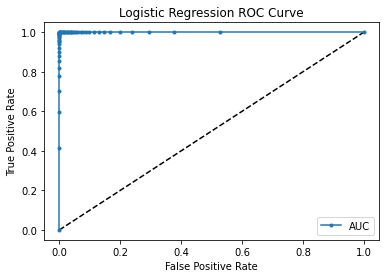

In [100]:
rf = RandomForestClassifier()
rf.fit(X_res, y_res)
y_predicted = rf.predict(X_res)
y_pred_probs = rf.predict_proba(X_res)

# keep probabilities for the positive outcome only
y_pred_probs = y_pred_probs[:, 1]

# Metrics Evaluation
Acc = rf.score(X_res, y_res)
Auc = roc_auc_score(y_res, y_pred_probs)
F1_score = metrics.f1_score(y_res, y_predicted)
Recall_score = recall_score(y_res, y_predicted)
Precision_score = precision_score(y_res, y_predicted)


print('*'*50)
print('AUC: %.3f' % Auc)
print('*'*50)
print('Accuracy: %.3f' % Acc)
print('*'*50)
print('F1 Score: %.3f' % F1_score)
print('*'*50)
print('Recall Score: %.3f' % Recall_score)
print('*'*50)
print('Precision Score: %.3f' % Precision_score)

#score['Logistic Regression'] = [test_auc, test_acc]

# Plot the roc curve for the model
fpr, tpr, thresholds = roc_curve(y_res, y_pred_probs)
plt.plot([0, 1], [0, 1], 'k--')
plt.plot(fpr, tpr, marker='.', label = 'AUC')
plt.legend()
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("Logistic Regression ROC Curve")
plt.show()

#### Hyper-parameter Tuning

In [103]:
param_grid = {'n_estimators':[75, 100, 250, 500, 750, 1000], 'criterion':('gini', 'entropy', 'log_loss'), 
          'max_depth':[3, 4, 5, 6, 7, 8, 9, 10, 15, 25, 30], 'min_samples_split':[2, 4, 6, 8, 10]}
rf = RandomForestClassifier()
clf = GridSearchCV(rf, param_grid, cv = 10, scoring = 'f1', return_train_score = True)
clf.fit(X_res, y_res)
print('Best parameters:  {}'.format(clf.best_params_))
print('Best score: {}'.format(clf.best_score_))

C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 593, in _fit_and_score
    error_msg = ("scoring must return a number, got %s (%s) "
  File "C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\ensemble\_forest.py", line 387, in fit
  File "C:\Users\oyeye\anaconda3\lib\site-packages\joblib\parallel.py", line 1041, in __call__
    if self.dispatch_one_batch(iterator):
  File "C:\Users\oyeye\anaconda3\lib\site-packages\joblib\parallel.py", line 859, in dispatch_one_batch
    self._dispatch(tasks)
  File "C:\Users\oyeye\anaconda3\lib\site-packages\joblib\parallel.py", line 777, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "C:\Users\oyeye\anaconda3\lib\site-packages

Best parameters:  {'criterion': 'gini', 'max_depth': 30, 'min_samples_split': 2, 'n_estimators': 75}
Best score: 0.9723709331230046


#### Support Vector Machine

**************************************************
AUC: 0.945
**************************************************
Accuracy: 0.892
**************************************************
F1 Score: 0.901
**************************************************
Recall Score: 0.981
**************************************************
Precision Score: 0.833


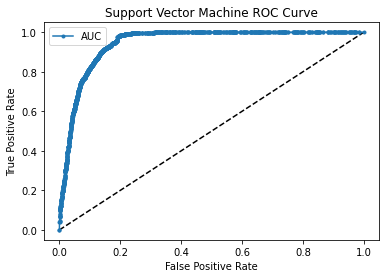

In [104]:
svm = SGDClassifier()
svm.fit(X_res, y_res)
y_predicted = svm.predict(X_res)
y_pred_probs = svm.decision_function(X_res)

# Metrics Evaluation
Acc = svm.score(X_res, y_res)
Auc = roc_auc_score(y_res, y_pred_probs)
F1_score = metrics.f1_score(y_res, y_predicted)
Recall_score = recall_score(y_res, y_predicted)
Precision_score = precision_score(y_res, y_predicted)


print('*'*50)
print('AUC: %.3f' % Auc)
print('*'*50)
print('Accuracy: %.3f' % Acc)
print('*'*50)
print('F1 Score: %.3f' % F1_score)
print('*'*50)
print('Recall Score: %.3f' % Recall_score)
print('*'*50)
print('Precision Score: %.3f' % Precision_score)


# Plot the roc curve for the model
fpr, tpr, thresholds = roc_curve(y_res, y_pred_probs)
plt.plot([0, 1], [0, 1], 'k--')
plt.plot(fpr, tpr, marker='.', label = 'AUC')
plt.legend()
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("Support Vector Machine ROC Curve")
plt.show()

#### Hyper-parameter Tuning

In [114]:
param_grid = {'alpha': [10**i for i in range(-4, 5)]}
svm = SGDClassifier()
clf = GridSearchCV(svm, param_grid, cv = 10, scoring='f1', return_train_score=True)
clf.fit(X_res, y_res)
print('Best parameters:  {}'.format(clf.best_params_))
print('Best score: {}'.format(clf.best_score_))

Best parameters:  {'alpha': 0.01}
Best score: 0.9188099958163845


#### XGBOOST Classifier Model

**************************************************
AUC: 1.000
**************************************************
Accuracy: 1.000
**************************************************
F1 Score: 1.000
**************************************************
Recall Score: 1.000
**************************************************
Precision Score: 0.999


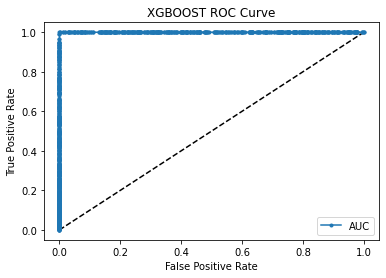

In [105]:
xgb = XGBClassifier()
xgb.fit(X_res, y_res)
y_predicted = xgb.predict(X_res)
y_pred_probs = xgb.predict_proba(X_res)

# keep probabilities for the positive outcome only
y_pred_probs = y_pred_probs[:, 1]

# Metrics Evaluation
Acc = xgb.score(X_res, y_res)
Auc = roc_auc_score(y_res, y_pred_probs)
F1_score = metrics.f1_score(y_res, y_predicted)
Recall_score = recall_score(y_res, y_predicted)
Precision_score = precision_score(y_res, y_predicted)


print('*'*50)
print('AUC: %.3f' % Auc)
print('*'*50)
print('Accuracy: %.3f' % Acc)
print('*'*50)
print('F1 Score: %.3f' % F1_score)
print('*'*50)
print('Recall Score: %.3f' % Recall_score)
print('*'*50)
print('Precision Score: %.3f' % Precision_score)


# Plot the roc curve for the model
fpr, tpr, thresholds = roc_curve(y_res, y_pred_probs)
plt.plot([0, 1], [0, 1], 'k--')
plt.plot(fpr, tpr, marker='.', label = 'AUC')
plt.legend()
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("XGBOOST ROC Curve")
plt.show()

# 

#### Hyper-parameter Tuning

In [118]:
param_grid = {'max_depth': [5, 6, 7, 8, 9, 10, 15, 20, 25, 30], 'n_estimators': [10, 20, 30, 40, 50, 60, 70, 80, 90, 100, 500]}
xgb = XGBClassifier() 
clf = GridSearchCV(xgb, param_grid, cv = 10, scoring = 'f1', return_train_score=True)
clf.fit(X_res, y_res)
print('Best parameters:  {}'.format(clf.best_params_))
print('Best score: {}'.format(clf.best_score_))

Best parameters:  {'max_depth': 30, 'n_estimators': 90}
Best score: 0.9762835046586588


#### Decision Tree Classifier

**************************************************
AUC: 1.000
**************************************************
Accuracy: 1.000
**************************************************
F1 Score: 1.000
**************************************************
Recall Score: 1.000
**************************************************
Precision Score: 1.000


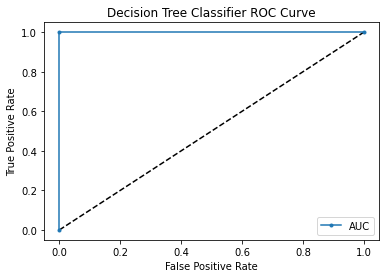

In [106]:
dtc = DecisionTreeClassifier()
dtc.fit(X_res, y_res)
y_predicted = dtc.predict(X_res)
y_pred_probs = dtc.predict_proba(X_res)

# keep probabilities for the positive outcome only
y_pred_probs = y_pred_probs[:, 1]

# Metrics Evaluation
Acc = dtc.score(X_res, y_res)
Auc = roc_auc_score(y_res, y_pred_probs)
F1_score = metrics.f1_score(y_res, y_predicted)
Recall_score = recall_score(y_res, y_predicted)
Precision_score = precision_score(y_res, y_predicted)


print('*'*50)
print('AUC: %.3f' % Auc)
print('*'*50)
print('Accuracy: %.3f' % Acc)
print('*'*50)
print('F1 Score: %.3f' % F1_score)
print('*'*50)
print('Recall Score: %.3f' % Recall_score)
print('*'*50)
print('Precision Score: %.3f' % Precision_score)


# Plot the roc curve for the model
fpr, tpr, thresholds = roc_curve(y_res, y_pred_probs)
plt.plot([0, 1], [0, 1], 'k--')
plt.plot(fpr, tpr, marker='.', label = 'AUC')
plt.legend()
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("Decision Tree Classifier ROC Curve")
plt.show()

#### Hyper-parameter Tuning

In [120]:
param_grid = {'min_impurity_decrease': [0.01, 0.02, 0.03, 0.05],
         'max_depth': [2, 5, 10],
         'min_samples_split': [0.1, 0.2, 0.05]}
dtc = DecisionTreeClassifier()
clf = GridSearchCV(dtc, param_grid, cv = 10, scoring='f1', return_train_score=True)
clf.fit(X_res, y_res)
print('Best parameters:  {}'.format(clf.best_params_))
print('Best score: {}'.format(clf.best_score_))

Best parameters:  {'max_depth': 10, 'min_impurity_decrease': 0.01, 'min_samples_split': 0.05}
Best score: 0.9001346031282687


#### Neural Network

**************************************************
AUC: 0.999
**************************************************
Accuracy: 0.989
**************************************************
F1 Score: 0.989
**************************************************
Recall Score: 0.994
**************************************************
Precision Score: 0.983


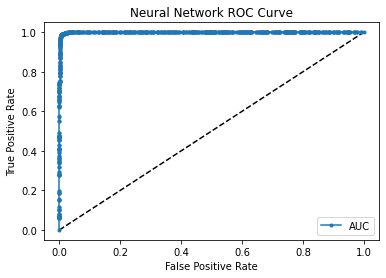

In [121]:
mlp = MLPClassifier()
mlp.fit(X_res, y_res)
y_predicted = mlp.predict(X_res)
y_pred_probs = mlp.predict_proba(X_res)

# keep probabilities for the positive outcome only
y_pred_probs = y_pred_probs[:, 1]

# Metrics Evaluation
Acc = mlp.score(X_res, y_res)
Auc = roc_auc_score(y_res, y_pred_probs)
F1_score = metrics.f1_score(y_res, y_predicted)
Recall_score = recall_score(y_res, y_predicted)
Precision_score = precision_score(y_res, y_predicted)


print('*'*50)
print('AUC: %.3f' % Auc)
print('*'*50)
print('Accuracy: %.3f' % Acc)
print('*'*50)
print('F1 Score: %.3f' % F1_score)
print('*'*50)
print('Recall Score: %.3f' % Recall_score)
print('*'*50)
print('Precision Score: %.3f' % Precision_score)


# Plot the roc curve for the model
fpr, tpr, thresholds = roc_curve(y_res, y_pred_probs)
plt.plot([0, 1], [0, 1], 'k--')
plt.plot(fpr, tpr, marker='.', label = 'AUC')
plt.legend()
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("Neural Network ROC Curve")
plt.show()

#### Hyper-parameter Tuning

In [128]:
param_grid = {'hidden_layer_sizes': [(1), (2), (3), (4), (5), (6) , (7), (8)], 
'max_iter':[0, 10, 20, 30, 40, 50, 60, 70, 80, 90, 100]}
mlp = MLPClassifier()
clf = GridSearchCV(mlp, param_grid, cv = 10, scoring='roc_auc', return_train_score=True)
clf.fit(X_res, y_res)
print('Best parameters:  {}'.format(clf.best_params_))
print('Best score: {}'.format(clf.best_score_))

C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 593, in _fit_and_score
    error_msg = ("scoring must return a number, got %s (%s) "
  File "C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py", line 673, in fit
    hidden_layer_sizes = list(hidden_layer_sizes)
  File "C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py", line 357, in _fit
    activations = [X] + [None] * (len(layer_units) - 1)
  File "C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py", line 413, in _validate_hyperparameters
    raise ValueError("n_iter_no_change must be > 0, got %s."
ValueError: max_ite

Best parameters:  {'hidden_layer_sizes': 6, 'max_iter': 100}
Best score: 0.9904335111611386


C:\Users\oyeye\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:614: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  Parameters


#### Naive Bayes

**************************************************
AUC: 0.983
**************************************************
Accuracy: 0.940
**************************************************
F1 Score: 0.942
**************************************************
Recall Score: 0.975
**************************************************
Precision Score: 0.911


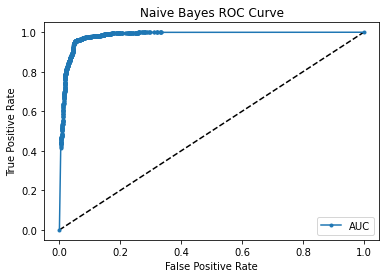

In [129]:
gnb = GaussianNB()
gnb.fit(X_res, y_res)
y_predicted = gnb.predict(X_res)
y_pred_probs = gnb.predict_proba(X_res)

# keep probabilities for the positive outcome only
y_pred_probs = y_pred_probs[:, 1]

# Metrics Evaluation
Acc = gnb.score(X_res, y_res)
Auc = roc_auc_score(y_res, y_pred_probs)
F1_score = metrics.f1_score(y_res, y_predicted)
Recall_score = recall_score(y_res, y_predicted)
Precision_score = precision_score(y_res, y_predicted)


print('*'*50)
print('AUC: %.3f' % Auc)
print('*'*50)
print('Accuracy: %.3f' % Acc)
print('*'*50)
print('F1 Score: %.3f' % F1_score)
print('*'*50)
print('Recall Score: %.3f' % Recall_score)
print('*'*50)
print('Precision Score: %.3f' % Precision_score)


# Plot the roc curve for the model
fpr, tpr, thresholds = roc_curve(y_res, y_pred_probs)
plt.plot([0, 1], [0, 1], 'k--')
plt.plot(fpr, tpr, marker='.', label = 'AUC')
plt.legend()
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("Naive Bayes ROC Curve")
plt.show()

#### Hyper-parameter Tuning 

In [132]:
param_grid = {'var_smoothing': np.logspace(0,-9, num=100)}
gnb = GaussianNB()
clf = GridSearchCV(gnb, param_grid, verbose = 1, cv = 10, scoring = 'f1', return_train_score=True)
clf.fit(X_res, y_res)
print('Best parameters:  {}'.format(clf.best_params_))
print('Best score: {}'.format(clf.best_score_))

Fitting 10 folds for each of 100 candidates, totalling 1000 fits
Best parameters:  {'var_smoothing': 5.336699231206302e-08}
Best score: 0.9420311524154841
